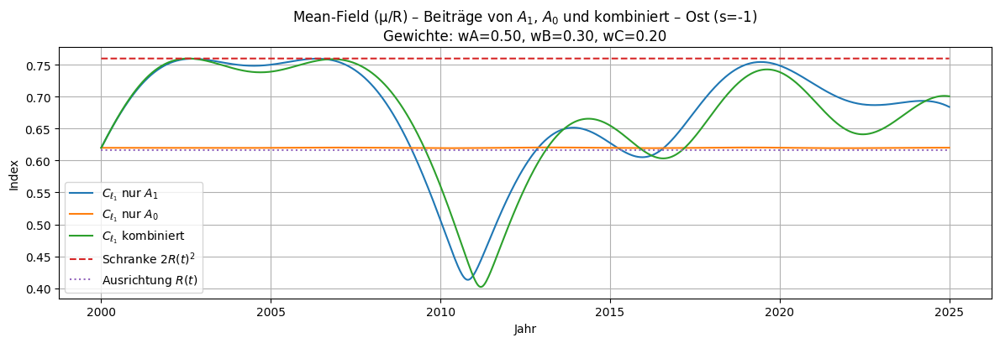

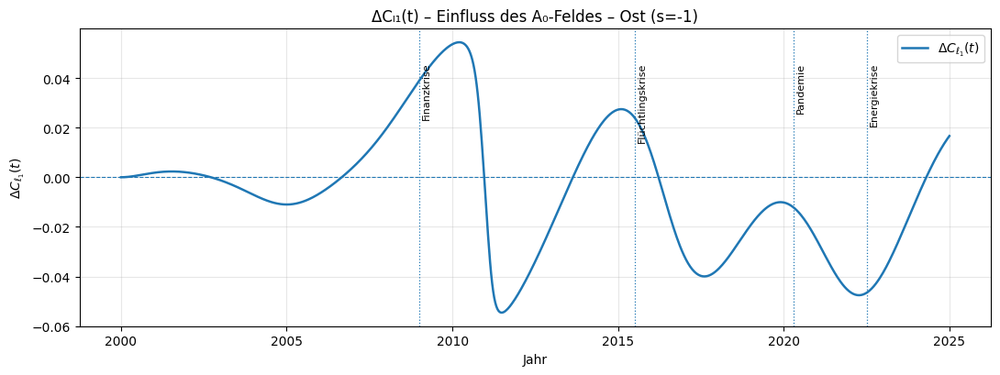


=== Ereignis-Korrelation ΔC_l1(t) – Ost (s=-1) ===
2009.0  Finanzkrise         ->  ΔC_l1 = +0.0392  -> verstärkte Kohärenz
2015.5  Flüchtlingskrise    ->  ΔC_l1 = +0.0242  -> verstärkte Kohärenz
2020.3  Pandemie            ->  ΔC_l1 = -0.0123  -> geschwächte Kohärenz
2022.5  Energiekrise        ->  ΔC_l1 = -0.0466  -> geschwächte Kohärenz



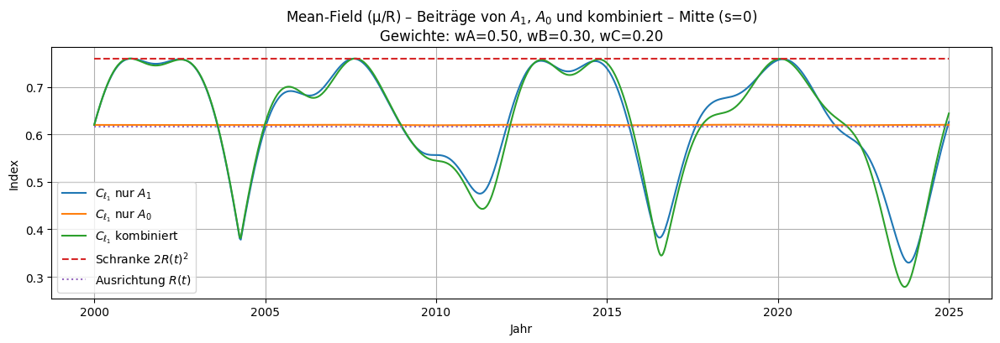

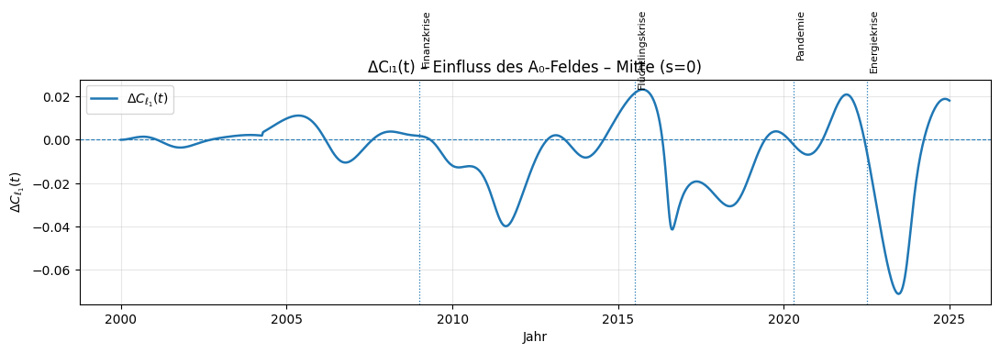


=== Ereignis-Korrelation ΔC_l1(t) – Mitte (s=0) ===
2009.0  Finanzkrise         ->  ΔC_l1 = +0.0018  -> verstärkte Kohärenz
2015.5  Flüchtlingskrise    ->  ΔC_l1 = +0.0213  -> verstärkte Kohärenz
2020.3  Pandemie            ->  ΔC_l1 = -0.0024  -> geschwächte Kohärenz
2022.5  Energiekrise        ->  ΔC_l1 = -0.0046  -> geschwächte Kohärenz



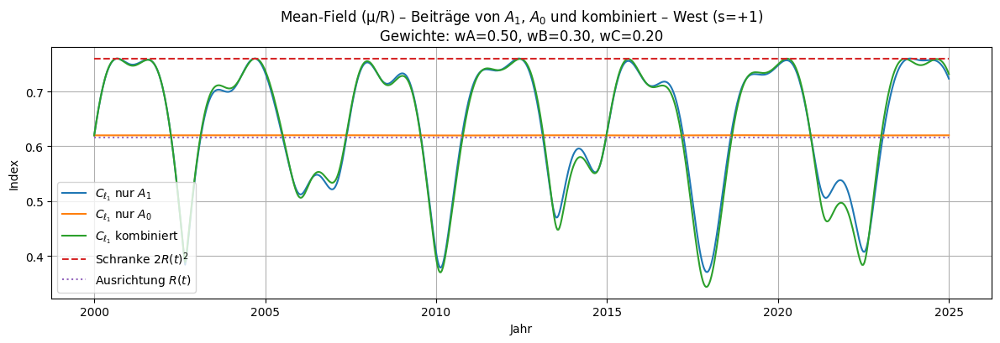

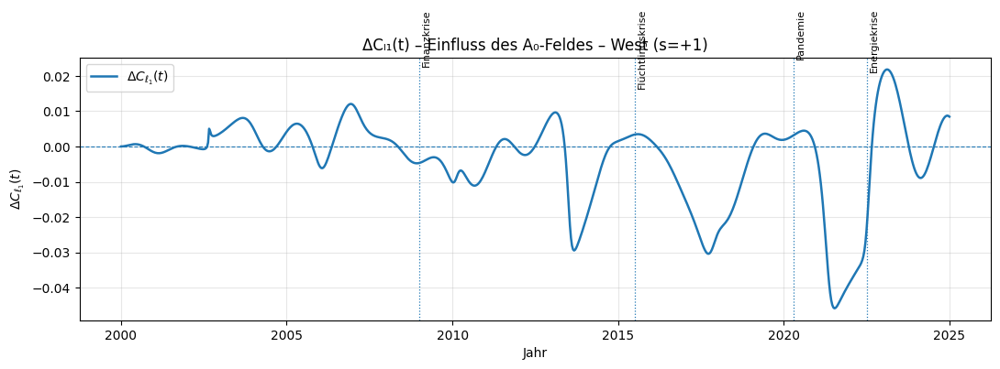


=== Ereignis-Korrelation ΔC_l1(t) – West (s=+1) ===
2009.0  Finanzkrise         ->  ΔC_l1 = -0.0047  -> geschwächte Kohärenz
2015.5  Flüchtlingskrise    ->  ΔC_l1 = +0.0033  -> verstärkte Kohärenz
2020.3  Pandemie            ->  ΔC_l1 = +0.0032  -> verstärkte Kohärenz
2022.5  Energiekrise        ->  ΔC_l1 = -0.0240  -> geschwächte Kohärenz



In [76]:
# -*- coding: utf-8 -*-
# ==== QSD: Mean-Field (μ/R) mit A0+A1, nichtlinearem u(s), v(s) ====
# - Regionen: Ost/Mitte/West via s ∈ {-1,0,+1}
# - Gewichte (wA,wB,wC) interpoliert über s
# - ΔC_l1(t) = C_l1^(A0+A1) - C_l1^(A1) + Ereignis-Korrelation
# - Nur matplotlib, keine festen Farben.

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# ----------------------- A1: f_a(t) ---------------------------------------------------
years = np.array([2000, 2008, 2017, 2023, 2025], dtype=float)
f1_vals = np.array([0.6, 0.5, 0.4, 0.3, 0.25], dtype=float)
f2_vals = np.array([0.2, 0.23, 0.26, 0.28, 0.30], dtype=float)
f3_vals = np.array([0.1, 0.18, 0.25, 0.35, 0.40], dtype=float)
f4_vals = np.array([0.2, 0.22, 0.24, 0.30, 0.25], dtype=float)
f5_vals = np.array([0.2, 0.22, 0.25, 0.23, 0.22], dtype=float)
f6_vals = np.array([0.1, 0.12, 0.15, 0.18, 0.20], dtype=float)
f7_vals = np.array([0.3, 0.33, 0.36, 0.38, 0.40], dtype=float)
f8_vals = np.array([0.2, 0.18, 0.17, 0.16, 0.15], dtype=float)

fns = [None] + [interp1d(years, arr, kind='linear', fill_value='extrapolate')
                for arr in [f1_vals,f2_vals,f3_vals,f4_vals,f5_vals,f6_vals,f7_vals,f8_vals]]

def f_components(t: float) -> np.ndarray:
    return np.array([float(fns[i](t)) for i in range(1,9)], dtype=float)

# ----------------------- SU(3) Generatoren -------------------------------------------
L1 = np.array([[0,1,0],[1,0,0],[0,0,0]], complex)
L2 = np.array([[0,-1j,0],[1j,0,0],[0,0,0]], complex)
L3 = np.array([[1,0,0],[0,-1,0],[0,0,0]], complex)
L4 = np.array([[0,0,1],[0,0,0],[1,0,0]], complex)
L5 = np.array([[0,0,-1j],[0,0,0],[1j,0,0]], complex)
L6 = np.array([[0,0,0],[0,0,1],[0,1,0]], complex)
L7 = np.array([[0,0,0],[0,0,-1j],[0,1j,0]], complex)
L8 = (1/np.sqrt(3)) * np.diag([1,1,-2])
generators = [L1,L2,L3,L4,L5,L6,L7,L8]

# ----------------------- A0-Builder (Trend+Zyklen+Pulse, Orthogonalisierung) ---------
def _trend_linear(t, a=0.0, b=0.0, t_ref=2012.5): return a + b*(t - t_ref)
def _trend_sigmoid(t, amp=0.0, t0=2012.5, k=0.6): return amp * (2/(1+np.exp(-k*(t - t0))) - 1)
def _cycle(t, amp=0.0, period=8.0, phase=0.0): return amp * np.sin(2*np.pi*(t/period) + phase)
def _pulse_gauss(t, amp=0.0, t0=2020.0, sigma=1.0): return amp * np.exp(-0.5*((t - t0)/sigma)**2)

def _compose_a0(t, parts):
    y = np.zeros_like(t, dtype=float)
    if parts.get('linear'):  y += _trend_linear(t, **parts['linear'])
    if parts.get('sigmoid'): y += _trend_sigmoid(t, **parts['sigmoid'])
    for cyc in parts.get('cycles', []): y += _cycle(t, **cyc)
    for pls in parts.get('pulses', []): y += _pulse_gauss(t, **pls)
    return y

def _orthogonalize_against(f_fn, a0_array, t_grid):
    f_vec = np.array([float(f_fn(t)) for t in t_grid])
    a_vec = a0_array.copy()
    denom = float(np.dot(f_vec, f_vec))
    if denom < 1e-12: return a_vec
    proj = float(np.dot(a_vec, f_vec)) / denom
    return a_vec - proj * f_vec

A0_CONFIG = {
    8: dict(parts=dict(
            linear={'a':0.0, 'b':-0.004},
            sigmoid={'amp':0.05, 't0':2010.0, 'k':0.35},
            cycles=[{'amp':0.03, 'period':8.0, 'phase':0.3}],
            pulses=[{'amp':+0.05, 't0':2020.5, 'sigma':0.9},
                    {'amp':-0.03, 't0':2022.3, 'sigma':0.7}]),
       scale=1.0, orthogonalize_against_f=1, f_index=1),
    3: dict(parts=dict(
            linear={'a':0.0, 'b':+0.003},
            cycles=[{'amp':0.025, 'period':4.0, 'phase':-0.6}],
            pulses=[{'amp':+0.03, 't0':2016.0, 'sigma':1.0}]),
       scale=1.0, orthogonalize_against_f=1, f_index=3),
    1: dict(parts=dict(cycles=[{'amp':0.010, 'period':6.0, 'phase':0.0}]),
       scale=1.0, orthogonalize_against_f=0),
    6: dict(parts=dict(cycles=[{'amp':0.008, 'period':5.0, 'phase':1.2}]),
       scale=1.0, orthogonalize_against_f=0),
}

def make_a0_model(config=A0_CONFIG, t_min=2000.0, t_max=2025.0, n_fit=600):
    t_grid = np.linspace(t_min, t_max, n_fit)
    a0_time_series = {a: np.zeros_like(t_grid, dtype=float) for a in range(1,9)}
    for a, spec in config.items():
        parts = spec.get('parts', {})
        series = _compose_a0(t_grid, parts) * float(spec.get('scale', 1.0))
        if spec.get('orthogonalize_against_f', 0):
            f_fn = fns[int(spec.get('f_index', a))]
            series = _orthogonalize_against(f_fn, series, t_grid)
        a0_time_series[a] = series
    a0_funcs = []
    for a in range(1,9):
        fn = interp1d(t_grid, a0_time_series[a], kind='linear', fill_value='extrapolate')
        a0_funcs.append(fn)
    return a0_funcs

a0_1, a0_2, a0_3, a0_4, a0_5, a0_6, a0_7, a0_8 = make_a0_model()

def a0_components(t: float) -> np.ndarray:
    return np.array([float(fn(t)) for fn in [a0_1,a0_2,a0_3,a0_4,a0_5,a0_6,a0_7,a0_8]], dtype=float)

# ----------------------- Profile u(s), v(s)  (nichtlinear v) -------------------------
alpha_u = 0.60            # Strukturgradient
alpha_v = 0.50            # lineare Komponente v
base_v  = 1.50            # Ost-Peak Basis
k_v     = 0.40            # Krümmung
eta_v   = 0.50            # Blend: 0 (linear) .. 1 (Ost-Peak)

def u_of_s(s: float) -> float:
    return 1.0 + alpha_u * s

def v_linear(s: float) -> float:
    return 1.0 + alpha_v * s

def v_local_east(s: float) -> float:
    return base_v - k_v*(s+1.0)**2

def v_of_s(s: float, eta: float = eta_v) -> float:
    return (1-eta)*v_linear(s) + eta*v_local_east(s)

# ----------------------- A1, A0, Hamiltonian -----------------------------------------
def A1_of_t_s(t: float, s: float) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex); fa=f_components(t); us=u_of_s(s)
    for a in range(8): A += us * fa[a] * generators[a]
    return A

def A0_of_t_s(t: float, s: float) -> np.ndarray:
    A = np.zeros((3,3), dtype=complex); ca=a0_components(t); vs=v_of_s(s)
    for a in range(8): A += vs * ca[a] * generators[a]
    return A

def H_of_t_s(t: float, s: float, g0: float, g1: float) -> np.ndarray:
    return g0 * A0_of_t_s(t, s) + g1 * A1_of_t_s(t, s)

# ----------------------- Schrödinger-Dynamik -----------------------------------------
def schrodinger_rhs(t, psi_flat, s: float, g0: float, g1: float):
    psi = psi_flat[:3] + 1j*psi_flat[3:]
    H = H_of_t_s(t, s, g0, g1)
    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])

def evolve_state(psi0: np.ndarray, s: float, g0: float, g1: float,
                 t0: float = 2000.0, t1: float = 2025.0, n_eval: int = 800):
    y0 = np.concatenate([psi0.real, psi0.imag])
    t_eval = np.linspace(t0, t1, n_eval)
    sol = solve_ivp(
        schrodinger_rhs, [t0, t1], y0,
        t_eval=t_eval, rtol=1e-8, atol=1e-10, method='DOP853',
        args=(s, g0, g1)
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = psi_t / norms
    return t_eval, psi_t.T

def normalize_path(P):
    n = np.maximum(1e-14, np.linalg.norm(P, axis=1, keepdims=True))
    return P / n

# ----------------------- Gewichte: Ost/West-Interpolation ----------------------------
# West: (0.5, 0.3, 0.2)   Ost: (0.7, 0.2, 0.1)  -> Mitte: linearer Blend
W_WEST = np.array([0.5, 0.3, 0.2], dtype=float)
W_EAST = np.array([0.5, 0.3, 0.2], dtype=float)

def weights_of_s(s: float):
    w = ((1-s)/2.0)*W_EAST + ((1+s)/2.0)*W_WEST
    w = np.clip(w, 0.0, 1.0)
    w = w / (np.sum(w) + 1e-15)
    return float(w[0]), float(w[1]), float(w[2])

# ----------------------- Mean-Field EXAKT (μ/R) --------------------------------------
def mean_field_C_l1_weighted(t_eval, pathA, pathB, pathC, wA, wB, wC):
    T = len(t_eval)
    C_mf = np.empty(T); R_ser = np.empty(T)
    for k in range(T):
        a, b, c = pathA[k], pathB[k], pathC[k]
        mu = wA*a + wB*b + wC*c
        R  = np.linalg.norm(mu)
        mu_hat = mu / (R + 1e-15)
        C_mf[k] = R**2 * ( (np.sum(np.abs(mu_hat)))**2 - 1.0 )
        R_ser[k] = R
    C_bound = 2.0 * (R_ser**2)
    return C_mf, C_bound, R_ser

# ----------------------- Szenarien ----------------------------------------------------
SCENARIOS = [
    ("nur A1", dict(g0=0.0, g1=1.0)),
    ("nur A0", dict(g0=0.5, g1=0.0)),
    ("kombiniert", dict(g0=0.5, g1=1.0)),
]

# ----------------------- Ereignisse (für ΔC-Overlay) --------------------------------
EVENTS = {
    2009: "Finanzkrise",
    2015.5: "Flüchtlingskrise",
    2020.3: "Pandemie",
    2022.5: "Energiekrise"
}

def plot_region_meanfield(s_val: float, region_name: str):
    wA, wB, wC = weights_of_s(s_val)
    psiA0 = np.array([1,0,0], complex)  # Blau
    psiB0 = np.array([0,1,0], complex)  # Orange
    psiC0 = np.array([0,0,1], complex)  # Grün

    C_series = {}
    for name, pars in SCENARIOS:
        t_eval, pathA = evolve_state(psiA0, s_val, pars["g0"], pars["g1"])
        _,      pathB = evolve_state(psiB0, s_val, pars["g0"], pars["g1"])
        _,      pathC = evolve_state(psiC0, s_val, pars["g0"], pars["g1"])
        pathA = normalize_path(pathA); pathB = normalize_path(pathB); pathC = normalize_path(pathC)

        C_mf, C_bound, R_ser = mean_field_C_l1_weighted(t_eval, pathA, pathB, pathC, wA, wB, wC)
        C_series[name] = (C_mf, C_bound, R_ser)

    # Plot C_l1 nur A1 / nur A0 / kombiniert + 2R^2 + R(t)
    plt.figure(figsize=(12, 4.2))
    plt.plot(t_eval, C_series["nur A1"][0], label=r"$C_{\ell_1}$ nur $A_1$")
    plt.plot(t_eval, C_series["nur A0"][0], label=r"$C_{\ell_1}$ nur $A_0$")
    plt.plot(t_eval, C_series["kombiniert"][0], label=r"$C_{\ell_1}$ kombiniert")
    plt.plot(t_eval, C_series["kombiniert"][1], linestyle="--", label=r"Schranke $2R(t)^2$")
    plt.plot(t_eval, C_series["kombiniert"][2], linestyle=":",  label=r"Ausrichtung $R(t)$")
    plt.xlabel("Jahr"); plt.ylabel("Index")
    plt.title(f"Mean-Field (μ/R) – Beiträge von $A_1$, $A_0$ und kombiniert – {region_name}\n"
              f"Gewichte: wA={wA:.2f}, wB={wB:.2f}, wC={wC:.2f}")
    plt.grid(True); plt.legend(); plt.tight_layout(); plt.show()

    return t_eval, C_series

def plot_delta_and_correl(t_eval, C_series, region_name: str):
    C_A1 = C_series["nur A1"][0]
    C_comb = C_series["kombiniert"][0]
    delta_C = C_comb - C_A1

    plt.figure(figsize=(11, 4.2))
    plt.plot(t_eval, delta_C, linewidth=1.8, label=r"$\Delta C_{\ell_1}(t)$")
    plt.axhline(0, linestyle='--', linewidth=0.8)

    # Ereignisse markieren
    ymax = np.max(np.abs(delta_C)) if np.max(np.abs(delta_C))>0 else 1.0
    for year, label in EVENTS.items():
        plt.axvline(year, linestyle=':', linewidth=0.9)
        plt.text(year+0.08, 0.85*ymax, label, rotation=90, fontsize=8, va='top')

    plt.title(f"ΔCₗ₁(t) – Einfluss des A₀-Feldes – {region_name}")
    plt.xlabel("Jahr"); plt.ylabel(r"$\Delta C_{\ell_1}(t)$")
    plt.legend(); plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()

    # Konsole: Werte an Ereignisjahren
    print("\n=== Ereignis-Korrelation ΔC_l1(t) –", region_name, "===")
    for year, label in EVENTS.items():
        idx = np.argmin(np.abs(t_eval - year))
        val = float(delta_C[idx])
        trend = "verstärkte Kohärenz" if val > 0 else "geschwächte Kohärenz"
        print(f"{year:6.1f}  {label:18s}  ->  ΔC_l1 = {val:+.4f}  -> {trend}")
    print("=====================================================\n")

# ----------------------- HAUPT: drei Regionen durchlaufen ----------------------------
for s_val, region in [(-1.0,"Ost (s=-1)"), (0.0,"Mitte (s=0)"), (1.0,"West (s=+1)")]:
    t_eval, C_series = plot_region_meanfield(s_val, region)
    plot_delta_and_correl(t_eval, C_series, region)


**AB HIER BLOG QSD IV**

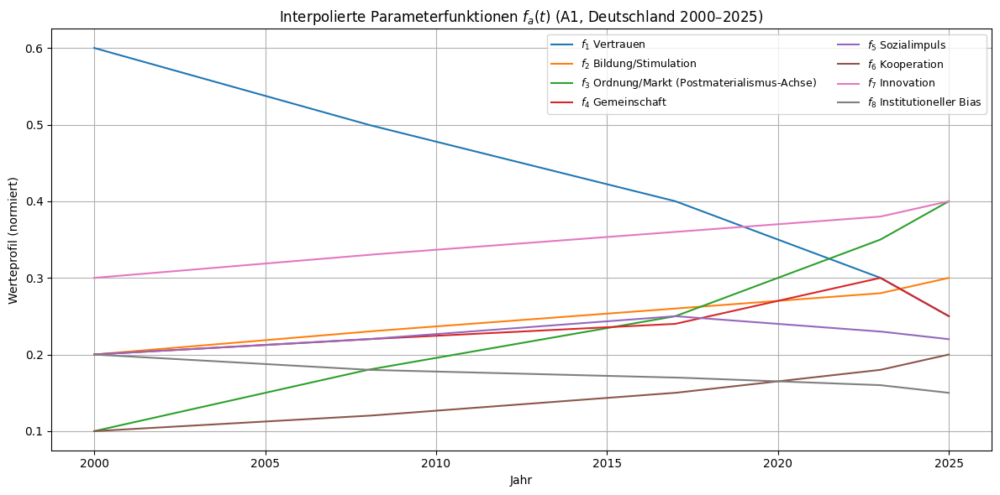

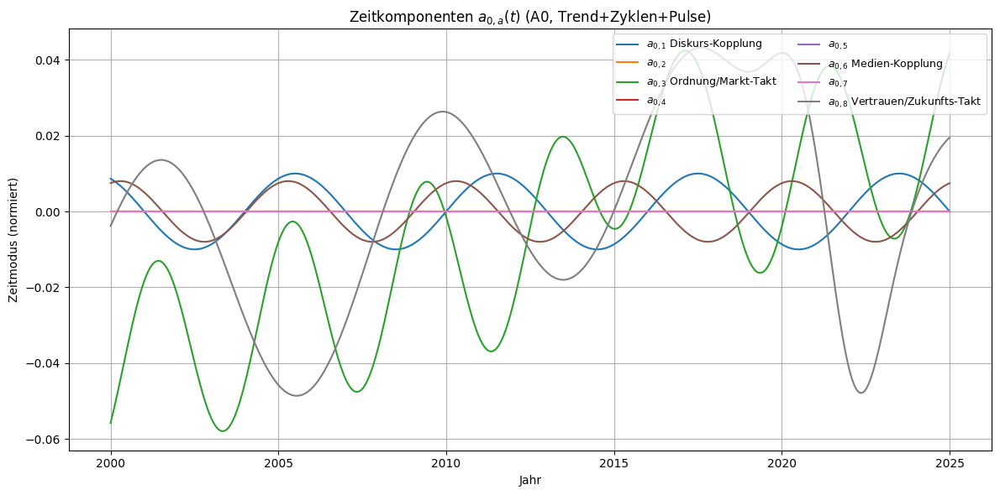

In [77]:
# ==== ADD-ON 1: Zeitverläufe f_a(t) und a0_a(t) ===============================
# Voraussetzungen aus Hauptprogramm:
# - f_components(t: float) -> np.ndarray  (8 Werte)
# - a0_components(t: float) -> np.ndarray (8 Werte)

import numpy as np
import matplotlib.pyplot as plt

def plot_f_parameters(t_min=2000.0, t_max=2025.0, n=500):
    t = np.linspace(t_min, t_max, n)
    F = np.vstack([f_components(tt) for tt in t])  # (n,8)
    labels_f = [
        r"$f_1$ Vertrauen",
        r"$f_2$ Bildung/Stimulation",
        r"$f_3$ Ordnung/Markt (Postmaterialismus-Achse)",
        r"$f_4$ Gemeinschaft",
        r"$f_5$ Sozialimpuls",
        r"$f_6$ Kooperation",
        r"$f_7$ Innovation",
        r"$f_8$ Institutioneller Bias",
    ]
    plt.figure(figsize=(12,6))
    for i in range(8):
        plt.plot(t, F[:, i], label=labels_f[i])
    plt.title(r"Interpolierte Parameterfunktionen $f_a(t)$ (A1, Deutschland 2000–2025)")
    plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
    plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9)
    plt.tight_layout(); plt.show()

def plot_a0_components(t_min=2000.0, t_max=2025.0, n=500):
    t = np.linspace(t_min, t_max, n)
    A0 = np.vstack([a0_components(tt) for tt in t])  # (n,8)
    labels_a0 = [
        r"$a_{0,1}$ Diskurs-Kopplung",
        r"$a_{0,2}$",
        r"$a_{0,3}$ Ordnung/Markt-Takt",
        r"$a_{0,4}$",
        r"$a_{0,5}$",
        r"$a_{0,6}$ Medien-Kopplung",
        r"$a_{0,7}$",
        r"$a_{0,8}$ Vertrauen/Zukunfts-Takt",
    ]
    plt.figure(figsize=(12,6))
    for i in range(8):
        plt.plot(t, A0[:, i], label=labels_a0[i])
    plt.title(r"Zeitkomponenten $a_{0,a}(t)$ (A0, Trend+Zyklen+Pulse)")
    plt.xlabel("Jahr"); plt.ylabel("Zeitmodus (normiert)")
    plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9)
    plt.tight_layout(); plt.show()

# --- Beispielaufrufe:
plot_f_parameters()
plot_a0_components()


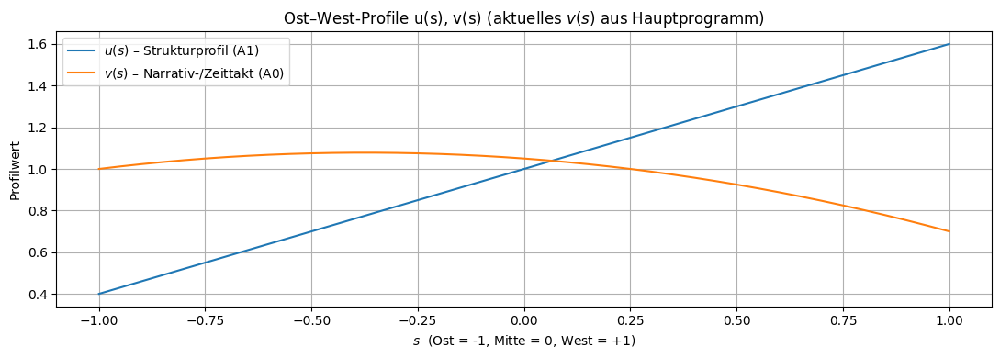

In [78]:
# ==== ADD-ON 2: Ortsprofile u(s) und v(s) =====================================
# Voraussetzungen aus Hauptprogramm:
# - u_of_s(s: float) -> float
# - v_of_s(s: float, eta: float = eta_v) -> float
# - globale Variable eta_v (oder eigenen Wert übergeben)

import numpy as np
import matplotlib.pyplot as plt

def plot_profiles_uv(s_min=-1.0, s_max=+1.0, n=401, eta=None):
    s = np.linspace(s_min, s_max, n)
    # Falls eta nicht gesetzt, v_of_s so verwenden, wie im Hauptprogramm definiert ist
    if eta is None:
        u_vals = np.array([u_of_s(si) for si in s])
        v_vals = np.array([v_of_s(si) for si in s])
        subtitle = r"(aktuelles $v(s)$ aus Hauptprogramm)"
    else:
        u_vals = np.array([u_of_s(si) for si in s])
        v_vals = np.array([v_of_s(si, eta=eta) for si in s])
        subtitle = rf"(mit Vorgabe $\eta={eta:.2f}$)"

    plt.figure(figsize=(11,4))
    plt.plot(s, u_vals, label=r"$u(s)$ – Strukturprofil (A1)")
    plt.plot(s, v_vals, label=r"$v(s)$ – Narrativ-/Zeittakt (A0)")
    plt.xlabel(r"$s$  (Ost = -1, Mitte = 0, West = +1)")
    plt.ylabel("Profilwert")
    plt.title("Ost–West-Profile u(s), v(s) " + subtitle)
    plt.grid(True); plt.legend()
    plt.tight_layout(); plt.show()

# --- Beispielaufrufe:
plot_profiles_uv()
#plot_profiles_uv(eta=0.20)  # z.B. stärkerer Ost-Peak in v(s)


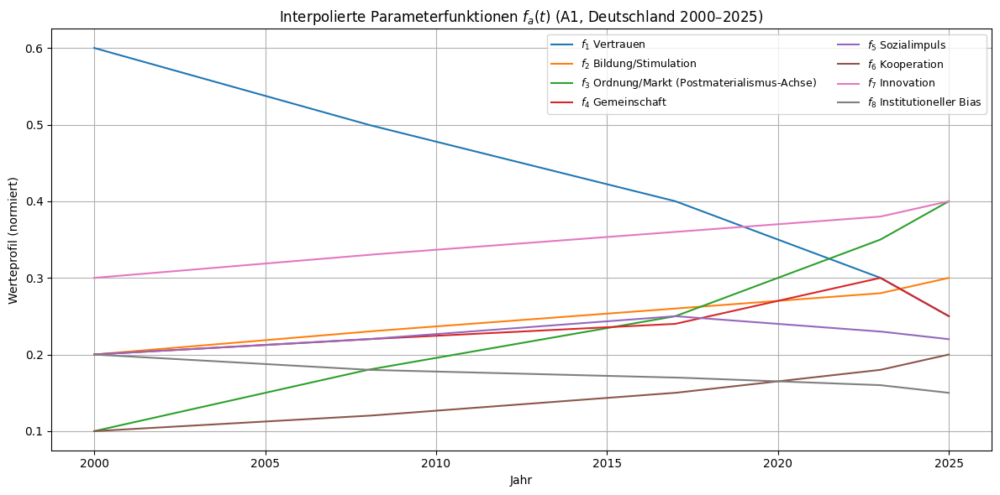

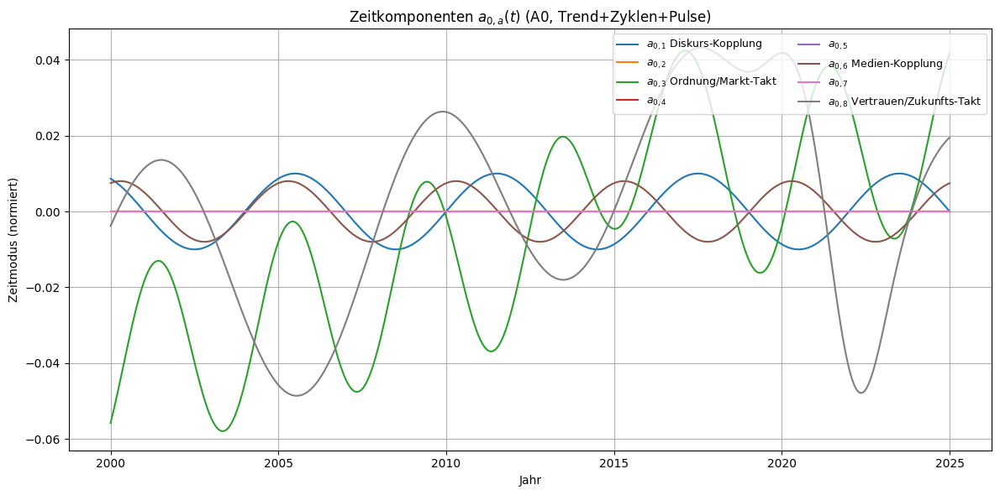

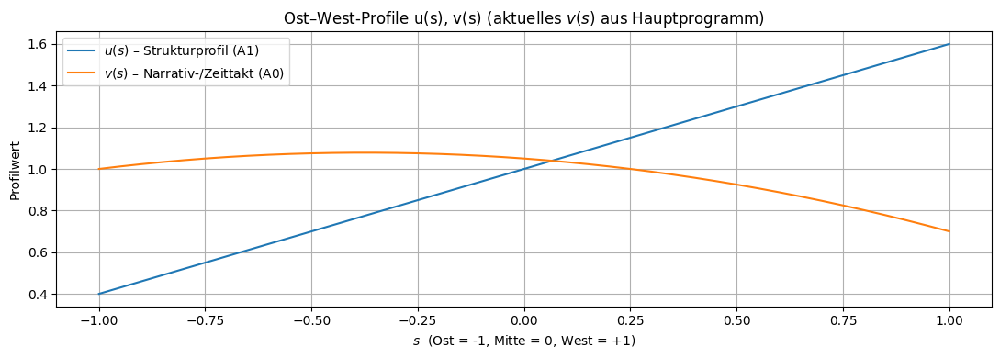

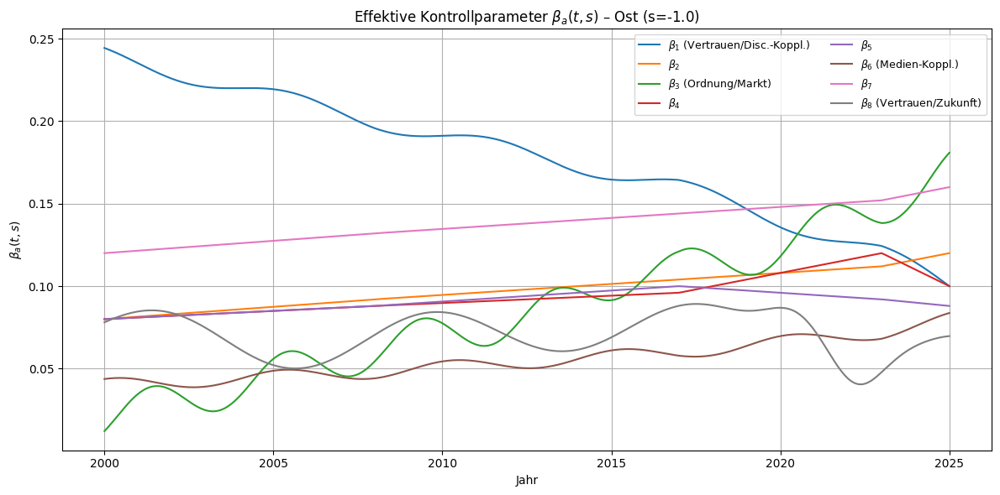

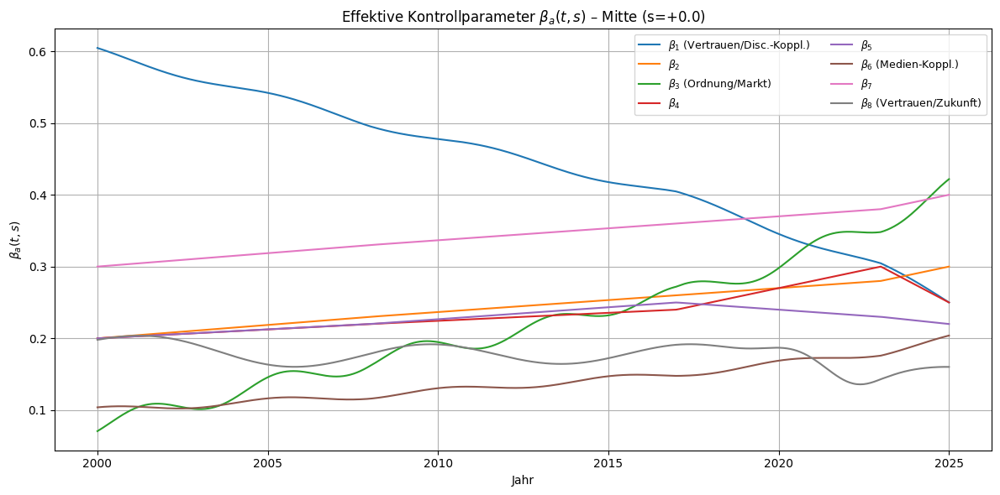

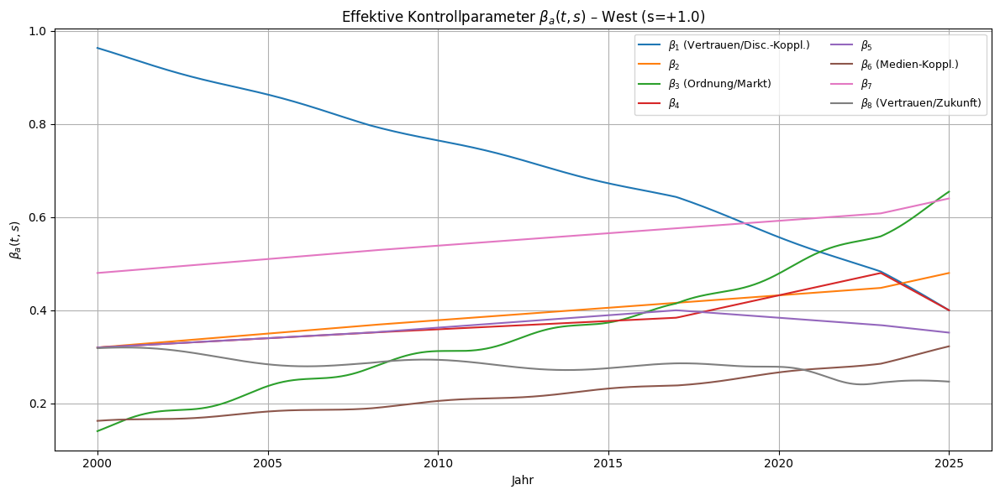

In [79]:
# ==== ADD-ON 1, 2 plus effektiver Kontrollparameter ===============================
# Voraussetzungen aus Hauptprogramm:
# - f_components(t: float) -> np.ndarray  (8 Werte)
# - a0_components(t: float) -> np.ndarray (8 Werte)

import numpy as np
import matplotlib.pyplot as plt

def plot_f_parameters(t_min=2000.0, t_max=2025.0, n=500):
    t = np.linspace(t_min, t_max, n)
    F = np.vstack([f_components(tt) for tt in t])  # (n,8)
    labels_f = [
        r"$f_1$ Vertrauen",
        r"$f_2$ Bildung/Stimulation",
        r"$f_3$ Ordnung/Markt (Postmaterialismus-Achse)",
        r"$f_4$ Gemeinschaft",
        r"$f_5$ Sozialimpuls",
        r"$f_6$ Kooperation",
        r"$f_7$ Innovation",
        r"$f_8$ Institutioneller Bias",
    ]
    plt.figure(figsize=(12,6))
    for i in range(8):
        plt.plot(t, F[:, i], label=labels_f[i])
    plt.title(r"Interpolierte Parameterfunktionen $f_a(t)$ (A1, Deutschland 2000–2025)")
    plt.xlabel("Jahr"); plt.ylabel("Werteprofil (normiert)")
    plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9)
    plt.tight_layout(); plt.show()

def plot_a0_components(t_min=2000.0, t_max=2025.0, n=500):
    t = np.linspace(t_min, t_max, n)
    A0 = np.vstack([a0_components(tt) for tt in t])  # (n,8)
    labels_a0 = [
        r"$a_{0,1}$ Diskurs-Kopplung",
        r"$a_{0,2}$",
        r"$a_{0,3}$ Ordnung/Markt-Takt",
        r"$a_{0,4}$",
        r"$a_{0,5}$",
        r"$a_{0,6}$ Medien-Kopplung",
        r"$a_{0,7}$",
        r"$a_{0,8}$ Vertrauen/Zukunfts-Takt",
    ]
    plt.figure(figsize=(12,6))
    for i in range(8):
        plt.plot(t, A0[:, i], label=labels_a0[i])
    plt.title(r"Zeitkomponenten $a_{0,a}(t)$ (A0, Trend+Zyklen+Pulse)")
    plt.xlabel("Jahr"); plt.ylabel("Zeitmodus (normiert)")
    plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9)
    plt.tight_layout(); plt.show()

# --- Beispielaufrufe:
plot_f_parameters()
plot_a0_components()

# ==== ADD-ON 2: Ortsprofile u(s) und v(s) =====================================
# Voraussetzungen aus Hauptprogramm:
# - u_of_s(s: float) -> float
# - v_of_s(s: float, eta: float = eta_v) -> float
# - globale Variable eta_v (oder eigenen Wert übergeben)

import numpy as np
import matplotlib.pyplot as plt

def plot_profiles_uv(s_min=-1.0, s_max=+1.0, n=401, eta=None):
    s = np.linspace(s_min, s_max, n)
    # Falls eta nicht gesetzt, v_of_s so verwenden, wie im Hauptprogramm definiert ist
    if eta is None:
        u_vals = np.array([u_of_s(si) for si in s])
        v_vals = np.array([v_of_s(si) for si in s])
        subtitle = r"(aktuelles $v(s)$ aus Hauptprogramm)"
    else:
        u_vals = np.array([u_of_s(si) for si in s])
        v_vals = np.array([v_of_s(si, eta=eta) for si in s])
        subtitle = rf"(mit Vorgabe $\eta={eta:.2f}$)"

    plt.figure(figsize=(11,4))
    plt.plot(s, u_vals, label=r"$u(s)$ – Strukturprofil (A1)")
    plt.plot(s, v_vals, label=r"$v(s)$ – Narrativ-/Zeittakt (A0)")
    plt.xlabel(r"$s$  (Ost = -1, Mitte = 0, West = +1)")
    plt.ylabel("Profilwert")
    plt.title("Ost–West-Profile u(s), v(s) " + subtitle)
    plt.grid(True); plt.legend()
    plt.tight_layout(); plt.show()

# --- Beispielaufrufe:
plot_profiles_uv()
#plot_profiles_uv(eta=0.20)  # z.B. stärkerer Ost-Peak in v(s)



# ==== NEU: Effektiver Kontrollparameter β_a(t,s) und Plots ====================
# β_a(t,s) = g1 * u(s) * f_a(t) + g0 * v(s) * a0_a(t)
# - Falls g0/g1 im Hauptprogramm nicht existieren, verwende Defaults:
try:
    g0  # noqa: F823
except NameError:
    g0 = 0.5
try:
    g1  # noqa: F823
except NameError:
    g1 = 1.0

def beta_components(t: float, s: float) -> np.ndarray:
    """Gibt β_a(t,s) für a=1..8 als Array zurück."""
    fa = f_components(t)        # (8,)
    a0a = a0_components(t)      # (8,)
    us = float(u_of_s(s))
    try:
        vs = float(v_of_s(s))   # nutzt eta_v aus dem Hauptprogramm
    except TypeError:
        # Falls v_of_s eine explizite eta-Arg erwartet, aber kein Default hat:
        vs = float(v_of_s(s, eta=eta_v))
    return g1 * us * fa + g0 * vs * a0a

def plot_beta_over_time_for_regions(t_min=2000.0, t_max=2025.0, n=500,
                                    regions=(("Ost", -1.0), ("Mitte", 0.0), ("West", +1.0))):
    t = np.linspace(t_min, t_max, n)
    labels_beta = [
        r"$\beta_1$ (Vertrauen/Disc.-Koppl.)",
        r"$\beta_2$",
        r"$\beta_3$ (Ordnung/Markt)",
        r"$\beta_4$",
        r"$\beta_5$",
        r"$\beta_6$ (Medien-Koppl.)",
        r"$\beta_7$",
        r"$\beta_8$ (Vertrauen/Zukunft)",
    ]
    for region_name, s_val in regions:
        B = np.vstack([beta_components(tt, s_val) for tt in t])  # (n,8)
        plt.figure(figsize=(12,6))
        for i in range(8):
            plt.plot(t, B[:, i], label=labels_beta[i])
        plt.title(f"Effektive Kontrollparameter $\\beta_a(t,s)$ – {region_name} (s={s_val:+.1f})")
        plt.xlabel("Jahr"); plt.ylabel(r"$\beta_a(t,s)$")
        plt.grid(True); plt.legend(loc="upper right", ncol=2, fontsize=9)
        plt.tight_layout(); plt.show()

# --- Beispielaufruf: β_a(t,s) für Ost, Mitte, West plotten
plot_beta_over_time_for_regions()


**AB HIER QSD V**

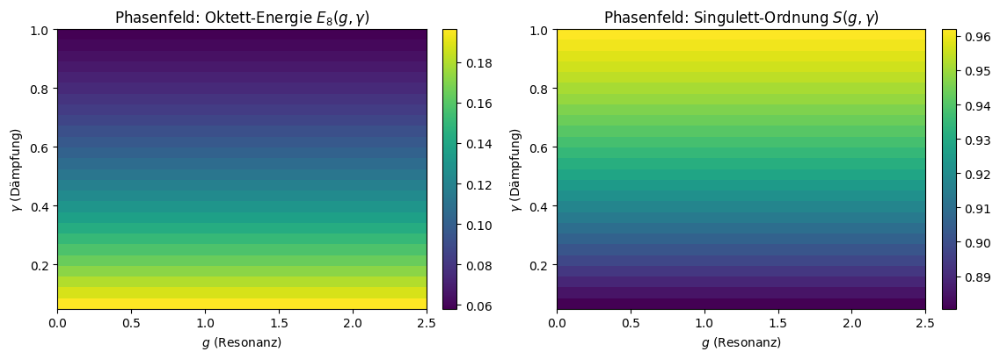

=== 2D-Phasenfeld (g, gamma) ===
g in [0.00, 2.50] mit 26 Schritten
gamma in [0.05, 1.00] mit 26 Schritten
Wertebereiche:
  E8: min=0.05808, max=0.19624
  S : min=0.88051, max=0.96190

Nutze für ΔA(t): g = 1.00, gamma = 0.30



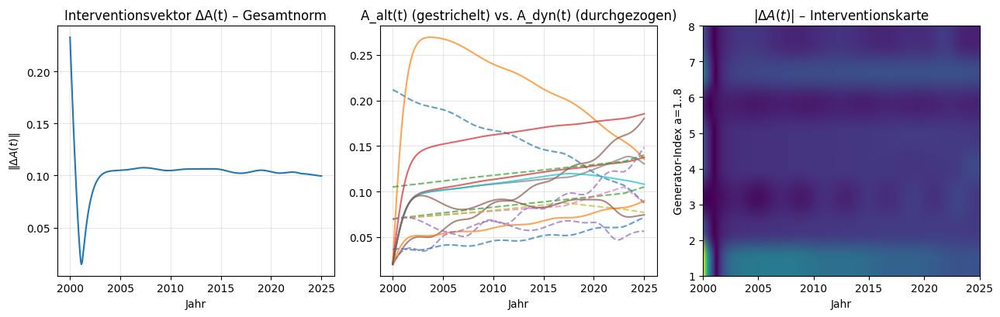

In [80]:
# =============================================================================
# ADD-ON: QSD-Feld auf SU(3)-Ebene, Phasenfeld (g,γ), Interventionsvektor ΔA
# =============================================================================

# ---------- 1. SU(3)-Strukturkonstanten aus deinen Generatoren berechnen -----
def build_fabc(generators):
    """
    Berechnet f^{abc} aus [L_a, L_b] = 2 i f^{abc} L_c
    und Tr(L_a L_b) = 2 δ_ab.
    generators: Liste [L1,...,L8]
    Rückgabe: Array F[a,b,c] mit a,b,c = 0..7
    """
    F = np.zeros((8, 8, 8), dtype=float)
    for a in range(8):
        for b in range(8):
            comm = generators[a] @ generators[b] - generators[b] @ generators[a]
            # Tr(L_d [L_a, L_b]) = 4 i f^{abd}
            for d in range(8):
                tr = np.trace(generators[d].conj().T @ comm)
                F[a, b, d] = (tr / (4j)).real
    return F

_FABC = build_fabc(generators)  # einmal global berechnen


# ---------- 2. Empirisches Feld A_emp(t) aus A1/A0 (Deutschlandpfad) ---------
def empirical_field_series(t_eval, alpha1=0.35, alpha0=0.20):
    """
    Baut aus deinen bekannten Funktionen
        A1(t) ~ f_components(t)
        A0(t) ~ a0_components(t)
    ein 8D-Feld A_emp(t) = α1 A1 + α0 A0.
    t_eval: 1D-Array der Zeitpunkte
    Rückgabe: (len(t_eval), 8)
    """
    A_emp = []
    for t in t_eval:
        a1 = f_components(t)    # (8,)
        a0 = a0_components(t)   # (8,)
        A_emp.append(alpha1 * a1 + alpha0 * a0)
    return np.array(A_emp, dtype=float)


def qsd_driver_from_existing(t, alpha1=0.35, alpha0=0.20):
    """
    Treiber J(t) aus denselben Komponenten wie A_emp(t).
    Hier nehmen wir ihn identisch zu A_emp(t).
    """
    return alpha1 * f_components(t) + alpha0 * a0_components(t)


# ---------- 3. E8 und Singulett-Ordnung S aus A^a ---------------------------
def octet_energy_from_A(A: np.ndarray) -> float:
    """
    Oktett-"Energie": einfach die Norm im 8D-Raum.
    """
    return float(np.dot(A, A))


def singlet_order_from_E(E: float, alpha: float = 0.7) -> float:
    """
    Singulett-Ordnung S(E): monoton fallende Funktion von E.
    Für E in [0,0.2] ergibt das S ca. [1.0, ~0.87].
    """
    return 1.0 / (1.0 + alpha * E)


# ---------- 4. Feld-ODE für A^a(t) ------------------------------------------
def qsd_field_rhs(t, A, g=1.0, gamma=0.3, beta=3.0,
                  alpha1=0.35, alpha0=0.20):
    """
    dA^a/dt = -γ A^a + g f^{abc} A^b A^c - β |A|^2 A^a + J^a(t)
    """
    A = A.reshape(8)
    J = qsd_driver_from_existing(t, alpha1=alpha1, alpha0=alpha0)

    # nichtlineare SU(3)-Kopplung g f^{abc} A^b A^c
    A_outer = A[:, None] * A[None, :]
    Fterm = np.zeros(8, dtype=float)
    for a in range(8):
        Fterm[a] = g * np.sum(_FABC[a] * A_outer)

    A_norm2 = float(np.dot(A, A))
    sat = beta * A_norm2 * A

    dA = -gamma * A + Fterm - sat + J
    return dA


def simulate_qsd_field(g=1.0, gamma=0.3, beta=3.0,
                       alpha1=0.35, alpha0=0.20,
                       t0=2000.0, t1=2025.0, n_eval=400):
    """
    Läuft die Feld-ODE einmal durch; Rückgabe:
      - t_eval
      - A_traj(t) (shape (T,8))
      - E8(t)
      - S(t)
    """
    t_eval = np.linspace(t0, t1, n_eval)
    A0 = 0.02 * np.ones(8, dtype=float)
    sol = solve_ivp(
        qsd_field_rhs,
        (t0, t1),
        A0,
        t_eval=t_eval,
        args=(g, gamma, beta, alpha1, alpha0),
        method="DOP853",
        rtol=1e-7,
        atol=1e-9
    )
    A_traj = sol.y.T
    E8 = np.zeros(n_eval)
    S  = np.zeros(n_eval)
    for k, A in enumerate(A_traj):
        e = octet_energy_from_A(A)
        E8[k] = e
        S[k]  = singlet_order_from_E(e, alpha=0.7)
    return t_eval, A_traj, E8, S


# ---------- 5. Phasenfeld (g,γ) -> (E8,S) ------------------------------------
def phasefield_g_gamma(g_min=0.0, g_max=2.5, n_g=26,
                       gamma_min=0.05, gamma_max=1.0, n_gamma=26,
                       beta=3.0,
                       alpha1=0.35, alpha0=0.20,
                       t0=2000.0, t1=2025.0, n_eval=280):
    """
    Erzeugt zwei Heatmaps:
      E8_map[j,i] = stabile Oktett-Energie für (g_i, γ_j)
      S_map[j,i]  = mittlere Singulett-Ordnung
    """
    g_values     = np.linspace(g_min, g_max, n_g)
    gamma_values = np.linspace(gamma_min, gamma_max, n_gamma)

    E8_map = np.zeros((n_gamma, n_g), dtype=float)
    S_map  = np.zeros((n_gamma, n_g), dtype=float)

    for j, gam in enumerate(gamma_values):
        for i, g_val in enumerate(g_values):
            t_eval, A_traj, E8, S = simulate_qsd_field(
                g=g_val, gamma=gam, beta=beta,
                alpha1=alpha1, alpha0=alpha0,
                t0=t0, t1=t1, n_eval=n_eval
            )
            tail = max(5, int(0.15 * len(E8)))  # nur letzte 15% als "stabil"
            E8_map[j, i] = np.max(E8[-tail:])
            S_map[j, i]  = np.mean(S[-tail:])

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(11.5, 4.2))

    ax = axes[0]
    im1 = ax.imshow(
        E8_map,
        origin="lower",
        aspect="auto",
        extent=[g_min, g_max, gamma_min, gamma_max]
    )
    ax.set_xlabel(r"$g$ (Resonanz)")
    ax.set_ylabel(r"$\gamma$ (Dämpfung)")
    ax.set_title("Phasenfeld: Oktett-Energie $E_8(g,\\gamma)$")
    fig.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

    ax2 = axes[1]
    im2 = ax2.imshow(
        S_map,
        origin="lower",
        aspect="auto",
        extent=[g_min, g_max, gamma_min, gamma_max]
    )
    ax2.set_xlabel(r"$g$ (Resonanz)")
    ax2.set_ylabel(r"$\gamma$ (Dämpfung)")
    ax2.set_title("Phasenfeld: Singulett-Ordnung $S(g,\\gamma)$")
    fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    print("=== 2D-Phasenfeld (g, gamma) ===")
    print(f"g in [{g_min:.2f}, {g_max:.2f}] mit {n_g} Schritten")
    print(f"gamma in [{gamma_min:.2f}, {gamma_max:.2f}] mit {n_gamma} Schritten")
    print("Wertebereiche:")
    print(f"  E8: min={E8_map.min():.5f}, max={E8_map.max():.5f}")
    print(f"  S : min={S_map.min():.5f}, max={S_map.max():.5f}")
    print("================================")
    return g_values, gamma_values, E8_map, S_map


# ---------- 6. Interventionsvektor ΔA(t) ------------------------------------
def compare_empirical_vs_dynamic(g=1.0, gamma=0.3, beta=3.0,
                                 alpha1=0.35, alpha0=0.20,
                                 t0=2000.0, t1=2025.0, n_eval=400):
    """
    A_alt(t) = A_emp(t)  = α1*A1(t) + α0*A0(t)    (Deutschlandpfad)
    A_dyn(t) = Lösung der Feld-ODE mit (g,γ,beta)
    ΔA(t)    = A_dyn - A_alt  -> Interventionsvektor
    Visualisiert:
      - Norm ||ΔA(t)||
      - A_alt vs. A_dyn (Komponentendiagramm)
      - |ΔA(t)| als Heatmap
    """
    t_eval = np.linspace(t0, t1, n_eval)

    # Alt: reine Potentiale (ohne Rückkopplung)
    A_alt = empirical_field_series(t_eval, alpha1=alpha1, alpha0=alpha0)

    # Neu: Feld-Dynamik
    _, A_dyn, E8_dyn, S_dyn = simulate_qsd_field(
        g=g, gamma=gamma, beta=beta,
        alpha1=alpha1, alpha0=alpha0,
        t0=t0, t1=t1, n_eval=n_eval
    )

    DeltaA = A_dyn - A_alt
    DeltaNorm = np.linalg.norm(DeltaA, axis=1)

    plt.figure(figsize=(13, 4.2))

    # 1) Norm
    plt.subplot(1, 3, 1)
    plt.plot(t_eval, DeltaNorm)
    plt.xlabel("Jahr")
    plt.ylabel(r"$\|\Delta A(t)\|$")
    plt.title("Interventionsvektor ΔA(t) – Gesamtnorm")
    plt.grid(True, alpha=0.3)

    # 2) Komponentenvergleich
    plt.subplot(1, 3, 2)
    for a in range(8):
        plt.plot(t_eval, A_alt[:, a], linestyle="--", alpha=0.7)
        plt.plot(t_eval, A_dyn[:, a], linestyle="-",  alpha=0.7)
    plt.xlabel("Jahr")
    plt.title("A_alt(t) (gestrichelt) vs. A_dyn(t) (durchgezogen)")
    plt.grid(True, alpha=0.3)

    # 3) ΔA-Heatmap
    plt.subplot(1, 3, 3)
    plt.imshow(
        np.abs(DeltaA).T,
        aspect="auto",
        origin="lower",
        extent=[t_eval[0], t_eval[-1], 1, 8]
    )
    plt.xlabel("Jahr")
    plt.ylabel("Generator-Index a=1..8")
    plt.title(r"$|\Delta A(t)|$ – Interventionskarte")
    plt.tight_layout()
    plt.show()

    return t_eval, A_alt, A_dyn, DeltaA


# ---------- 7. Komfort-Funktion: alles in einem Rutsch ----------------------
def run_qsd_field_addon():
    """
    Komfort-Wrapper:
      1) Phasenfeld (E8,S) über (g,γ)
      2) Dynamik für einen ausgewählten Punkt (g*,γ*)
      3) Interventionsvektor ΔA(t) visualisieren
    """
    # Schritt 1: Phasenfeld
    g_vals, gamma_vals, E8_map, S_map = phasefield_g_gamma(
        g_min=0.0, g_max=2.5, n_g=26,
        gamma_min=0.05, gamma_max=1.0, n_gamma=26,
        beta=3.0,
        alpha1=0.35, alpha0=0.20,
        t0=2000.0, t1=2025.0, n_eval=260
    )

    # Beispiel: arbeite mit einem moderaten Punkt im "hybriden" Bereich
    g_star = 1.0
    gamma_star = 0.30

    print(f"\nNutze für ΔA(t): g = {g_star:.2f}, gamma = {gamma_star:.2f}\n")

    # Schritt 2+3: Interventionsvektor für diesen Punkt
    t_eval, A_alt, A_dyn, DeltaA = compare_empirical_vs_dynamic(
        g=g_star, gamma=gamma_star,
        beta=3.0,
        alpha1=0.35, alpha0=0.20,
        t0=2000.0, t1=2025.0, n_eval=400
    )
    # Rückgabe, falls du später damit weiterarbeiten willst
    return dict(
        g_vals=g_vals, gamma_vals=gamma_vals,
        E8_map=E8_map, S_map=S_map,
        t_eval=t_eval, A_alt=A_alt,
        A_dyn=A_dyn, DeltaA=DeltaA
    )

# Hinweis:
# Dieses Add-on macht von sich aus nichts, solange du run_qsd_field_addon()
# nicht explizit aufrufst. Du kannst z.B. am Ende der Datei schreiben:
#
result = run_qsd_field_addon()
#
# oder es in einen eigenen __main__-Block packen.



=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0728   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0442   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0304   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


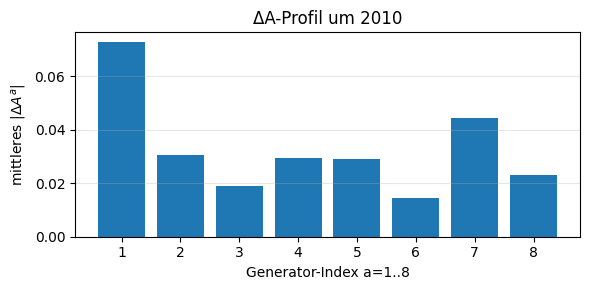


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0662   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0466   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0328   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


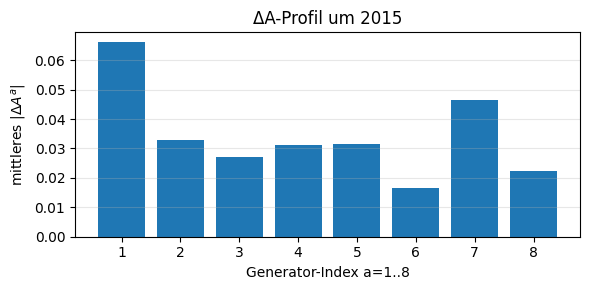


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0585   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0470   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0337   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


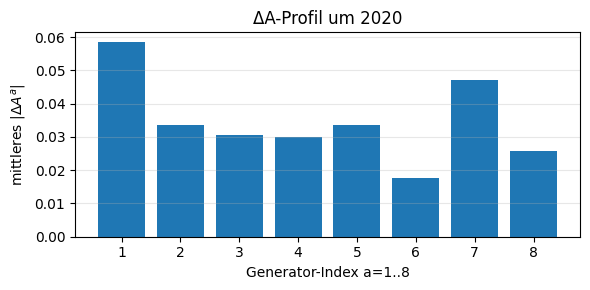

In [81]:
# =============================================================================
# ADD-ON: ΔA-Auswertung pro Jahr mit QSD-Bedeutung der Generatoren
# =============================================================================

QSD_MEANING = {
    1: "λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)",
    2: "λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)",
    3: "λ3 – Blau–Orange Differenzachse (Autorität vs. Autonomie, Rollenbalance)",
    4: "λ4 – Blau–Grün Kopplung (Ordnung vs. Solidarität, Regelhumanisierung)",
    5: "λ5 – Blau–Grün Spannungsachse (Moralische Polarisierung, Schuld/Zugehörigkeit)",
    6: "λ6 – Orange–Grün Kopplung (Innovation vs. Nachhaltigkeit, Kooperation)",
    7: "λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)",
    8: "λ8 – Systembalance / Zentrierung (oben–unten, Mitte, Zukunftsvertrauen)"
}


def summarize_deltaA_windows(t_eval,
                             DeltaA,
                             years=(2010.0, 2015.0, 2020.0),
                             window_width=2.0,
                             top_k=3,
                             make_plots=False):
    """
    t_eval : Zeitachse (aus run_qsd_field_addon()['t_eval'])
    DeltaA : ΔA(t) (aus run_qsd_field_addon()['DeltaA']), shape (T,8)
    years  : zentrale Jahre, um die ausgewertet wird
    window_width : Fensterbreite (in Jahren) um jedes Jahr
    top_k  : wie viele stärkste Komponenten pro Jahr gelistet werden
    make_plots : optional kleine Balkendiagramme zeichnen

    Rückgabe: dict[year] -> dict mit 'mean_abs' (8er-Array) und 'top_indices'
    """

    t_eval = np.asarray(t_eval)
    DeltaA = np.asarray(DeltaA)
    summary = {}

    for year in years:
        mask = (t_eval >= year - window_width/2.0) & (t_eval <= year + window_width/2.0)
        idx = np.where(mask)[0]
        if len(idx) == 0:
            print(f"[Warnung] Kein Zeitfenster für Jahr {year} gefunden – übersprungen.")
            continue

        window_DA = DeltaA[idx, :]          # (N_window, 8)
        mean_abs = np.mean(np.abs(window_DA), axis=0)  # (8,)

        # sortiere nach Stärke, absteigend
        order = np.argsort(-mean_abs)       # größte zuerst
        top_idx = order[:top_k]             # z.B. [5,2,7] -> a=6,3,8

        summary[year] = {
            "mean_abs": mean_abs,
            "top_indices": top_idx
        }

        print(f"\n=== Interventionshebel um das Jahr {year:.0f} (Fenster ±{window_width/2:.1f} Jahre) ===")
        for rank, j in enumerate(top_idx, start=1):
            a = j + 1  # Index -> Generatornummer 1..8
            val = mean_abs[j]
            meaning = QSD_MEANING.get(a, f"λ{a}")
            print(f"{rank}. a={a:d}  |ΔA^({a})|_mittel = {val:.4f}   -> {meaning}")
        print("===================================================================")

        if make_plots:
            # kleines Balkendiagramm für dieses Jahr
            import matplotlib.pyplot as plt
            plt.figure(figsize=(6, 3))
            plt.bar(range(1, 9), mean_abs)
            plt.xlabel("Generator-Index a=1..8")
            plt.ylabel(r"mittleres $|\Delta A^a|$")
            plt.title(f"ΔA-Profil um {year:.0f}")
            plt.xticks(range(1, 9))
            plt.grid(True, axis="y", alpha=0.3)
            plt.tight_layout()
            plt.show()

    return summary

summary = summarize_deltaA_windows(
    result["t_eval"],
    result["DeltaA"],
    years=(2010.0, 2015.0, 2020.0),   # oder andere Jahre
    window_width=2.0,                 # z.B. 2014–2016 für 2015
    top_k=3,
    make_plots=True                   # wenn du die Balken sehen willst
)


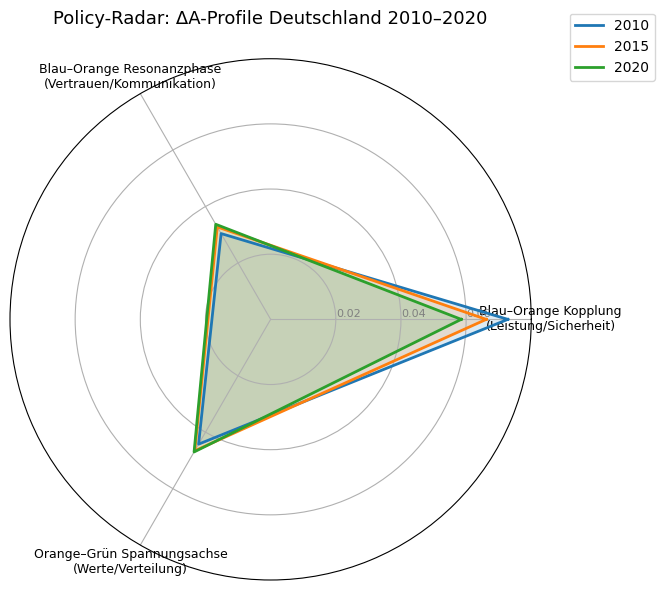

In [82]:
# =============================================================================
# ADD-ON: Policy-Radar-Diagramm für dominante ΔA-Komponenten (λ1, λ2, λ7)
# =============================================================================
import matplotlib.pyplot as plt
import numpy as np

def plot_policy_radar(summary, years=(2010, 2015, 2020)):
    """
    summary: dict von summarize_deltaA_windows()
    years: Liste der betrachteten Jahre
    """
    # Generatoren-Auswahl: λ1, λ2, λ7
    selected = [1, 2, 7]
    labels = [f"λ{a}" for a in selected]
    meanings = [
        "Blau–Orange Kopplung\n(Leistung/Sicherheit)",
        "Blau–Orange Resonanzphase\n(Vertrauen/Kommunikation)",
        "Orange–Grün Spannungsachse\n(Werte/Verteilung)"
    ]

    # Winkel im Radar
    N = len(selected)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]  # schließen

    plt.figure(figsize=(7, 6))
    ax = plt.subplot(111, polar=True)
    plt.title("Policy-Radar: ΔA-Profile Deutschland 2010–2020", size=13, pad=25)

    # Farben für die Jahre
    colors = {2010: "tab:blue", 2015: "tab:orange", 2020: "tab:green"}

    for year in years:
        if year not in summary:
            continue
        mean_abs = summary[year]["mean_abs"]
        values = [mean_abs[a-1] for a in selected]
        values += values[:1]
        ax.plot(angles, values, label=f"{year}", color=colors.get(year, "gray"), linewidth=2)
        ax.fill(angles, values, alpha=0.15, color=colors.get(year, "gray"))

    # Achsenbeschriftungen
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(meanings, fontsize=9)
    ax.set_rlabel_position(0)
    plt.yticks([0.02, 0.04, 0.06], ["0.02", "0.04", "0.06"], color="gray", size=8)
    plt.ylim(0, 0.08)

    plt.legend(loc="upper right", bbox_to_anchor=(1.25, 1.1))
    plt.tight_layout()
    plt.show()

# Beispielaufruf
plot_policy_radar(summary, years=(2010, 2015, 2020))



Region: Ost (s=-1.0)


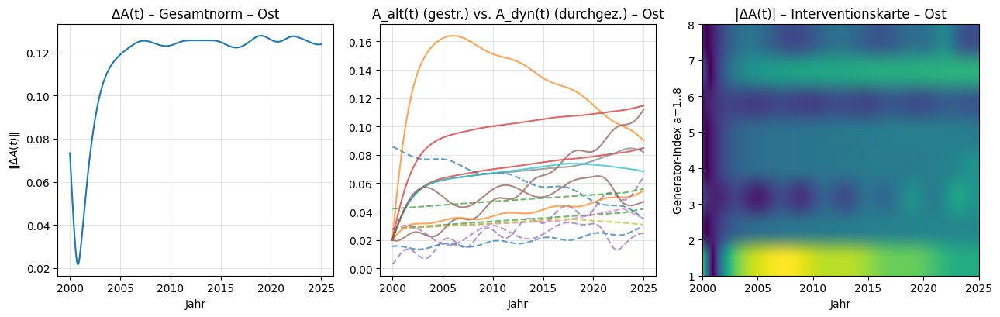


=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0845   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0531   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0367   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


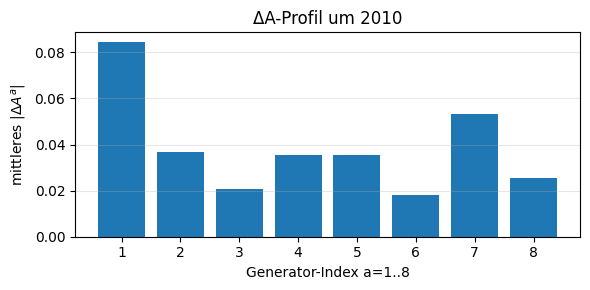


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0768   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0557   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0393   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


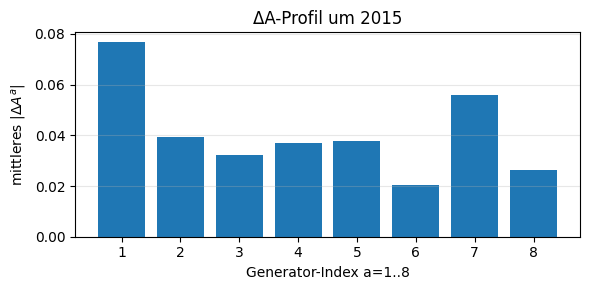


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0674   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0571   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=3  |ΔA^(3)|_mittel = 0.0414   -> λ3 – Blau–Orange Differenzachse (Autorität vs. Autonomie, Rollenbalance)


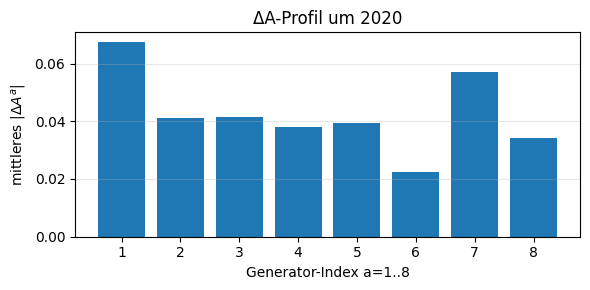


Region: Mitte (s=+0.0)


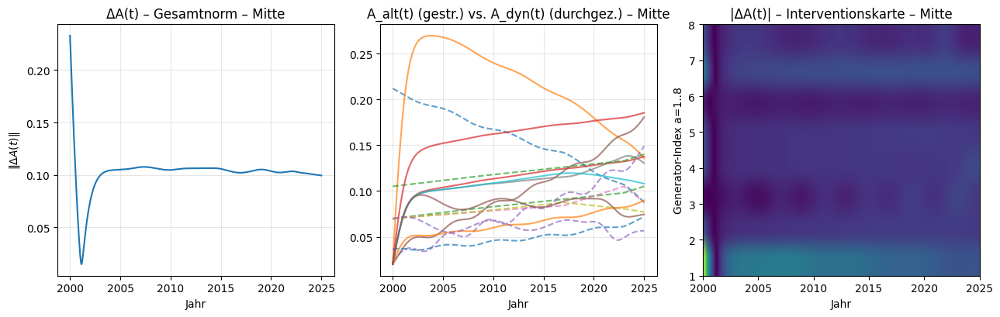


=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0728   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0443   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0304   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


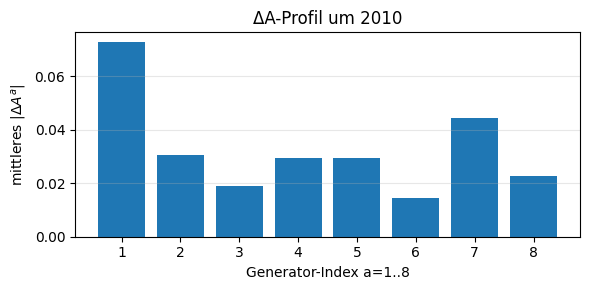


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0662   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0466   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0328   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


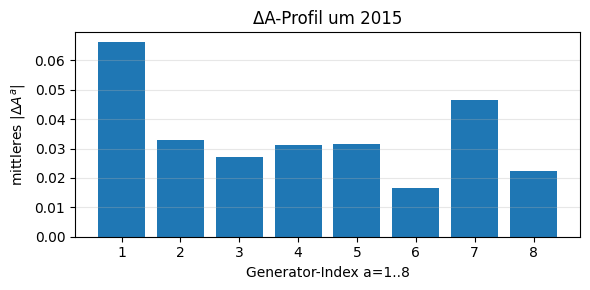


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0585   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0470   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0337   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


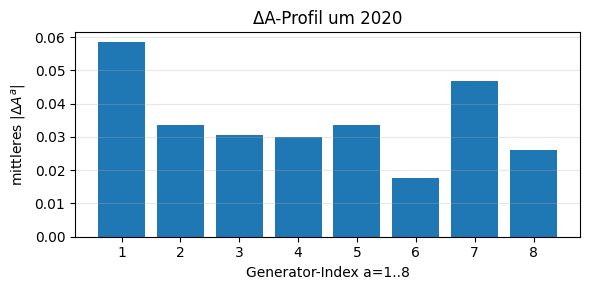


Region: West (s=+1.0)


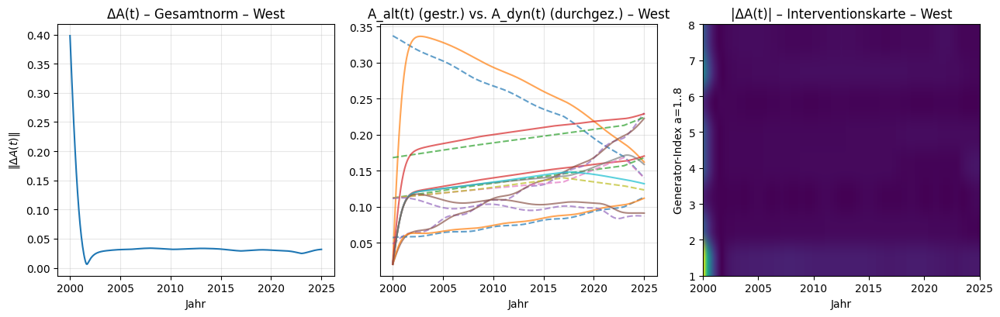


=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0259   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0114   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=4  |ΔA^(4)|_mittel = 0.0076   -> λ4 – Blau–Grün Kopplung (Ordnung vs. Solidarität, Regelhumanisierung)


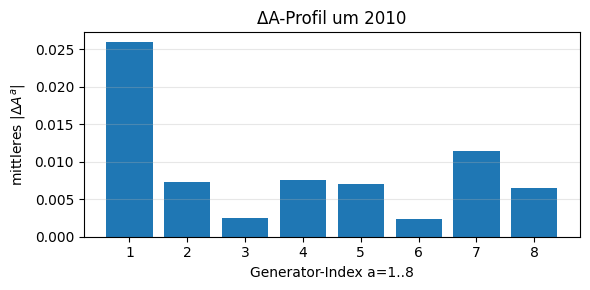


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0245   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0122   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0081   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


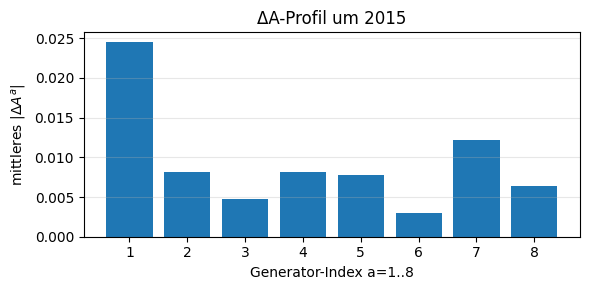


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0235   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0110   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=5  |ΔA^(5)|_mittel = 0.0103   -> λ5 – Blau–Grün Spannungsachse (Moralische Polarisierung, Schuld/Zugehörigkeit)


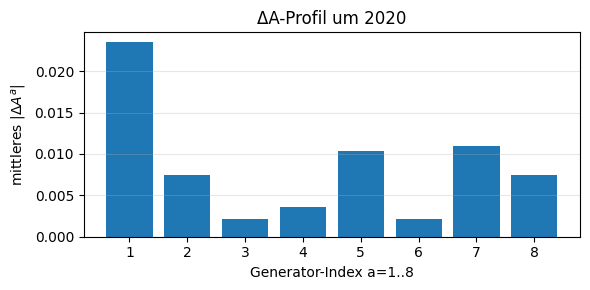

In [83]:
# =============================================================================
# ADD-ON: Ost-/West-Variante des QSD-Feldes
# - Regionale Potentiale A_emp^s(t) mit s in {-1,0,+1}
# - Regionale Feld-ODE A^a_s(t)
# - Regionale Interventionsvektoren ΔA_s(t)
# - Optionale Auswertung der ΔA-Hebel pro Jahr (nutzt summarize_deltaA_windows)
# =============================================================================

# -------------------- 1. Regionale empirische Felder & Treiber ---------------

def empirical_field_series_region(t_eval, s, alpha1=0.35, alpha0=0.20):
    """
    Regionale Version von A_emp(t):
      A_emp^s(t) = α1 * u(s)*A1(t) + α0 * v(s)*A0(t)
    s: -1 (Ost), 0 (Mitte), +1 (West)
    t_eval: 1D-Array der Zeitpunkte
    Rückgabe: Array shape (T, 8)
    """
    us = u_of_s(s)
    vs = v_of_s(s)
    A_emp = []
    for t in t_eval:
        a1 = f_components(t)    # (8,)
        a0 = a0_components(t)   # (8,)
        A_emp.append(alpha1 * us * a1 + alpha0 * vs * a0)
    return np.array(A_emp, dtype=float)


def qsd_driver_region(t, s, alpha1=0.35, alpha0=0.20):
    """
    Regionale Version des Treibers J^a_s(t):
      J^a_s(t) = α1 u(s) f^a(t) + α0 v(s) a0^a(t)
    """
    us = u_of_s(s)
    vs = v_of_s(s)
    return alpha1 * us * f_components(t) + alpha0 * vs * a0_components(t)


# -------------------- 2. Regionale Feld-ODE ----------------------------------

def qsd_field_rhs_region(t, A, s, g=1.0, gamma=0.3, beta=3.0,
                         alpha1=0.35, alpha0=0.20):
    """
    Regionale Feldgleichung:
      dA^a_s/dt = -γ A^a_s + g f^{abc} A^b_s A^c_s - β |A_s|^2 A^a_s + J^a_s(t)
    s: -1 (Ost), 0 (Mitte), +1 (West)
    """
    A = A.reshape(8)
    J = qsd_driver_region(t, s, alpha1=alpha1, alpha0=alpha0)

    # SU(3)-Nichtlinearität g f^{abc} A^b A^c
    A_outer = A[:, None] * A[None, :]
    Fterm = np.zeros(8, dtype=float)
    for a in range(8):
        Fterm[a] = g * np.sum(_FABC[a] * A_outer)

    A_norm2 = float(np.dot(A, A))
    sat = beta * A_norm2 * A

    dA = -gamma * A + Fterm - sat + J
    return dA


def simulate_qsd_field_region(s, g=1.0, gamma=0.3, beta=3.0,
                              alpha1=0.35, alpha0=0.20,
                              t0=2000.0, t1=2025.0, n_eval=400):
    """
    Regionale Simulation des QSD-Feldes für die Region mit Index s.
    Rückgabe:
      t_eval  : Zeitgitter
      A_traj  : Feldtrajektorie A^a_s(t), shape (T, 8)
      E8(t)   : Oktettenergie
      S(t)    : Singulett-Ordnung
    """
    t_eval = np.linspace(t0, t1, n_eval)
    A0 = 0.02 * np.ones(8, dtype=float)
    sol = solve_ivp(
        qsd_field_rhs_region,
        (t0, t1),
        A0,
        t_eval=t_eval,
        args=(s, g, gamma, beta, alpha1, alpha0),
        method="DOP853",
        rtol=1e-7,
        atol=1e-9
    )
    A_traj = sol.y.T
    E8 = np.zeros(n_eval); S = np.zeros(n_eval)
    for k, A in enumerate(A_traj):
        e = octet_energy_from_A(A)
        E8[k] = e
        S[k]  = singlet_order_from_E(e, alpha=0.7)
    return t_eval, A_traj, E8, S


# -------------------- 3. Regionale ΔA(t) – Interventionsvektor ---------------

def compare_empirical_vs_dynamic_region(s, label,
                                        g=1.0, gamma=0.3, beta=3.0,
                                        alpha1=0.35, alpha0=0.20,
                                        t0=2000.0, t1=2025.0, n_eval=400):
    """
    Vergleicht für eine Region (s, label):
      A_alt^s(t) = empirisches Feld (aus A1/A0 mit u(s), v(s))
      A_dyn^s(t) = Lösung der regionalen Feld-ODE
      ΔA_s(t)    = A_dyn^s - A_alt^s
    und visualisiert:
      - Norm ||ΔA_s(t)||
      - A_alt^s vs. A_dyn^s (Komponenten)
      - |ΔA_s(t)| als Heatmap
    """
    t_eval = np.linspace(t0, t1, n_eval)

    # "Alt": reine, regionale Deutschland-Potentiale
    A_alt = empirical_field_series_region(t_eval, s, alpha1=alpha1, alpha0=alpha0)

    # "Neu": regionale Feld-Dynamik
    _, A_dyn, E8_dyn, S_dyn = simulate_qsd_field_region(
        s, g=g, gamma=gamma, beta=beta,
        alpha1=alpha1, alpha0=alpha0,
        t0=t0, t1=t1, n_eval=n_eval
    )

    DeltaA = A_dyn - A_alt
    DeltaNorm = np.linalg.norm(DeltaA, axis=1)

    plt.figure(figsize=(13, 4.2))

    # 1) Norm ||ΔA||
    plt.subplot(1, 3, 1)
    plt.plot(t_eval, DeltaNorm)
    plt.xlabel("Jahr")
    plt.ylabel(r"$\|\Delta A(t)\|$")
    plt.title(f"ΔA(t) – Gesamtnorm – {label}")
    plt.grid(True, alpha=0.3)

    # 2) Komponentenvergleich
    plt.subplot(1, 3, 2)
    for a in range(8):
        plt.plot(t_eval, A_alt[:, a], linestyle="--", alpha=0.7)
        plt.plot(t_eval, A_dyn[:, a], linestyle="-",  alpha=0.7)
    plt.xlabel("Jahr")
    plt.title(f"A_alt(t) (gestr.) vs. A_dyn(t) (durchgez.) – {label}")
    plt.grid(True, alpha=0.3)

    # 3) Komponenten-Heatmap |ΔA|
    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(DeltaA).T,
               aspect="auto",
               origin="lower",
               extent=[t_eval[0], t_eval[-1], 1, 8])
    plt.xlabel("Jahr")
    plt.ylabel("Generator-Index a=1..8")
    plt.title(f"|ΔA(t)| – Interventionskarte – {label}")
    plt.tight_layout()
    plt.show()

    return t_eval, A_alt, A_dyn, DeltaA


# -------------------- 4. Komfort-Wrapper: Ost/Mitte/West durchlaufen ---------

def run_ost_west_addon(g=1.0, gamma=0.3, beta=3.0,
                       alpha1=0.35, alpha0=0.20,
                       years_for_summary=(2010.0, 2015.0, 2020.0),
                       window_width=2.0):
    """
    Läuft das regionale Add-on für Ost, Mitte, West:
      - erzeugt ΔA-Profile und Plots für jede Region
      - berechnet (falls summarize_deltaA_windows vorhanden) die Top-Interventionsachsen
    Rückgabe: dict[region_label] -> dict mit t_eval, A_alt, A_dyn, DeltaA, summary
    """
    results = {}
    regions = [(-1.0, "Ost"), (0.0, "Mitte"), (1.0, "West")]

    for s, label in regions:
        print("\n====================================================")
        print("Region:", label, f"(s={s:+.1f})")
        print("====================================================")
        t_eval, A_alt, A_dyn, DeltaA = compare_empirical_vs_dynamic_region(
            s, label,
            g=g, gamma=gamma, beta=beta,
            alpha1=alpha1, alpha0=alpha0,
            t0=2000.0, t1=2025.0, n_eval=400
        )

        # Optional: ΔA-Jahreshebel auswerten, falls summarize_deltaA_windows definiert ist
        try:
            summary = summarize_deltaA_windows(
                t_eval, DeltaA,
                years=years_for_summary,
                window_width=window_width,
                top_k=3,
                make_plots=True
            )
        except NameError:
            summary = None
            print("[Hinweis] summarize_deltaA_windows ist nicht definiert – keine Jahreshebel-Auswertung.")

        results[label] = dict(
            t_eval=t_eval,
            A_alt=A_alt,
            A_dyn=A_dyn,
            DeltaA=DeltaA,
            summary=summary
        )

    return results

# -----------------------------------------------------------------------------
# Verwendung:
#   1. Stelle sicher, dass die globalen Add-ons (u_of_s, v_of_s, _FABC,
#      octet_energy_from_A, singlet_order_from_E, summarize_deltaA_windows)
#      bereits definiert sind.
#   2. Rufe z.B. im __main__-Block auf:
#
#       ost_west_results = run_ost_west_addon(
#           g=1.0, gamma=0.3, beta=3.0,
#           alpha1=0.35, alpha0=0.20,
#           years_for_summary=(2010.0, 2015.0, 2020.0),
#           window_width=2.0
#       )
#
#   3. Für jede Region ("Ost","Mitte","West") werden dann:
#       - ΔA-Plots erzeugt
#       - (falls möglich) Top-Interventionsachsen pro Jahr ausgegeben
# -----------------------------------------------------------------------------
ost_west_results = run_ost_west_addon()

In [84]:
# =============================================================================
# ADD-ON: Policy-Delta-A Dashboard
# - liest die "summary"-Einträge aus run_ost_west_addon()
# - gibt pro Region & Jahr die Top-3 ΔA-Achsen mit QSD-Bedeutung
#   und konkreten politischen Maßnahmen aus
# =============================================================================

# Politische Maßnahmen pro Generator (kurz, aber aussagekräftig)
POLICY_SUGGESTIONS = {
    1: (
        "λ1 – Blau–Orange Kopplung",
        "Strukturelle Brücken zwischen Staat/Verwaltung und Wirtschaft stärken:\n"
        "  • Kooperative Innovations- und Industriepolitik (Reallabore, Transformationsfonds)\n"
        "  • Bürokratieabbau bei klaren Standards statt Mikrokontrolle\n"
        "  • Leistungsorientierte Sicherheit: soziale Absicherung an Weiterbildungs- und Transformationspfade koppeln"
    ),
    2: (
        "λ2 – Blau–Orange Resonanzphase",
        "Vertrauen und Nachvollziehbarkeit politischer Entscheidungen erhöhen:\n"
        "  • Transparente Krisenkommunikation (Daten, Modelle, Entscheidungswege offenlegen)\n"
        "  • Partizipative Formate: Bürgerräte, Bürgerhaushalte, dialogische Verwaltung\n"
        "  • Symbolische Kommunikation: Sprache, die Pflicht und Autonomie verbindet"
    ),
    3: (
        "λ3 – Blau–Orange Differenzachse",
        "Autorität und Autonomie neu balancieren:\n"
        "  • Führungskräfte- und Behördenkultur modernisieren (dienende Führung, Serviceorientierung)\n"
        "  • Rechts- und Verwaltungssprache verständlicher machen\n"
        "  • Konflikt- und Demokratiebildung in Schule und Verwaltung stärken"
    ),
    4: (
        "λ4 – Blau–Grün Kopplung",
        "Regeln humanisieren und Solidarität institutionell verankern:\n"
        "  • Prüfen von Gesetzen auf soziale und psychische Zumutbarkeit\n"
        "  • Soziale Dienste und Ehrenamt institutionell besser einbetten\n"
        "  • ‚Sozialverträgliche Digitalisierung‘ als Leitprinzip etablieren"
    ),
    5: (
        "λ5 – Blau–Grün Spannungsachse",
        "Moralische Polarisierung entschärfen:\n"
        "  • Räume für Dialog zwischen konservativen und progressiven Milieus schaffen\n"
        "  • Politisierung von Moralthemen (z.B. Migration, Identität) deeskalieren\n"
        "  • Mediale Formate fördern, die Perspektivwechsel üben statt skandalisieren"
    ),
    6: (
        "λ6 – Orange–Grün Kopplung",
        "Innovation und Nachhaltigkeit als gemeinsames Projekt rahmen:\n"
        "  • Grüne Industriepolitik (Klima-Investitionen, Innovationsförderung)\n"
        "  • Gemeinsame Transformationsprojekte von Unternehmen und Zivilgesellschaft\n"
        "  • Nachhaltigkeit in Berufs- und Wirtschaftsausbildung integrieren"
    ),
    7: (
        "λ7 – Orange–Grün Spannungsachse",
        "Wachstums- und Verteilungskonflikte konstruktiv bearbeiten:\n"
        "  • Sozial-ökologische Steuer- und Transferreformen (z.B. CO₂-Bepreisung mit Klima-Dividende)\n"
        "  • Regionale Ausgleichs- und Re-Investitionsfonds für Transformationsverlierer\n"
        "  • Debattenformate zu ‚gerechter Transformation‘ (Just Transition) stärken"
    ),
    8: (
        "λ8 – Systembalance / Zentrierung",
        "Vertrauen in das Gesamtsystem und seine Zukunftsfähigkeit stärken:\n"
        "  • Langfristige Zukunftsmissionen definieren (z.B. Klima-, Digital-, Pflege-Missionen)\n"
        "  • Institutionelle Resilienzprogramme (Krisenvorsorge, Staatsmodernisierung)\n"
        "  • Symbolische Politik der Mitte: Polarisierung abbauen, gemeinsame Ziele sichtbar machen"
    ),
}


def policy_deltaA_dashboard(ost_west_results,
                            years=(2010.0, 2015.0, 2020.0),
                            top_k=3):
    """
    Erzeugt eine textuelle 'Dashboard'-Ausgabe:
      - Für jede Region (Ost, Mitte, West)
      - Für jedes Jahr in 'years', wenn in summary vorhanden
      - Listet Top-k ΔA-Achsen mit:
          * Index a
          * mittlerem |ΔA^a|
          * QSD-Bedeutung (QSD_MEANING)
          * Kurztext politischer Maßnahmen (POLICY_SUGGESTIONS)
    Erwartet als Input das Dict, das run_ost_west_addon() zurückgibt.
    """
    if ost_west_results is None:
        print("[policy_deltaA_dashboard] Keine Ergebnisse übergeben.")
        return

    for region_label, data in ost_west_results.items():
        summary = data.get("summary", None)
        print("\n#################################################################")
        print(f"Policy-Delta-A Dashboard – Region: {region_label}")
        print("#################################################################")

        if summary is None:
            print("  Keine summary-Daten für diese Region vorhanden.")
            continue

        for year in years:
            if year not in summary:
                print(f"\n  Jahr {year:.0f}: keine Auswertung (nicht in summary).")
                continue

            info = summary[year]
            mean_abs = info["mean_abs"]
            top_idx = info["top_indices"][:top_k]

            print(f"\n  Jahr {year:.0f}: wichtigste ΔA-Hebel (Top {top_k})")
            print("  ---------------------------------------------------------")
            for rank, j in enumerate(top_idx, start=1):
                a = j + 1  # 0-basiert -> 1..8
                val = mean_abs[j]
                qsd_text = QSD_MEANING.get(a, f"λ{a}")
                policy_title, policy_text = POLICY_SUGGESTIONS.get(
                    a, (f"λ{a}", "Keine spezifischen Vorschläge hinterlegt.")
                )

                print(f"  {rank}. Generator λ{a}  |ΔA^{a}|_mittel = {val:.4f}")
                print(f"     QSD-Achse : {qsd_text}")
                print(f"     Maßnahmen : {policy_title}")
                for line in policy_text.split("\n"):
                    print(f"       {line}")
            print("  ---------------------------------------------------------")

        print("#################################################################\n")



Region: Ost (s=-1.0)


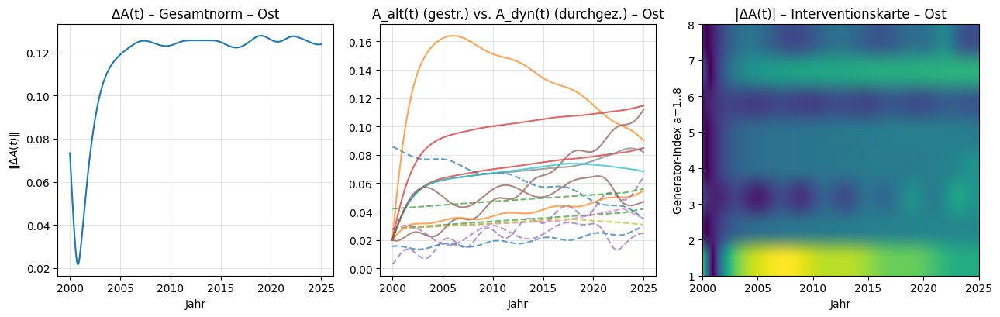


=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0845   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0531   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0367   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


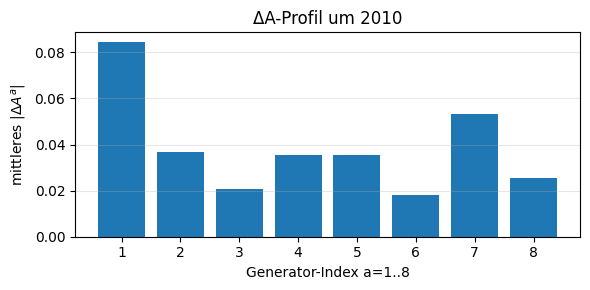


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0768   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0557   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0393   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


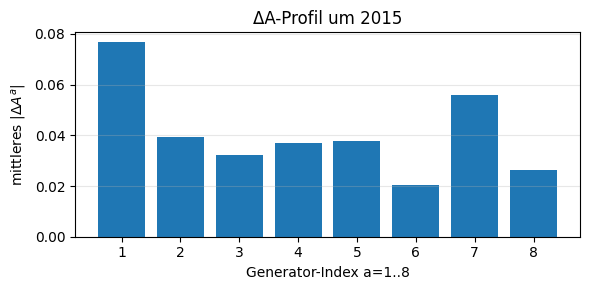


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0674   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0571   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=3  |ΔA^(3)|_mittel = 0.0414   -> λ3 – Blau–Orange Differenzachse (Autorität vs. Autonomie, Rollenbalance)


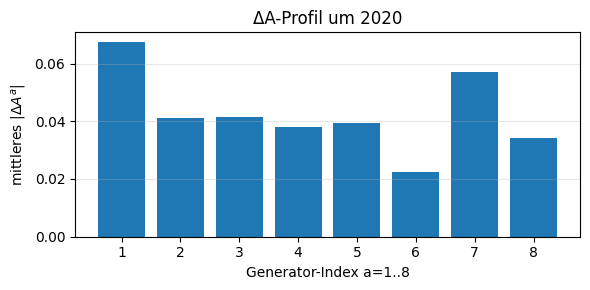


Region: Mitte (s=+0.0)


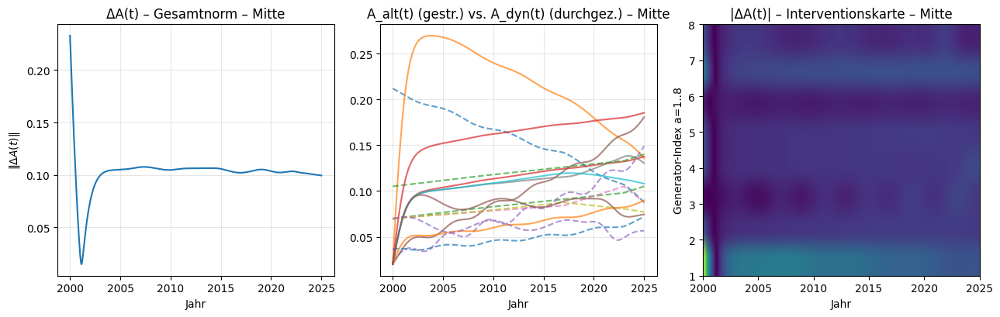


=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0728   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0443   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0304   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


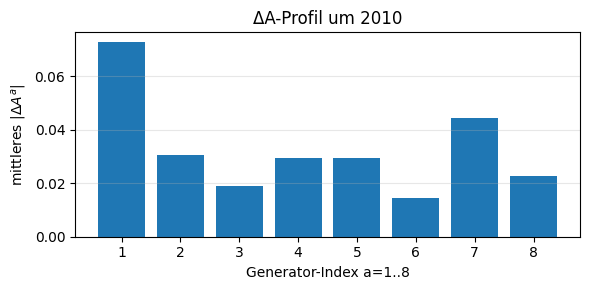


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0662   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0466   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0328   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


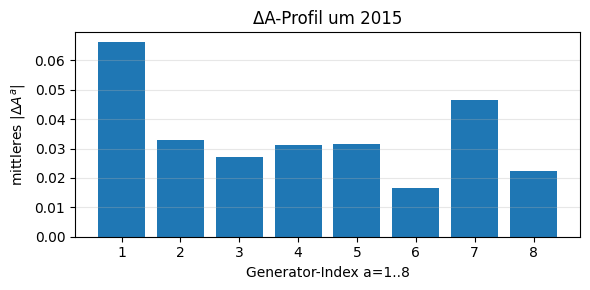


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0585   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0470   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0337   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


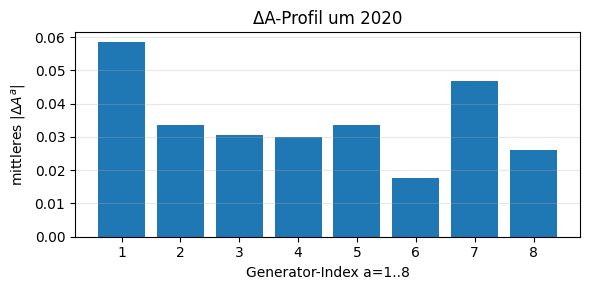


Region: West (s=+1.0)


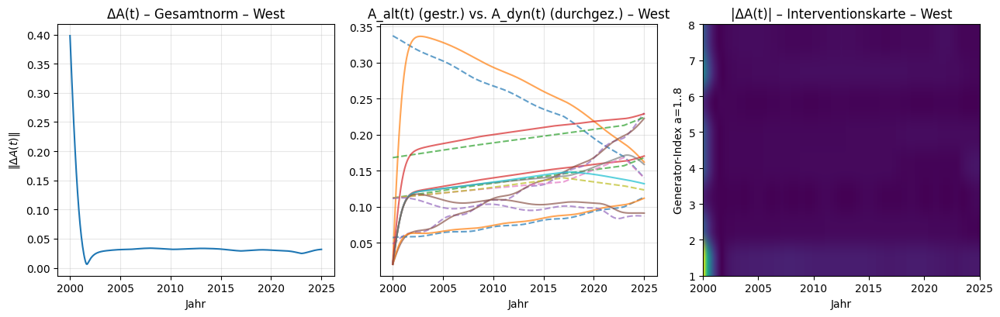


=== Interventionshebel um das Jahr 2010 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0259   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0114   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=4  |ΔA^(4)|_mittel = 0.0076   -> λ4 – Blau–Grün Kopplung (Ordnung vs. Solidarität, Regelhumanisierung)


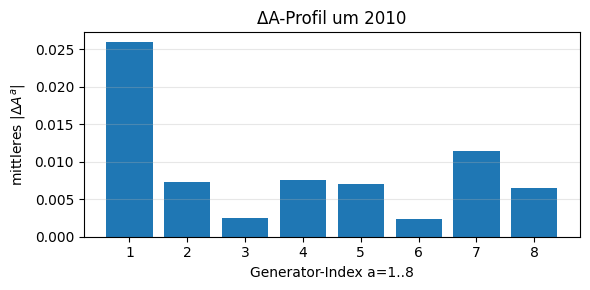


=== Interventionshebel um das Jahr 2015 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0245   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0122   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=2  |ΔA^(2)|_mittel = 0.0081   -> λ2 – Blau–Orange Resonanzphase (emotionaler Konflikt / Missverständnisse)


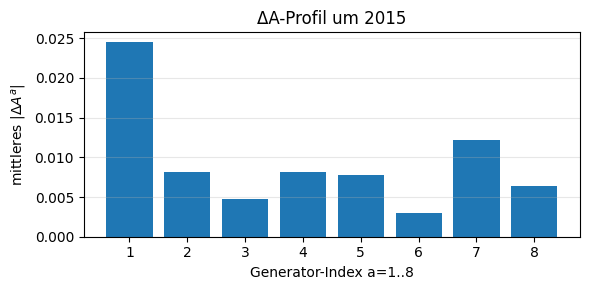


=== Interventionshebel um das Jahr 2020 (Fenster ±1.0 Jahre) ===
1. a=1  |ΔA^(1)|_mittel = 0.0235   -> λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
2. a=7  |ΔA^(7)|_mittel = 0.0110   -> λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
3. a=5  |ΔA^(5)|_mittel = 0.0103   -> λ5 – Blau–Grün Spannungsachse (Moralische Polarisierung, Schuld/Zugehörigkeit)


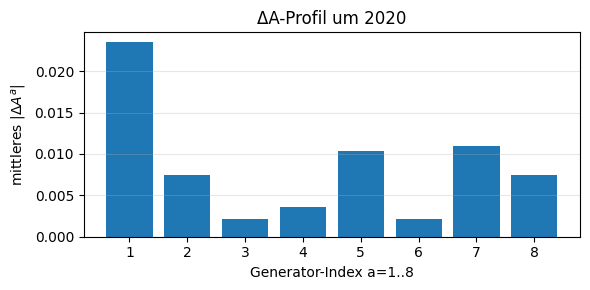

In [85]:
ost_west_results = run_ost_west_addon(
    g=1.0, gamma=0.3, beta=3.0,
    alpha1=0.35, alpha0=0.20,
    years_for_summary=(2010.0, 2015.0, 2020.0),
    window_width=2.0
)


In [86]:
policy_deltaA_dashboard(
    ost_west_results,
    years=(2010.0, 2015.0, 2020.0),
    top_k=3
)



#################################################################
Policy-Delta-A Dashboard – Region: Ost
#################################################################

  Jahr 2010: wichtigste ΔA-Hebel (Top 3)
  ---------------------------------------------------------
  1. Generator λ1  |ΔA^1|_mittel = 0.0845
     QSD-Achse : λ1 – Blau–Orange Kopplung (Leistung vs. Sicherheit, Kommunikation/Abgleich)
     Maßnahmen : λ1 – Blau–Orange Kopplung
       Strukturelle Brücken zwischen Staat/Verwaltung und Wirtschaft stärken:
         • Kooperative Innovations- und Industriepolitik (Reallabore, Transformationsfonds)
         • Bürokratieabbau bei klaren Standards statt Mikrokontrolle
         • Leistungsorientierte Sicherheit: soziale Absicherung an Weiterbildungs- und Transformationspfade koppeln
  2. Generator λ7  |ΔA^7|_mittel = 0.0531
     QSD-Achse : λ7 – Orange–Grün Spannungsachse (Wachstumskonflikte, Verteilung)
     Maßnahmen : λ7 – Orange–Grün Spannungsachse
       Wachstums- un


=== Agentensimulation: Region Ost, Blau-Agent ===


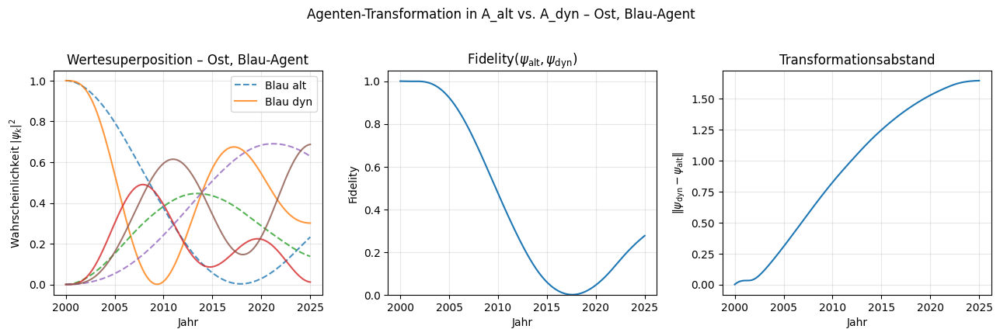


=== Agentensimulation: Region Ost, Orange-Agent ===


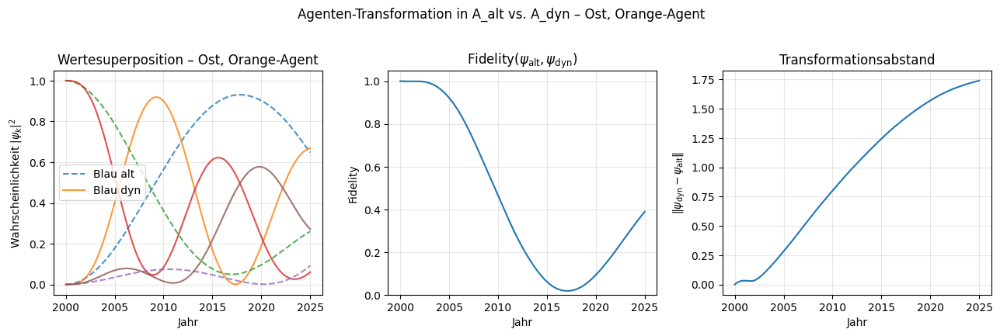


=== Agentensimulation: Region Ost, Grün-Agent ===


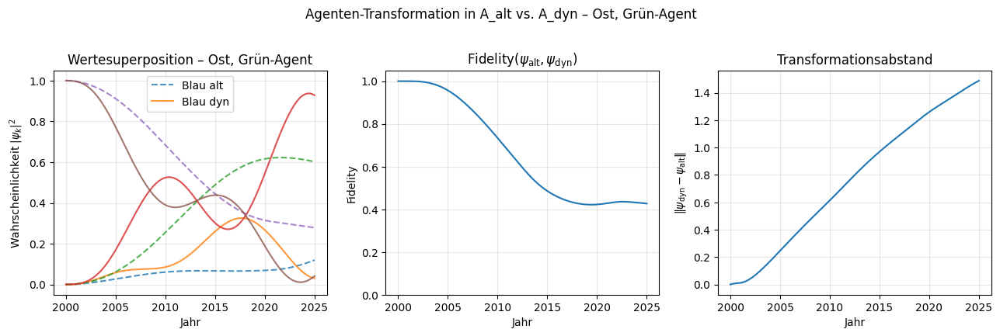


=== Agentensimulation: Region West, Blau-Agent ===


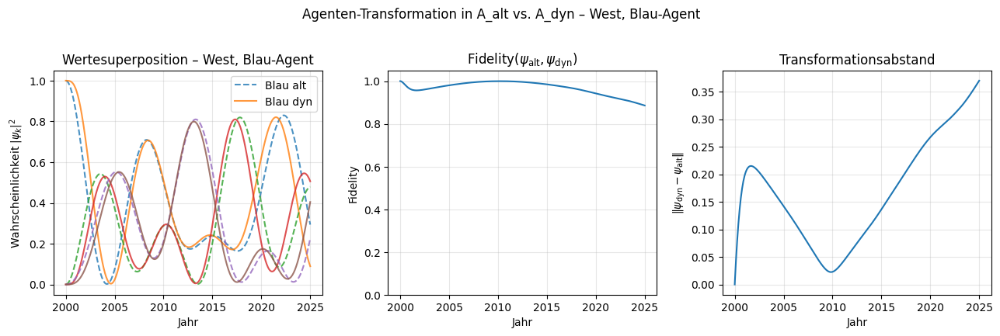


=== Agentensimulation: Region West, Orange-Agent ===


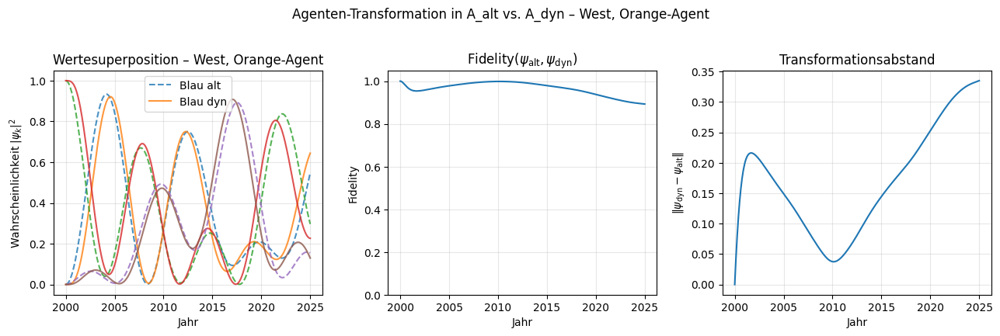


=== Agentensimulation: Region West, Grün-Agent ===


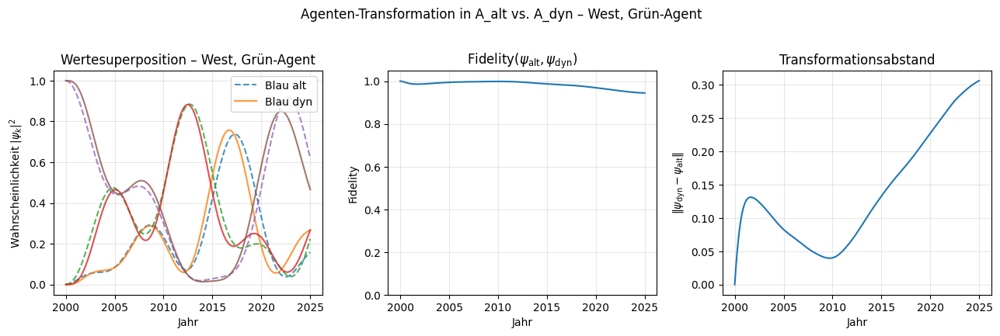

In [87]:
# =============================================================================
# ADD-ON: Agenten-Superposition in alten vs. dynamischen Feldern (Ost/West)
# - nutzt ost_west_results aus run_ost_west_addon()
# - simuliert ψ_alt(t) und ψ_dyn(t) für Agenten in A_alt^s(t) bzw. A_dyn^s(t)
# - gibt Wertesuperpositionen, Fidelity und Distanz aus
# =============================================================================

def _interpolate_A_vector(t, t_grid, A_array):
    """
    Einfache lineare Interpolation eines 8D-Feldes A_array(t) auf Zeitpunkt t.
    t_grid : 1D-Array der Zeitpunkte
    A_array: shape (T, 8)
    Rückgabe: A(t) als 8D-Array.
    """
    # np.interp arbeitet 1D -> pro Komponente aufrufen
    comps = [np.interp(t, t_grid, A_array[:, a]) for a in range(8)]
    return np.array(comps, dtype=float)


def _agent_rhs_field(t, psi_flat, t_grid, A_array):
    """
    Rechte Seite der Schrödingergleichung für einen Agenten in einem
    zeitabhängigen Feld A_array(t):
        dψ/dt = -i H[A(t)] ψ
        H(t) = sum_a A^a(t) L_a
    psi_flat: Länge-6-Realvektor (Re[ψ], Im[ψ])
    """
    psi = psi_flat[:3] + 1j * psi_flat[3:]
    A_vec = _interpolate_A_vector(t, t_grid, A_array)

    H = np.zeros((3, 3), dtype=complex)
    for a in range(8):
        H += A_vec[a] * generators[a]

    dpsi = -1j * H @ psi
    return np.concatenate([dpsi.real, dpsi.imag])


def evolve_agent_in_field(t_eval, A_array, psi0):
    """
    Lässt einen Agenten mit Startzustand psi0 in einem Feld A_array(t) evolvieren.
    t_eval : Zeitachse
    A_array: shape (T, 8)
    psi0   : C^3-Vektor (Blau, Orange, Grün)
    Rückgabe:
      psi_t : shape (T, 3) komplex
    """
    t0, t1 = float(t_eval[0]), float(t_eval[-1])
    y0 = np.concatenate([psi0.real, psi0.imag])

    sol = solve_ivp(
        _agent_rhs_field,
        (t0, t1),
        y0,
        t_eval=t_eval,
        args=(t_eval, A_array),
        method="DOP853",
        rtol=1e-8,
        atol=1e-10
    )
    psi_t = sol.y[:3, :] + 1j * sol.y[3:, :]
    # Normierung sichern
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    psi_t = (psi_t / norms).T  # (T,3)
    return psi_t


def compare_agent_alt_vs_dyn_region(region_label, region_data,
                                    psi0, psi_name="Agent"):
    """
    Vergleicht für eine Region (z.B. 'Ost' oder 'West') die Agentendynamik in:
      - A_alt^s(t)  (empirisches Feld)
      - A_dyn^s(t)  (dynamisches, transformiertes Feld)
    region_data: Eintrag aus ost_west_results[region_label]
                 erwartet keys: 't_eval', 'A_alt', 'A_dyn'
    psi0       : Startzustand des Agenten (3er-Komplexvektor)
    psi_name   : sprechender Name (z.B. 'Blau-Agent')

    Erzeugt eine Figur mit:
      1) Wertesuperposition (|ψ|^2) alt vs dyn
      2) Fidelity(t)
      3) Norm ||ψ_dyn - ψ_alt||
    """
    t_eval = region_data["t_eval"]
    A_alt  = region_data["A_alt"]
    A_dyn  = region_data["A_dyn"]

    # Dynamik berechnen
    psi_alt = evolve_agent_in_field(t_eval, A_alt, psi0)
    psi_dyn = evolve_agent_in_field(t_eval, A_dyn, psi0)

    # Wahrscheinlichkeiten / Wertanteile
    probs_alt = np.abs(psi_alt) ** 2  # (T,3)
    probs_dyn = np.abs(psi_dyn) ** 2

    # Fidelity und Distanz
    inner = np.sum(np.conj(psi_alt) * psi_dyn, axis=1)
    fidelity = np.abs(inner) ** 2
    diff_norm = np.linalg.norm(psi_dyn - psi_alt, axis=1)

    # Plot
    plt.figure(figsize=(13, 4.2))

    # 1) Wertesuperposition
    plt.subplot(1, 3, 1)
    labels = ["Blau", "Orange", "Grün"]
    for k in range(3):
        plt.plot(t_eval, probs_alt[:, k], linestyle="--", alpha=0.8,
                 label=f"{labels[k]} alt" if k == 0 else None)
        plt.plot(t_eval, probs_dyn[:, k], linestyle="-", alpha=0.8,
                 label=f"{labels[k]} dyn" if k == 0 else None)
    plt.xlabel("Jahr")
    plt.ylabel(r"Wahrscheinlichkeit $|\psi_k|^2$")
    plt.title(f"Wertesuperposition – {region_label}, {psi_name}")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # 2) Fidelity
    plt.subplot(1, 3, 2)
    plt.plot(t_eval, fidelity)
    plt.xlabel("Jahr")
    plt.ylabel("Fidelity")
    plt.ylim(0, 1.05)
    plt.title(r"Fidelity($\psi_\mathrm{alt}, \psi_\mathrm{dyn}$)")
    plt.grid(True, alpha=0.3)

    # 3) Distanznorm
    plt.subplot(1, 3, 3)
    plt.plot(t_eval, diff_norm)
    plt.xlabel("Jahr")
    plt.ylabel(r"$\|\psi_\mathrm{dyn}-\psi_\mathrm{alt}\|$")
    plt.title("Transformationsabstand")
    plt.grid(True, alpha=0.3)

    plt.suptitle(f"Agenten-Transformation in A_alt vs. A_dyn – {region_label}, {psi_name}",
                 fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()

    return dict(
        t_eval=t_eval,
        psi_alt=psi_alt,
        psi_dyn=psi_dyn,
        fidelity=fidelity,
        diff_norm=diff_norm
    )


def run_agent_transform_ost_west(ost_west_results):
    """
    Komfortfunktion:
      - Nimmt das Dict aus run_ost_west_addon()
      - Simuliert für Ost und West je drei Startzustände:
          * Blau-Agent   ψ0 = (1,0,0)
          * Orange-Agent ψ0 = (0,1,0)
          * Grün-Agent   ψ0 = (0,0,1)
      - erzeugt für jede Region & Agent separate Plots.

    Rückgabe: dict[Region][Agentenname] -> Ergebnisdict aus compare_agent_alt_vs_dyn_region
    """
    if ost_west_results is None:
        print("[run_agent_transform_ost_west] Keine ost_west_results übergeben.")
        return {}

    initial_states = [
        (np.array([1.0, 0.0, 0.0], dtype=complex), "Blau-Agent"),
        (np.array([0.0, 1.0, 0.0], dtype=complex), "Orange-Agent"),
        (np.array([0.0, 0.0, 1.0], dtype=complex), "Grün-Agent"),
    ]

    results_agents = {}
    for region_label in ["Ost", "West"]:
        if region_label not in ost_west_results:
            print(f"[run_agent_transform_ost_west] Region '{region_label}' nicht in Ergebnissen.")
            continue
        region_data = ost_west_results[region_label]
        region_res = {}
        for psi0, psi_name in initial_states:
            print(f"\n=== Agentensimulation: Region {region_label}, {psi_name} ===")
            res = compare_agent_alt_vs_dyn_region(region_label, region_data, psi0, psi_name)
            region_res[psi_name] = res
        results_agents[region_label] = region_res

    return results_agents

agent_results = run_agent_transform_ost_west(ost_west_results)



Transformationsindex – Region: Ost

  Agent: Blau-Agent
    ⟨Fidelity⟩        = 0.4258
    ⟨‖ψ_dyn-ψ_alt‖⟩  = 0.9452
    Transformationsindex T = 1 - ⟨F⟩ = 0.5742

  Agent: Orange-Agent
    ⟨Fidelity⟩        = 0.4423
    ⟨‖ψ_dyn-ψ_alt‖⟩  = 0.9512
    Transformationsindex T = 1 - ⟨F⟩ = 0.5577

  Agent: Grün-Agent
    ⟨Fidelity⟩        = 0.6635
    ⟨‖ψ_dyn-ψ_alt‖⟩  = 0.7625
    Transformationsindex T = 1 - ⟨F⟩ = 0.3365


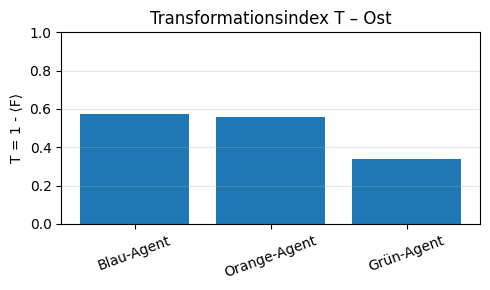


Transformationsindex – Region: West

  Agent: Blau-Agent
    ⟨Fidelity⟩        = 0.9679
    ⟨‖ψ_dyn-ψ_alt‖⟩  = 0.1686
    Transformationsindex T = 1 - ⟨F⟩ = 0.0321

  Agent: Orange-Agent
    ⟨Fidelity⟩        = 0.9646
    ⟨‖ψ_dyn-ψ_alt‖⟩  = 0.1699
    Transformationsindex T = 1 - ⟨F⟩ = 0.0354

  Agent: Grün-Agent
    ⟨Fidelity⟩        = 0.9833
    ⟨‖ψ_dyn-ψ_alt‖⟩  = 0.1388
    Transformationsindex T = 1 - ⟨F⟩ = 0.0167


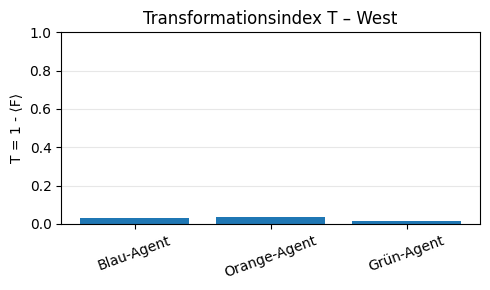

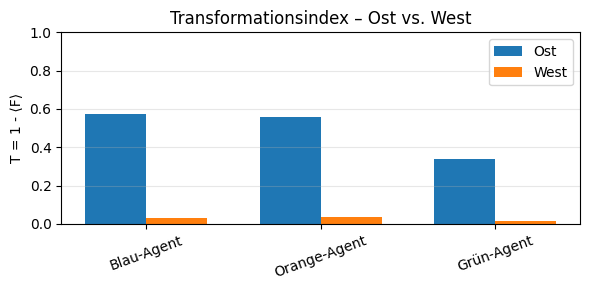

In [88]:
# =============================================================================
# ADD-ON: Transformationsindex aus Agenten-Fidelity und Δψ-Norm
# - nutzt agent_results aus run_agent_transform_ost_west(...)
# - berechnet pro Region & Agententyp:
#     * mittlere Fidelity ⟨F⟩
#     * mittlere Distanznorm ⟨‖ψ_dyn - ψ_alt‖⟩
#     * Transformationsindex T = 1 - ⟨F⟩
# - optional: Balkenplots
# =============================================================================

def compute_transform_index(agent_results, make_plots=True):
    """
    agent_results: Dict aus run_agent_transform_ost_west(...)
        Struktur:
          agent_results[Region][Agentenname] -> dict mit keys 'fidelity', 'diff_norm', ...

    Gibt eine Konsolenübersicht aus und (optional) einfache Balkendiagramme.
    Rückgabe:
      summary: dict[Region][Agentenname] -> dict mit 'F_mean', 'D_mean', 'T_index'
    """
    if not agent_results:
        print("[compute_transform_index] Keine agent_results übergeben.")
        return {}

    summary = {}
    for region_label, agents_dict in agent_results.items():
        print("\n========================================================")
        print(f"Transformationsindex – Region: {region_label}")
        print("========================================================")

        region_summary = {}
        for agent_name, data in agents_dict.items():
            fidelity = np.asarray(data["fidelity"])
            diff_norm = np.asarray(data["diff_norm"])

            F_mean = float(np.mean(fidelity))
            D_mean = float(np.mean(diff_norm))
            T_index = 1.0 - F_mean  # 0 = keine Änderung, 1 = maximaler Bruch

            region_summary[agent_name] = dict(
                F_mean=F_mean,
                D_mean=D_mean,
                T_index=T_index
            )

            print(f"\n  Agent: {agent_name}")
            print(f"    ⟨Fidelity⟩        = {F_mean:.4f}")
            print(f"    ⟨‖ψ_dyn-ψ_alt‖⟩  = {D_mean:.4f}")
            print(f"    Transformationsindex T = 1 - ⟨F⟩ = {T_index:.4f}")

        summary[region_label] = region_summary

        if make_plots:
            # Balkenplot pro Region: T-Index je Agent
            agent_names = list(region_summary.keys())
            T_vals = [region_summary[name]["T_index"] for name in agent_names]

            plt.figure(figsize=(5, 3))
            x = np.arange(len(agent_names))
            plt.bar(x, T_vals)
            plt.xticks(x, agent_names, rotation=20)
            plt.ylabel("T = 1 - ⟨F⟩")
            plt.ylim(0.0, 1.0)
            plt.title(f"Transformationsindex T – {region_label}")
            plt.grid(True, axis="y", alpha=0.3)
            plt.tight_layout()
            plt.show()

    # Optional: Vergleich Ost vs. West als zusammengefasster Plot
    if make_plots and "Ost" in summary and "West" in summary:
        plt.figure(figsize=(6, 3))
        agent_names = list(summary["Ost"].keys())
        x = np.arange(len(agent_names))

        T_ost = [summary["Ost"][name]["T_index"] for name in agent_names]
        T_west = [summary["West"][name]["T_index"] for name in agent_names]

        width = 0.35
        plt.bar(x - width/2, T_ost, width, label="Ost")
        plt.bar(x + width/2, T_west, width, label="West")

        plt.xticks(x, agent_names, rotation=20)
        plt.ylabel("T = 1 - ⟨F⟩")
        plt.ylim(0.0, 1.0)
        plt.title("Transformationsindex – Ost vs. West")
        plt.legend()
        plt.grid(True, axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()

    return summary

transform_summary = compute_transform_index(agent_results, make_plots=True)


In [89]:
# =============================================================================
# ADD-ON: Voll gekoppelte Mean-Field-Dynamik A(t) + 3 Archetypen ψ_i(t)
# - Region s ∈ {-1, 0, +1} (Ost/Mitte/West)
# - Zustand Y(t) = [A^1..A^8, Re ψ_B, Im ψ_B, Re ψ_O, Im ψ_O, Re ψ_G, Im ψ_G]
# - Feld-ODE:   dA/dt = qsd_field_rhs_region(...) + lambda_c * (A_agents - A)
# - Agenten-ODE: dψ_i/dt = -i H(A_eff) ψ_i,  A_eff = A + kappa * A_agents
# - A_agents^a = Σ_i w_i ⟨L_a⟩_i,  ⟨L_a⟩_i = ψ_i† L_a ψ_i
# =============================================================================

def _unpack_state_Y(Y):
    """
    Hilfsfunktion: Zustand Y in Feld A und 3 Agenten ψ_B, ψ_O, ψ_G zerlegen.
    Y: 1D-Array der Länge 26
    Rückgabe:
      A        : shape (8,)
      psi_list : [ψ_B, ψ_O, ψ_G], je shape (3,) komplex
    """
    A = Y[:8]
    psi_list = []
    offset = 8
    for _ in range(3):  # drei Archetypen
        re = Y[offset:offset+3]
        im = Y[offset+3:offset+6]
        psi = re + 1j * im
        psi_list.append(psi)
        offset += 6
    return A, psi_list


def _pack_state_dY(dA, dpsi_list):
    """
    Umkehrfunktion zu _unpack_state_Y:
      dA        : shape (8,)
      dpsi_list : Liste von 3 komplexen 3-Vektoren
    Rückgabe:
      dY: 1D-Array der Länge 26
    """
    parts = []
    parts.extend(dA.tolist())
    for dpsi in dpsi_list:
        parts.extend(dpsi.real.tolist())
        parts.extend(dpsi.imag.tolist())
    return np.array(parts, dtype=float)


def _agent_meanfield(psi_list, weights=None):
    """
    Berechnet das Agenten-Mean-Field:
      A_agents^a = Σ_i w_i ⟨L_a⟩_i
    psi_list: Liste von 3 ψ_i (Blau/Orange/Grün)
    weights : length-3-Array, Standard: gleiche Gewichte
    Rückgabe:
      A_agents: shape (8,) float
    """
    if weights is None:
        weights = np.ones(len(psi_list), dtype=float) / len(psi_list)
    A_agents = np.zeros(8, dtype=float)
    for w, psi in zip(weights, psi_list):
        for a in range(8):
            val = np.vdot(psi, generators[a] @ psi)  # ψ† L_a ψ
            A_agents[a] += w * float(val.real)
    return A_agents


def coupled_rhs_region(t, Y, s,
                       g=1.0, gamma=0.3, beta=3.0,
                       alpha1=0.35, alpha0=0.20,
                       lambda_c=0.3,   # Feld hört auf Agenten
                       kappa=0.3,      # Agenten spüren Agenten-Mean-Field
                       agent_weights=None):
    """
    Voll gekoppelte rechte Seite:
      - Feld A(t):  dA/dt = qsd_field_rhs_region(t, A, s, ...) + lambda_c (A_agents - A)
      - Agenten ψ_i(t): dψ_i/dt = -i H(A_eff) ψ_i, H = Σ_a A_eff^a L_a
      - A_eff = A + kappa * A_agents
    Y: 1D-Array der Länge 26 (A + 3 Agenten)
    s: -1 (Ost), 0 (Mitte), +1 (West)
    """
    # 1) Zustand auspacken
    A, psi_list = _unpack_state_Y(Y)

    # 2) Agenten-Mean-Field berechnen
    A_agents = _agent_meanfield(psi_list, weights=agent_weights)

    # 3) Basis-Feldableitung ohne Rückkopplung (wie bisher)
    dA_macro = qsd_field_rhs_region(
        t, A, s,
        g=g, gamma=gamma, beta=beta,
        alpha1=alpha1, alpha0=alpha0
    )

    # 4) Selbstkonsistenz: Feld zieht Richtung Agentenmeanfield
    dA = dA_macro + lambda_c * (A_agents - A)

    # 5) Effektives Feld für Agenten
    A_eff = A + kappa * A_agents

    # 6) Hamiltonoperator H(A_eff)
    H = np.zeros((3, 3), dtype=complex)
    for a in range(8):
        H += A_eff[a] * generators[a]

    # 7) Agentenentwicklung
    dpsi_list = []
    for psi in psi_list:
        dpsi = -1j * (H @ psi)
        dpsi_list.append(dpsi)

    # 8) Alles wieder zusammenpacken
    dY = _pack_state_dY(dA, dpsi_list)
    return dY


def simulate_coupled_region(s, label,
                            g=1.0, gamma=0.3, beta=3.0,
                            alpha1=0.35, alpha0=0.20,
                            lambda_c=0.3, kappa=0.3,
                            agent_weights=None,
                            t0=2000.0, t1=2025.0, n_eval=400):
    """
    Simuliert die voll gekoppelte Dynamik für eine Region:
      s     : -1 (Ost), 0 (Mitte), +1 (West)
      label : Name der Region (z.B. 'Ost' oder 'West')

    Rückgabe:
      t_eval   : Zeitgitter
      A_traj   : shape (T, 8)
      psi_traj : dict mit 'Blau', 'Orange', 'Grün' -> shape (T, 3) komplex
    """
    if agent_weights is None:
        agent_weights = np.ones(3, dtype=float) / 3.0

    # Zeitgitter
    t_eval = np.linspace(t0, t1, n_eval)

    # Initialbedingungen:
    # Feld: kleine Startamplitude
    A0 = 0.02 * np.ones(8, dtype=float)

    # Agenten: reine Blau/Orange/Grün-Zustände
    psi_B0 = np.array([1.0, 0.0, 0.0], dtype=complex)
    psi_O0 = np.array([0.0, 1.0, 0.0], dtype=complex)
    psi_G0 = np.array([0.0, 0.0, 1.0], dtype=complex)

    Y0 = []
    Y0.extend(A0.tolist())
    for psi0 in [psi_B0, psi_O0, psi_G0]:
        Y0.extend(psi0.real.tolist())
        Y0.extend(psi0.imag.tolist())
    Y0 = np.array(Y0, dtype=float)

    # ODE lösen
    sol = solve_ivp(
        coupled_rhs_region,
        (t0, t1),
        Y0,
        t_eval=t_eval,
        args=(s, g, gamma, beta, alpha1, alpha0, lambda_c, kappa, agent_weights),
        method="DOP853",
        rtol=1e-7,
        atol=1e-9
    )

    Y_t = sol.y.T  # shape (T, 26)
    # A und ψ auspacken
    A_traj = np.zeros((len(t_eval), 8), dtype=float)
    psi_B_traj = np.zeros((len(t_eval), 3), dtype=complex)
    psi_O_traj = np.zeros((len(t_eval), 3), dtype=complex)
    psi_G_traj = np.zeros((len(t_eval), 3), dtype=complex)

    for k in range(len(t_eval)):
        A_k, psi_list_k = _unpack_state_Y(Y_t[k])
        A_traj[k, :] = A_k
        psi_B_traj[k, :] = psi_list_k[0]
        psi_O_traj[k, :] = psi_list_k[1]
        psi_G_traj[k, :] = psi_list_k[2]

    psi_traj = {
        "Blau-Agent": psi_B_traj,
        "Orange-Agent": psi_O_traj,
        "Grün-Agent": psi_G_traj
    }

    # Optionale Diagnoseplots
    try:
        E8 = np.array([octet_energy_from_A(A_traj[k]) for k in range(len(t_eval))])
        S  = np.array([singlet_order_from_E(E8[k], alpha=0.7) for k in range(len(t_eval))])
    except NameError:
        E8 = None
        S  = None

    plt.figure(figsize=(12, 4))
    A_norm = np.linalg.norm(A_traj, axis=1)
    plt.plot(t_eval, A_norm, label=r"$\|A(t)\|$")
    if E8 is not None:
        plt.plot(t_eval, E8, linestyle="--", label=r"$E_8(t)$")
    if S is not None:
        plt.plot(t_eval, S, linestyle=":", label=r"$S(t)$")
    plt.xlabel("Jahr")
    plt.title(f"gekoppeltes Feld A(t) – {label}")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Agenten-Wertanteile
    for name, psi_tr in psi_traj.items():
        probs = np.abs(psi_tr)**2
        plt.figure(figsize=(10, 3))
        for k,colorlabel in enumerate(["Blau", "Orange", "Grün"]):
            plt.plot(t_eval, probs[:, k], label=colorlabel)
        plt.xlabel("Jahr")
        plt.ylabel(r"$|\psi_k|^2$")
        plt.title(f"Wertesuperposition – {label}, {name} (gekoppelt)")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return t_eval, A_traj, psi_traj



Gekoppelte Simulation: Ost (gekoppelt)


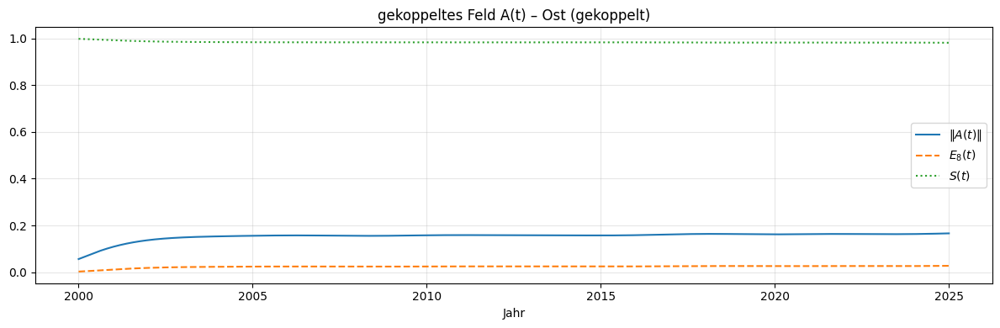

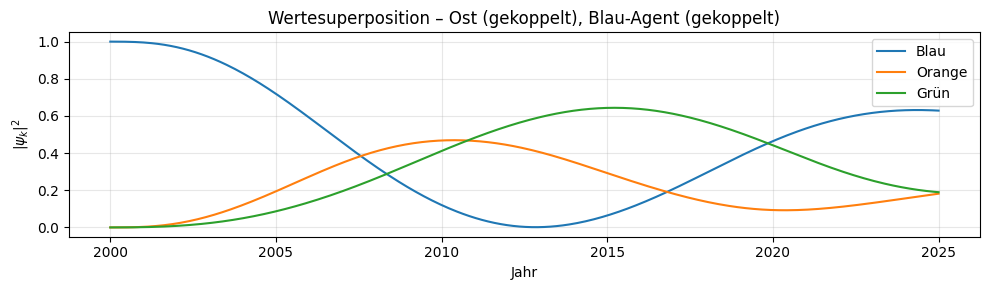

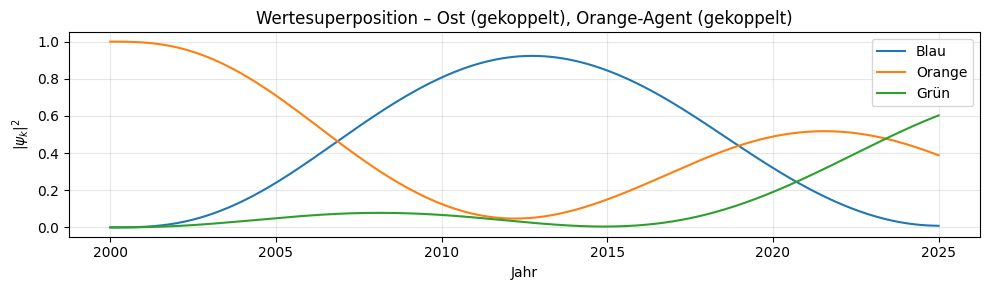

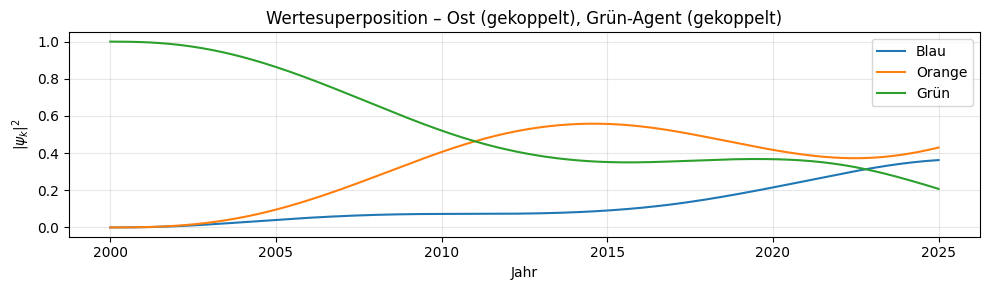


Gekoppelte Simulation: West (gekoppelt)


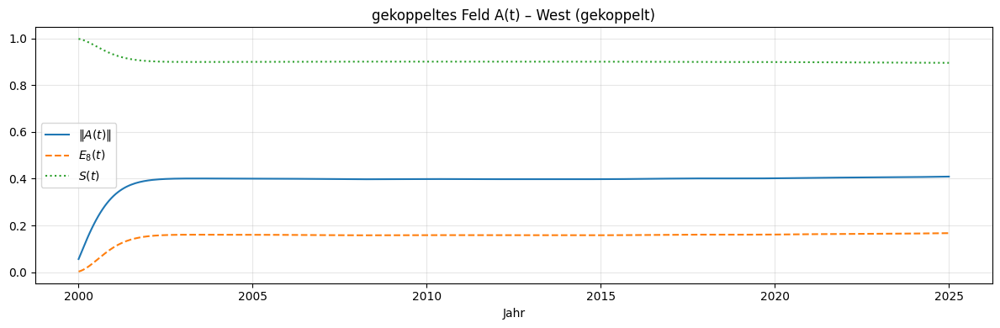

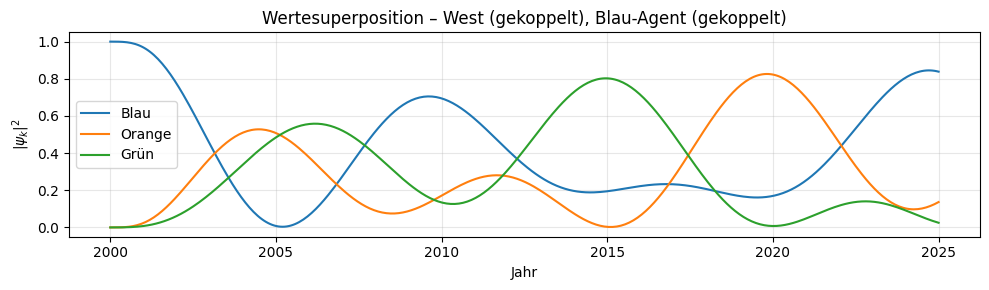

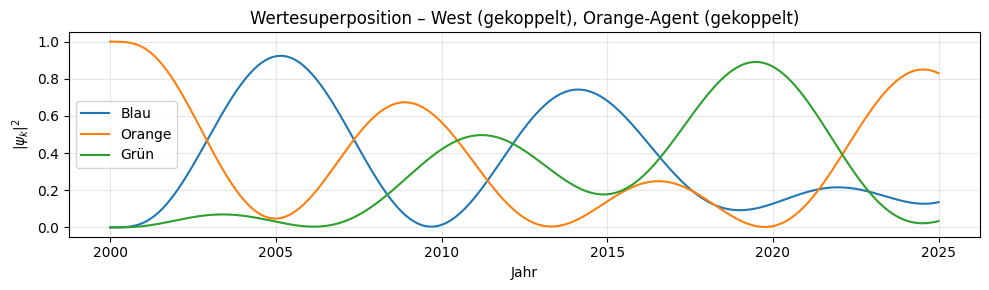

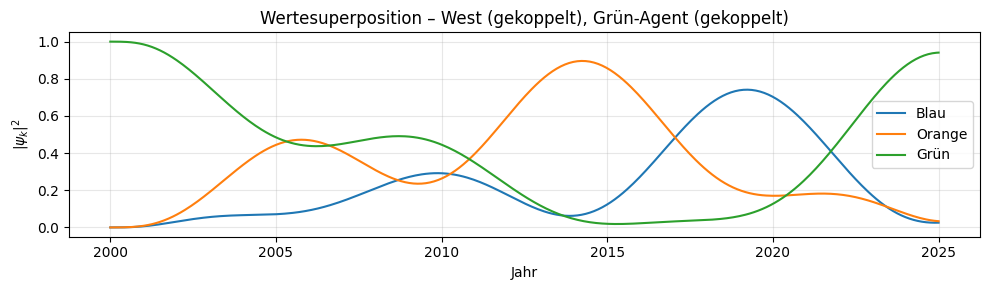

In [90]:
if __name__ == "__main__":
    # Gekoppelte Dynamik für Ost (s=-1) und West (s=+1)
    for s, label in [(-1.0, "Ost (gekoppelt)"), (+1.0, "West (gekoppelt)")]:
        print("\n==============================")
        print("Gekoppelte Simulation:", label)
        print("==============================")
        t_eval, A_traj, psi_traj = simulate_coupled_region(
            s, label,
            g=1.0, gamma=0.3, beta=3.0,
            alpha1=0.35, alpha0=0.20,
            lambda_c=0.3,  # wie stark das Feld auf Agenten hört
            kappa=0.3,     # wie stark Agenten A_agents im Hamilton spüren
            t0=2000.0, t1=2025.0, n_eval=400
        )



=== Vergleich A-Felder für Region: Ost ===


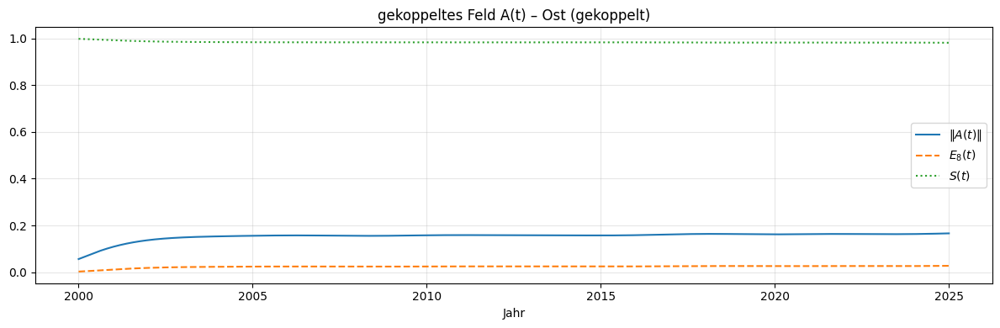

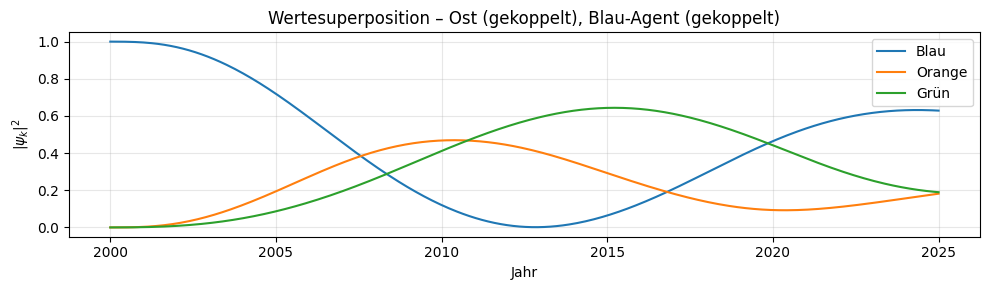

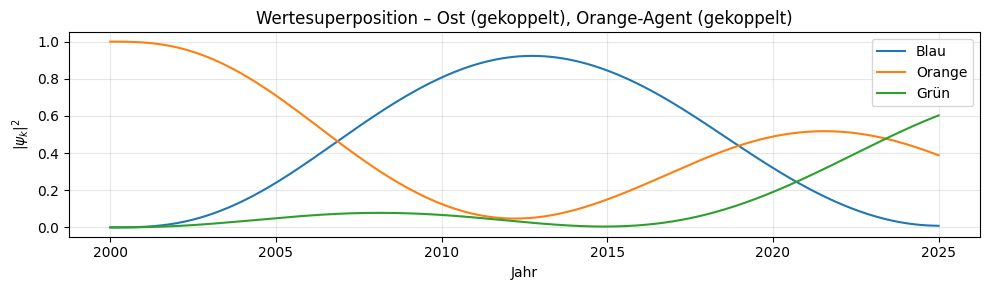

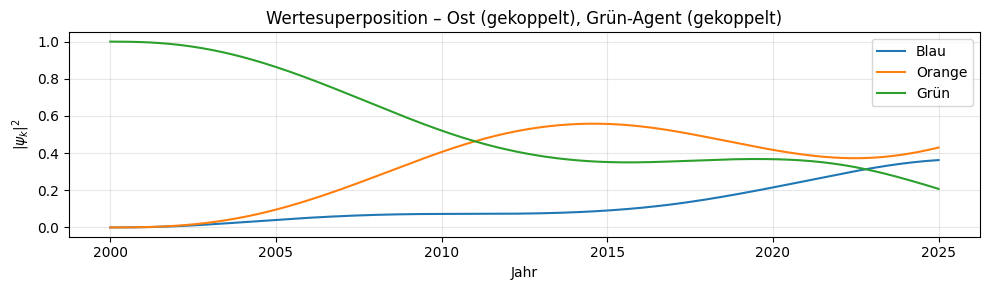

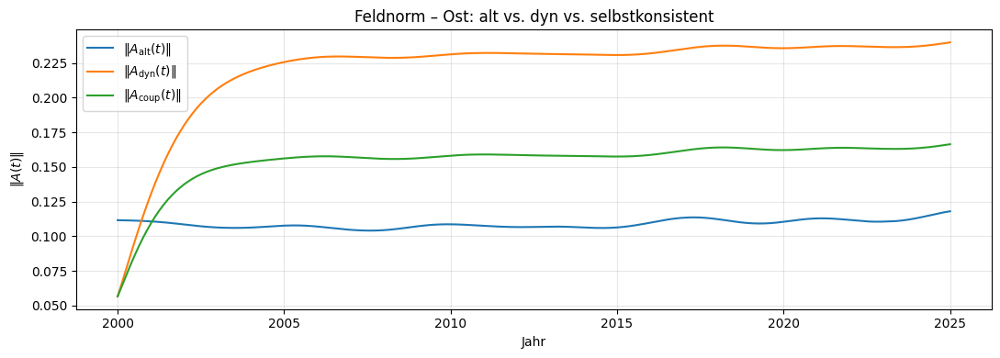

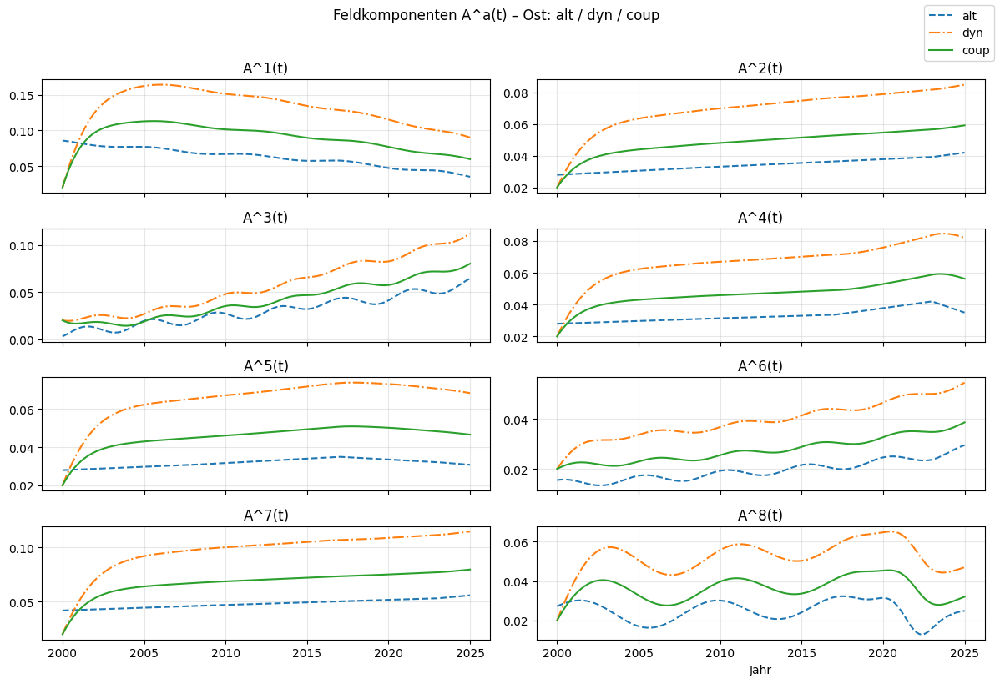


=== Vergleich A-Felder für Region: West ===


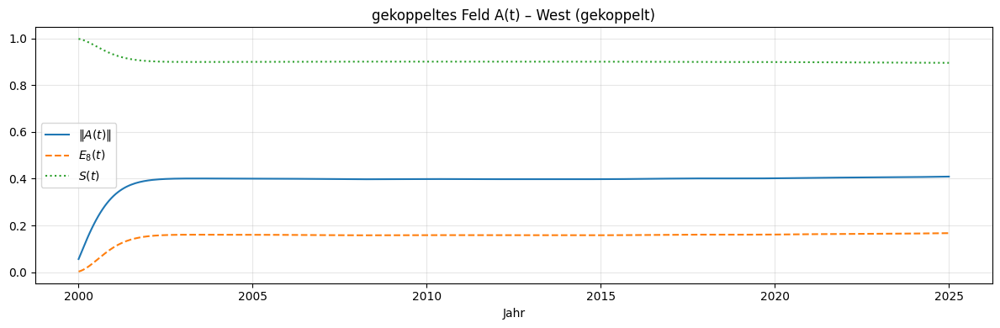

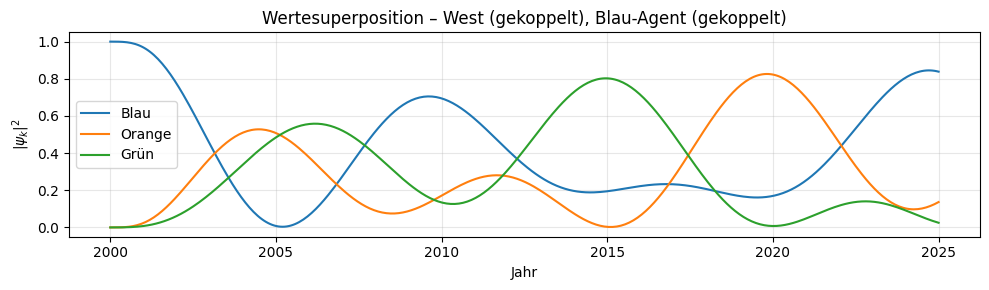

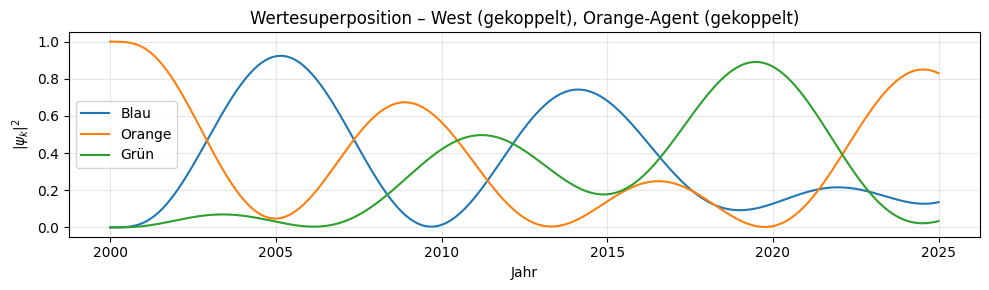

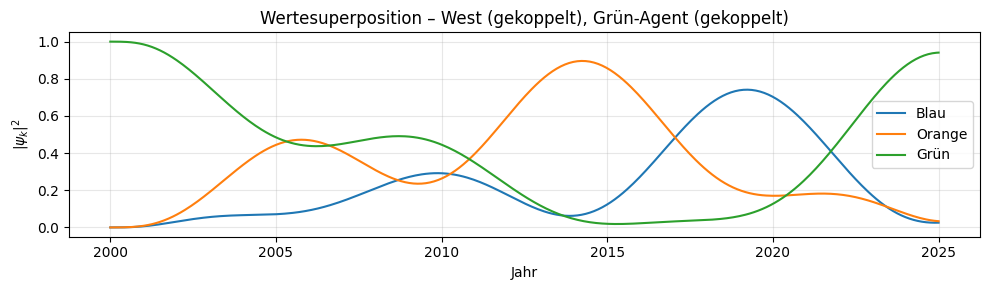

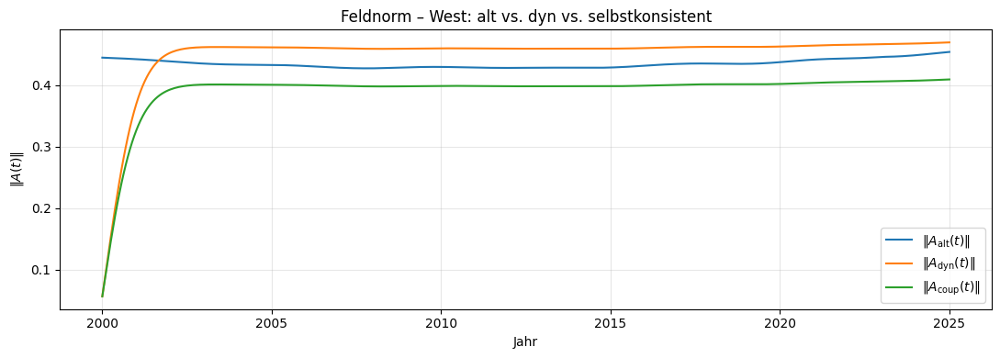

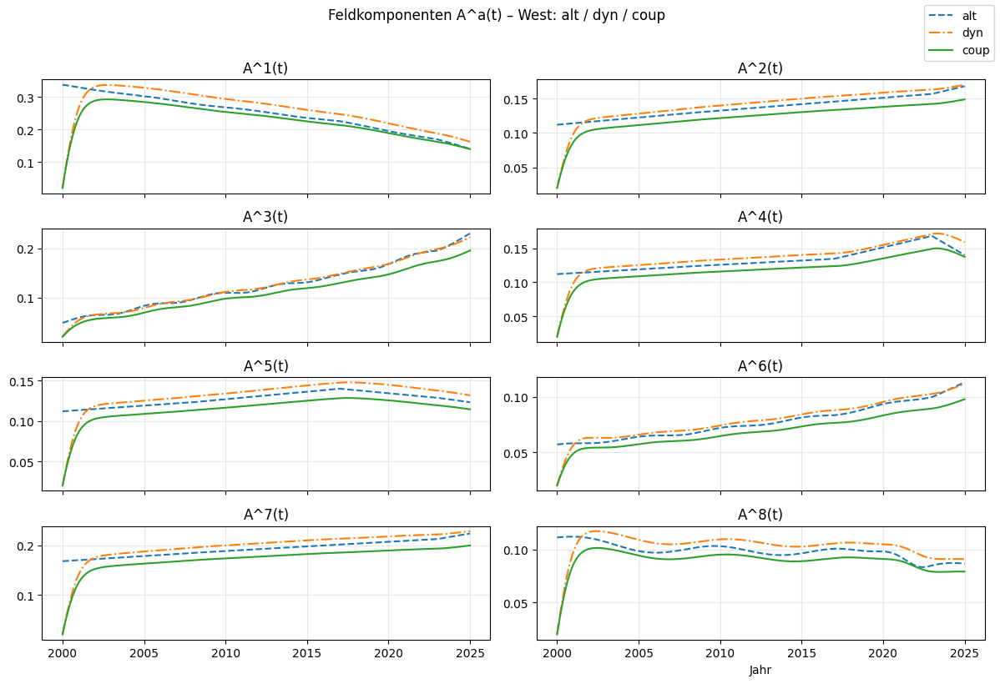

In [91]:
# =============================================================================
# ADD-ON: Vergleich der drei Felder A_alt, A_dyn, A_coup über die Zeit
# - nutzt:
#     * ost_west_results aus run_ost_west_addon(...)
#     * simulate_coupled_region(...) für das selbstkonsistente Feld
# - erzeugt für Ost & West:
#     1) Normverlauf ||A(t)|| für alt/dyn/coup
#     2) Komponentenplots A^a(t) (a=1..8) für alt/dyn/coup
# =============================================================================

def compare_A_fields_ost_west(ost_west_results,
                              g=1.0, gamma=0.3, beta=3.0,
                              alpha1=0.35, alpha0=0.20,
                              lambda_c=0.3, kappa=0.3):
    """
    ost_west_results: Dict aus run_ost_west_addon(...)
                      erwartet keys:
                        region_label -> {
                           "t_eval": (T,),
                           "A_alt": (T,8),
                           "A_dyn": (T,8),
                           ...
                        }

    Für jede Region (Ost, West) wird zusätzlich simulate_coupled_region(...)
    aufgerufen, um das selbstkonsistente Feld A_coup(t) zu ermitteln.
    Dann werden:
      - Normen ||A(t)|| (alt/dyn/coup)
      - Komponenten A^a(t) (a=1..8) alt/dyn/coup
    geplottet.
    """
    if ost_west_results is None or not ost_west_results:
        print("[compare_A_fields_ost_west] Keine ost_west_results übergeben.")
        return

    # Zuordnung Regionlabel -> s
    region_s_map = {"Ost": -1.0, "Mitte": 0.0, "West": +1.0}

    for region_label in ["Ost", "West"]:
        if region_label not in ost_west_results:
            print(f"[compare_A_fields_ost_west] Region '{region_label}' nicht in ost_west_results.")
            continue

        data = ost_west_results[region_label]
        t_eval = np.asarray(data["t_eval"])
        A_alt  = np.asarray(data["A_alt"])   # (T,8)
        A_dyn  = np.asarray(data["A_dyn"])   # (T,8)

        T = len(t_eval)
        t0, t1 = float(t_eval[0]), float(t_eval[-1])

        # selbstkonsistentes Feld für dieselbe Zeitauflösung berechnen
        s = region_s_map[region_label]
        # label etwas kompakter, damit der Plot-Titel nicht zu lang wird
        sc_label = f"{region_label} (gekoppelt)"
        print(f"\n=== Vergleich A-Felder für Region: {region_label} ===")

        t_eval_c, A_coup, psi_traj_c = simulate_coupled_region(
            s, sc_label,
            g=g, gamma=gamma, beta=beta,
            alpha1=alpha1, alpha0=alpha0,
            lambda_c=lambda_c, kappa=kappa,
            t0=t0, t1=t1, n_eval=T
        )

        # Sicherstellen, dass Zeitachsen kompatibel sind (beide linear)
        # Für die Plots verwenden wir einfach t_eval (sie sind praktisch identisch)
        # Normen berechnen
        norm_alt  = np.linalg.norm(A_alt, axis=1)
        norm_dyn  = np.linalg.norm(A_dyn, axis=1)
        norm_coup = np.linalg.norm(A_coup, axis=1)

        # ---------------- Normverlauf: alt vs dyn vs coup ----------------
        plt.figure(figsize=(11, 4))
        plt.plot(t_eval, norm_alt,  label=r"$\|A_\mathrm{alt}(t)\|$")
        plt.plot(t_eval, norm_dyn,  label=r"$\|A_\mathrm{dyn}(t)\|$")
        plt.plot(t_eval, norm_coup, label=r"$\|A_\mathrm{coup}(t)\|$")
        plt.xlabel("Jahr")
        plt.ylabel(r"$\|A(t)\|$")
        plt.title(f"Feldnorm – {region_label}: alt vs. dyn vs. selbstkonsistent")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # ---------------- Komponentenplots A^a(t) -------------------------
        fig, axes = plt.subplots(4, 2, figsize=(12, 8), sharex=True)
        axes = axes.ravel()
        for a in range(8):
            ax = axes[a]
            ax.plot(t_eval, A_alt[:, a],  linestyle="--", label="alt" if a == 0 else None)
            ax.plot(t_eval, A_dyn[:, a],  linestyle="-.", label="dyn" if a == 0 else None)
            ax.plot(t_eval, A_coup[:, a], linestyle="-",  label="coup" if a == 0 else None)
            ax.set_title(f"A^{a+1}(t)")
            ax.grid(True, alpha=0.3)
        axes[-1].set_xlabel("Jahr")
        fig.suptitle(f"Feldkomponenten A^a(t) – {region_label}: alt / dyn / coup", y=1.02)
        handles, labels = axes[0].get_legend_handles_labels()
        if handles:
            fig.legend(handles, labels, loc="upper right")
        plt.tight_layout()
        plt.show()

compare_A_fields_ost_west(
    ost_west_results,
    g=1.0, gamma=0.3, beta=3.0,
    alpha1=0.35, alpha0=0.20,
    lambda_c=0.3, kappa=0.3
)



=== ΔA-Energiefluss – Region: Ost ===


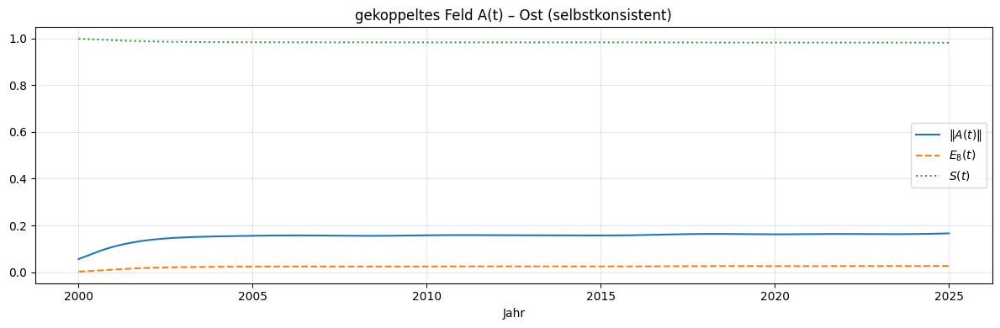

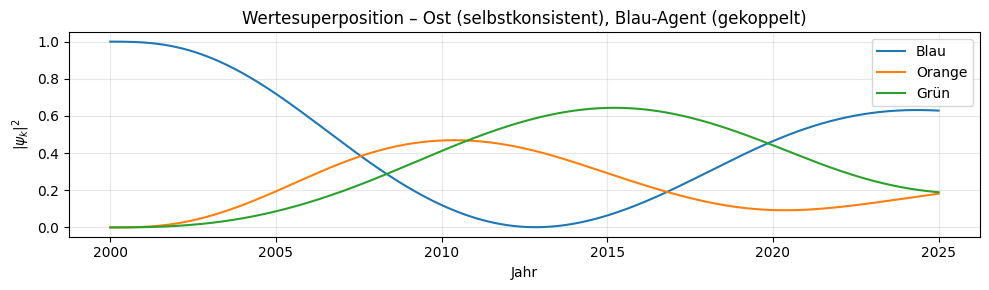

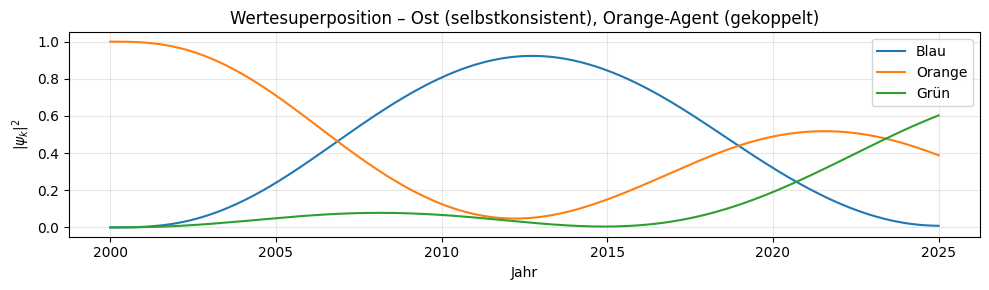

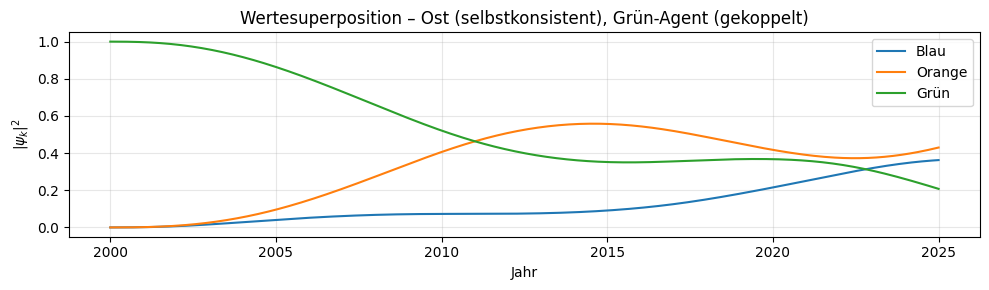

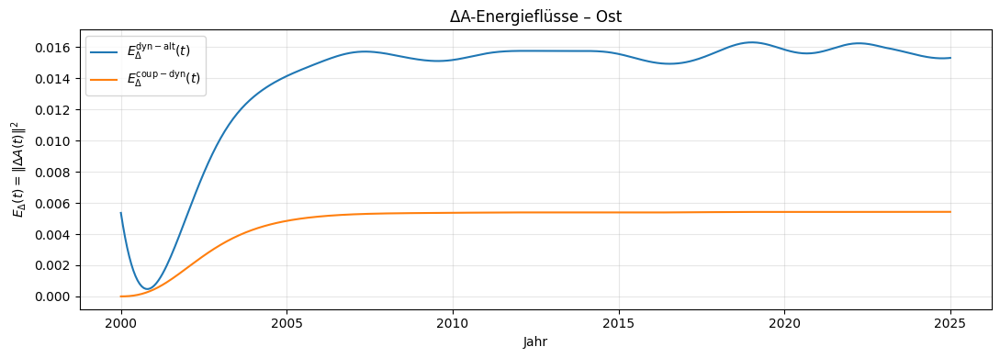

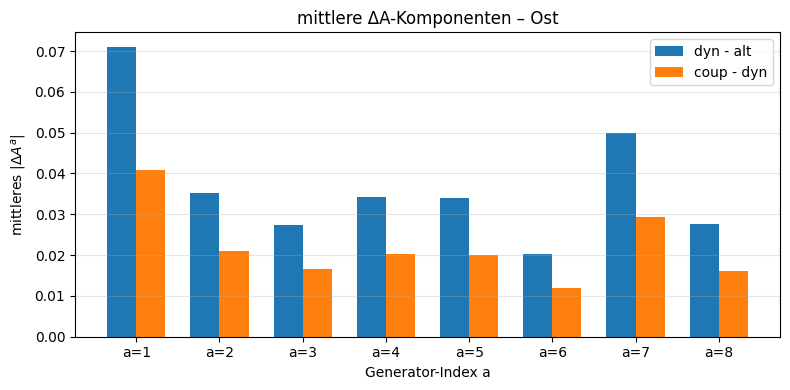

  ⟨E_dyn-alt⟩   = 0.01394
  ⟨E_coup-dyn⟩ = 0.00478
  Top-Komponenten (dyn-alt):
    a=1: ⟨|ΔA^a_dyn-alt|⟩ = 0.0710
    a=7: ⟨|ΔA^a_dyn-alt|⟩ = 0.0498
    a=2: ⟨|ΔA^a_dyn-alt|⟩ = 0.0353
  Top-Komponenten (coup-dyn):
    a=1: ⟨|ΔA^a_coup-dyn|⟩ = 0.0408
    a=7: ⟨|ΔA^a_coup-dyn|⟩ = 0.0294
    a=2: ⟨|ΔA^a_coup-dyn|⟩ = 0.0209

=== ΔA-Energiefluss – Region: West ===


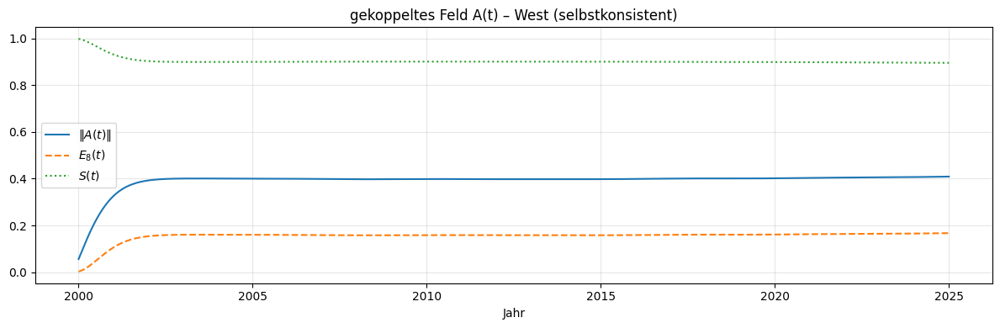

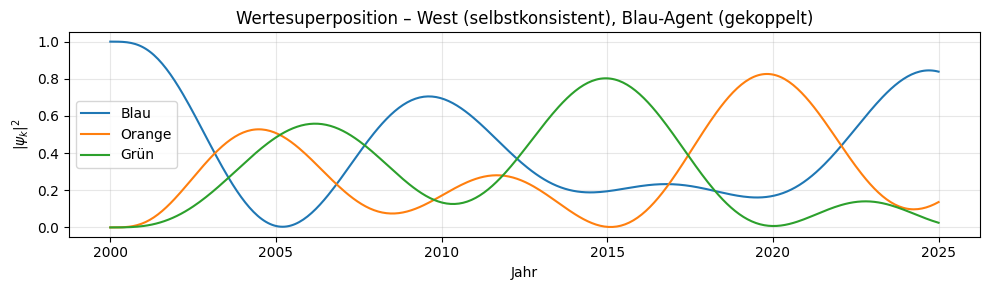

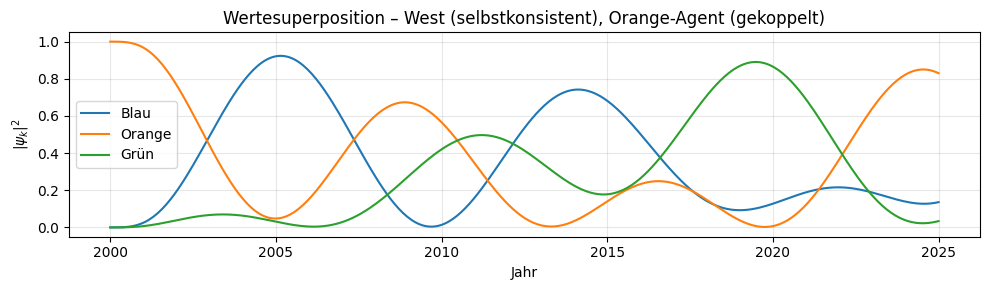

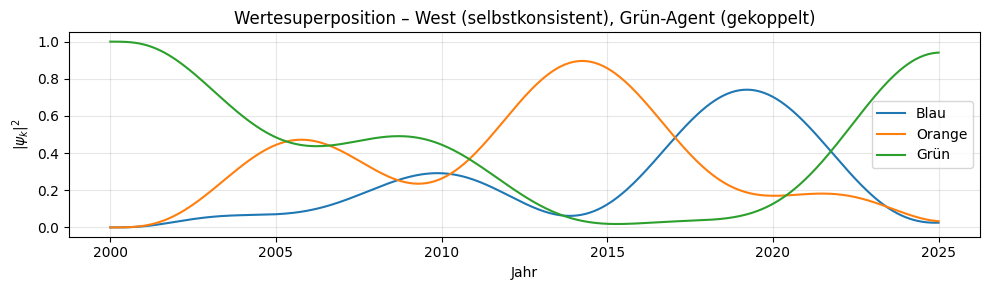

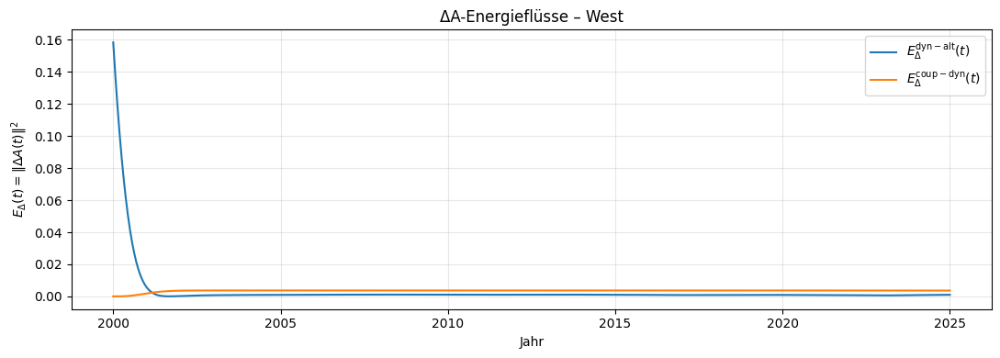

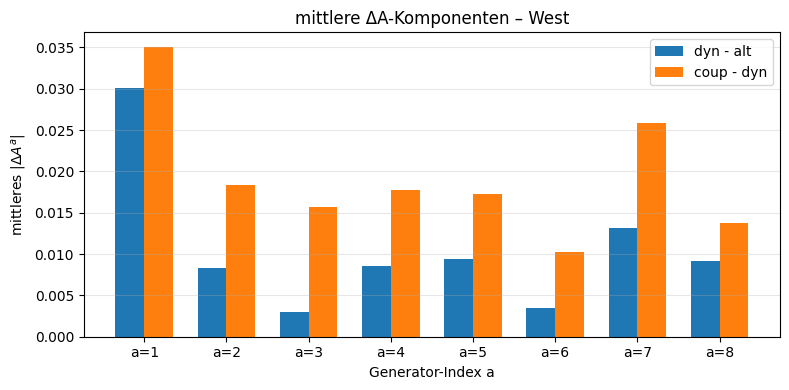

  ⟨E_dyn-alt⟩   = 0.00331
  ⟨E_coup-dyn⟩ = 0.00354
  Top-Komponenten (dyn-alt):
    a=1: ⟨|ΔA^a_dyn-alt|⟩ = 0.0301
    a=7: ⟨|ΔA^a_dyn-alt|⟩ = 0.0131
    a=5: ⟨|ΔA^a_dyn-alt|⟩ = 0.0094
  Top-Komponenten (coup-dyn):
    a=1: ⟨|ΔA^a_coup-dyn|⟩ = 0.0351
    a=7: ⟨|ΔA^a_coup-dyn|⟩ = 0.0258
    a=2: ⟨|ΔA^a_coup-dyn|⟩ = 0.0183


In [92]:
# =============================================================================
# ADD-ON: ΔA-Energieflussanalyse für Ost & West
# - vergleicht:
#     ΔA_dyn-alt(t)  = A_dyn(t)  - A_alt(t)
#     ΔA_coup-dyn(t) = A_coup(t) - A_dyn(t)
# - Energiebeitrag: E_Δ(t) = ||ΔA(t)||^2
# - zusätzlich: zeitlich gemittelte |ΔA^a| pro Generator a=1..8
# =============================================================================

def deltaA_energyflow_ost_west(ost_west_results,
                               g=1.0, gamma=0.3, beta=3.0,
                               alpha1=0.35, alpha0=0.20,
                               lambda_c=0.3, kappa=0.3):
    """
    ost_west_results: Dict aus run_ost_west_addon(...)
      erwartet keys:
        region_label -> {
          "t_eval": (T,),
          "A_alt": (T,8),
          "A_dyn": (T,8),
          ...
        }

    Für jede Region (Ost, West):
      - erzeugt selbstkonsistentes Feld A_coup(t)
      - berechnet:
          ΔA_dyn-alt(t),   E_dyn-alt(t)  = ||ΔA_dyn-alt||^2
          ΔA_coup-dyn(t),  E_coup-dyn(t) = ||ΔA_coup-dyn||^2
      - plottet Energieflüsse über die Zeit
      - plottet zeitlich gemittelte |ΔA^a| pro Generator

    Rückgabe:
      summary: dict[Region] -> dict mit Mittelwerten der Energieflüsse
    """
    if not ost_west_results:
        print("[deltaA_energyflow_ost_west] Keine ost_west_results übergeben.")
        return {}

    region_s_map = {"Ost": -1.0, "Mitte": 0.0, "West": +1.0}
    summary = {}

    for region_label in ["Ost", "West"]:
        if region_label not in ost_west_results:
            print(f"[deltaA_energyflow_ost_west] Region '{region_label}' nicht gefunden.")
            continue

        data = ost_west_results[region_label]
        t_eval = np.asarray(data["t_eval"])
        A_alt  = np.asarray(data["A_alt"])
        A_dyn  = np.asarray(data["A_dyn"])
        T, nA  = A_alt.shape

        # selbstkonsistentes Feld dazu rechnen
        s_val = region_s_map[region_label]
        sc_label = f"{region_label} (selbstkonsistent)"
        t0, t1 = float(t_eval[0]), float(t_eval[-1])

        print(f"\n=== ΔA-Energiefluss – Region: {region_label} ===")

        t_eval_c, A_coup, psi_traj_c = simulate_coupled_region(
            s_val, sc_label,
            g=g, gamma=gamma, beta=beta,
            alpha1=alpha1, alpha0=alpha0,
            lambda_c=lambda_c, kappa=kappa,
            t0=t0, t1=t1, n_eval=T
        )

        # 1) Differenzen
        dA_dyn_alt  = A_dyn  - A_alt          # (T,8)
        dA_coup_dyn = A_coup - A_dyn          # (T,8)

        # 2) Energien (Norm²)
        E_dyn_alt   = np.sum(dA_dyn_alt**2,  axis=1)
        E_coup_dyn  = np.sum(dA_coup_dyn**2, axis=1)

        # 3) Zeitmittel
        E_dyn_alt_mean  = float(np.mean(E_dyn_alt))
        E_coup_dyn_mean = float(np.mean(E_coup_dyn))

        # 4) Komponentenprofile (absoluter Betrag)
        dA_dyn_alt_mean_comp  = np.mean(np.abs(dA_dyn_alt),  axis=0)
        dA_coup_dyn_mean_comp = np.mean(np.abs(dA_coup_dyn), axis=0)

        summary[region_label] = dict(
            E_dyn_alt_mean=E_dyn_alt_mean,
            E_coup_dyn_mean=E_coup_dyn_mean,
            dA_dyn_alt_mean_comp=dA_dyn_alt_mean_comp,
            dA_coup_dyn_mean_comp=dA_coup_dyn_mean_comp
        )

        # ---------- Plot 1: Energieflüsse über die Zeit ----------
        plt.figure(figsize=(11, 4))
        plt.plot(t_eval, E_dyn_alt,  label=r"$E_{\Delta}^\mathrm{dyn-alt}(t)$")
        plt.plot(t_eval, E_coup_dyn, label=r"$E_{\Delta}^\mathrm{coup-dyn}(t)$")
        plt.xlabel("Jahr")
        plt.ylabel(r"$E_\Delta(t) = \|\Delta A(t)\|^2$")
        plt.title(f"ΔA-Energieflüsse – {region_label}")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # ---------- Plot 2: Komponentenprofile ----------
        indices = np.arange(1, nA+1)
        width = 0.35

        plt.figure(figsize=(8, 4))
        plt.bar(indices - width/2, dA_dyn_alt_mean_comp,
                width, label=r"dyn - alt")
        plt.bar(indices + width/2, dA_coup_dyn_mean_comp,
                width, label=r"coup - dyn")
        plt.xticks(indices, [f"a={i}" for i in indices])
        plt.xlabel("Generator-Index a")
        plt.ylabel(r"mittleres $|\Delta A^a|$")
        plt.title(f"mittlere ΔA-Komponenten – {region_label}")
        plt.legend()
        plt.grid(True, axis="y", alpha=0.3)
        plt.tight_layout()
        plt.show()

        # ---------- Konsole: Kurzbericht ----------
        print(f"  ⟨E_dyn-alt⟩   = {E_dyn_alt_mean:.5f}")
        print(f"  ⟨E_coup-dyn⟩ = {E_coup_dyn_mean:.5f}")
        print("  Top-Komponenten (dyn-alt):")
        order1 = np.argsort(-dA_dyn_alt_mean_comp)
        for k in order1[:3]:
            print(f"    a={k+1}: ⟨|ΔA^a_dyn-alt|⟩ = {dA_dyn_alt_mean_comp[k]:.4f}")
        print("  Top-Komponenten (coup-dyn):")
        order2 = np.argsort(-dA_coup_dyn_mean_comp)
        for k in order2[:3]:
            print(f"    a={k+1}: ⟨|ΔA^a_coup-dyn|⟩ = {dA_coup_dyn_mean_comp[k]:.4f}")

    return summary

delta_summary = deltaA_energyflow_ost_west(
    ost_west_results,
    g=1.0, gamma=0.3, beta=3.0,
    alpha1=0.35, alpha0=0.20,
    lambda_c=0.3, kappa=0.3
)


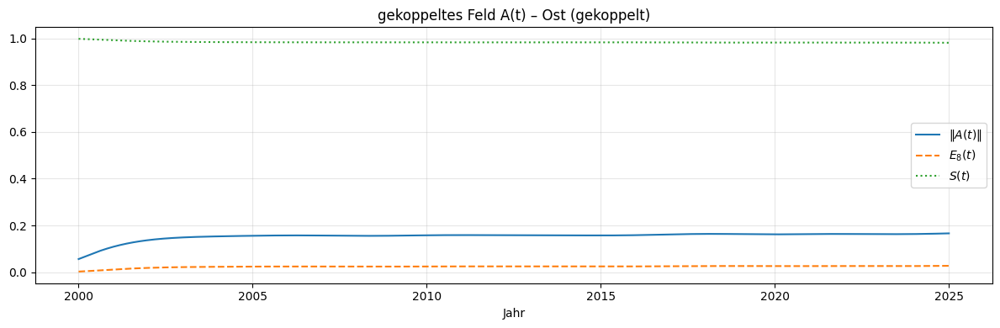

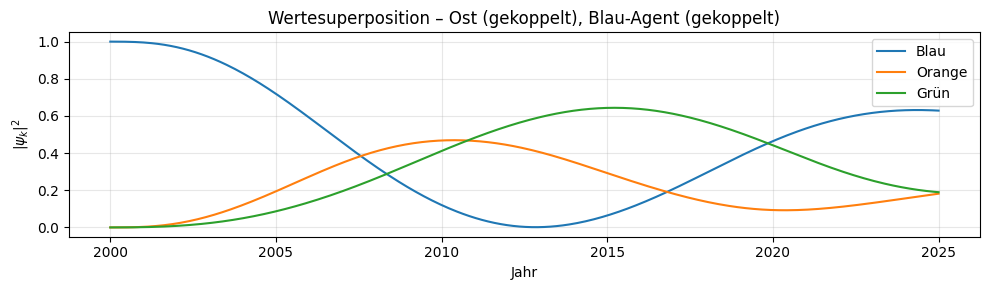

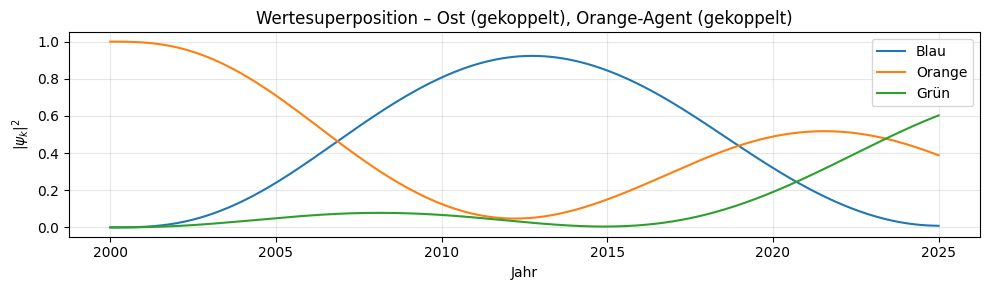

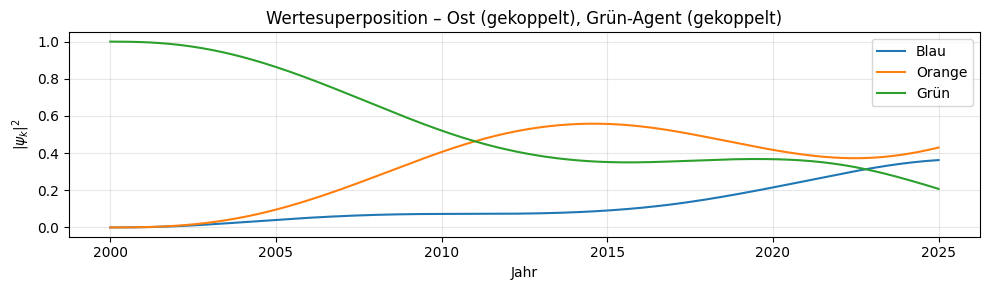

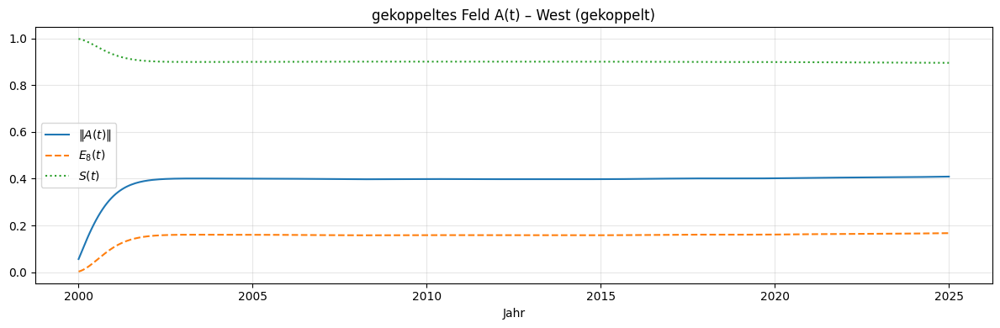

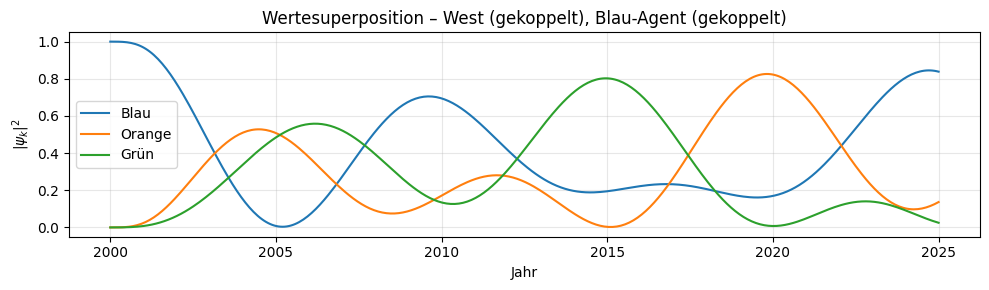

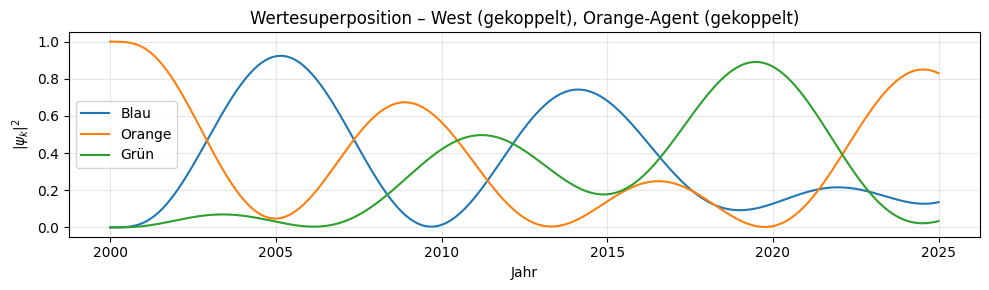

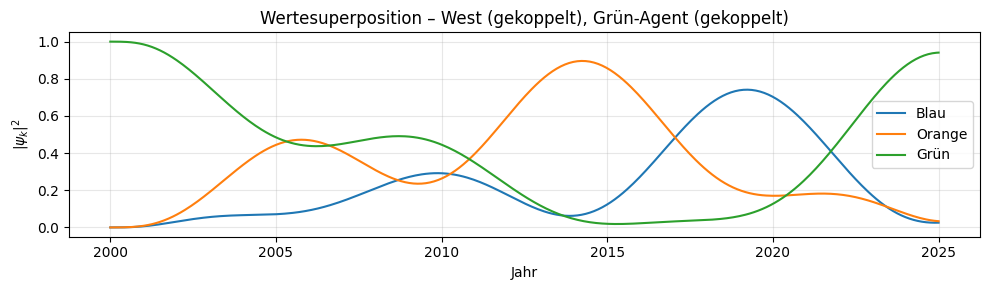

=== OST: QSD-Metriken (alt vs. coup) ===


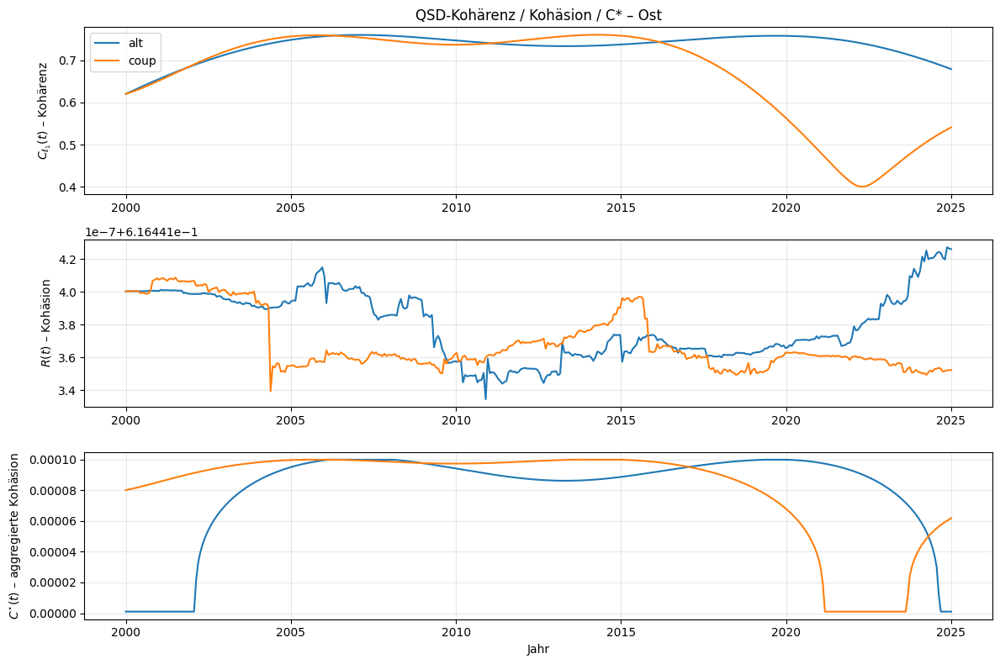

=== WEST: QSD-Metriken (alt vs. coup) ===


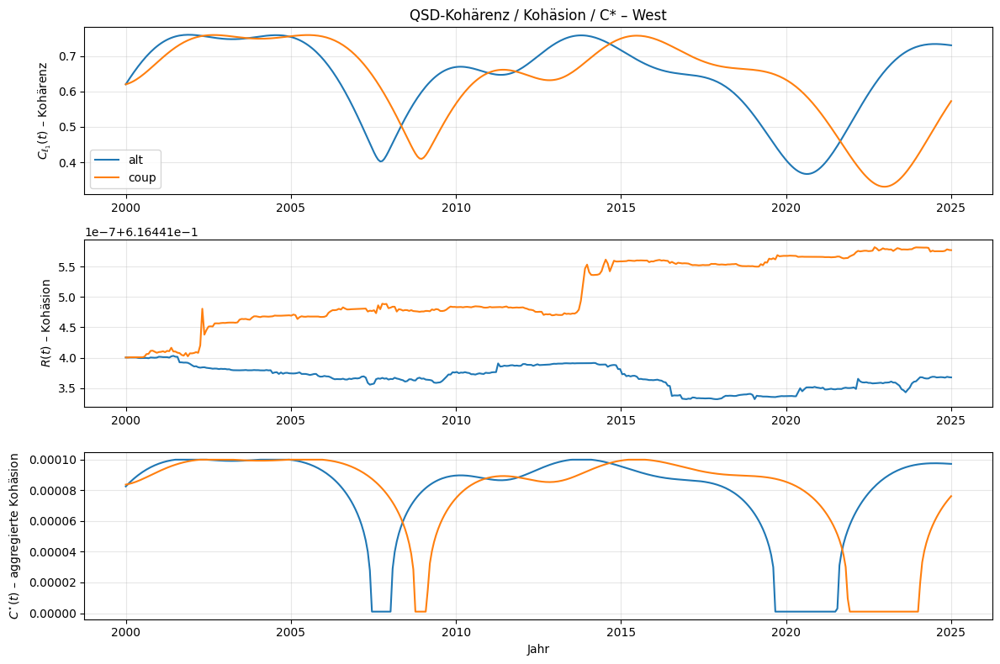

3D-Pfade – Ost (coup)


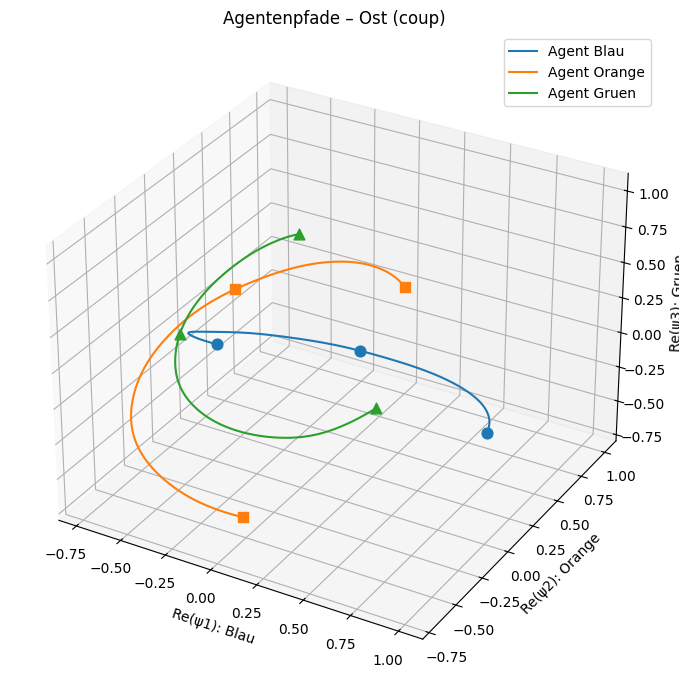

3D-Pfade – West (coup)


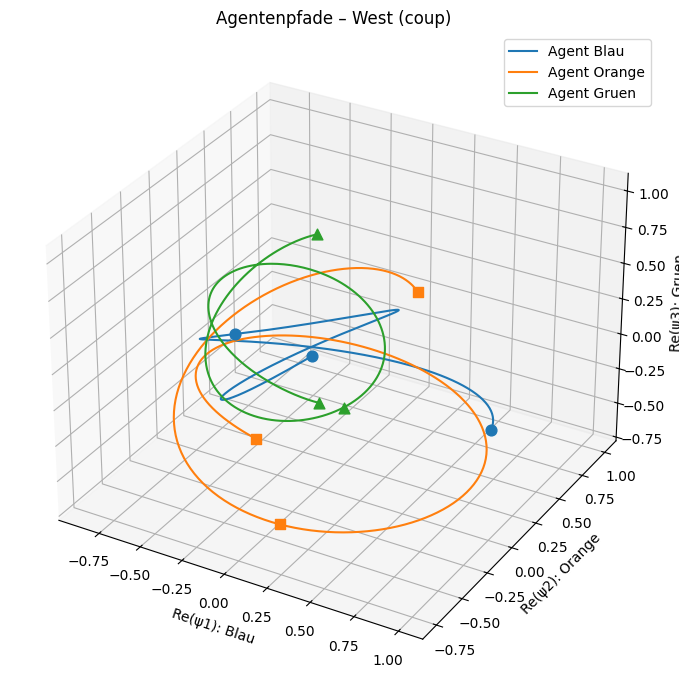

=== Ost↔West Vergleich – Variante 'coup' ===


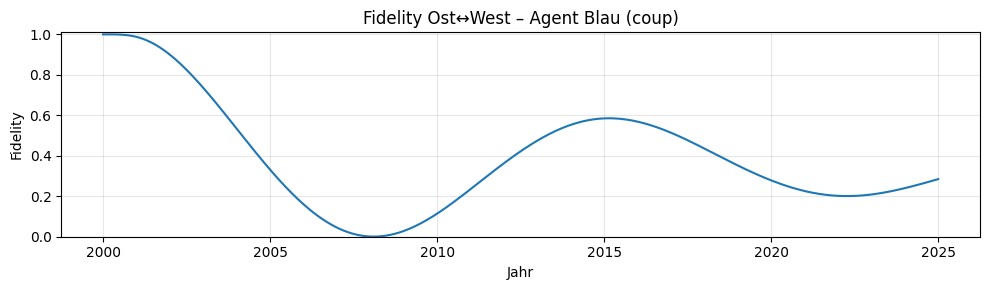

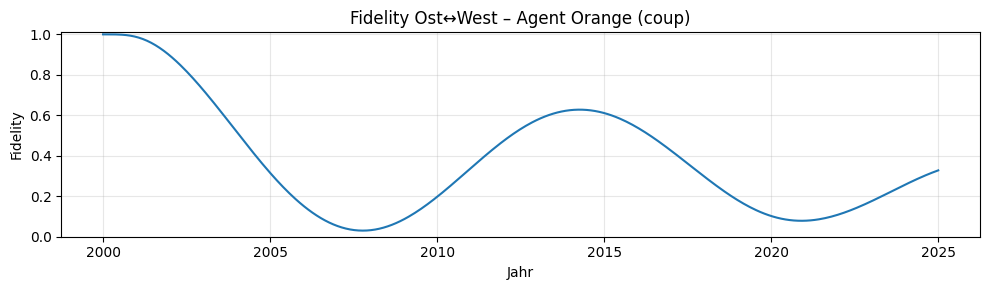

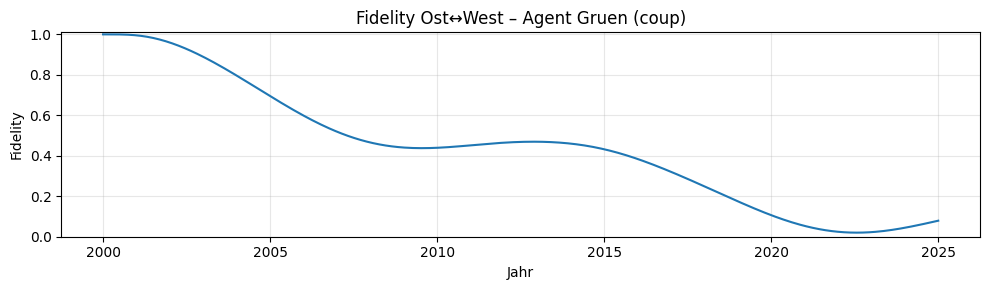

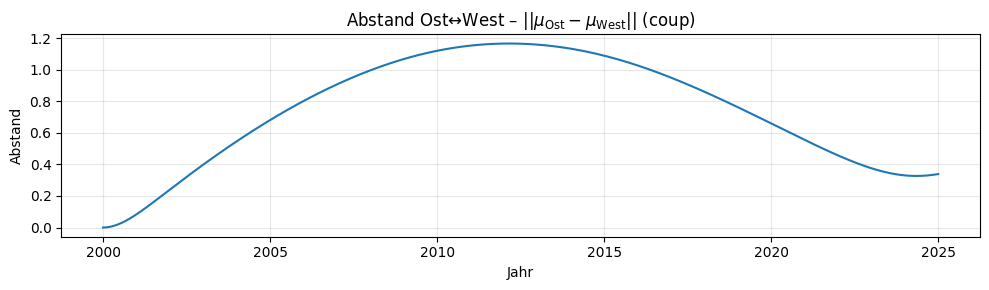

⟨Fidelity Ost↔West (coup)⟩:
  Blau: 0.389
  Orange: 0.377
  Gruen: 0.440
⟨||μ_Ost - μ_West||⟩ (coup) = 0.747


In [93]:
# =====================================================================
# QSD-GESAMT-ADD-ON: alt vs. coup in Ost/West + QSD-Metriken + Vergleich
# =====================================================================
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D   # für 3D-Pfade
from scipy.integrate import solve_ivp
from scipy.interpolate import interp1d

def run_qsd_full_analysis_with_coupling(
    ost_west_results,
    g=1.0, gamma=0.3, beta=3.0, alpha1=0.35, alpha0=0.20,
    lambda_c=0.3, kappa=0.3,
    B_ost=None, S_ost=None,
    B_west=None, S_west=None,
    coh_weights=(1.0/3, 1.0/3, 1.0/3),
    plot_3d=True
):
    """
    Gesamt-Analyse für Deutschland 2000–2025:

    - Nutzt A_alt aus ost_west_results["Ost"/"West"]["A_alt"].
    - Berechnet A_coup(t) für Ost/West via simulate_coupled_region(...).
    - Evolviert Agentenpfade (Blau, Orange, Gruen) in A_alt und A_coup.
    - Berechnet nach Original-QSD-Formeln:
        μ(t,s), R(t,s), C_{l1}(t,s), C*(t)
      für alt und coup, getrennt für Ost/West.
    - Plottet:
        1. Ost: C_{l1}, R, C* (alt vs coup)
        2. West: C_{l1}, R, C* (alt vs coup)
        3. Optional 3D-Pfade (Hauptvariante, hier coup)
        4. Ost↔West-Vergleich für 'coup':
            - Fidelity für alle drei Agenten
            - Abstand ||μ_Ost - μ_West||

    Rückgabe:
        variants_ost, variants_west, summary
    """

    # ------------------------------------------------------------
    # 1. Hilfsfunktionen (lokal gekapselt)
    # ------------------------------------------------------------
    def evolve_with_components(t_eval, A_comp, psi0):
        """
        Entwickle |psi> mit zeitabhängigem H(t)=A(t), A in Komponenten (T,8).
        """
        t_eval = np.asarray(t_eval)
        A_comp = np.asarray(A_comp)

        comp_inters = [
            interp1d(t_eval, A_comp[:, a], kind="linear", fill_value="extrapolate")
            for a in range(A_comp.shape[1])
        ]

        def H_of_t(t):
            coeffs = np.array([float(f(t)) for f in comp_inters])
            H = np.zeros((3,3), dtype=complex)
            for a in range(8):
                H += coeffs[a] * generators[a]
            return H

        def rhs(t, y):
            psi = y[:3] + 1j*y[3:]
            H = H_of_t(t)
            dpsi = -1j * (H @ psi)
            return np.concatenate([dpsi.real, dpsi.imag])

        y0 = np.concatenate([psi0.real, psi0.imag])
        sol = solve_ivp(
            rhs,
            (t_eval[0], t_eval[-1]),
            y0,
            t_eval=t_eval,
            method="DOP853",
            rtol=1e-8,
            atol=1e-10
        )
        psi_t = sol.y[:3,:] + 1j*sol.y[3:,:]
        norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
        return (psi_t / norms).T  # (T,3)

    def qsd_mean_field_and_coherence(t_eval, pathA, pathB, pathC, wA, wB, wC):
        """
        Original-QSD:

        μ(t,s) = Σ_n w_n ψ_n(t,s)
        R(t,s) = ||μ(t,s)||

        C_{l1}(t,s) = R(t,s)^2 * [ (Σ_i |μ̂_i|)^2 - 1 ]
        C_max(t)    = 2 R(t,s)^2
        """
        psi_all = np.stack([pathA, pathB, pathC], axis=1)  # (T,3,3)
        weights = np.array([wA, wB, wC], dtype=float)

        mu_t = np.einsum('n,Tnk->Tk', weights, psi_all)
        R_t = np.linalg.norm(mu_t, axis=1)

        eps = 1e-15
        mu_hat = mu_t / (R_t[:,None] + eps)
        abs_sum = np.sum(np.abs(mu_hat), axis=1)
        C_l1 = (R_t**2) * (abs_sum**2 - 1.0)
        C_max = 2.0 * (R_t**2)
        return mu_t, R_t, C_l1, C_max

    def clip_series_to_unit_interval(X):
        X = np.asarray(X, dtype=float)
        q10, q90 = np.quantile(X, [0.1, 0.9])
        denom = max(q90 - q10, 1e-12)
        Xn = (X - q10) / denom
        return np.clip(Xn, 0.0, 1.0)

    def aggregated_cohesion_Cstar(C_q, B, S,
                                  w_q, w_b, w_s,
                                  eps=1e-6):
        """
        C*(t) = exp( w_q ln(tilde C_q + eps)
                    +w_b ln(tilde B   + eps)
                    +w_s ln(tilde S   + eps) )
        """
        C_q = clip_series_to_unit_interval(C_q)
        B   = clip_series_to_unit_interval(B)
        S   = clip_series_to_unit_interval(S)

        log_C = (w_q*np.log(C_q+eps)
                 + w_b*np.log(B+eps)
                 + w_s*np.log(S+eps))
        return np.exp(log_C)

    def fidelity_between_psi(psi1, psi2):
        inner = np.sum(np.conj(psi1)*psi2, axis=1)
        return np.abs(inner)**2

    def distance_between_mu(mu1, mu2):
        return np.linalg.norm(mu1 - mu2, axis=1)

    # ------------------------------------------------------------
    # 2. A_coup für Ost und West via simulate_coupled_region
    # ------------------------------------------------------------
    region_s = {"Ost": -1.0, "West": +1.0}
    coup_fields = {}  # region -> dict(t_eval, A_coup)

    for region in ["Ost","West"]:
        data = ost_west_results[region]
        t_eval = np.asarray(data["t_eval"])
        t0, t1 = float(t_eval[0]), float(t_eval[-1])

        t_c, A_coup, psi_traj_c = simulate_coupled_region(
            region_s[region], f"{region} (gekoppelt)",
            g=g, gamma=gamma, beta=beta,
            alpha1=alpha1, alpha0=alpha0,
            lambda_c=lambda_c, kappa=kappa,
            t0=t0, t1=t1, n_eval=len(t_eval)
        )

        if not np.allclose(t_c, t_eval):
            A_interp = np.empty_like(A_coup)
            for a in range(A_coup.shape[1]):
                f = interp1d(t_c, A_coup[:,a], kind="linear", fill_value="extrapolate")
                A_interp[:,a] = f(t_eval)
            A_coup = A_interp
            t_c = t_eval

        coup_fields[region] = dict(t_eval=t_c, A_coup=A_coup)

    # ------------------------------------------------------------
    # 3. Agentenpfade und QSD-Metriken für Ost & West, alt & coup
    # ------------------------------------------------------------
    psi0s = {
        "Blau":   np.array([1,0,0], complex),
        "Orange": np.array([0,1,0], complex),
        "Gruen":  np.array([0,0,1], complex),
    }

    variants_ost = {}
    variants_west = {}

    w_q, w_b, w_s = coh_weights

    def build_variants_for_region(region_name, s_val, B_series, S_series):
        data = ost_west_results[region_name]
        t_eval = np.asarray(data["t_eval"])
        T = len(t_eval)

        if B_series is None:
            B_series_loc = np.ones(T)
        else:
            B_series_loc = np.asarray(B_series)
        if S_series is None:
            S_series_loc = np.ones(T)
        else:
            S_series_loc = np.asarray(S_series)

        wA, wB, wC = weights_of_s(s_val)

        A_alt  = np.asarray(data["A_alt"])
        A_coup = np.asarray(coup_fields[region_name]["A_coup"])

        # Agentenpfade in alt/coup
        paths_alt  = {}
        paths_coup = {}
        for label, psi0 in psi0s.items():
            paths_alt[label]  = evolve_with_components(t_eval, A_alt,  psi0)
            paths_coup[label] = evolve_with_components(t_eval, A_coup, psi0)

        # QSD-Metriken aus den drei Agentenpfaden
        def make_variant_struct(label, paths_dict):
            psiA = paths_dict["Blau"]
            psiB = paths_dict["Orange"]
            psiC = paths_dict["Gruen"]

            mu_t, R_t, C_l1, C_max = qsd_mean_field_and_coherence(
                t_eval, psiA, psiB, psiC, wA, wB, wC
            )
            C_star = aggregated_cohesion_Cstar(
                C_l1, B_series_loc, S_series_loc, w_q, w_b, w_s
            )
            return dict(
                label=label,
                t=t_eval,
                mu=mu_t,
                R=R_t,
                C_l1=C_l1,
                C_max=C_max,
                C_star=C_star,
                paths=dict(Blau=psiA, Orange=psiB, Gruen=psiC),
                weights=dict(wA=wA, wB=wB, wC=wC),
                s=s_val,
            )

        variants = {
            "alt":  make_variant_struct("alt",  paths_alt),
            "coup": make_variant_struct("coup", paths_coup),
        }
        return variants, paths_alt, paths_coup

    variants_ost, paths_alt_ost, paths_coup_ost = build_variants_for_region(
        "Ost", -1.0, B_ost, S_ost
    )
    variants_west, paths_alt_west, paths_coup_west = build_variants_for_region(
        "West", +1.0, B_west, S_west
    )

    # ------------------------------------------------------------
    # 4. Plots: Zuerst Ost, dann West – Kohärenz, Kohäsion, C*
    # ------------------------------------------------------------
    def plot_region_metrics(region_label, variants_dict):
        plt.figure(figsize=(12, 8))

        labels = ["alt","coup"]
        labels_exist = [lbl for lbl in labels if lbl in variants_dict]
        if not labels_exist:
            print(f"[{region_label}] keine Varianten gefunden.")
            return

        # (1) C_l1
        ax1 = plt.subplot(3,1,1)
        for lbl in labels_exist:
            v = variants_dict[lbl]
            ax1.plot(v['t'], v['C_l1'], label=lbl)
        ax1.set_ylabel(r"$C_{\ell_1}(t)$ – Kohärenz")
        ax1.set_title(f"QSD-Kohärenz / Kohäsion / C* – {region_label}")
        ax1.grid(True, alpha=0.3)
        ax1.legend()

        # (2) R(t)
        ax2 = plt.subplot(3,1,2, sharex=ax1)
        for lbl in labels_exist:
            v = variants_dict[lbl]
            ax2.plot(v['t'], v['R'], label=lbl)
        ax2.set_ylabel(r"$R(t)$ – Kohäsion")
        ax2.grid(True, alpha=0.3)

        # (3) C*(t)
        ax3 = plt.subplot(3,1,3, sharex=ax1)
        for lbl in labels_exist:
            v = variants_dict[lbl]
            ax3.plot(v['t'], v['C_star'], label=lbl)
        ax3.set_ylabel(r"$C^{\star}(t)$ – aggregierte Kohäsion")
        ax3.set_xlabel("Jahr")
        ax3.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

    print("=== OST: QSD-Metriken (alt vs. coup) ===")
    plot_region_metrics("Ost", variants_ost)

    print("=== WEST: QSD-Metriken (alt vs. coup) ===")
    plot_region_metrics("West", variants_west)

    # ------------------------------------------------------------
    # 5. Optional: 3D-Pfade für coup (Ost und West)
    # ------------------------------------------------------------
    def plot_agent_paths_3d(region_label, variant_struct,
                            t_markers=(2000.0, 2010.0, 2025.0)):
        t = variant_struct['t']
        paths = variant_struct['paths']

        fig = plt.figure(figsize=(7,7))
        ax = fig.add_subplot(111, projection='3d')

        colors = dict(Blau='C0', Orange='C1', Gruen='C2')
        markers = dict(Blau='o', Orange='s', Gruen='^')

        for name, psi in paths.items():
            x = psi[:,0].real
            y = psi[:,1].real
            z = psi[:,2].real
            ax.plot(x, y, z, color=colors[name], label=f"Agent {name}")
            for tm in t_markers:
                idx = np.argmin(np.abs(t - tm))
                ax.scatter(x[idx], y[idx], z[idx],
                           color=colors[name],
                           marker=markers[name],
                           s=60)

        ax.set_xlabel("Re(ψ1): Blau")
        ax.set_ylabel("Re(ψ2): Orange")
        ax.set_zlabel("Re(ψ3): Gruen")
        ax.set_title(f"Agentenpfade – {region_label} (coup)")
        ax.legend()
        plt.tight_layout()
        plt.show()

    if plot_3d:
        print("3D-Pfade – Ost (coup)")
        plot_agent_paths_3d("Ost", variants_ost["coup"])
        print("3D-Pfade – West (coup)")
        plot_agent_paths_3d("West", variants_west["coup"])

    # ------------------------------------------------------------
    # 6. Ost↔West-Vergleich für 'coup'
    # ------------------------------------------------------------
    t = variants_ost["coup"]["t"]
    assert np.allclose(t, variants_west["coup"]["t"]), "Zeitachsen Ost/West müssen übereinstimmen."

    summary = {"Ost": {}, "West": {}, "OstWest_coup": {}}

    # Fidelity alt vs coup innerhalb jeder Region
    for region, paths_alt_reg, paths_coup_reg in [
        ("Ost", paths_alt_ost, paths_coup_ost),
        ("West", paths_alt_west, paths_coup_west),
    ]:
        mean_F = {}
        for name in ["Blau","Orange","Gruen"]:
            psi_alt  = paths_alt_reg[name]
            psi_coup = paths_coup_reg[name]
            F = fidelity_between_psi(psi_coup, psi_alt)
            mean_F[name] = float(np.mean(F))
        summary[region]["mean_F_coup_vs_alt"] = mean_F

    # Ost↔West Fidelity & Distance für coup
    print("=== Ost↔West Vergleich – Variante 'coup' ===")
    mean_F_ow = {}
    for name in ["Blau","Orange","Gruen"]:
        psiO = variants_ost["coup"]["paths"][name]
        psiW = variants_west["coup"]["paths"][name]
        F_ow = fidelity_between_psi(psiO, psiW)
        mean_F_ow[name] = float(np.mean(F_ow))

        plt.figure(figsize=(10,3))
        plt.plot(t, F_ow)
        plt.ylim(0,1.01)
        plt.title(f"Fidelity Ost↔West – Agent {name} (coup)")
        plt.xlabel("Jahr"); plt.ylabel("Fidelity")
        plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()

    # Zeigerabstand
    D_t = distance_between_mu(variants_ost["coup"]["mu"],
                              variants_west["coup"]["mu"])
    mean_D_ow = float(np.mean(D_t))

    plt.figure(figsize=(10,3))
    plt.plot(t, D_t)
    plt.title(r"Abstand Ost↔West – $||\mu_{\mathrm{Ost}}-\mu_{\mathrm{West}}||$ (coup)")
    plt.xlabel("Jahr"); plt.ylabel("Abstand")
    plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()

    summary["OstWest_coup"]["mean_F_ow"] = mean_F_ow
    summary["OstWest_coup"]["mean_D_ow"] = mean_D_ow

    print("⟨Fidelity Ost↔West (coup)⟩:")
    for name in ["Blau","Orange","Gruen"]:
        print(f"  {name}: {mean_F_ow[name]:.3f}")
    print(f"⟨||μ_Ost - μ_West||⟩ (coup) = {mean_D_ow:.3f}")

    return variants_ost, variants_west, summary

variants_ost, variants_west, summary = run_qsd_full_analysis_with_coupling(
    ost_west_results,
    g=1.0, gamma=0.3, beta=3.0, alpha1=0.35, alpha0=0.20,
    lambda_c=0.3, kappa=0.3,
    B_ost=None, S_ost=None,
    B_west=None, S_west=None
)


[INFO] berechne A_coup für Ost neu ...


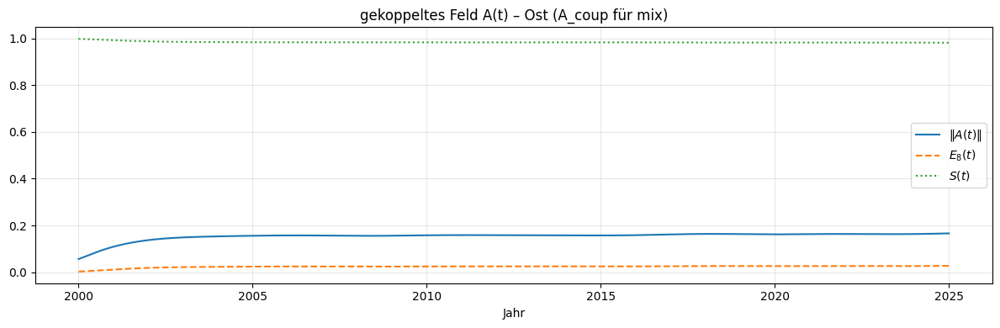

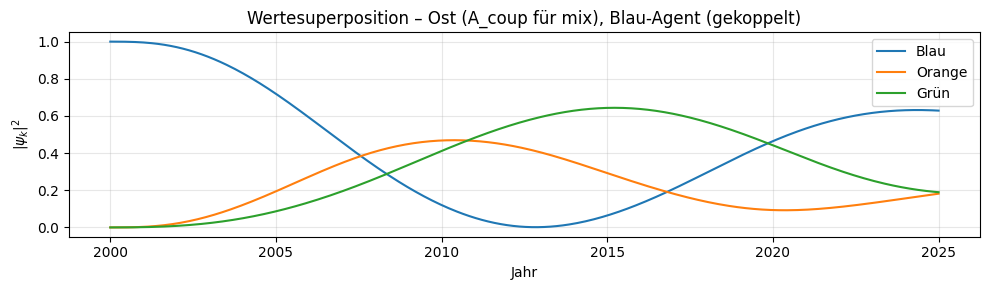

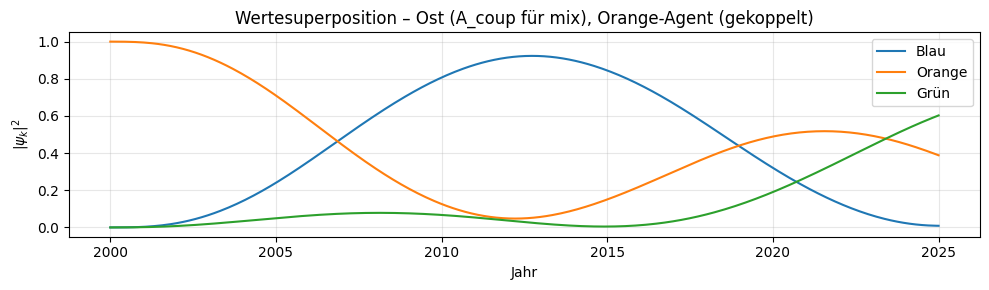

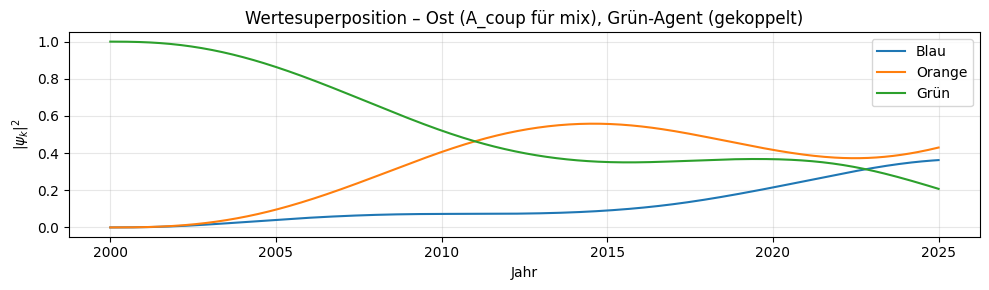

[INFO] berechne A_coup für West neu ...


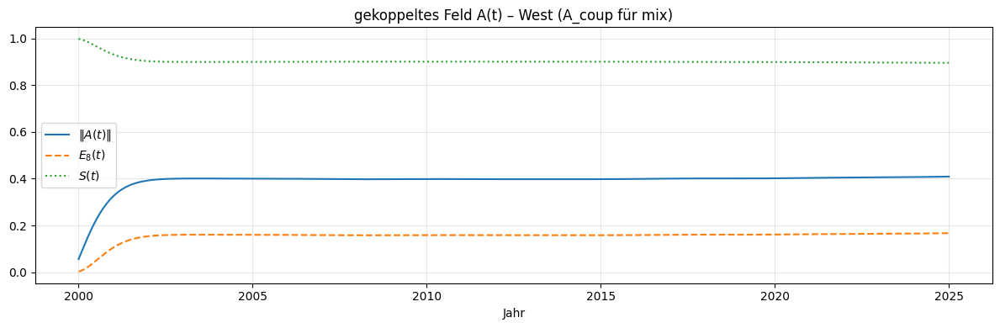

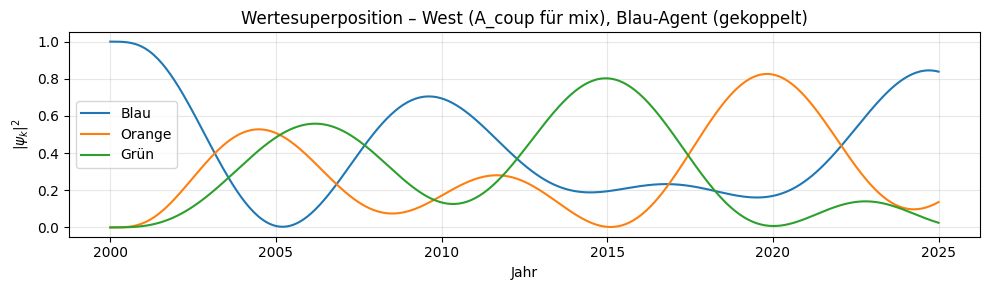

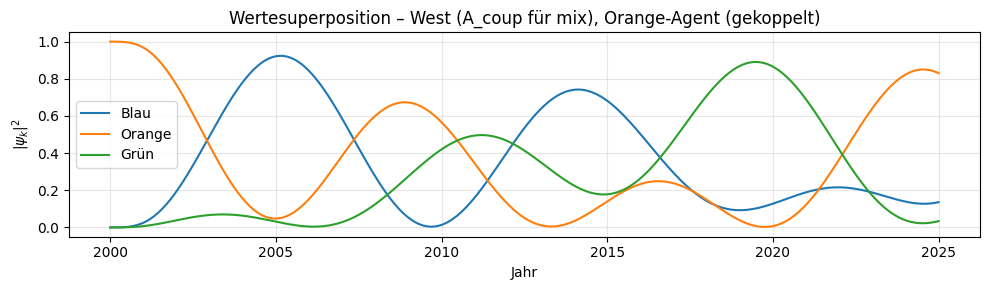

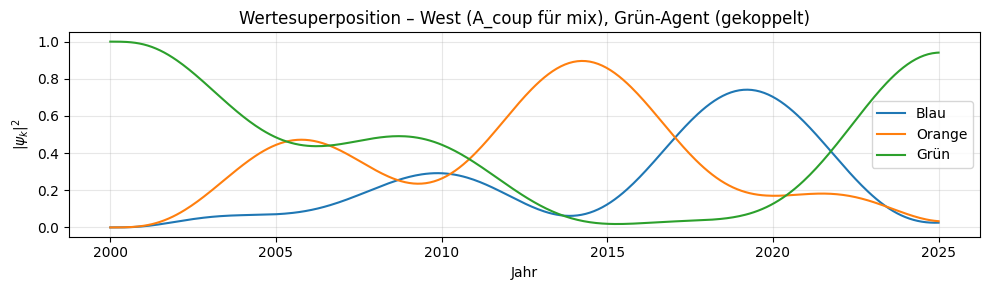

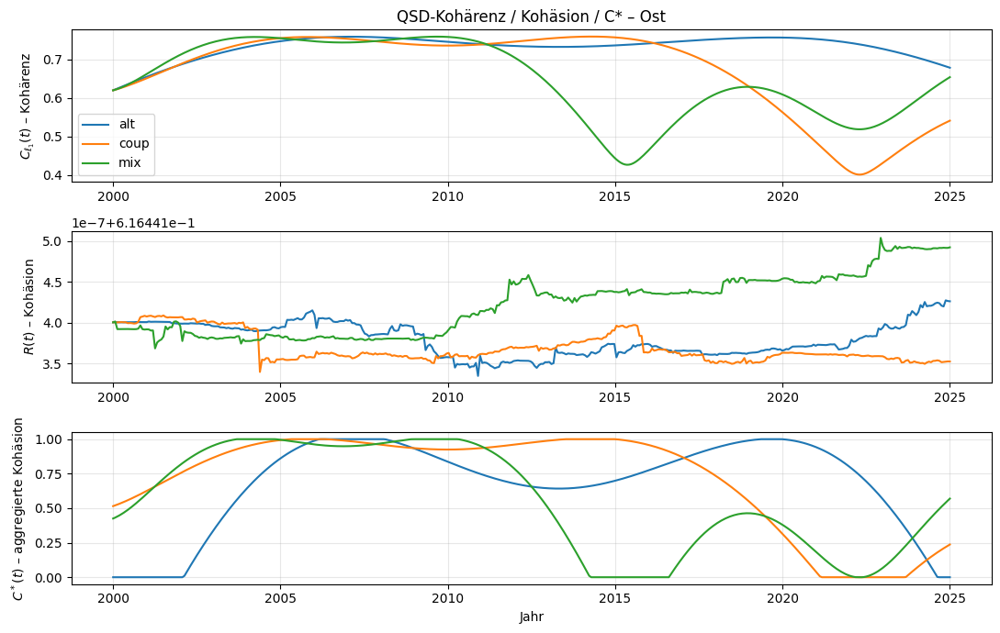

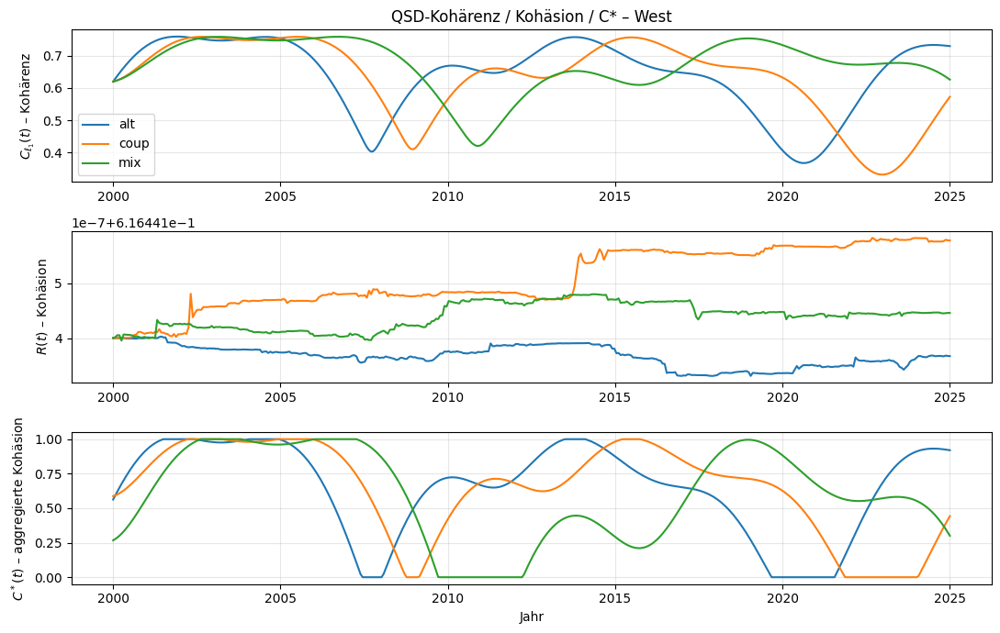

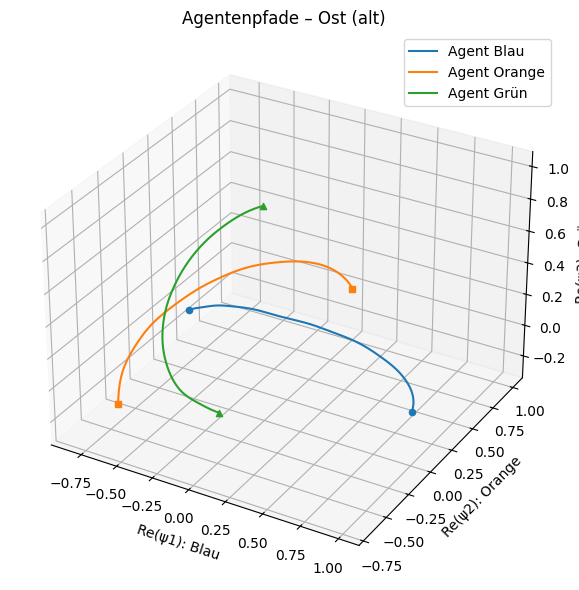

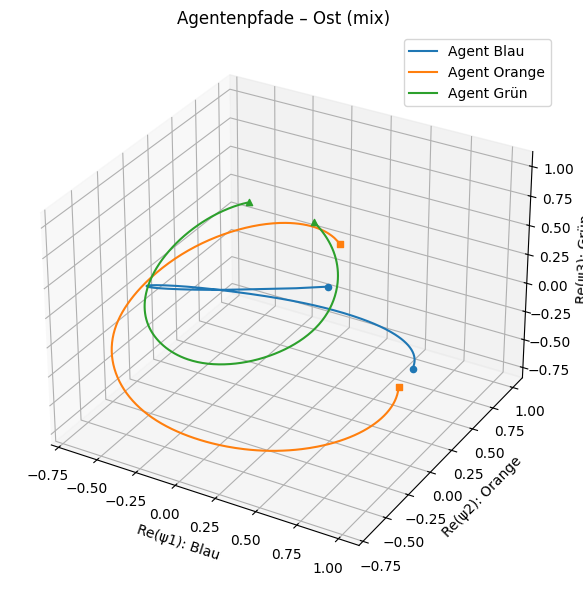

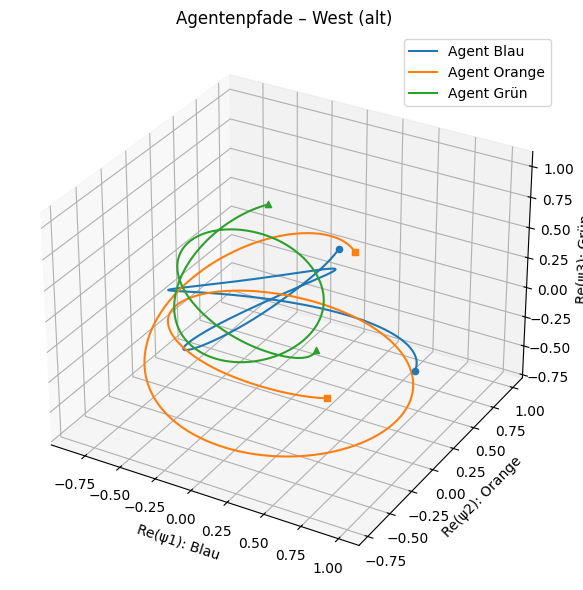

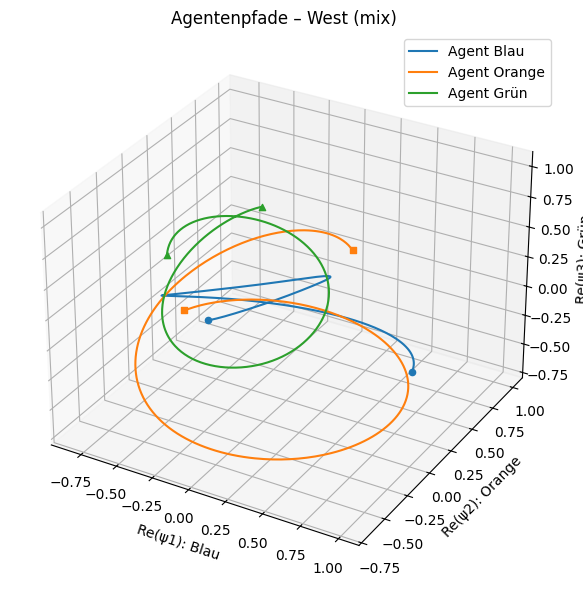

In [94]:
# =====================================================================
# ADD-ON: A_coup automatisch erzeugen, A_mix bauen, QSD-Metriken
#   (korrigierte Version: A_mix wird in ost_west_results gespeichert)
# =====================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D  # nur für 3D-Plots

# ---------- Hilfen: SU(3)-Matrix aus Komponenten, Pfad-Entwicklung ---------

def _A_from_components(a_vec):
    """Baue A = sum_a a_vec[a] * L_a (Generatoren global: 'generators')."""
    A = np.zeros((3,3), dtype=complex)
    for a in range(8):
        A += a_vec[a] * generators[a]
    return A

def evolve_with_components(t_eval, A_comp, psi0):
    """
    Entwickle |psi> mit zeitabhängigem Hamilton H(t)=A(t),
    A_comp: (T,8) Komponenten A^a(t), t_eval: (T,)
    Rückgabe: psi(t) als (T,3) komplex, normiert.
    """
    t_eval = np.asarray(t_eval)
    A_comp = np.asarray(A_comp)

    comp_inters = [
        interp1d(t_eval, A_comp[:,a], kind="linear", fill_value="extrapolate")
        for a in range(8)
    ]

    def H_of_t(t):
        coeffs = np.array([float(f(t)) for f in comp_inters])  # (8,)
        return _A_from_components(coeffs)

    def rhs(t, y):
        psi = y[:3] + 1j*y[3:]
        H = H_of_t(t)
        dpsi = -1j * (H @ psi)
        return np.concatenate([dpsi.real, dpsi.imag])

    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        rhs, (t_eval[0], t_eval[-1]), y0, t_eval=t_eval,
        method="DOP853", rtol=1e-8, atol=1e-10
    )
    psi_t = sol.y[:3,:] + 1j*sol.y[3:,:]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    return (psi_t / norms).T  # (T,3)

# ---------- QSD: Mean-Field-Kohärenz C_l1(t) nach deiner Definition -------

def get_weights_for_region(s):
    """Verwendet weights_of_s(s), falls vorhanden, sonst Default."""
    try:
        wA, wB, wC = weights_of_s(s)  # aus deinem Hauptprogramm
    except NameError:
        wA, wB, wC = 0.5, 0.3, 0.2
    return wA, wB, wC

def compute_qsd_coherence(t_eval, psiA, psiB, psiC, s):
    """
    Deine Formeln:
      μ(t,s)   = Σ_n w_n ψ_n
      R(t,s)   = ||μ||
      C_l1(t)  = R^2 [ (Σ_i |μ̂_i|)^2 – 1 ]
    Rückgabe: C_l1(t), R(t)
    """
    wA, wB, wC = get_weights_for_region(s)
    mu = wA*psiA + wB*psiB + wC*psiC        # (T,3)
    R  = np.linalg.norm(mu, axis=1)         # (T,)
    eps = 1e-14
    mu_hat = mu / (R[:,None] + eps)
    sum_abs = np.sum(np.abs(mu_hat), axis=1)
    C_l1 = R**2 * (sum_abs**2 - 1.0)
    return C_l1, R

# ---------- Aggregierte Kohäsion C*(t) nach deiner Clip-/Geo-Mittel-Formel -----

def _clip_series(X):
    """Clip-Normalisierung gemäß deiner Definition."""
    X = np.asarray(X)
    q10, q90 = np.quantile(X, 0.10), np.quantile(X, 0.90)
    denom = max(q90 - q10, 1e-12)
    Xn = (X - q10) / denom
    return np.clip(Xn, 0.0, 1.0)

def compute_C_star(C_q, B=None, S=None,
                   w_q=1.0, w_b=0.0, w_s=0.0, eps=1e-8):
    """
    Deine Formel:
      C*(t) = exp( w_q ln( C_q~ + eps ) + w_b ln(B~+eps) + w_s ln(S~+eps) )
    Falls B,S fehlen: rein quantenbasierte Kohäsion (w_q=1, w_b=w_s=0).
    """
    Cq_t = _clip_series(C_q)
    if B is None:
        B_t = np.ones_like(Cq_t)
        S_t = np.ones_like(Cq_t)
        w_q, w_b, w_s = 1.0, 0.0, 0.0
    else:
        B_t = _clip_series(B)
        S_t = _clip_series(S)
        total = max(w_q + w_b + w_s, 1e-12)
        w_q, w_b, w_s = w_q/total, w_b/total, w_s/total

    logC = (w_q*np.log(Cq_t + eps) +
            w_b*np.log(B_t   + eps) +
            w_s*np.log(S_t   + eps))
    return np.exp(logC)

# ---------- A_coup bei Bedarf nachrechnen und in ost_west_results speichern -----

def ensure_A_coup_in_results(ost_west_results,
                             g=1.0, gamma=0.3, beta=3.0,
                             alpha1=0.35, alpha0=0.20,
                             lambda_c=0.3, kappa=0.3):
    """
    Falls ost_west_results['Ost'/'West'] noch kein 'A_coup' besitzen,
    wird simulate_coupled_region aufgerufen und 'A_coup' eingetragen.
    """
    region_s = {"Ost": -1.0, "West": +1.0}
    for region, s in region_s.items():
        data = ost_west_results[region]
        if "A_coup" in data:
            continue  # schon vorhanden
        t_eval = np.asarray(data["t_eval"])
        t0, t1 = float(t_eval[0]), float(t_eval[-1])

        print(f"[INFO] berechne A_coup für {region} neu ...")
        t_c, A_coup, psi_traj = simulate_coupled_region(
            s, f"{region} (A_coup für mix)",
            g=g, gamma=gamma, beta=beta,
            alpha1=alpha1, alpha0=alpha0,
            lambda_c=lambda_c, kappa=kappa,
            t0=t0, t1=t1, n_eval=len(t_eval)
        )
        # Zeitachsen ggf. anpassen
        if not np.allclose(t_c, t_eval):
            A_coup_interp = np.empty_like(A_coup)
            for a in range(A_coup.shape[1]):
                f = interp1d(t_c, A_coup[:,a], kind="linear", fill_value="extrapolate")
                A_coup_interp[:,a] = f(t_eval)
            A_coup = A_coup_interp

        data["A_coup"] = A_coup

# ---------- A_mix auf Basis eines Feldes ('A_alt' oder 'A_coup') bauen ----------

def build_A_mix_from_field(ost_west_results, eta=0.3, field_key="A_coup"):
    """
    Baut für beide Regionen ein symmetrisches A_mix(t):
      Ost:  A_mix^O = (1-eta)*A_O + eta*A_W
      West: A_mix^W = (1-eta)*A_W + eta*A_O
    field_key gibt an, welches Feld als Basis dient ('A_alt' oder 'A_coup').
    Rückgabe: dict {"Ost": A_mix_O, "West": A_mix_W}, t_eval (gemeinsam).
    """
    dataO = ost_west_results["Ost"]
    dataW = ost_west_results["West"]

    tO = np.asarray(dataO["t_eval"])
    tW = np.asarray(dataW["t_eval"])
    if not np.allclose(tO, tW):
        raise ValueError("Zeitachsen Ost/West stimmen nicht überein.")

    if field_key not in dataO or field_key not in dataW:
        raise KeyError(f"Feld '{field_key}' fehlt in ost_west_results – "
                       f"bitte ensure_A_coup_in_results o.ä. aufrufen.")

    A_O = np.asarray(dataO[field_key])
    A_W = np.asarray(dataW[field_key])

    A_mix_O = (1.0 - eta) * A_O + eta * A_W
    A_mix_W = (1.0 - eta) * A_W + eta * A_O

    return {"Ost": A_mix_O, "West": A_mix_W}, tO

# ---------- 3D-Agentenpfade (wie in deinen bisherigen Bildern) ----------------

def plot_agent_paths_3d(t_eval, psi_dict, title):
    """
    psi_dict: {"Blau": psiA, "Orange": psiB, "Grün": psiC}, jeweils (T,3)
    Plot: Re(ψ1), Re(ψ2), Re(ψ3)
    """
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection="3d")

    colors = {"Blau": "C0", "Orange": "C1", "Grün": "C2"}
    markers = {"Blau": "o", "Orange": "s", "Grün": "^"}

    for name, psi in psi_dict.items():
        re_parts = psi.real  # (T,3)
        ax.plot(re_parts[:,0], re_parts[:,1], re_parts[:,2],
                color=colors[name], label=f"Agent {name}")
        # Start/Ende markieren
        ax.scatter(re_parts[0,0],  re_parts[0,1],  re_parts[0,2],
                   color=colors[name], marker=markers[name])
        ax.scatter(re_parts[-1,0], re_parts[-1,1], re_parts[-1,2],
                   color=colors[name], marker=markers[name])

    ax.set_xlabel("Re(ψ1): Blau")
    ax.set_ylabel("Re(ψ2): Orange")
    ax.set_zlabel("Re(ψ3): Grün")
    ax.set_title(title)
    ax.legend()
    plt.tight_layout()
    plt.show()

# ---------- Hauptfunktion: A_mix-Analyse ------------------------------------

def run_A_mix_analysis(
        ost_west_results,
        eta=0.3,
        field_key="A_coup",
        g=1.0, gamma=0.3, beta=3.0,
        alpha1=0.35, alpha0=0.20,
        lambda_c=0.3, kappa=0.3,
        B_ost=None, S_ost=None,
        B_west=None, S_west=None,
        plot=True):
    """
    1. Stelle sicher, dass A_coup im Dictionary vorhanden ist (falls field_key='A_coup').
    2. Baue A_mix(t) für Ost/West.
    3. Speichere A_mix in ost_west_results['Ost']['A_mix'] und ['West']['A_mix'].
    4. Entwickle Agentenpfade (Blau/Orange/Grün) in:
         - A_alt
         - (optional) A_coup
         - A_mix
    5. Berechne für jede Variante:
         - C_l1(t) (Kohärenz)
         - R(t)    (Kohäsion)
         - C*(t)   (aggregierte Kohäsion)
    6. Plotte:
         - C_l1 / R / C* für Ost & West
         - 3D-Pfade für alt und mix.
    """

    # 1) A_coup bei Bedarf erzeugen
    if field_key == "A_coup":
        ensure_A_coup_in_results(
            ost_west_results,
            g=g, gamma=gamma, beta=beta,
            alpha1=alpha1, alpha0=alpha0,
            lambda_c=lambda_c, kappa=kappa
        )

    # 2) A_mix aus gewünschtem Feld (alt oder coup)
    A_mix, t_eval = build_A_mix_from_field(ost_west_results, eta=eta, field_key=field_key)

    # 2b) *** NEU: A_mix in ost_west_results persistieren ***
    ost_west_results["Ost"]["A_mix"]  = A_mix["Ost"]
    ost_west_results["West"]["A_mix"] = A_mix["West"]

    # 3) Agentenpfade simulieren
    regions = {"Ost": -1.0, "West": +1.0}
    psi0s = {
        "Blau":   np.array([1,0,0], complex),
        "Orange": np.array([0,1,0], complex),
        "Grün":   np.array([0,0,1], complex),
    }

    results = {}

    for region, s in regions.items():
        data = ost_west_results[region]
        A_alt    = np.asarray(data["A_alt"])
        A_coup_r = np.asarray(data["A_coup"])
        A_mix_r  = np.asarray(data["A_mix"])

        variant_fields = {
            "alt":  A_alt,
            "coup": A_coup_r,
            "mix":  A_mix_r
        }

        region_res = {"variants": {}}

        for v_name, A_field in variant_fields.items():
            psi_paths = {}
            for name, psi0 in psi0s.items():
                psi_paths[name] = evolve_with_components(t_eval, A_field, psi0)

            C_l1, R = compute_qsd_coherence(
                t_eval,
                psi_paths["Blau"],
                psi_paths["Orange"],
                psi_paths["Grün"],
                s=s
            )

            if region == "Ost":
                B_series = B_ost
                S_series = S_ost
            else:
                B_series = B_west
                S_series = S_west

            C_star = compute_C_star(C_l1, B=B_series, S=S_series)

            region_res["variants"][v_name] = dict(
                psi_paths=psi_paths,
                C_l1=C_l1,
                R=R,
                C_star=C_star
            )

        results[region] = dict(
            t_eval=t_eval,
            variants=region_res["variants"]
        )

    # 4) Plots
    if plot:
        for region, s in regions.items():
            t_eval = results[region]["t_eval"]
            varR   = results[region]["variants"]

            plt.figure(figsize=(11,7))
            ax1 = plt.subplot(3,1,1)
            for v_name, color in zip(["alt","coup","mix"], ["C0","C1","C2"]):
                ax1.plot(t_eval, varR[v_name]["C_l1"], label=v_name, color=color)
            ax1.set_ylabel(r"$C_{\ell_1}(t)$ – Kohärenz")
            ax1.set_title(f"QSD-Kohärenz / Kohäsion / C* – {region}")
            ax1.grid(True, alpha=0.3)
            ax1.legend()

            ax2 = plt.subplot(3,1,2, sharex=ax1)
            for v_name, color in zip(["alt","coup","mix"], ["C0","C1","C2"]):
                ax2.plot(t_eval, varR[v_name]["R"], label=v_name, color=color)
            ax2.set_ylabel(r"$R(t)$ – Kohäsion")
            ax2.grid(True, alpha=0.3)

            ax3 = plt.subplot(3,1,3, sharex=ax1)
            for v_name, color in zip(["alt","coup","mix"], ["C0","C1","C2"]):
                ax3.plot(t_eval, varR[v_name]["C_star"], label=v_name, color=color)
            ax3.set_ylabel(r"$C^*(t)$ – aggregierte Kohäsion")
            ax3.set_xlabel("Jahr")
            ax3.grid(True, alpha=0.3)

            plt.tight_layout()
            plt.show()

        for region, s in regions.items():
            t_eval = results[region]["t_eval"]
            for v_name in ["alt","mix"]:
                psi_paths = results[region]["variants"][v_name]["psi_paths"]
                plot_agent_paths_3d(
                    t_eval,
                    psi_paths,
                    title=f"Agentenpfade – {region} ({v_name})"
                )

    return results

# Beispielaufruf:
# results_mix = run_A_mix_analysis(
#     ost_west_results,
#     eta=0.3,
#     field_key="A_coup",
#     plot=True
# )
results_mix = run_A_mix_analysis(
    ost_west_results,
    eta=0.3,           # Mischgrad Ost<->West
    field_key="A_coup",# Mischung auf Basis der selbstkonsistenten Felder
    plot=True          # oder False, wenn du nur die Daten willst
)

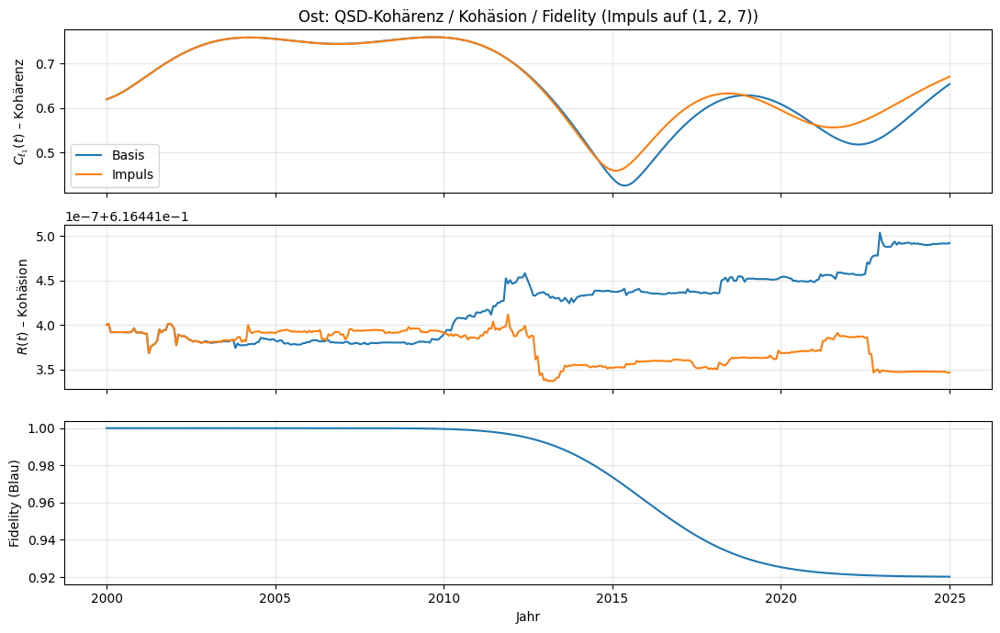

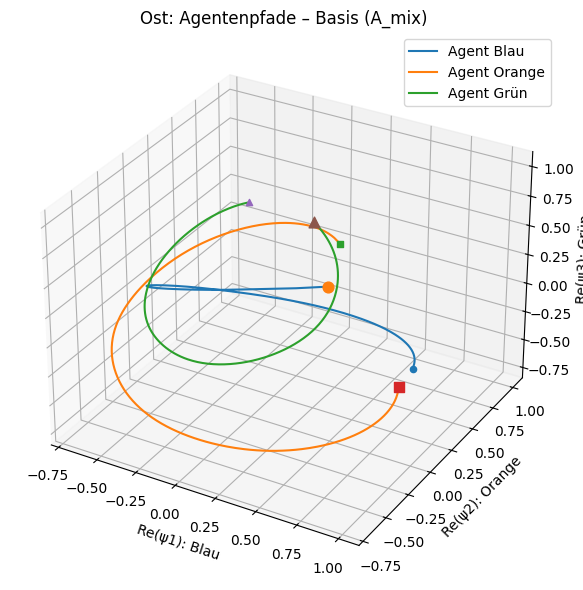

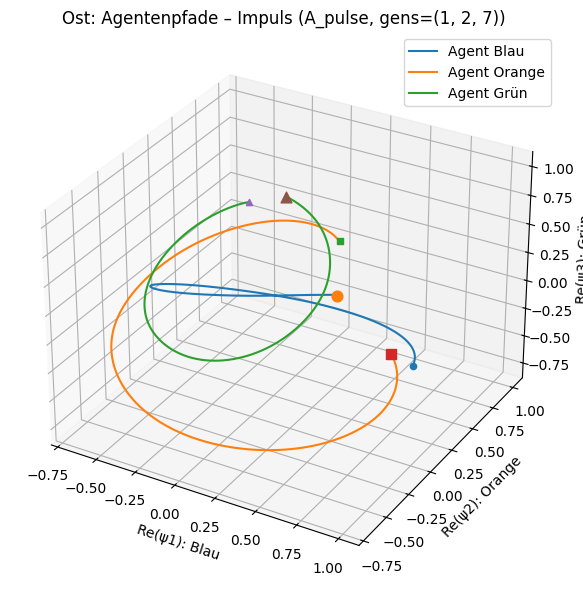

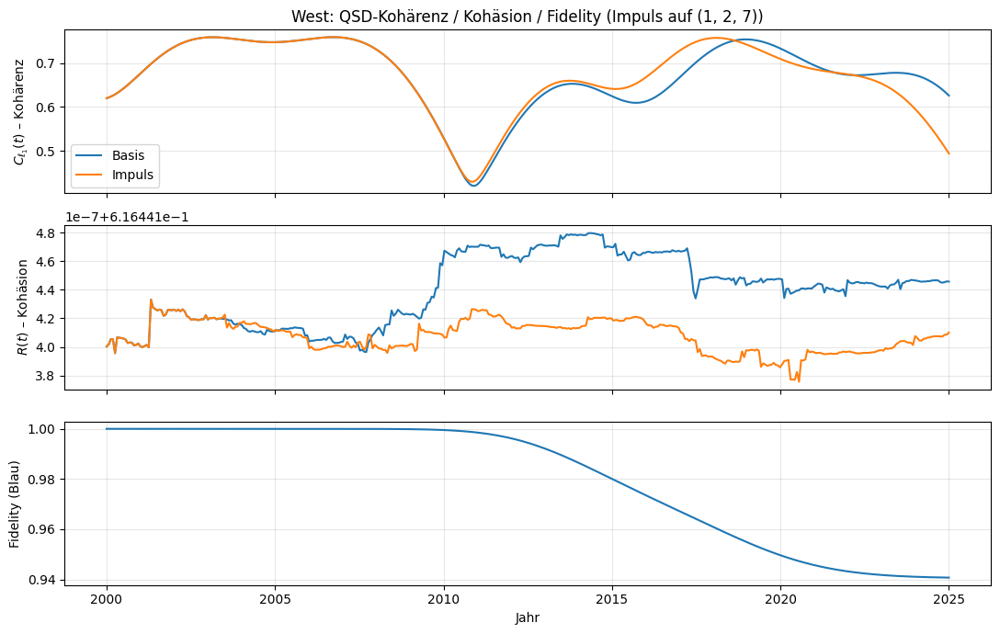

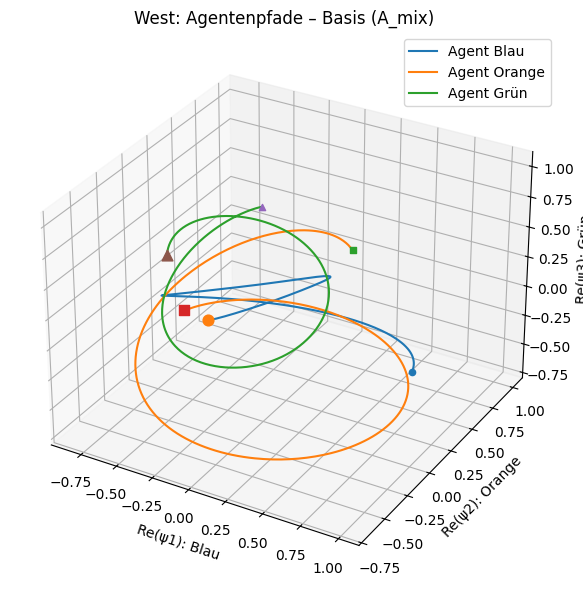

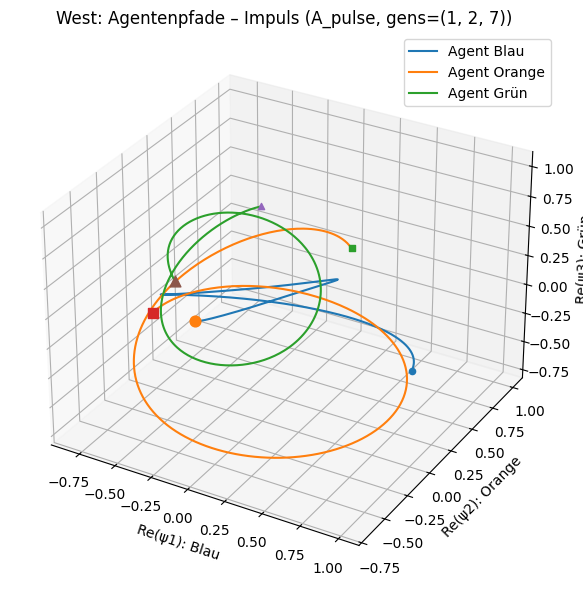

In [95]:
# =============================================================================
# ADD-ON: Politischer Impuls auf A_mix in ausgewählten Generatoren
#         + Integration als Variante "pulse" in ein QSD-Ergebnis-Dict
# =============================================================================
# Voraussetzungen im Notebook:
# - numpy as np
# - matplotlib.pyplot as plt
# - from scipy.interpolate import interp1d
# - from scipy.integrate import solve_ivp
# - from mpl_toolkits.mplot3d import Axes3D  (für 3D-Plot)
# - 'generators' = [L1,...,L8] (SU(3)-Generatoren)
# - ost_west_results["Ost"]["t_eval"], ost_west_results["Ost"]["A_mix"]
#   ost_west_results["West"]["t_eval"], ost_west_results["West"]["A_mix"]
# - Funktion weights_of_s(s) ist definiert (wie im Hauptprogramm)
# - OPTIONAL: ein QSD-Ergebnis-Dict results_qsd mit Struktur wie results_mix:
#     results_qsd[region] = {
#         "t_eval": (T,),
#         "variants": {
#             "alt":  {"C_l1": (T,), "R": (T,), ...},
#             "coup": {"C_l1": (T,), "R": (T,), ...},
#             "mix":  {"C_l1": (T,), "R": (T,), ...},
#         }
#     }
#   -> dann wird eine neue Variante "pulse" ergänzt.
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# ---------- Helper: Hamilton aus Komponenten, Schrödinger-Evolution ---------

def _A_from_components_vec(a_vec):
    """Baue A = sum_a a_vec[a] * L_a."""
    A = np.zeros((3, 3), dtype=complex)
    for a in range(8):
        A += a_vec[a] * generators[a]
    return A

def evolve_with_A_components(t_eval, A_comp, psi0):
    """
    Entwickle |psi(t)> mit H(t)=A(t), A_comp.shape == (T, 8).
    Rückgabe: psi(t) als Array (T,3), normiert.
    """
    t_eval = np.asarray(t_eval)
    A_comp = np.asarray(A_comp)

    # Interpolierte Komponenten
    comp_inters = [
        interp1d(t_eval, A_comp[:, a], kind="linear", fill_value="extrapolate")
        for a in range(8)
    ]

    def H_of_t(t):
        coeffs = np.array([float(f(t)) for f in comp_inters])
        return _A_from_components_vec(coeffs)

    def rhs(t, y):
        psi = y[:3] + 1j*y[3:]
        H = H_of_t(t)
        dpsi = -1j * (H @ psi)
        return np.concatenate([dpsi.real, dpsi.imag])

    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        rhs, (t_eval[0], t_eval[-1]), y0,
        t_eval=t_eval, method="DOP853", rtol=1e-8, atol=1e-10
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    return (psi_t / norms).T  # (T,3)

# ---------- QSD-Mean-Field: R(t) und C_l1(t) aus Agentenpfaden --------------

def qsd_mean_field_from_paths(t_eval, psiA, psiB, psiC, s):
    """
    Berechne μ(t), R(t), C_l1(t) für eine Region s (−1=Ost, +1=West)
    aus Pfaden der drei Agenten (Blau/Orange/Grün).
    psiA, psiB, psiC: Arrays (T,3) komplex.
    """
    t_eval = np.asarray(t_eval)
    psiA = np.asarray(psiA)
    psiB = np.asarray(psiB)
    psiC = np.asarray(psiC)

    # Gewichte wie im Hauptmodell
    wA, wB, wC = weights_of_s(s)

    mu = wA*psiA + wB*psiB + wC*psiC  # (T,3)
    R = np.linalg.norm(mu, axis=1)    # (T,)

    mu_hat = mu / (R[:, None] + 1e-15)
    sum_abs = np.sum(np.abs(mu_hat), axis=1)
    C_l1 = R**2 * (sum_abs**2 - 1.0)

    return R, C_l1

# ---------- Fidelity zwischen zwei Pfaden -----------------------------------

def fidelity_series(psi1, psi2):
    """F(t) = |<psi1|psi2>|^2, psi1/psi2: (T,3) komplex."""
    overlap = np.sum(np.conj(psi1)*psi2, axis=1)
    return np.abs(overlap)**2

# ---------- 3D-Plot der Agentenpfade ---------------------------------------

def plot_agent_paths_3d(psiA, psiB, psiC, title="Agentenpfade"):
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')

    for psi, lbl, marker in [
        (psiA, "Agent Blau",  'o'),
        (psiB, "Agent Orange", 's'),
        (psiC, "Agent Grün",  '^'),
    ]:
        x = psi[:,0].real
        y = psi[:,1].real
        z = psi[:,2].real
        ax.plot(x, y, z, label=lbl)
        ax.scatter(x[0], y[0], z[0], marker=marker)        # Start
        ax.scatter(x[-1], y[-1], z[-1], marker=marker, s=60)  # Ende

    ax.set_xlabel("Re(ψ1): Blau")
    ax.set_ylabel("Re(ψ2): Orange")
    ax.set_zlabel("Re(ψ3): Grün")
    ax.set_title(title)
    ax.legend()
    plt.tight_layout()
    plt.show()

# ---------- Impuls-Profil ---------------------------------------------------

def build_time_pulse(t_eval, t_start, t_end, amp=0.03):
    """
    Baue einen glatten Impuls zwischen t_start und t_end
    (Gauss-ähnliches Profil) mit Maximalamplitude 'amp'.
    """
    t_eval = np.asarray(t_eval)
    t_center = 0.5*(t_start + t_end)
    sigma = (t_end - t_start) / 3.0
    sigma = max(sigma, 0.5)  # numerische Untergrenze

    pulse = amp * np.exp(-0.5*((t_eval - t_center)/sigma)**2)
    # außerhalb des Fensters stark abdämpfen
    pulse *= ((t_eval >= t_start-2*sigma) & (t_eval <= t_end+2*sigma))
    return pulse

# ---------- Hauptfunktion: Intervention auf A_mix + Variante "pulse" --------

def run_intervention_impulse_analysis(
        ost_west_results,
        base_key="A_mix",          # Feld, auf dem der Impuls aufsetzt
        new_key="A_pulse",         # Name des neuen Feldes im Dict ost_west_results
        gens=(1, 2, 7),            # betroffene Generatoren (1..8)
        amp=0.03,                  # Impulsamplitude
        t_start=2010.0,            # Beginn des Impulses
        t_end=2020.0,              # Ende des Impulses
        results_qsd=None,          # OPTIONAL: QSD-Ergebnis-Dict (z.B. results_mix)
        variant_name="pulse",      # Name der neuen Variante in results_qsd
        plot=True):
    """
    Erzeuge für Ost/West ein neues Feld A_pulse = A_base + Impuls
    auf ausgewählten Generatoren und analysiere die Auswirkungen
    auf Kohärenz, Kohäsion und Agentenpfade.

    Falls 'results_qsd' gegeben ist (Struktur wie results_mix), wird
    zusätzlich für jede Region eine neue Variante 'variant_name'
    (Standard: "pulse") erzeugt mit:
        results_qsd[region]["variants"][variant_name] = {
            "psi_paths": {Blau/Orange/Grün},
            "C_l1": C_new,
            "R":    R_new
        }
    sodass z.B. das Demokratieindex-Add-on D_QM(t)=C_l1*R auch
    für 'pulse' verwenden kann.
    """

    region_s = {"Ost": -1.0, "West": +1.0}
    psi0s = {
        "Blau":   np.array([1,0,0], dtype=complex),
        "Orange": np.array([0,1,0], dtype=complex),
        "Grün":   np.array([0,0,1], dtype=complex),
    }

    summary = {}

    for region in ["Ost", "West"]:
        if region not in ost_west_results:
            print(f"[WARN] Region '{region}' nicht in ost_west_results.")
            continue

        data = ost_west_results[region]
        if base_key not in data:
            print(f"[{region}] WARN: Feld '{base_key}' nicht gefunden. "
                  f"Verfügbare Felder: {list(data.keys())}")
            continue

        t_eval = np.asarray(data["t_eval"])
        A_base = np.asarray(data[base_key])  # (T,8)

        # --- Impuls bauen und auf Generator-Komponenten addieren ------------
        pulse = build_time_pulse(t_eval, t_start=t_start, t_end=t_end, amp=amp)
        A_new = A_base.copy()

        for g in gens:
            idx = int(g) - 1  # 1..8 -> 0..7
            if 0 <= idx < 8:
                A_new[:, idx] += pulse
            else:
                print(f"[{region}] WARN: Generatorindex {g} außerhalb 1..8")

        # neuen Feldkey in ost_west_results speichern
        ost_west_results[region][new_key] = A_new

        # --- Agentenpfade in Basis- und Impulsfeld --------------------------
        psi_paths_base = {}
        psi_paths_new  = {}

        for name, psi0 in psi0s.items():
            psi_paths_base[name] = evolve_with_A_components(t_eval, A_base, psi0)
            psi_paths_new[name]  = evolve_with_A_components(t_eval, A_new,  psi0)

        # Mean-Field aus drei Agenten
        psiA_b, psiB_b, psiC_b = (
            psi_paths_base["Blau"], psi_paths_base["Orange"], psi_paths_base["Grün"]
        )
        psiA_n, psiB_n, psiC_n = (
            psi_paths_new["Blau"], psi_paths_new["Orange"], psi_paths_new["Grün"]
        )

        R_base, C_base = qsd_mean_field_from_paths(
            t_eval, psiA_b, psiB_b, psiC_b, s=region_s[region]
        )
        R_new,  C_new  = qsd_mean_field_from_paths(
            t_eval, psiA_n, psiB_n, psiC_n, s=region_s[region]
        )

        # Fidelity für den Blau-Agenten (Basis vs. Impulsfeld)
        F_blau = fidelity_series(psi_paths_new["Blau"], psi_paths_base["Blau"])

        summary[region] = dict(
            t_eval=t_eval,
            A_base=A_base,
            A_pulse=A_new,
            R_base=R_base, C_base=C_base,
            R_new=R_new,   C_new=C_new,
            psi_base=psi_paths_base,
            psi_new=psi_paths_new,
            F_blau=F_blau,
        )

        # --- Integration als Variante "pulse" in results_qsd ----------------
        if results_qsd is not None and region in results_qsd:
            reg_qsd = results_qsd[region]
            t_eval_q = np.asarray(reg_qsd["t_eval"])
            if np.allclose(t_eval_q, t_eval):
                if "variants" not in reg_qsd:
                    reg_qsd["variants"] = {}
                reg_qsd["variants"][variant_name] = dict(
                    psi_paths=psi_paths_new,
                    C_l1=C_new,
                    R=R_new
                )
            else:
                print(f"[{region}] WARN: t_eval in results_qsd passt nicht zu ost_west_results – "
                      f"Variante '{variant_name}' wird dort nicht eingetragen.")

        # --- Plots ----------------------------------------------------------
        if not plot:
            continue

        # Zeitreihen: Kohärenz, Kohäsion, Fidelity
        fig, axes = plt.subplots(3, 1, figsize=(11, 7), sharex=True)
        axes[0].plot(t_eval, C_base, label="Basis")
        axes[0].plot(t_eval, C_new,  label="Impuls")
        axes[0].set_ylabel(r"$C_{\ell_1}(t)$ – Kohärenz")
        axes[0].set_title(f"{region}: QSD-Kohärenz / Kohäsion / Fidelity (Impuls auf {gens})")
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        axes[1].plot(t_eval, R_base, label="Basis")
        axes[1].plot(t_eval, R_new,  label="Impuls")
        axes[1].set_ylabel(r"$R(t)$ – Kohäsion")
        axes[1].grid(True, alpha=0.3)

        axes[2].plot(t_eval, F_blau)
        axes[2].set_ylabel("Fidelity (Blau)")
        axes[2].set_xlabel("Jahr")
        axes[2].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # 3D-Pfade: Basis vs Impulsfeld
        plot_agent_paths_3d(
            psiA_b, psiB_b, psiC_b,
            title=f"{region}: Agentenpfade – Basis ({base_key})"
        )
        plot_agent_paths_3d(
            psiA_n, psiB_n, psiC_n,
            title=f"{region}: Agentenpfade – Impuls ({new_key}, gens={gens})"
        )

    return summary, results_qsd

# =============================================================================
# Beispielaufruf (Parameter kannst du anpassen):
# =============================================================================
summary_impuls, results_mix = run_intervention_impulse_analysis(
    ost_west_results,
    base_key="A_mix",      # oder "A_coup"
    new_key="A_pulse",
    gens=(1, 2, 7),        # politischer Impuls in λ1, λ2, λ7
    amp=0.03,              # Stärke des Impulses
    t_start=2010.0,
    t_end=2020.0,
    results_qsd=results_mix,   # <- hier wird die Variante "pulse" ergänzt
    variant_name="pulse",
    plot=True
)


In [96]:
def plot_pulse_components(ost_west_results, region="Ost", new_key="A_pulse", gens=(1,2,7)):
    """
    Plotte die Impuls-Komponenten A_pulse[:, g] - A_base[:, g]
    für alle betroffenen Generatoren.
    """
    if region not in ost_west_results:
        print(f"Region {region} nicht gefunden.")
        return

    data = ost_west_results[region]
    if new_key not in data:
        print(f"{new_key} nicht gefunden in {region}.")
        return

    A_new = np.asarray(data[new_key])
    A_base = np.asarray(data["A_mix"])
    t = np.asarray(data["t_eval"])

    fig, ax = plt.subplots(figsize=(11, 4))

    for g in gens:
        idx = g - 1
        delta = A_new[:, idx] - A_base[:, idx]
        ax.plot(t, delta, label=f"λ{g} – Pulse-Komponente")

    ax.axhline(0, color="gray", linestyle="--", alpha=0.6)
    ax.legend()
    ax.set_title(f"Pulse-Komponenten – {region}")
    ax.set_xlabel("Jahr")
    ax.set_ylabel("ΔA_g(t)")
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


In [97]:
#plot_pulse_components(ost_west_results, "Ost",  "A_pulse", gens=(1,2,7))
#plot_pulse_components(ost_west_results, "West", "A_pulse", gens=(1,2,7))


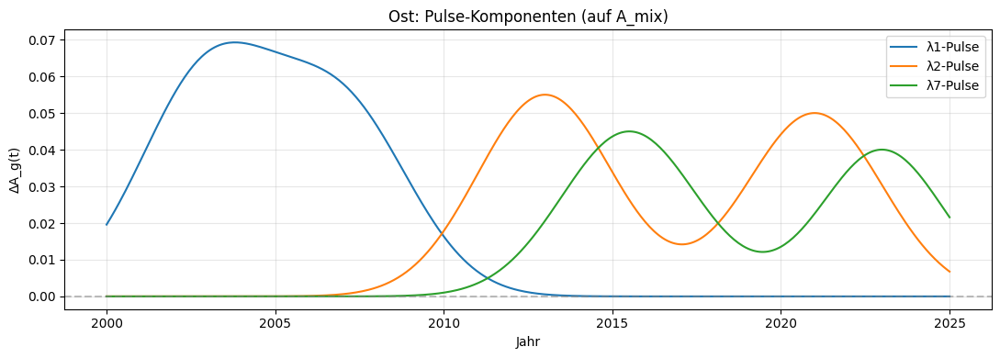

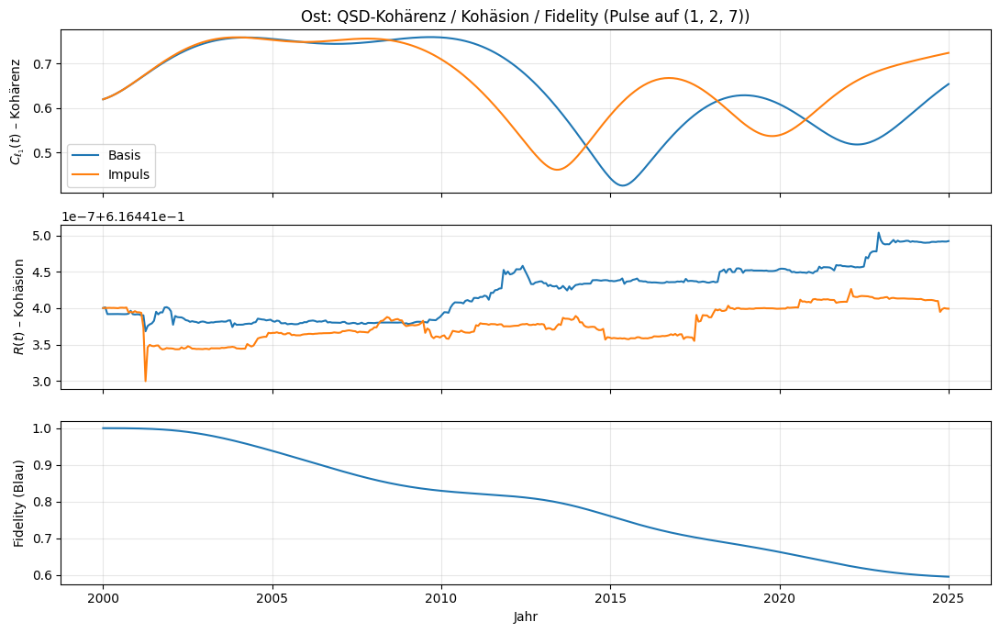

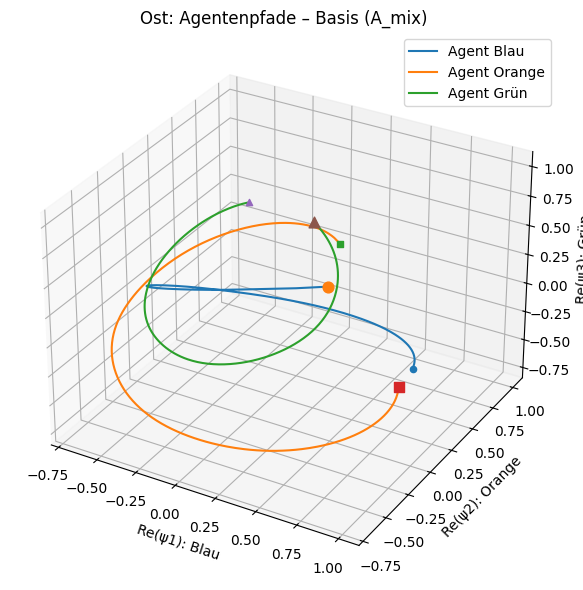

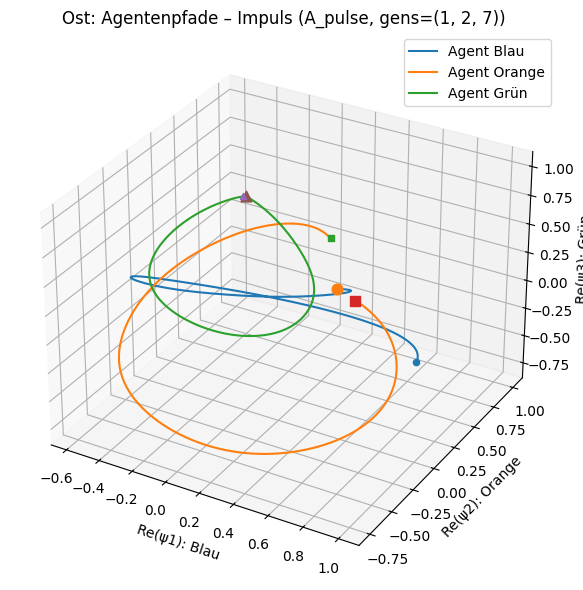

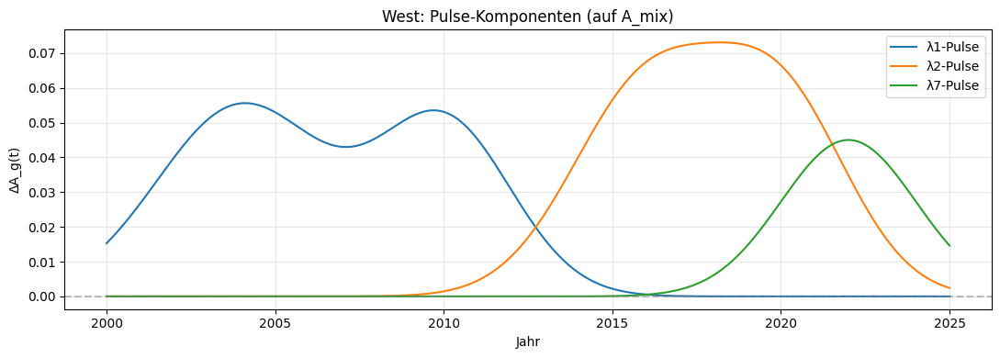

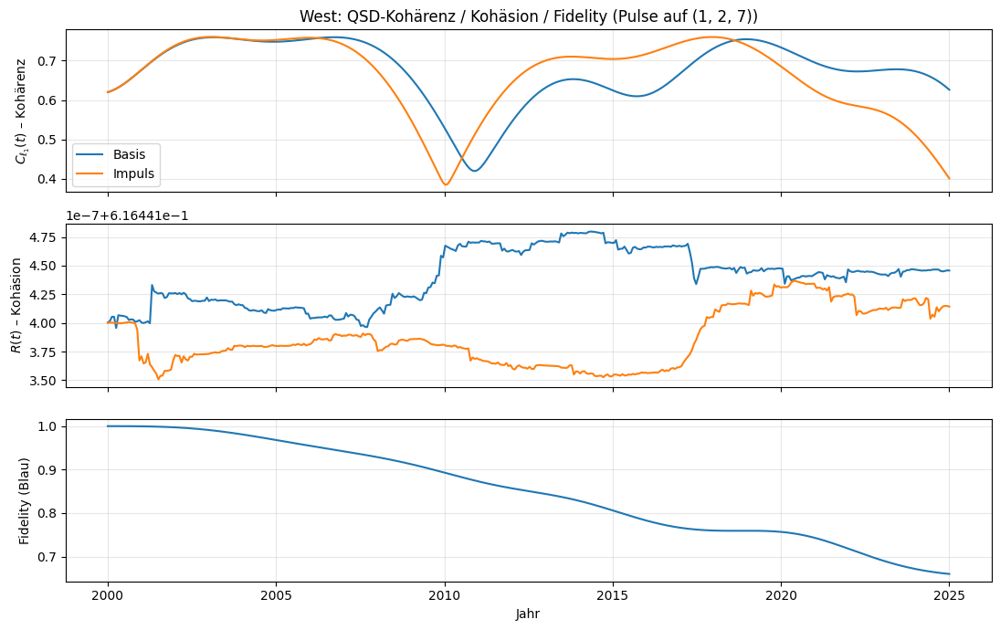

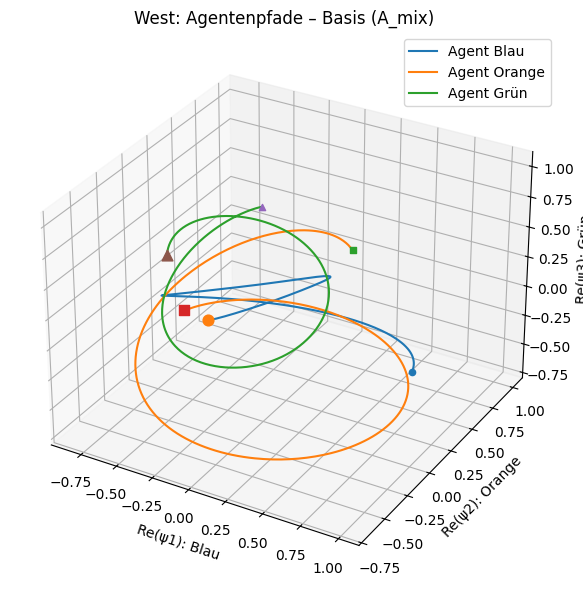

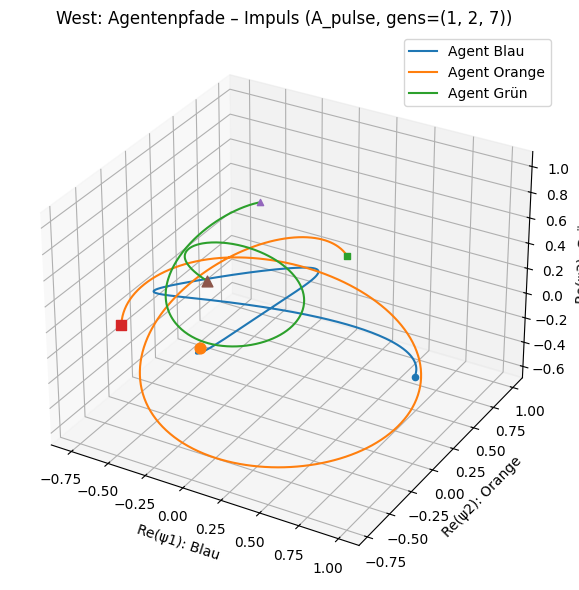

In [98]:
# =============================================================================
# ADD-ON: Politischer Impuls auf A_mix in ausgewählten Generatoren
#         + Integration als Variante "pulse" in ein QSD-Ergebnis-Dict
#         (überarbeitete Version mit unterschiedlichen Pulsen für Ost/West
#          und unterschiedlichen Profilen für λ1, λ2, λ7)
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# ---------- Helper: Hamilton aus Komponenten, Schrödinger-Evolution ---------

def _A_from_components_vec(a_vec):
    """Baue A = sum_a a_vec[a] * L_a."""
    A = np.zeros((3, 3), dtype=complex)
    for a in range(8):
        A += a_vec[a] * generators[a]
    return A

def evolve_with_A_components(t_eval, A_comp, psi0):
    """
    Entwickle |psi(t)> mit H(t)=A(t), A_comp.shape == (T, 8).
    Rückgabe: psi(t) als Array (T,3), normiert.
    """
    t_eval = np.asarray(t_eval)
    A_comp = np.asarray(A_comp)

    comp_inters = [
        interp1d(t_eval, A_comp[:, a], kind="linear", fill_value="extrapolate")
        for a in range(8)
    ]

    def H_of_t(t):
        coeffs = np.array([float(f(t)) for f in comp_inters])
        return _A_from_components_vec(coeffs)

    def rhs(t, y):
        psi = y[:3] + 1j*y[3:]
        H = H_of_t(t)
        dpsi = -1j * (H @ psi)
        return np.concatenate([dpsi.real, dpsi.imag])

    y0 = np.concatenate([psi0.real, psi0.imag])
    sol = solve_ivp(
        rhs, (t_eval[0], t_eval[-1]), y0,
        t_eval=t_eval, method="DOP853", rtol=1e-8, atol=1e-10
    )
    psi_t = sol.y[:3, :] + 1j*sol.y[3:, :]
    norms = np.maximum(1e-14, np.linalg.norm(psi_t, axis=0, keepdims=True))
    return (psi_t / norms).T  # (T,3)

# ---------- QSD-Mean-Field: R(t) und C_l1(t) aus Agentenpfaden --------------

def qsd_mean_field_from_paths(t_eval, psiA, psiB, psiC, s):
    """
    Berechne μ(t), R(t), C_l1(t) für eine Region s (−1=Ost, +1=West)
    aus Pfaden der drei Agenten (Blau/Orange/Grün).
    """
    t_eval = np.asarray(t_eval)
    psiA = np.asarray(psiA)
    psiB = np.asarray(psiB)
    psiC = np.asarray(psiC)

    wA, wB, wC = weights_of_s(s)

    mu = wA*psiA + wB*psiB + wC*psiC  # (T,3)
    R = np.linalg.norm(mu, axis=1)    # (T,)

    mu_hat = mu / (R[:, None] + 1e-15)
    sum_abs = np.sum(np.abs(mu_hat), axis=1)
    C_l1 = R**2 * (sum_abs**2 - 1.0)

    return R, C_l1

# ---------- Fidelity zwischen zwei Pfaden -----------------------------------

def fidelity_series(psi1, psi2):
    """F(t) = |<psi1|psi2>|^2, psi1/psi2: (T,3) komplex."""
    overlap = np.sum(np.conj(psi1)*psi2, axis=1)
    return np.abs(overlap)**2

# ---------- 3D-Plot der Agentenpfade ---------------------------------------

def plot_agent_paths_3d(psiA, psiB, psiC, title="Agentenpfade"):
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')

    for psi, lbl, marker in [
        (psiA, "Agent Blau",  'o'),
        (psiB, "Agent Orange", 's'),
        (psiC, "Agent Grün",  '^'),
    ]:
        x = psi[:,0].real
        y = psi[:,1].real
        z = psi[:,2].real
        ax.plot(x, y, z, label=lbl)
        ax.scatter(x[0], y[0], z[0], marker=marker)          # Start
        ax.scatter(x[-1], y[-1], z[-1], marker=marker, s=60) # Ende

    ax.set_xlabel("Re(ψ1): Blau")
    ax.set_ylabel("Re(ψ2): Orange")
    ax.set_zlabel("Re(ψ3): Grün")
    ax.set_title(title)
    ax.legend()
    plt.tight_layout()
    plt.show()

# ---------- Pulse-Bausteine -------------------------------------------------

def gauss_pulse(t, center, width, amp):
    """Einfacher Gauß-Puls."""
    t = np.asarray(t)
    return amp * np.exp(-0.5 * ((t - center) / width)**2)

def build_region_pulses(t_eval, region, gens=(1,2,7), amp_scale=1.0):
    """
    Erzeuge für eine Region (Ost/West) Pulse für die angegebenen Generatoren
    (z.B. λ1, λ2, λ7), die EXPLIZIT demokratie-stärkend gedacht sind.

    Grundidee:
      - λ1  (Blau–Orange):   institutionelle Stabilisierung, Rechtsstaat,
                             integrative Reformen (immer POSITIV)
      - λ2  (Orange–Grün):   pluralistischer Diskurs, Bürgerbeteiligung,
                             Medien-/Bildungspulse (POSITIVE Diskursenergie)
      - λ7  (Blau–Grün):     inklusive Identität („Wir in Vielfalt“),
                             Versöhnung Ost/West, Stadt/Land etc. (POSITIVE
                             Identitätsenergie, KEIN Konfliktpuls mehr)

    Zeitliche Schwerpunktsetzung:
      OST:
        - 2002–2008:   Aufbau demokratischer Institutionen (λ1)
        - 2012–2018:   Diskurs- und Versöhnungspulse nach der Krisenphase
                       (λ2 + λ7 positiv)
        - 2020–2025:   erneute integrative Demokratie-Impulse (v.a. λ2)

      WEST:
        - 2003–2010:   EU-/Rechtsstaats-/Modernisierungspulse (λ1)
        - 2014–2020:   pluralistischer Diskurs rund um Migration/Klima etc.
                       (λ2 positiv – Konflikte werden in Diskurskanäle geleitet)
        - 2020–2025:   inklusive Identitätspulse gegen Polarisierung (λ7 positiv)
    """
    t = np.asarray(t_eval)
    pulses = {g: np.zeros_like(t, dtype=float) for g in gens}

    if region == "Ost":
        # ---------- OST: demokratie-stärkende Transformation ----------
        if 1 in gens:
            # Institutionenaufbau & Rechtsstaat (frühe Transformationsphase)
            p = (gauss_pulse(t, center=2003.0, width=2.0, amp=0.06) +
                 gauss_pulse(t, center=2007.0, width=2.0, amp=0.05))
            pulses[1] = amp_scale * p

        if 2 in gens:
            # Diskurspulse: pluraler, konstruktiver Streit, Bürgerbeteiligung
            p = (gauss_pulse(t, center=2013.0, width=2.0, amp=0.055) +
                 gauss_pulse(t, center=2021.0, width=2.0, amp=0.050))
            pulses[2] = amp_scale * p

        if 7 in gens:
            # Inklusive Identität: „Wir in Vielfalt“ (Versöhnung, Brücken)
            p = (gauss_pulse(t, center=2015.5, width=2.0, amp=0.045) +
                 gauss_pulse(t, center=2023.0, width=1.8, amp=0.040))
            pulses[7] = amp_scale * p

    elif region == "West":
        # ---------- WEST: demokratie-stärkende Stabilisierung ----------
        if 1 in gens:
            # Institutionelle Modernisierung, EU-/Rechtsstaatsstärkung
            p = (gauss_pulse(t, center=2004.0, width=2.5, amp=0.055) +
                 gauss_pulse(t, center=2010.0, width=2.0, amp=0.050))
            pulses[1] = amp_scale * p

        if 2 in gens:
            # Pluralistischer Diskurs: Konflikte in deliberative Prozesse überführen
            p = (gauss_pulse(t, center=2016.0, width=2.2, amp=0.060) +
                 gauss_pulse(t, center=2020.0, width=2.0, amp=0.055))
            pulses[2] = amp_scale * p

        if 7 in gens:
            # Inklusive Identität: gegen Spaltung Stadt/Land, Alt/Jung, etc.
            p = gauss_pulse(t, center=2022.0, width=2.0, amp=0.045)
            pulses[7] = amp_scale * p

    # Fallback: falls andere Generatoren angegeben sind, bekommen sie
    # einen kleinen generischen POSITIVEN Puls zwischen 2010 und 2020.
    for g in gens:
        if np.allclose(pulses[g], 0.0):
            pulses[g] = amp_scale * gauss_pulse(t, center=2015.0, width=3.0, amp=0.04)

    return pulses


def build_region_pulses1(t_eval, region, gens=(1,2,7), amp_scale=1.0):
    """
    Erzeuge für eine Region (Ost/West) unterschiedliche Pulse für die
    angegebenen Generatoren (z.B. λ1, λ2, λ7).

    Szenario:
    - Ost:
        λ1: Integrations-/Aufbaupulse 2003–2008 und um 2010
        λ2: Diskurspuls um 2012 (mediale Legitimationsdebatten)
        λ7: stärker negativer Konfliktpuls ab 2015 und um 2021
    - West:
        λ1: längerer pro-EU/Globalisierungspuls 2004–2015
        λ2: Diskurspuls 2015–2021 (Migration/Identität)
        λ7: später Konfliktpuls 2018–2024 (Öko-/Klima-Konflikte)
    """
    t = np.asarray(t_eval)
    pulses = {g: np.zeros_like(t, dtype=float) for g in gens}

    if region == "Ost":
        if 1 in gens:
            # λ1(Ost): zwei positive Integrations-/Aufbaupulse
            p = (gauss_pulse(t, center=2004.0, width=2.0, amp=0.080) +
                 gauss_pulse(t, center=2010.0, width=1.5, amp=0.060))
            pulses[1] = amp_scale * p
        if 2 in gens:
            # λ2(Ost): moderater Diskurspuls um 2012
            p = gauss_pulse(t, center=2012.0, width=1.8, amp=0.048)
            pulses[2] = amp_scale * p
        if 7 in gens:
            # λ7(Ost): negativer Konfliktpuls ab 2015 + Zusatz um 2021
            p = (gauss_pulse(t, center=2016.0, width=1.8, amp=-0.100) +
                 gauss_pulse(t, center=2021.0, width=1.2, amp=-0.072))
            pulses[7] = amp_scale * p

    elif region == "West":
        if 1 in gens:
            # λ1(West): längerer positiver Reform-/Globalisierungspuls
            p = (gauss_pulse(t, center=2006.0, width=3.0, amp=0.088) +
                 gauss_pulse(t, center=2013.0, width=2.0, amp=0.072))
            pulses[1] = amp_scale * p
        if 2 in gens:
            # λ2(West): starker Diskurspuls 2015–2021
            p = gauss_pulse(t, center=2017.5, width=2.0, amp=0.072)
            pulses[2] = amp_scale * p
        if 7 in gens:
            # λ7(West): später Konfliktpuls (Öko-/Klima-Konflikte)
            p = gauss_pulse(t, center=2019.5, width=2.0, amp=-0.080)
            pulses[7] = amp_scale * p

    # Fallback: falls andere Generatoren angegeben sind, bekommen sie
    # einen kleinen generischen Puls zwischen 2010 und 2020.
    for g in gens:
        if np.allclose(pulses[g], 0.0):
            pulses[g] = amp_scale * gauss_pulse(t, center=2015.0, width=3.0, amp=0.080)

    return pulses

# ---------- Hauptfunktion: Intervention auf A_mix + Variante "pulse" --------

def run_intervention_impulse_analysis(
        ost_west_results,
        base_key="A_mix",          # Feld, auf dem der Impuls aufsetzt
        new_key="A_pulse",         # Name des neuen Feldes im Dict ost_west_results
        gens=(1, 2, 7),            # betroffene Generatoren (1..8)
        amp_scale=1.0,             # globaler Skalenfaktor für alle Pulse
        results_qsd=None,          # OPTIONAL: QSD-Ergebnis-Dict (z.B. results_mix)
        variant_name="pulse",      # Name der neuen Variante in results_qsd
        plot=True,
        plot_pulses=True):
    """
    Erzeuge für Ost/West ein neues Feld A_pulse = A_base + regionen- und
    generator-spezifische Pulse und analysiere die Auswirkungen auf
    Kohärenz, Kohäsion und Agentenpfade.
    """

    region_s = {"Ost": -1.0, "West": +1.0}
    psi0s = {
        "Blau":   np.array([1,0,0], dtype=complex),
        "Orange": np.array([0,1,0], dtype=complex),
        "Grün":   np.array([0,0,1], dtype=complex),
    }

    summary = {}

    for region in ["Ost", "West"]:
        if region not in ost_west_results:
            print(f"[WARN] Region '{region}' nicht in ost_west_results.")
            continue

        data = ost_west_results[region]
        if base_key not in data:
            print(f"[{region}] WARN: Feld '{base_key}' nicht gefunden. "
                  f"Verfügbare Felder: {list(data.keys())}")
            continue

        t_eval = np.asarray(data["t_eval"])
        A_base = np.asarray(data[base_key])  # (T,8)

        # --- regionen- & generator-spezifische Pulse bauen ------------------
        pulses = build_region_pulses(t_eval, region, gens=gens, amp_scale=amp_scale)
        A_new = A_base.copy()

        for g in gens:
            idx = int(g) - 1  # 1..8 -> 0..7
            if 0 <= idx < 8:
                A_new[:, idx] += pulses[g]
            else:
                print(f"[{region}] WARN: Generatorindex {g} außerhalb 1..8")

        # neuen Feldkey in ost_west_results speichern
        ost_west_results[region][new_key] = A_new

        # --- Agentenpfade in Basis- und Impulsfeld --------------------------
        psi_paths_base = {}
        psi_paths_new  = {}

        for name, psi0 in psi0s.items():
            psi_paths_base[name] = evolve_with_A_components(t_eval, A_base, psi0)
            psi_paths_new[name]  = evolve_with_A_components(t_eval, A_new,  psi0)

        # Mean-Field aus drei Agenten
        psiA_b, psiB_b, psiC_b = (
            psi_paths_base["Blau"], psi_paths_base["Orange"], psi_paths_base["Grün"]
        )
        psiA_n, psiB_n, psiC_n = (
            psi_paths_new["Blau"], psi_paths_new["Orange"], psi_paths_new["Grün"]
        )

        R_base, C_base = qsd_mean_field_from_paths(
            t_eval, psiA_b, psiB_b, psiC_b, s=region_s[region]
        )
        R_new,  C_new  = qsd_mean_field_from_paths(
            t_eval, psiA_n, psiB_n, psiC_n, s=region_s[region]
        )

        # Fidelity für den Blau-Agenten (Basis vs. Impulsfeld)
        F_blau = fidelity_series(psi_paths_new["Blau"], psi_paths_base["Blau"])

        summary[region] = dict(
            t_eval=t_eval,
            A_base=A_base,
            A_pulse=A_new,
            pulses=pulses,
            R_base=R_base, C_base=C_base,
            R_new=R_new,   C_new=C_new,
            psi_base=psi_paths_base,
            psi_new=psi_paths_new,
            F_blau=F_blau,
        )

        # --- Integration als Variante "pulse" in results_qsd ----------------
        if results_qsd is not None and region in results_qsd:
            reg_qsd = results_qsd[region]
            t_eval_q = np.asarray(reg_qsd["t_eval"])
            if np.allclose(t_eval_q, t_eval):
                reg_qsd.setdefault("variants", {})
                reg_qsd["variants"][variant_name] = dict(
                    psi_paths=psi_paths_new,
                    C_l1=C_new,
                    R=R_new
                )
            else:
                print(f"[{region}] WARN: t_eval in results_qsd passt nicht zu "
                      f"ost_west_results – Variante '{variant_name}' wird nicht eingetragen.")

        # --- Plots ----------------------------------------------------------
        if plot_pulses:
            # Pulse-Komponenten explizit darstellen
            fig, ax = plt.subplots(figsize=(11, 4))
            for g in gens:
                ax.plot(t_eval, pulses[g], label=f"λ{g}-Pulse")
            ax.axhline(0.0, color="gray", linestyle="--", alpha=0.5)
            ax.set_title(f"{region}: Pulse-Komponenten (auf {base_key})")
            ax.set_xlabel("Jahr")
            ax.set_ylabel("ΔA_g(t)")
            ax.legend()
            ax.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()

        if not plot:
            continue

        # Zeitreihen: Kohärenz, Kohäsion, Fidelity
        fig, axes = plt.subplots(3, 1, figsize=(11, 7), sharex=True)
        axes[0].plot(t_eval, C_base, label="Basis")
        axes[0].plot(t_eval, C_new,  label="Impuls")
        axes[0].set_ylabel(r"$C_{\ell_1}(t)$ – Kohärenz")
        axes[0].set_title(f"{region}: QSD-Kohärenz / Kohäsion / Fidelity (Pulse auf {gens})")
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        axes[1].plot(t_eval, R_base, label="Basis")
        axes[1].plot(t_eval, R_new,  label="Impuls")
        axes[1].set_ylabel(r"$R(t)$ – Kohäsion")
        axes[1].grid(True, alpha=0.3)

        axes[2].plot(t_eval, F_blau)
        axes[2].set_ylabel("Fidelity (Blau)")
        axes[2].set_xlabel("Jahr")
        axes[2].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # 3D-Pfade: Basis vs Impulsfeld
        plot_agent_paths_3d(
            psiA_b, psiB_b, psiC_b,
            title=f"{region}: Agentenpfade – Basis ({base_key})"
        )
        plot_agent_paths_3d(
            psiA_n, psiB_n, psiC_n,
            title=f"{region}: Agentenpfade – Impuls ({new_key}, gens={gens})"
        )

    return summary, results_qsd

# =============================================================================
# Beispielaufruf (Parameter kannst du anpassen):
# =============================================================================
summary_impuls, results_mix = run_intervention_impulse_analysis(
    ost_west_results,
    base_key="A_mix",      # oder "A_coup"
    new_key="A_pulse",
    gens=(1, 2, 7),        # politischer Impuls in λ1, λ2, λ7
    amp_scale=1.0,         # globaler Skalenfaktor
    results_qsd=results_mix,
    variant_name="pulse",
    plot=True,
    plot_pulses=True
)


In [99]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- Clipping-Funktion genau nach deiner Definition ---------------

def _clip_series_quantile(X, q_low=0.10, q_high=0.90):
    """
    Quantilbasierte Normalisierung + Clipping:
    \tilde{X}(t) = clip( (X - Q_{q_low}) / (Q_{q_high} - Q_{q_low}), 0, 1 )

    X: 1D-Array
    Rückgabe: 1D-Array gleicher Länge im Bereich [0,1].
    """
    X = np.asarray(X)
    q1, q2 = np.quantile(X, q_low), np.quantile(X, q_high)
    denom = max(q2 - q1, 1e-12)
    Xn = (X - q1) / denom
    return np.clip(Xn, 0.0, 1.0)

# ---------- Demokratieindex-Analyse --------------------------------------

def run_democracy_index_analysis(
        results_qsd,
        variants=None,
        joint_across_regions=False,
        plot=True):
    """
    QSD-Demokratieindex D(t) = \tilde C_{l1}(t) * \tilde R(t)
    für jede Region und jede Variante.

    Parameter
    ---------
    results_qsd : dict
        Ergebnis-Dict aus einem QSD-Add-on (z.B. run_A_mix_analysis).
    variants : list[str] oder None
        Welche Varianten ausgewertet werden sollen.
        None -> alle Varianten in results_qsd[region]["variants"].
    joint_across_regions : bool
        False (Standard): Quantile für C_l1 und R werden PRO REGION
        über die gewählten Varianten bestimmt.
        True: Quantile werden ÜBER ALLE REGIONEN UND VARIANTEN
        gemeinsam bestimmt (globale Skala).
    plot : bool
        True -> Plots erzeugen, False -> nur Berechnung.

    Rückgabe
    --------
    results_dem : dict
        Kopie von results_qsd mit zusätzlichen Feldern:
        pro Variante: "C_l1_tilde", "R_tilde", "D".
    """
    # defensive Kopie
    results_dem = {}
    for region, reg_data in results_qsd.items():
        results_dem[region] = {
            "t_eval": np.array(reg_data["t_eval"]),
            "variants": {}
        }
        for v_name, v_data in reg_data["variants"].items():
            results_dem[region]["variants"][v_name] = dict(v_data)

    # --- ggf. globale Quantile vorberechnen -------------------------------
    if joint_across_regions:
        C_all_global = []
        R_all_global = []
        # sammle alle C_l1 und R über Regionen & Varianten
        for region, reg_data in results_dem.items():
            var_dict = reg_data["variants"]
            if variants is None:
                v_list = list(var_dict.keys())
            else:
                v_list = [v for v in variants if v in var_dict]
            for v in v_list:
                C_all_global.append(np.asarray(var_dict[v]["C_l1"]))
                R_all_global.append(np.asarray(var_dict[v]["R"]))
        if C_all_global:
            C_all_global = np.concatenate(C_all_global)
            R_all_global = np.concatenate(R_all_global)
            C_q10_glob, C_q90_glob = np.quantile(C_all_global, [0.10, 0.90])
            R_q10_glob, R_q90_glob = np.quantile(R_all_global, [0.10, 0.90])
            C_denom_glob = max(C_q90_glob - C_q10_glob, 1e-12)
            R_denom_glob = max(R_q90_glob - R_q10_glob, 1e-12)
        else:
            C_q10_glob = C_q90_glob = 0.0
            R_q10_glob = R_q90_glob = 0.0
            C_denom_glob = R_denom_glob = 1.0

    # --- Verarbeitung pro Region -----------------------------------------
    for region, reg_data in results_dem.items():
        t_eval = reg_data["t_eval"]
        var_dict = reg_data["variants"]

        if variants is None:
            v_list = list(var_dict.keys())
        else:
            v_list = [v for v in variants if v in var_dict]

        if not v_list:
            print(f"[WARN] Region {region}: keine passenden Varianten gefunden.")
            continue

        # region-spezifische Quantile (falls NICHT joint)
        if not joint_across_regions:
            C_all = np.concatenate([var_dict[v]["C_l1"] for v in v_list])
            R_all = np.concatenate([var_dict[v]["R"]    for v in v_list])
            C_q10, C_q90 = np.quantile(C_all, [0.10, 0.90])
            R_q10, R_q90 = np.quantile(R_all, [0.10, 0.90])
            C_denom = max(C_q90 - C_q10, 1e-12)
            R_denom = max(R_q90 - R_q10, 1e-12)
        else:
            C_q10, C_q90 = C_q10_glob, C_q90_glob
            R_q10, R_q90 = R_q10_glob, R_q90_glob
            C_denom, R_denom = C_denom_glob, R_denom_glob

        # --- Pro Variante normalisieren & Demokratieindex berechnen -------
        for v_name in v_list:
            C = np.asarray(var_dict[v_name]["C_l1"])
            R = np.asarray(var_dict[v_name]["R"])

            C_tilde = np.clip((C - C_q10) / C_denom, 0.0, 1.0)
            R_tilde = np.clip((R - R_q10) / R_denom, 0.0, 1.0)

            D = C_tilde * R_tilde  # Collective Mind Index

            var_dict[v_name]["C_l1_tilde"] = C_tilde
            var_dict[v_name]["R_tilde"]    = R_tilde
            var_dict[v_name]["D"]          = D

        # --- Plots für diese Region --------------------------------------
        if plot:
            colors = ["C0", "C1", "C2", "C3", "C4"]
            plt.figure(figsize=(11, 7))

            # 1) Kohärenz geclippt
            ax1 = plt.subplot(3, 1, 1)
            for i, v_name in enumerate(v_list):
                ax1.plot(t_eval, var_dict[v_name]["C_l1_tilde"],
                         label=v_name, color=colors[i % len(colors)])
            ax1.set_ylabel(r"$\tilde C_{\ell_1}(t)$ – Kohärenz")
            ax1.set_title(
                f"QSD-Demokratieindex – {region} "
                f"(joint_across_regions={joint_across_regions})"
            )
            ax1.grid(True, alpha=0.3)
            ax1.legend()

            # 2) Kohäsion geclippt
            ax2 = plt.subplot(3, 1, 2, sharex=ax1)
            for i, v_name in enumerate(v_list):
                ax2.plot(t_eval, var_dict[v_name]["R_tilde"],
                         label=v_name, color=colors[i % len(colors)])
            ax2.set_ylabel(r"$\tilde R(t)$ – Kohäsion")
            ax2.grid(True, alpha=0.3)

            # 3) Demokratieindex
            ax3 = plt.subplot(3, 1, 3, sharex=ax1)
            for i, v_name in enumerate(v_list):
                ax3.plot(t_eval, var_dict[v_name]["D"],
                         label=v_name, color=colors[i % len(colors)])
            ax3.set_ylabel(r"$D(t)$ – Demokratieindex")
            ax3.set_xlabel("Jahr")
            ax3.grid(True, alpha=0.3)

            plt.tight_layout()
            plt.show()

        # kurze Zusammenfassung pro Region
        mean_D = {v: float(np.mean(var_dict[v]["D"])) for v in v_list}
        print(f"=== Mittelwerte Demokratieindex – {region} "
              f"(joint_across_regions={joint_across_regions}) ===")
        for v in v_list:
            print(f"  {v}: ⟨D⟩ = {mean_D[v]:.3f}")

    return results_dem


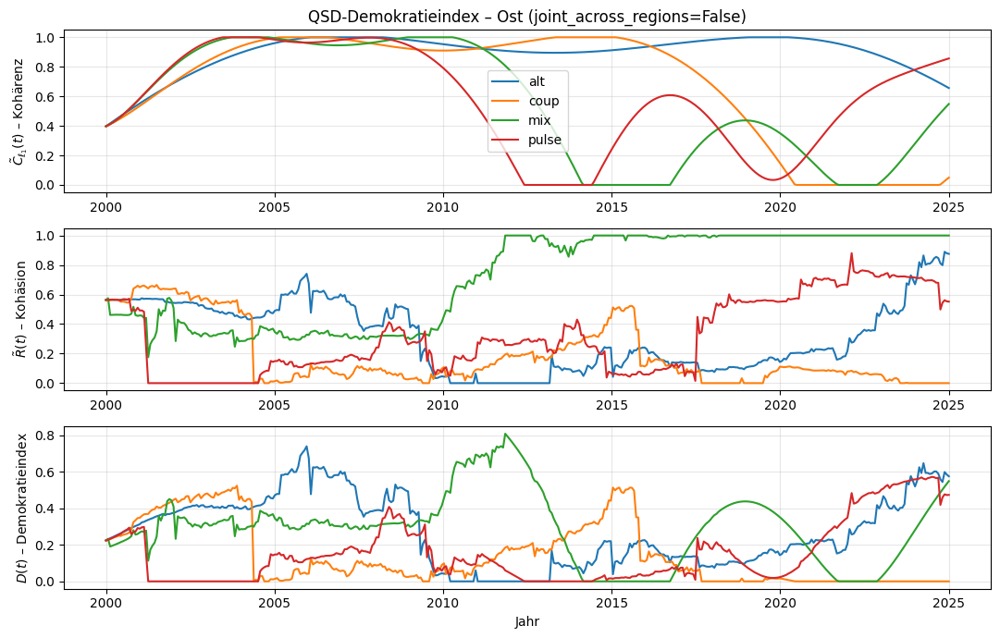

=== Mittelwerte Demokratieindex – Ost (joint_across_regions=False) ===
  alt: ⟨D⟩ = 0.273
  coup: ⟨D⟩ = 0.143
  mix: ⟨D⟩ = 0.290
  pulse: ⟨D⟩ = 0.153


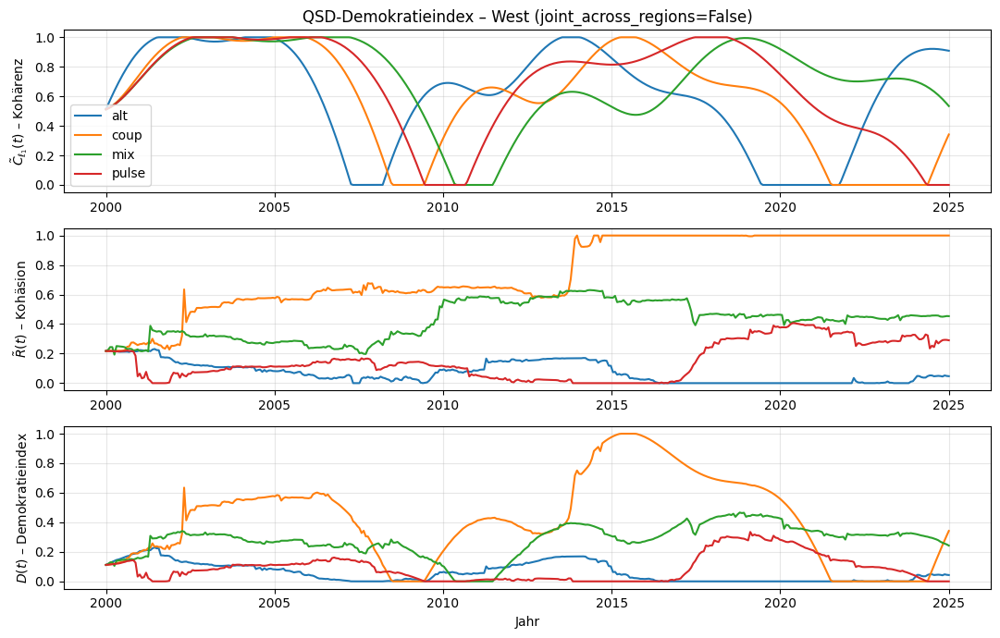

=== Mittelwerte Demokratieindex – West (joint_across_regions=False) ===
  alt: ⟨D⟩ = 0.059
  coup: ⟨D⟩ = 0.417
  mix: ⟨D⟩ = 0.277
  pulse: ⟨D⟩ = 0.089


In [100]:
results_dem = run_democracy_index_analysis(
    results_mix,
    variants=["alt", "coup", "mix", "pulse"],  # oder eine Teilmenge
    joint_across_regions=False,               # pro Region skalieren
    plot=True
)


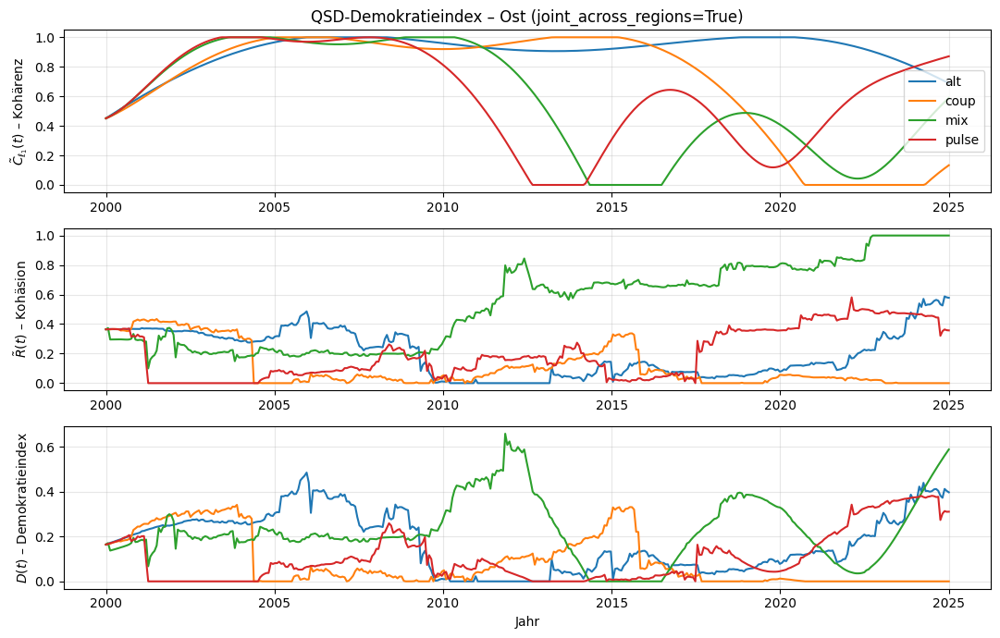

=== Mittelwerte Demokratieindex – Ost (joint_across_regions=True) ===
  alt: ⟨D⟩ = 0.174
  coup: ⟨D⟩ = 0.088
  mix: ⟨D⟩ = 0.225
  pulse: ⟨D⟩ = 0.103


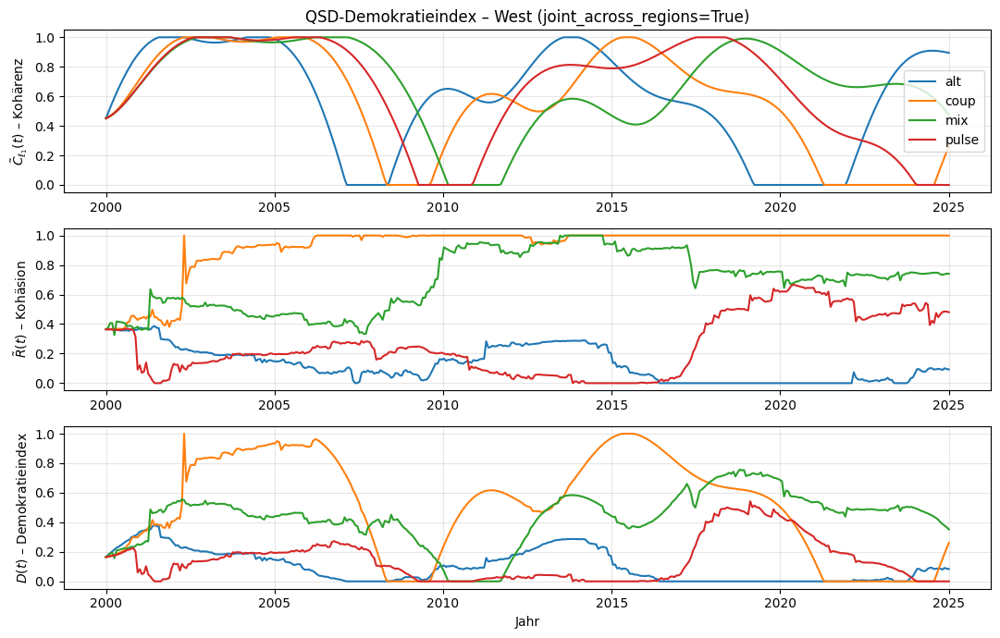

=== Mittelwerte Demokratieindex – West (joint_across_regions=True) ===
  alt: ⟨D⟩ = 0.100
  coup: ⟨D⟩ = 0.508
  mix: ⟨D⟩ = 0.430
  pulse: ⟨D⟩ = 0.143


In [101]:
results_dem_global = run_democracy_index_analysis(
    results_mix,
    variants=["alt", "coup", "mix", "pulse"],
    joint_across_regions=True,               # eine Skala für Ost+West
    plot=True
)


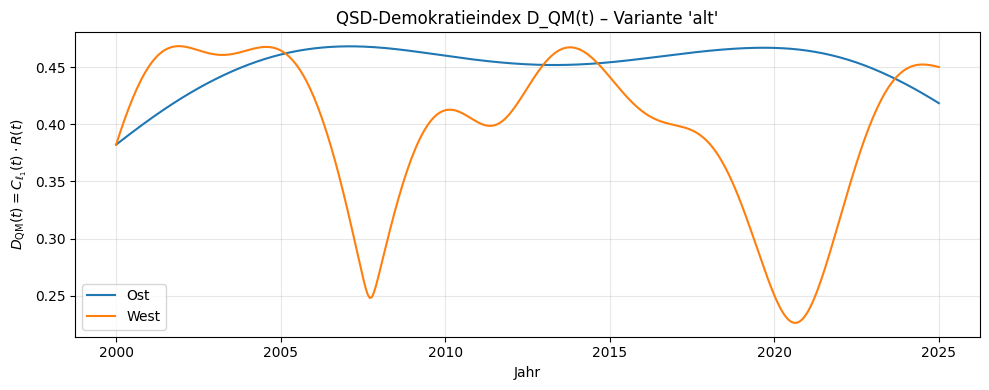

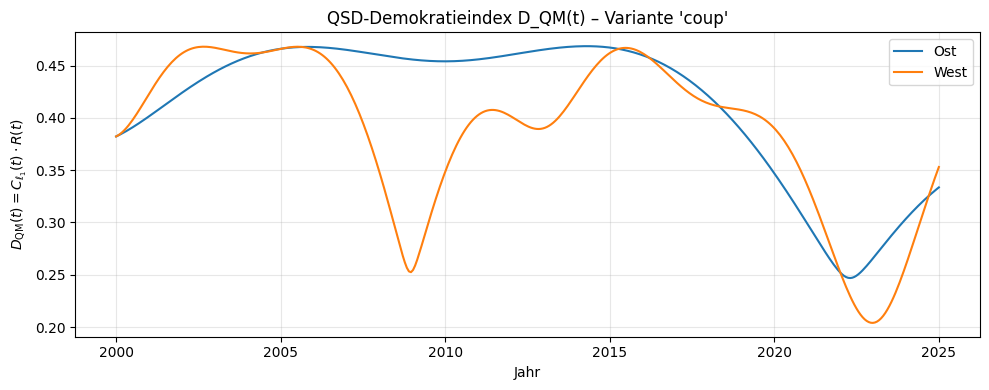

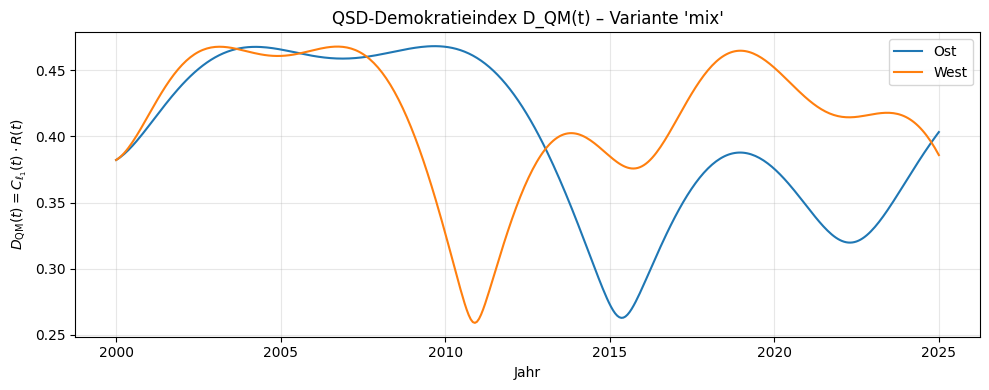

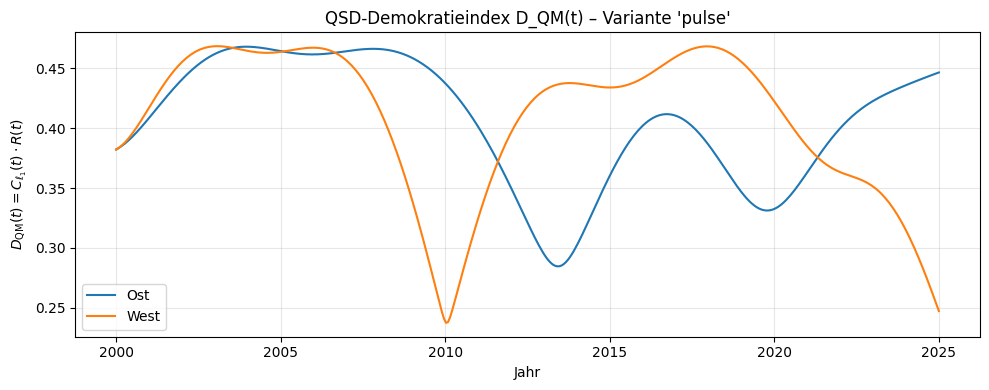

=== Mittelwerte D_QM pro Variante 'alt' ===
  Ost: ⟨D_QM⟩ = 0.4519
  West: ⟨D_QM⟩ = 0.3958

=== Mittelwerte D_QM pro Variante 'coup' ===
  Ost: ⟨D_QM⟩ = 0.4139
  West: ⟨D_QM⟩ = 0.3893

=== Mittelwerte D_QM pro Variante 'mix' ===
  Ost: ⟨D_QM⟩ = 0.3989
  West: ⟨D_QM⟩ = 0.4149

=== Mittelwerte D_QM pro Variante 'pulse' ===
  Ost: ⟨D_QM⟩ = 0.4062
  West: ⟨D_QM⟩ = 0.4080



In [102]:
# =====================================================================
# ADD-ON: QSD-Demokratieindex (quantenmechanisch)
#         D_QM(t,s) = C_l1(t,s) * R(t,s), ohne Clipping
#
# Voraussetzungen:
# - numpy as np
# - matplotlib.pyplot as plt
# - ein Ergebnis-Dict wie z.B. results_mix aus run_A_mix_analysis:
#   results_mix[region] = {
#       "t_eval": (T,),
#       "variants": {
#           "alt":  {"C_l1": (T,), "R": (T,), ...},
#           "coup": {"C_l1": (T,), "R": (T,), ...},
#           "mix":  {"C_l1": (T,), "R": (T,), ...},
#           ...
#       }
#   }
# =====================================================================

import numpy as np
import matplotlib.pyplot as plt

def run_democracy_qm_index(results_qsd, variants=None, plot=True):
    """
    Berechnet den quantenmechanischen Demokratieindex

        D_QM(t,s) = C_l1(t,s) * R(t,s)

    für jede Region und Variante und plottet D_QM für Ost & West
    gemeinsam (pro Variante ein Plot).

    Parameter
    ---------
    results_qsd : dict
        Ergebnis-Dict aus einem QSD-Add-on, z.B. results_mix.
    variants : list[str] oder None
        Welche Varianten betrachtet werden sollen.
        None -> alle Varianten, die in jeder Region verfügbar sind.
    plot : bool
        True -> Plots erzeugen, False -> nur Berechnung.

    Rückgabe
    --------
    results_qm : dict
        Kopie von results_qsd mit zusätzlichem Feld
        results_qm[region]["variants"][v]["D_QM"].
    """
    # defensive Kopie
    results_qm = {}
    for region, reg_data in results_qsd.items():
        results_qm[region] = {
            "t_eval": np.array(reg_data["t_eval"]),
            "variants": {}
        }
        for v_name, v_data in reg_data["variants"].items():
            results_qm[region]["variants"][v_name] = dict(v_data)

    # Regionennamen (wir erwarten mindestens "Ost" und "West")
    regions = list(results_qm.keys())

    # falls Varianten nicht explizit angegeben sind:
    if variants is None:
        # Schnittmenge der Varianten über alle Regionen
        common = None
        for region in regions:
            v_set = set(results_qm[region]["variants"].keys())
            common = v_set if common is None else (common & v_set)
        variants = sorted(list(common))

    # --- D_QM pro Region und Variante berechnen --------------------------
    for region in regions:
        t_eval = results_qm[region]["t_eval"]
        var_dict = results_qm[region]["variants"]

        for v_name in variants:
            if v_name not in var_dict:
                continue
            C_l1 = np.asarray(var_dict[v_name]["C_l1"])
            R    = np.asarray(var_dict[v_name]["R"])

            D_qm = C_l1 * R  # einfacher quantenmechanischer Demokratieindex
            var_dict[v_name]["D_QM"] = D_qm

    # --- Plots: pro Variante ein Plot mit Ost & West ---------------------
    if plot:
        colors = {"Ost": "C0", "West": "C1"}
        for v_name in variants:
            plt.figure(figsize=(10, 4))
            for region in ["Ost", "West"]:
                if region not in results_qm:
                    continue
                var_dict = results_qm[region]["variants"]
                if v_name not in var_dict:
                    continue
                t_eval = results_qm[region]["t_eval"]
                D_qm   = var_dict[v_name]["D_QM"]
                plt.plot(t_eval, D_qm,
                         label=f"{region}",
                         color=colors.get(region, None))

            plt.title(f"QSD-Demokratieindex D_QM(t) – Variante '{v_name}'")
            plt.xlabel("Jahr")
            plt.ylabel(r"$D_{\mathrm{QM}}(t) = C_{\ell_1}(t)\cdot R(t)$")
            plt.grid(True, alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

    # kurze Zusammenfassung
    for v_name in variants:
        print(f"=== Mittelwerte D_QM pro Variante '{v_name}' ===")
        for region in ["Ost", "West"]:
            if region not in results_qm:
                continue
            var_dict = results_qm[region]["variants"]
            if v_name not in var_dict:
                continue
            D_mean = float(np.mean(var_dict[v_name]["D_QM"]))
            print(f"  {region}: ⟨D_QM⟩ = {D_mean:.4f}")
        print("")

    return results_qm

# Beispielaufruf, wenn du z.B. results_mix hast:
results_qm = run_democracy_qm_index(results_mix,
                                    variants=["alt", "coup", "mix", "pulse"],
                                     plot=True)


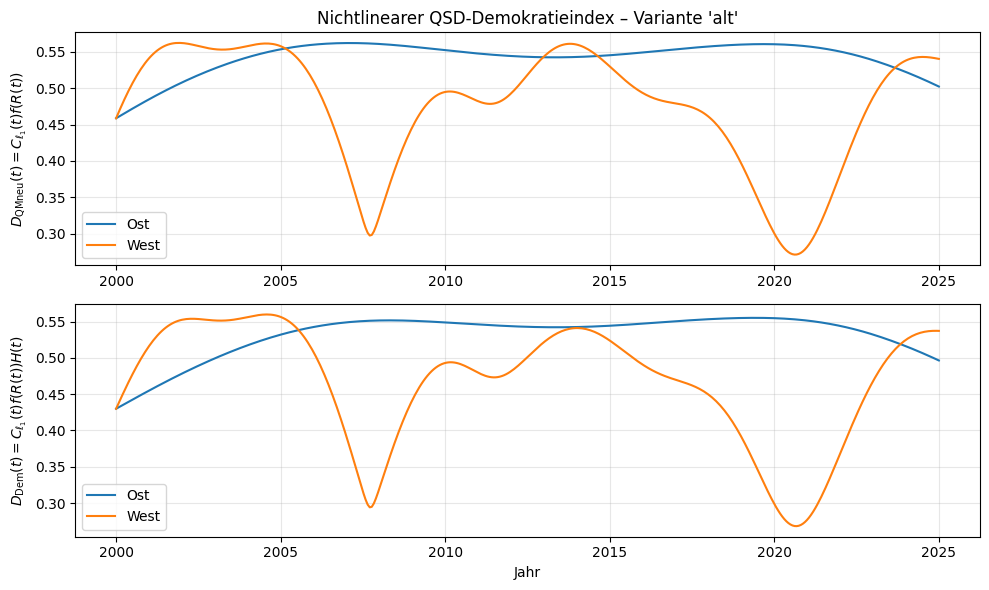

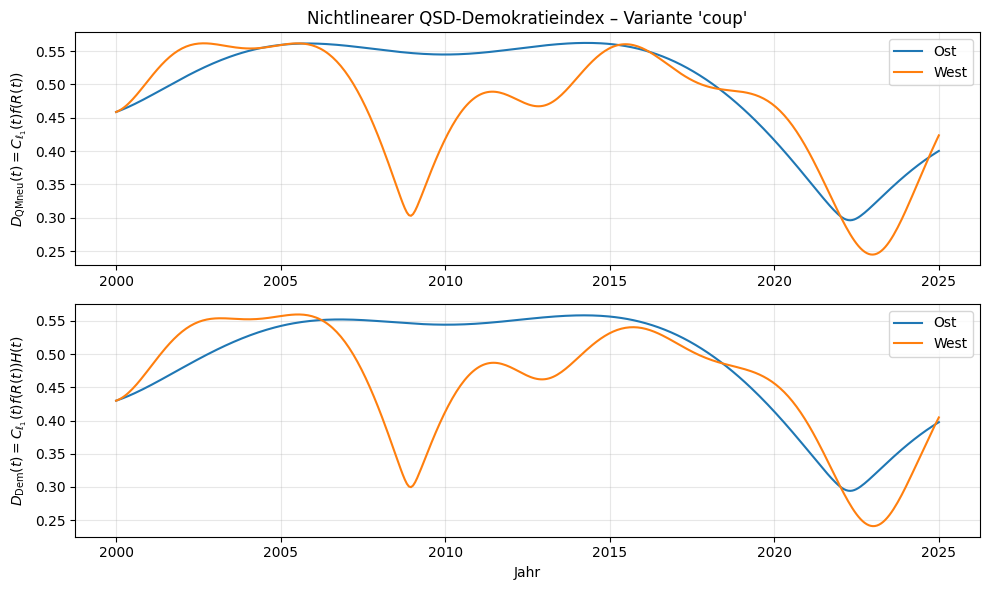

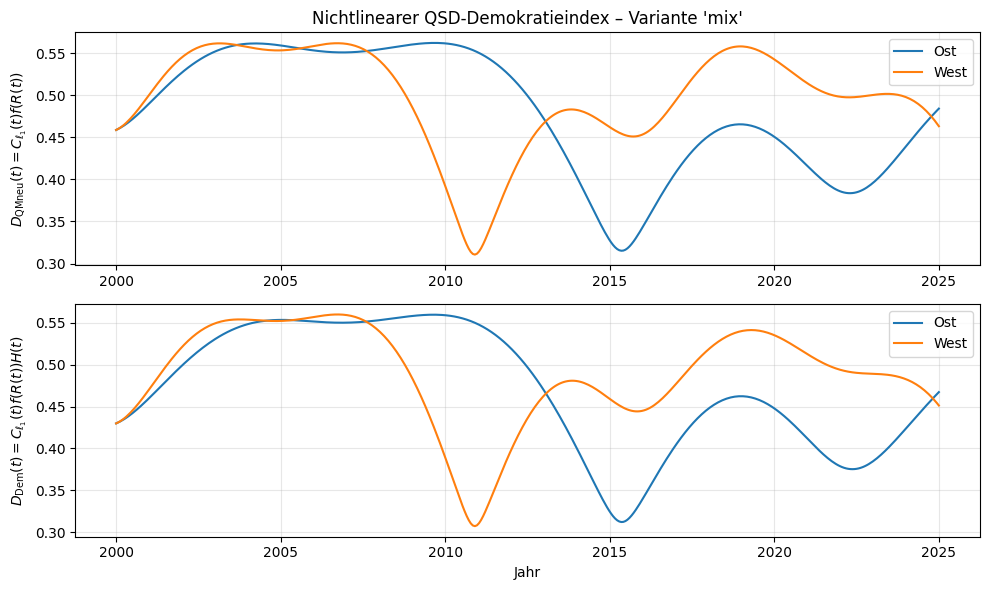

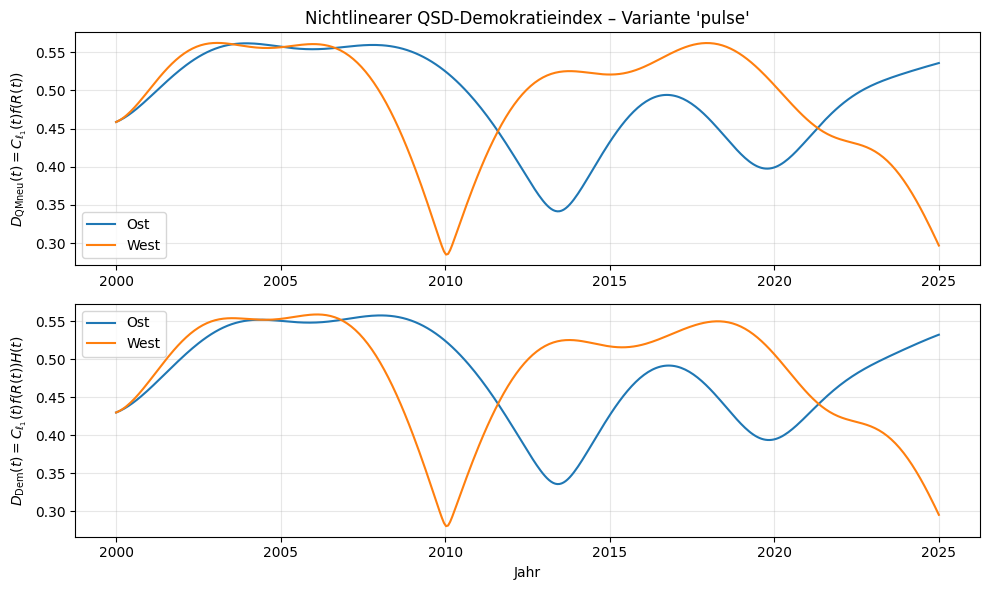

In [103]:
# =============================================================================
# ADD-ON: Nichtlinearer QSD-Demokratieindex mit f(R) und Diversität H
# =============================================================================
# Voraussetzungen:
# - numpy as np, matplotlib.pyplot as plt
# - Funktion weights_of_s(s) existiert (sonst Default)
# - results_mix = run_A_mix_analysis(...)
#     Struktur: results_mix[region]["variants"][v_name]["psi_paths"]
# - optional summary_impuls = run_intervention_impulse_analysis(...)
#     Struktur: summary_impuls[region]["psi_new"]
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt

def _get_weights_for_s(s):
    """Gewichte aus deinem Hauptmodell oder Default."""
    try:
        wA, wB, wC = weights_of_s(s)
    except NameError:
        wA, wB, wC = 0.5, 0.3, 0.2
    return wA, wB, wC

def qsd_mean_field_and_pavg_from_paths(psi_paths, s):
    """
    Nutzt GENAU deine Formeln:
      μ = Σ_n w_n ψ_n
      R = ||μ||
      C_l1 = R^2 [ (Σ_i |μ̂_i|)^2 - 1 ]
    Zusätzlich: p_avg(t,s) = Σ_n w_n |ψ_n|^2
    psi_paths: dict {"Blau":psiA, "Orange":psiB, "Grün":psiC}, (T,3) komplex.
    """
    psiA = np.asarray(psi_paths["Blau"])
    psiB = np.asarray(psi_paths["Orange"])
    psiC = np.asarray(psi_paths["Grün"])

    wA, wB, wC = _get_weights_for_s(s)

    # μ(t,s)
    mu = wA*psiA + wB*psiB + wC*psiC          # (T,3)
    # R(t,s)
    R = np.linalg.norm(mu, axis=1)           # (T,)

    # C_l1(t,s)
    eps = 1e-14
    mu_hat = mu / (R[:, None] + eps)
    sum_abs = np.sum(np.abs(mu_hat), axis=1)
    C_l1 = R**2 * (sum_abs**2 - 1.0)

    # p_avg(t,s) aus |ψ_n|^2
    pA = np.abs(psiA)**2
    pB = np.abs(psiB)**2
    pC = np.abs(psiC)**2
    p_avg = wA*pA + wB*pB + wC*pC            # (T,3), Norm ~1

    return R, C_l1, p_avg

def entropy_H_from_pavg(p_avg):
    """
    H(t,s) = normierte Shannon-Entropie von p_avg(t,s).
    Normierung auf [0,1] mit log(3) (Anzahl Wertedimensionen).
    """
    p = np.asarray(p_avg)
    eps = 1e-14
    p = np.clip(p, eps, 1.0)
    H_raw = -np.sum(p * np.log(p), axis=1)      # in nats
    H_max = np.log(p.shape[1])                  # log(3)
    H = H_raw / (H_max + eps)
    return H

def f_of_R(R, R_star=0.5, sigma=0.15):
    """
    Invertierte-U-Funktion:
      f(R) = exp(- (R-R*)^2 / (2 sigma^2))
    Maximal bei R = R_star, klein bei zu kleiner/großer Kohäsion.
    """
    R = np.asarray(R)
    return np.exp(-0.5 * ((R - R_star) / sigma)**2)

def run_nonlinear_democracy_index(
        results_mix,
        summary_impuls=None,
        R_star=0.5,
        sigma=0.15,
        plot=True):
    """
    Berechnet für jede Region (Ost/West) und Variante:
      D_QMneu(t) = C_l1(t) * f(R(t))
      D_Dem(t)   = C_l1(t) * f(R(t)) * H(t)
    Variants:
      - 'alt', 'coup', 'mix' aus results_mix
      - optional 'pulse' aus summary_impuls (psi_new)
    Rückgabe: dict dem_results[region][variant] mit
      t_eval, R, C_l1, H, D_QMneu, D_Dem
    """

    regions = {"Ost": -1.0, "West": +1.0}
    base_variants = ["alt", "coup", "mix"]

    dem_results = {reg: {} for reg in regions}

    # --- 1. alt / coup / mix aus results_mix --------------------------------
    for region, s in regions.items():
        if region not in results_mix:
            print(f"[WARN] Region {region} nicht in results_mix.")
            continue

        t_eval = np.asarray(results_mix[region]["t_eval"])
        dem_results[region]["t_eval"] = t_eval  # gemeinsam

        for v in base_variants:
            if v not in results_mix[region]["variants"]:
                continue
            psi_paths = results_mix[region]["variants"][v]["psi_paths"]

            R, C_l1, p_avg = qsd_mean_field_and_pavg_from_paths(psi_paths, s)
            H = entropy_H_from_pavg(p_avg)
            fR = f_of_R(R, R_star=R_star, sigma=sigma)

            D_QMneu = C_l1 * fR
            D_Dem   = C_l1 * fR * H

            dem_results[region][v] = dict(
                R=R, C_l1=C_l1, H=H,
                D_QMneu=D_QMneu,
                D_Dem=D_Dem
            )

    # --- 2. pulse-Variante aus summary_impuls (psi_new) ---------------------
    if summary_impuls is not None:
        for region, s in regions.items():
            if region not in summary_impuls:
                continue
            t_eval_p = np.asarray(summary_impuls[region]["t_eval"])
            # Wir gehen davon aus, dass t_eval identisch zu results_mix ist;
            # falls nicht, könnte man hier interpolieren.
            psi_paths_pulse = summary_impuls[region]["psi_new"]

            R, C_l1, p_avg = qsd_mean_field_and_pavg_from_paths(psi_paths_pulse, s)
            H = entropy_H_from_pavg(p_avg)
            fR = f_of_R(R, R_star=R_star, sigma=sigma)

            D_QMneu = C_l1 * fR
            D_Dem   = C_l1 * fR * H

            dem_results[region]["pulse"] = dict(
                R=R, C_l1=C_l1, H=H,
                D_QMneu=D_QMneu,
                D_Dem=D_Dem
            )
            # t_eval für Region setzen/überschreiben (sollte gleich sein)
            dem_results[region]["t_eval"] = t_eval_p

    # --- 3. Plots: zuerst D_QMneu, dann D_Dem je Variante -------------------
    if plot:
        # Bestimme alle Varianten, die mindestens in einer Region existieren
        all_variants = set()
        for region in regions:
            if region in dem_results:
                for key in dem_results[region].keys():
                    if key not in ["t_eval"]:
                        all_variants.add(key)
        all_variants = [v for v in ["alt","coup","mix","pulse"] if v in all_variants]

        for v in all_variants:
            # Wir nutzen t_eval aus Ost, wenn vorhanden, sonst West
            if "Ost" in dem_results and "t_eval" in dem_results["Ost"]:
                t_eval = dem_results["Ost"]["t_eval"]
            else:
                t_eval = dem_results["West"]["t_eval"]

            plt.figure(figsize=(10,6))

            # --- obere Achse: D_QMneu ---
            ax1 = plt.subplot(2,1,1)
            for region in ["Ost","West"]:
                if v in dem_results[region]:
                    ax1.plot(t_eval, dem_results[region][v]["D_QMneu"],
                             label=region)
            ax1.set_ylabel(r"$D_{\mathrm{QMneu}}(t)=C_{\ell_1}(t) f(R(t))$")
            ax1.set_title(f"Nichtlinearer QSD-Demokratieindex – Variante '{v}'")
            ax1.grid(True, alpha=0.3)
            ax1.legend()

            # --- untere Achse: D_Dem ---
            ax2 = plt.subplot(2,1,2, sharex=ax1)
            for region in ["Ost","West"]:
                if v in dem_results[region]:
                    ax2.plot(t_eval, dem_results[region][v]["D_Dem"],
                             label=region)
            ax2.set_ylabel(r"$D_{\mathrm{Dem}}(t)=C_{\ell_1}(t) f(R(t)) H(t)$")
            ax2.set_xlabel("Jahr")
            ax2.grid(True, alpha=0.3)
            ax2.legend()

            plt.tight_layout()
            plt.show()

    return dem_results

# ---------------------------------------------------------------------------
# Beispielaufruf (nachdem results_mix und ggf. summary_impuls existieren):
# ---------------------------------------------------------------------------
dem_results_nonlinear = run_nonlinear_democracy_index(
    results_mix,
    summary_impuls=summary_impuls,  # oder None, wenn kein Impuls
    R_star=0.5,
    sigma=0.15,
    plot=True
)


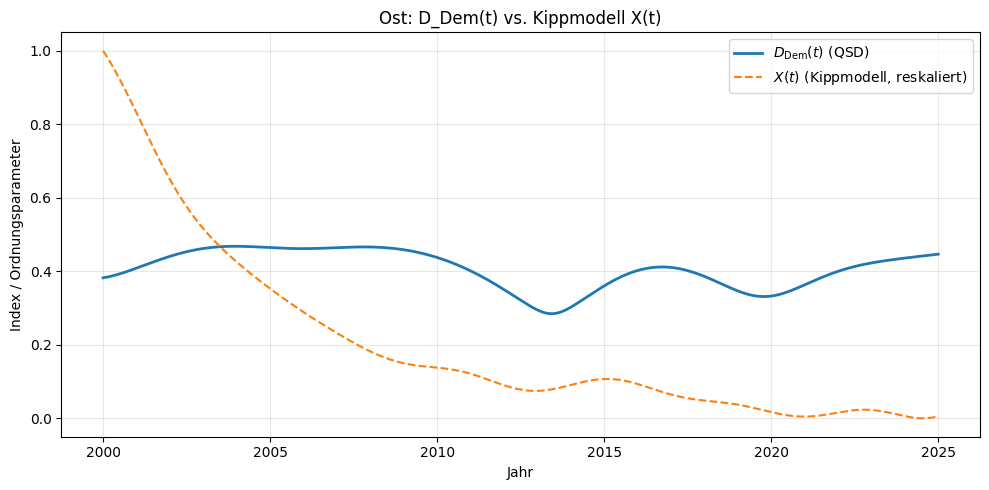

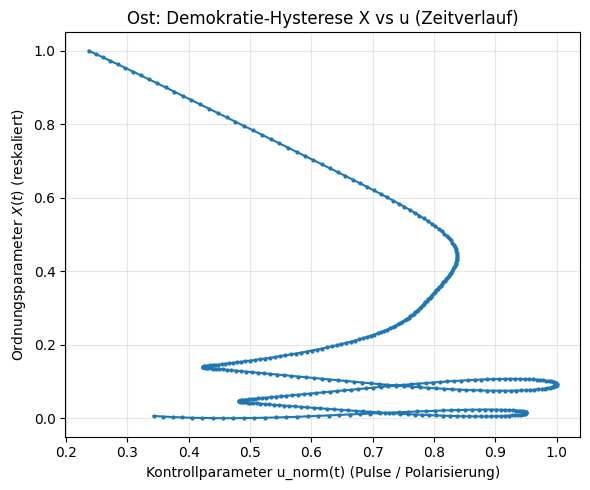

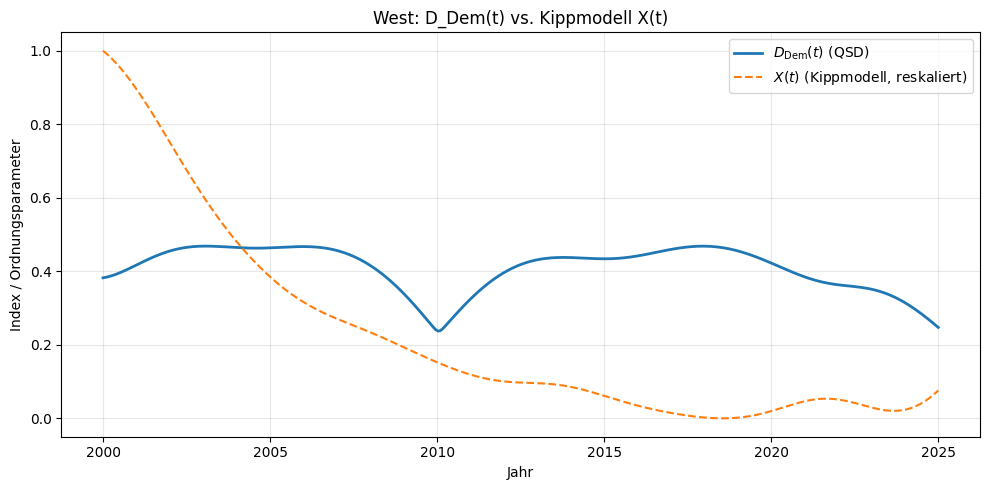

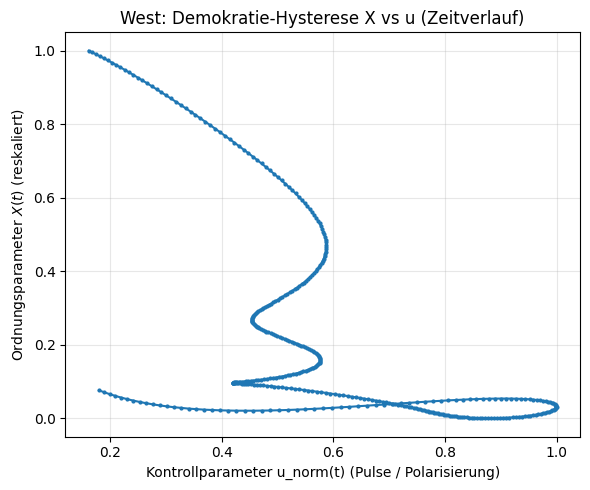

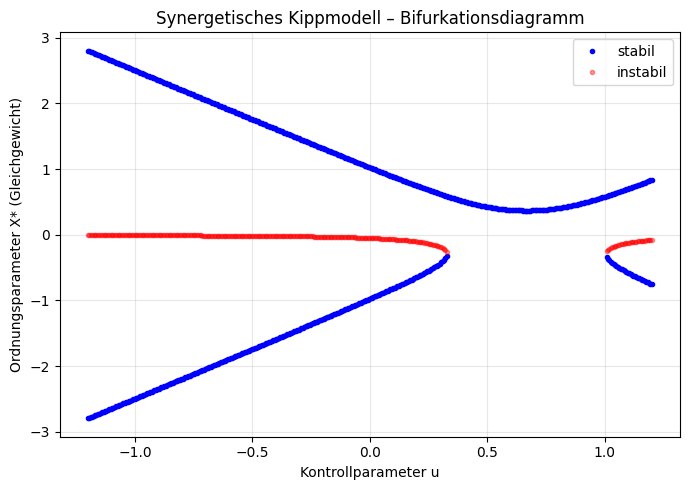

In [104]:
# =============================================================================
# ADD-ON: Pulse → Synergetisches Kippmodell → Demokratie-Hysterese
# =============================================================================
# Voraussetzungen:
# - numpy as np
# - matplotlib.pyplot as plt
# - from scipy.integrate import solve_ivp
# - ost_west_results mit:
#     ost_west_results[region]["t_eval"]
#     ost_west_results[region]["A_mix"]
#     ost_west_results[region]["A_pulse"]
# - results_qsd mit Struktur wie results_mix:
#     results_qsd[region] = {
#         "t_eval": (T,),
#         "variants": {
#             "alt":  {"C_l1": (T,), "R": (T,), ...},
#             "coup": {"C_l1": (T,), "R": (T,), ...},
#             "mix":  {"C_l1": (T,), "R": (T,), ...},
#             "pulse":{"C_l1": (T,), "R": (T,), ...},   # durch Pulse-Add-on
#         }
#     }
# - variant_name = "pulse" (oder andere Variante)
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# -------------------------------------------------------------------------
# 1) Demokratieindex aus QSD (hier bewusst einfach: D_Dem = C_l1 * R)
#    -> falls du dein f(R) und H(t,s) verwenden willst, ändere die
#       Funktion compute_D_dem an einer Stelle.
# -------------------------------------------------------------------------

def compute_D_dem_from_qsd(C_l1, R):
    """
    Demokratieindex D_Dem(t,s) aus QSD-Größen.
    Aktuell: D_Dem = C_l1 * R   (rein quantenmechanische Variante).
    Wenn du das H(t,s) aus dem vorherigen Add-on verwenden möchtest,
    kannst du hier z.B. schreiben:

        f_R = R / (R + R0)
        H   = 1.0 / (1.0 + np.exp(-(C_l1*R - theta)/delta))
        return C_l1 * f_R * H

    """
    C_l1 = np.asarray(C_l1)
    R    = np.asarray(R)
    return C_l1 * R


# -------------------------------------------------------------------------
# 2) Kontrollparameter aus Pulsen: u(t,s) aus ΔA = A_pulse - A_mix
# -------------------------------------------------------------------------

def extract_pulse_control_signal(ost_west_results,
                                 base_key="A_mix",
                                 pulse_key="A_pulse",
                                 gens=(1, 2, 7)):
    """
    Liefert für Ost/West:
        u_dict[region] = (t_eval, u_raw(t), u_norm(t))

    u_raw(t)  := Summe der Pulse-Komponenten in den gewählten Generatoren.
    u_norm(t) := auf [-1,1] normierte Version von u_raw(t).
    """
    regions = ["Ost", "West"]
    u_dict = {}

    for region in regions:
        data = ost_west_results.get(region, None)
        if data is None:
            print(f"[WARN] Region {region} fehlt in ost_west_results.")
            continue
        if base_key not in data or pulse_key not in data:
            print(f"[WARN] Region {region}: '{base_key}' oder '{pulse_key}' fehlt.")
            continue

        t_eval  = np.asarray(data["t_eval"])
        A_base  = np.asarray(data[base_key])   # (T,8)
        A_pulse = np.asarray(data[pulse_key]) # (T,8)
        dA      = A_pulse - A_base

        # Summe der ausgewählten Generator-Komponenten (mit Vorzeichen)
        u_raw = np.zeros(dA.shape[0])
        for g in gens:
            idx = g - 1
            if 0 <= idx < dA.shape[1]:
                u_raw += dA[:, idx]
            else:
                print(f"[WARN] ungültiger Generatorindex g={g} für Region {region}")

        # Auf [-1,1] normieren
        max_abs = np.max(np.abs(u_raw)) + 1e-12
        u_norm = u_raw / max_abs

        u_dict[region] = dict(
            t_eval=t_eval,
            u_raw=u_raw,
            u_norm=u_norm
        )

    return u_dict


# -------------------------------------------------------------------------
# 3) Synergetisches Kippmodell (1D-Orderparameter X)
#    τ dX/dt = -∂V/∂X,   V = X^4/4 - (a - b u)^2 X^2 / 2 - h X
#    -> Doppelmuldenpotential mit u-abhängigem Bifurkationsparameter
# -------------------------------------------------------------------------

def simulate_tipping_dynamics(t_eval, u_t,
                              tau=5.0,
                              a=1.0, b=1.5, h=0.05,
                              X0=0.8):
    """
    Simuliere X(t) mit Hysterese-fähigem Potential.
    Eingang:
      - t_eval: Zeitachse (T,)
      - u_t:    Kontrollparameter u(t) auf derselben Zeitachse
      - tau:    Relaxationszeit
      - a,b,h:  Potentialparameter
      - X0:     Startwert (z.B. 'hohe Demokratie')
    Rückgabe:
      - X_t:    Array (T,) mit Trajektorie des Ordnungsparameters.
    """
    t_eval = np.asarray(t_eval)
    u_t    = np.asarray(u_t)
    # Interpolation von u(t)
    def u_of_t(t):
        return np.interp(t, t_eval, u_t)

    def rhs(t, X):
        u = u_of_t(t)
        # dV/dX = X^3 - (a - b u)^2 * X - h
        dVdX = X**3 - (a - b*u)**2 * X - h
        dXdt = -(1.0/tau)*dVdX
        return dXdt

    sol = solve_ivp(rhs, (t_eval[0], t_eval[-1]),
                    y0=[X0],
                    t_eval=t_eval,
                    method="DOP853",
                    rtol=1e-8, atol=1e-10)
    return sol.y[0]


# -------------------------------------------------------------------------
# 4) Bifurkations-/Hysterese-Kurve des Potentials (quasi-statisch)
# -------------------------------------------------------------------------

def compute_equilibria(u_vals, a=1.0, b=1.5, h=0.05):
    """
    Für eine Liste von u-Werten: löst die stationäre Bedingung
        dV/dX = X^3 - (a - b u)^2 X - h = 0
    und klassifiziert die reellen Lösungen nach Stabilität.
    Rückgabe:
        stable_u, stable_X, unstable_u, unstable_X
    """
    stable_u, stable_X = [], []
    unstable_u, unstable_X = [], []

    for u in u_vals:
        # Koeffizienten der kubischen Gleichung X^3 - (a - b u)^2 X - h = 0
        A = 1.0
        B = 0.0
        C = -(a - b*u)**2
        D = -h
        roots = np.roots([A, B, C, D])

        for r in roots:
            if abs(r.imag) < 1e-8:
                x = r.real
                # Stabilität: d/dX rhs = -(1/tau)*(3X^2 - (a - b u)^2)
                # Vorzeichen unabhängig von tau:
                gprime = 3*x**2 - (a - b*u)**2
                if gprime > 0:  # -> rhs-Derivative < 0 -> stabil
                    stable_u.append(u)
                    stable_X.append(x)
                else:
                    unstable_u.append(u)
                    unstable_X.append(x)

    return (np.array(stable_u), np.array(stable_X),
            np.array(unstable_u), np.array(unstable_X))


# -------------------------------------------------------------------------
# 5) Hauptfunktion: alles zusammenführen und plotten
# -------------------------------------------------------------------------

def run_pulse_tipping_hysteresis(ost_west_results,
                                 results_qsd,
                                 base_key="A_mix",
                                 pulse_key="A_pulse",
                                 gens=(1, 2, 7),
                                 variant_name="pulse",
                                 tau=5.0, a=1.0, b=1.5, h=0.05,
                                 X0_dict=None,
                                 plot_bifurcation=True):
    """
    1. Extrahiert u(t,s) aus Pulsfeldern A_pulse - A_mix.
    2. Berechnet D_Dem(t,s) aus QSD (aus results_qsd[region]["variants"][variant_name]).
    3. Simuliert synergetische Kippdynamik X(t,s).
    4. Plottet:
        - Zeitreihenvergleich D_Dem(t,s) vs. X(t,s) (reskaliert)
        - Demokratie-Hysterese X vs u(t,s)
        - optional: statisches Bifurkationsdiagramm von X* vs u
    """

    # 1) Kontrollparameter aus Pulsen
    u_dict = extract_pulse_control_signal(
        ost_west_results,
        base_key=base_key,
        pulse_key=pulse_key,
        gens=gens
    )

    regions = ["Ost", "West"]
    tipping_results = {}

    # 2) Schleife über Regionen: Demokratieindex + Kippdynamik
    for region in regions:
        if region not in results_qsd or region not in u_dict:
            print(f"[WARN] Region {region} fehlt in results_qsd oder u_dict.")
            continue

        reg_qsd = results_qsd[region]
        t_eval_q = np.asarray(reg_qsd["t_eval"])
        t_u      = u_dict[region]["t_eval"]

        if not np.allclose(t_eval_q, t_u):
            print(f"[WARN] Zeitachsen in results_qsd und ost_west_results "
                  f"stimmen für {region} nicht exakt überein – ich interpoliere u(t).")

        # QSD-Größen
        var_dict = reg_qsd["variants"][variant_name]
        C_l1 = np.asarray(var_dict["C_l1"])
        R    = np.asarray(var_dict["R"])

        # Demokratieindex aus QSD (hier: C_l1 * R)
        D_dem = compute_D_dem_from_qsd(C_l1, R)

        # Kontrollparameter (normiert) auf t_eval_q interpolieren
        u_norm = np.interp(t_eval_q,
                           u_dict[region]["t_eval"],
                           u_dict[region]["u_norm"])

        # Startwert X0: wenn nicht explizit gesetzt, nehme reskalierten ersten D_dem
        if X0_dict is not None and region in X0_dict:
            X0 = X0_dict[region]
        else:
            X0 = 0.9  # „hohe Demokratie“ als Start

        # 3) Kippdynamik simulieren
        X_t = simulate_tipping_dynamics(
            t_eval_q, u_norm,
            tau=tau, a=a, b=b, h=h,
            X0=X0
        )

        # X_t grob auf [0,1] reskalieren, damit es neben D_dem gut sichtbar ist
        X_min, X_max = np.min(X_t), np.max(X_t)
        if X_max - X_min < 1e-8:
            X_scaled = np.zeros_like(X_t) + 0.5
        else:
            X_scaled = (X_t - X_min) / (X_max - X_min)

        tipping_results[region] = dict(
            t_eval=t_eval_q,
            D_dem=D_dem,
            u_norm=u_norm,
            X_t=X_t,
            X_scaled=X_scaled
        )

        # 4a) Zeitreihenplot: D_Dem vs. X_scaled
        plt.figure(figsize=(10, 5))
        plt.plot(t_eval_q, D_dem, label=r"$D_{\mathrm{Dem}}(t)$ (QSD)", linewidth=2)
        plt.plot(t_eval_q, X_scaled, label=r"$X(t)$ (Kippmodell, reskaliert)",
                 linestyle="--")
        plt.xlabel("Jahr")
        plt.ylabel("Index / Ordnungsparameter")
        plt.title(f"{region}: D_Dem(t) vs. Kippmodell X(t)")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # 4b) Demokratie-Hysterese: X vs u
        plt.figure(figsize=(6, 5))
        plt.plot(u_norm, X_scaled, "-o", markersize=2)
        plt.xlabel("Kontrollparameter u_norm(t) (Pulse / Polarisierung)")
        plt.ylabel(r"Ordnungsparameter $X(t)$ (reskaliert)")
        plt.title(f"{region}: Demokratie-Hysterese X vs u (Zeitverlauf)")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    # 4c) Statisches Bifurkationsdiagramm (optional, global für beide Regionen)
    if plot_bifurcation:
        u_vals = np.linspace(-1.2, 1.2, 400)
        stab_u, stab_X, unstab_u, unstab_X = compute_equilibria(
            u_vals, a=a, b=b, h=h
        )

        plt.figure(figsize=(7, 5))
        if len(stab_u) > 0:
            plt.plot(stab_u, stab_X, "b.", label="stabil")
        if len(unstab_u) > 0:
            plt.plot(unstab_u, unstab_X, "r.", alpha=0.4, label="instabil")
        plt.xlabel("Kontrollparameter u")
        plt.ylabel("Ordnungsparameter X* (Gleichgewicht)")
        plt.title("Synergetisches Kippmodell – Bifurkationsdiagramm")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return tipping_results


# =============================================================================
# Beispielaufruf:
# =============================================================================
tipping_results = run_pulse_tipping_hysteresis(
    ost_west_results,
    results_mix,       # dein QSD-Ergebnis-Dict mit Varianten alt/coup/mix/pulse
    base_key="A_mix",
    pulse_key="A_pulse",
    gens=(1, 2, 7),
    variant_name="pulse",
    tau=5.0,
    a=1.0,
    b=1.5,
    h=0.05,
    X0_dict={"Ost": 0.9, "West": 0.9},
    plot_bifurcation=True
)


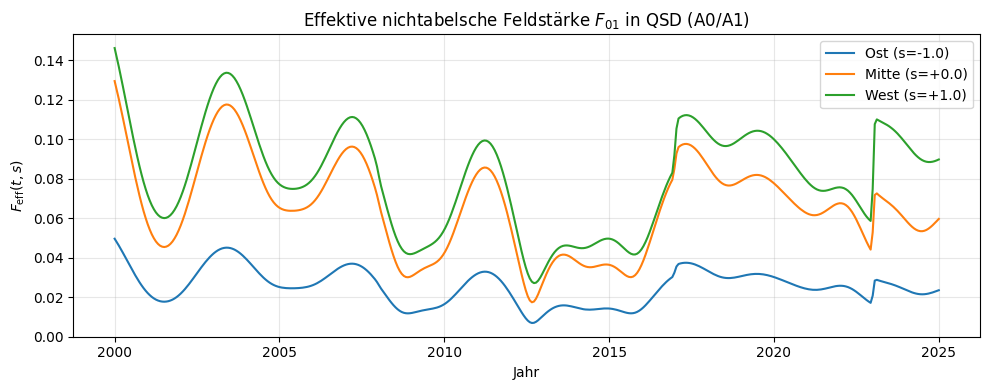

In [105]:
# =============================================================================
# ADD-ON: Sauberer nichtabelscher Feldtensor F_eff(t,s) aus A0_of_t_s & A1_of_t_s
# =============================================================================
# Voraussetzungen:
# - Funktionen aus deinem Hauptprogramm:
#       A0_of_t_s(t: float, s: float) -> (3,3) complex
#       A1_of_t_s(t: float, s: float) -> (3,3) complex
# - Zeitachse t_eval (z.B. die aus evolve_state / mean-field)
#
# Ausgabe:
# - dict F_eff_results mit Einträgen je Region, z.B.:
#   F_eff_results = {
#       "Ost":   {"s": -1.0, "t_eval": t_eval, "F_eff": F_ost},
#       "Mitte": {"s":  0.0, "t_eval": t_eval, "F_eff": F_mitte},
#       "West":  {"s": +1.0, "t_eval": t_eval, "F_eff": F_west},
#   }
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt

def compute_F_eff_for_region(t_eval, s, A0_of_t_s, A1_of_t_s):
    """
    Berechnet F_eff(t,s) = || F_01(t,s) ||_F, wobei
      F_01(t,s) = d/dt A1(t,s) + i [A0(t,s), A1(t,s)].
    t_eval : (T,) Zeitgitter
    s      : Regions-Parameter (-1=Ost, 0=Mitte, +1=West)
    A0_of_t_s, A1_of_t_s : Funktionen aus deinem Hauptprogramm
    Rückgabe:
      F_eff : (T,) Array mit Feldstärke
    """
    t_eval = np.asarray(t_eval)
    T = len(t_eval)

    # A0(t,s) und A1(t,s) auf dem Gitter auswerten
    A0_series = np.zeros((T, 3, 3), dtype=complex)
    A1_series = np.zeros((T, 3, 3), dtype=complex)

    for k, t in enumerate(t_eval):
        A0_series[k] = A0_of_t_s(float(t), float(s))
        A1_series[k] = A1_of_t_s(float(t), float(s))

    # zeitliche Ableitung von A1(t,s)
    # np.gradient kann auch ein 'spacing'-Array dt_k akzeptieren
    dt_array = np.gradient(t_eval)  # (T,) – ungleichmäßige Schritte wären auch ok
    dA1_dt = np.empty_like(A1_series)

    # Numerische Ableitung komponentenweise
    for i in range(3):
        for j in range(3):
            dA1_dt[:, i, j] = np.gradient(A1_series[:, i, j].real, t_eval) \
                              + 1j * np.gradient(A1_series[:, i, j].imag, t_eval)

    # F_01(t) = dA1/dt + i [A0, A1]
    F_eff = np.zeros(T, dtype=float)
    for k in range(T):
        A0 = A0_series[k]
        A1 = A1_series[k]
        comm = 1j * (A0 @ A1 - A1 @ A0)
        F_01 = dA1_dt[k] + comm
        F_eff[k] = np.linalg.norm(F_01, ord='fro')

    return F_eff


def run_F_eff_analysis(
        t_eval,
        A0_of_t_s,
        A1_of_t_s,
        regions=(("Ost", -1.0), ("Mitte", 0.0), ("West", +1.0)),
        plot=True):
    """
    Für jede Region (Name, s) berechne F_eff(t,s) und (optional) plotte die Kurven.
    """
    F_eff_results = {}

    for name, s in regions:
        F_eff = compute_F_eff_for_region(t_eval, s, A0_of_t_s, A1_of_t_s)
        F_eff_results[name] = dict(
            s=float(s),
            t_eval=np.array(t_eval, dtype=float),
            F_eff=F_eff
        )

    if plot:
        plt.figure(figsize=(10, 4))
        for name, s in regions:
            res = F_eff_results[name]
            plt.plot(res["t_eval"], res["F_eff"], label=f"{name} (s={s:+.1f})")
        plt.xlabel("Jahr")
        plt.ylabel(r"$F_{\mathrm{eff}}(t,s)$")
        plt.title("Effektive nichtabelsche Feldstärke $F_{01}$ in QSD (A0/A1)")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return F_eff_results

# =============================================================================
# Beispielaufruf (du kannst t_eval aus einem deiner bisherigen Solves nehmen):
# =============================================================================
t_eval_demo = np.linspace(2000.0, 2025.0, 400)
F_eff_results = run_F_eff_analysis(t_eval_demo, A0_of_t_s, A1_of_t_s, plot=True)


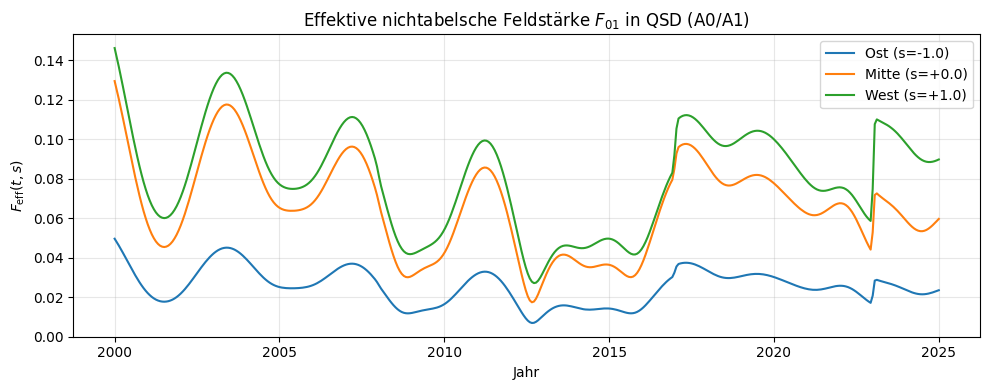

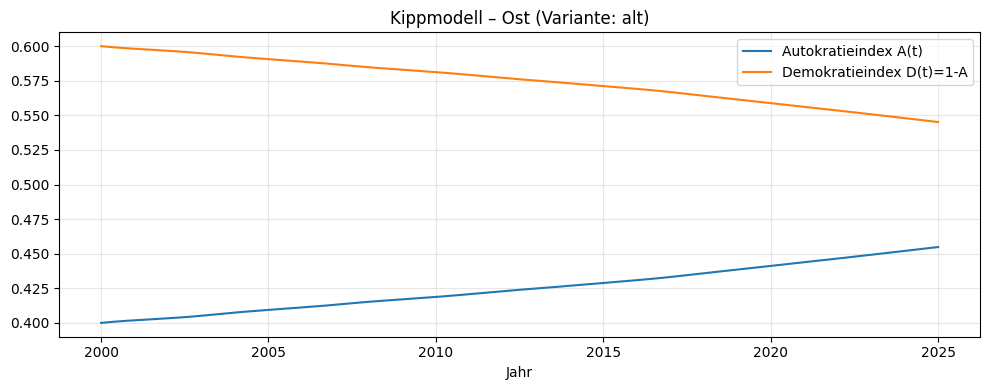

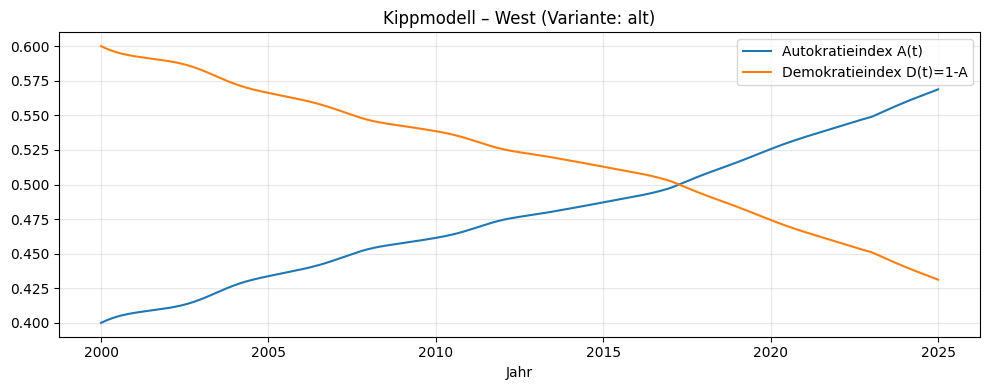

In [106]:
#Tranformation QSD V
# =============================================================================
# ADD-ON: QSD → Feldtensor → Entropie → Autokratie-Kippmodell (Ost/West)
# =============================================================================
# Dieses Add-on liefert:
#   1. F_eff_results          – aus A0_of_t_s, A1_of_t_s
#   2. Feff_data              – interpoliert auf QSD-Zeitachse
#   3. Hplus/Hminus           – aus QSD-Gemischtheit (Entropie)
#   4. ODE-Kippmodell         – dA/dt = α Feff² H- - β Cℓ1 R H+ + γ A(1-A)(A-Ac)
#   5. Integration + Plots
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp


# =============================================================================
# 1) F_eff_results → Feff_data  (Adapter)
# =============================================================================

def build_Feff_data_from_F_eff_results(F_eff_results, results_qsd):
    """
    Wandelt F_eff_results (aus run_F_eff_analysis) in Feff_data um, das exakt
    dieselbe Zeitachse wie results_qsd besitzt.
    """
    Feff_data = {}

    for region in ["Ost", "West"]:
        if region not in results_qsd or region not in F_eff_results:
            continue

        t_qsd  = np.asarray(results_qsd[region]["t_eval"])
        t_feff = np.asarray(F_eff_results[region]["t_eval"])
        F_eff  = np.asarray(F_eff_results[region]["F_eff"])

        if np.allclose(t_qsd, t_feff):
            Feff_data[region] = F_eff
        else:
            f = interp1d(t_feff, F_eff, kind="linear", fill_value="extrapolate")
            Feff_data[region] = f(t_qsd)

    return Feff_data


# =============================================================================
# 2) Entropie → H_plus, H_minus
# =============================================================================

def compute_entropy_Hplus_Hminus(psiA, psiB, psiC):
    """
    Bestimmt H_plus/H_minus aus der Gemischtheit der Werteverteilung.
    Formel:
        p = Mittelwerte(|ψ_i|^2)
        S = -Σ p ln p
        S_norm = S / ln(3)
        H- = S_norm  (Chaos/Autokratie-Treiber)
        H+ = 1 - S_norm  (Struktur/Demokratie-Treiber)
    """
    # Wahrscheinlichkeiten je Zustand
    pA = np.abs(psiA)**2
    pB = np.abs(psiB)**2
    pC = np.abs(psiC)**2

    p_mean = (pA + pB + pC) / 3.0    # (T,3)

    eps = 1e-12
    S = -np.sum(p_mean * np.log(p_mean + eps), axis=1)
    S_norm = S / np.log(3)

    H_minus = S_norm
    H_plus  = 1.0 - S_norm
    return H_plus, H_minus


# =============================================================================
# 3) ODE des Autokratie-Kippmodells
# =============================================================================

def autocracy_ode(t, A, t_eval, Feff, C_l1, R, H_plus, H_minus,
                   alpha, beta, gamma, A_c):
    """
    ODE exakt nach deiner Vorgabe:
        dA/dt = α F_eff^2 H_minus
                - β C_l1 R H_plus
                + γ A(1-A)(A-Ac)
    Alle Zeitreihen werden über Interpolation ausgewertet.
    """

    f_Fe = np.interp(t, t_eval, Feff)
    f_C  = np.interp(t, t_eval, C_l1)
    f_R  = np.interp(t, t_eval, R)
    f_Hp = np.interp(t, t_eval, H_plus)
    f_Hm = np.interp(t, t_eval, H_minus)


    #return (alpha * (f_Fe**2) * f_Hm
    #        - beta * f_C * f_R * f_Hp
    #        + gamma * A * (1 - A) * (A - A_c))
    return (alpha * (f_Fe**2)* f_Hm
            - beta * f_C * f_R* f_Hp
            + gamma * A * (1 - A) * (A - A_c))


# =============================================================================
# 4) Wrapper-Funktion: führt alles für Ost/West aus
# =============================================================================

def run_autocracy_kippmodell(results_qsd,
                             Feff_data,
                             variant_key="pulse",
                             alpha=1.0, beta=1.0, gamma=1.0,
                             A_c=0.5,
                             A0_ost=0.3, A0_west=0.2,
                             plot=True):

    out = {}

    for region in ["Ost", "West"]:
        if region not in results_qsd:
            continue

        data = results_qsd[region]["variants"][variant_key]
        psiA = data["psi_paths"]["Blau"]
        psiB = data["psi_paths"]["Orange"]
        psiC = data["psi_paths"]["Grün"]
        C_l1 = data["C_l1"]
        R    = data["R"]

        # Entropie → H+/H–
        H_plus, H_minus = compute_entropy_Hplus_Hminus(psiA, psiB, psiC)

        # Feff
        Feff = Feff_data[region]
        t_eval = results_qsd[region]["t_eval"]

        # Startwert
        A0 = A0_ost if region == "Ost" else A0_west

        sol = solve_ivp(
            autocracy_ode,
            (t_eval[0], t_eval[-1]),
            [A0],
            t_eval=t_eval,
            args=(t_eval, Feff, C_l1, R, H_plus, H_minus,
                  alpha, beta, gamma, A_c),
            rtol=1e-8, atol=1e-9
        )

        A = sol.y[0]
        D = 1 - A

        out[region] = dict(
            t_eval=t_eval,
            A=A,
            D=D,
            Feff=Feff,
            C_l1=C_l1,
            R=R,
            H_plus=H_plus,
            H_minus=H_minus,
        )

        if plot:
            plt.figure(figsize=(10,4))
            plt.plot(t_eval, A, label="Autokratieindex A(t)")
            plt.plot(t_eval, D, label="Demokratieindex D(t)=1-A")
            plt.title(f"Kippmodell – {region} (Variante: {variant_key})")
            plt.xlabel("Jahr")
            plt.grid(True, alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

    return out

# 1) QSD-Ergebnis (z.B. aus results_mix)
results_qsd = results_mix   # oder eine andere Variante

# 2) F_eff in QSD-Zeitachse berechnen
t_eval_qsd = results_qsd["Ost"]["t_eval"]
F_eff_results = run_F_eff_analysis(t_eval_qsd, A0_of_t_s, A1_of_t_s, plot=True)

# 3) Adapter
Feff_data = build_Feff_data_from_F_eff_results(F_eff_results, results_qsd)

# 4) Kippmodell
results_kipp = run_autocracy_kippmodell(
    results_qsd,
    Feff_data,
    variant_key="alt",  # oder "mix" oder "alt" oder "pulse"
    alpha=0.5,
    beta=0.5,
    gamma=0.1,
    A_c=0.35,
    A0_ost=0.4,
    A0_west=0.4,
    plot=True
)


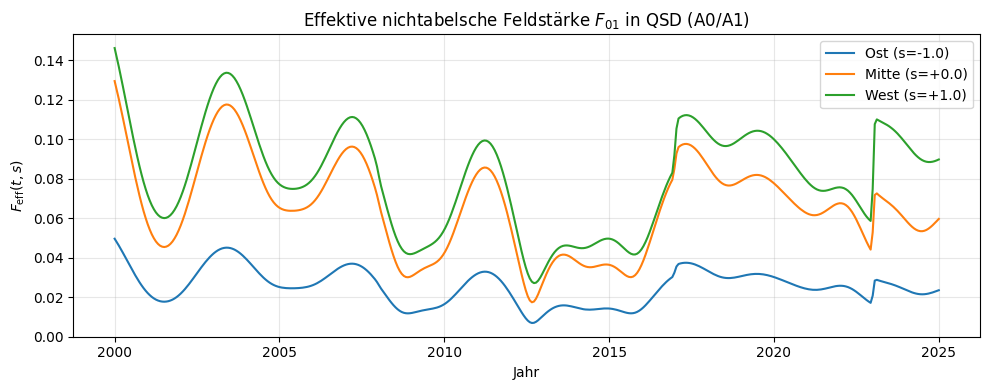

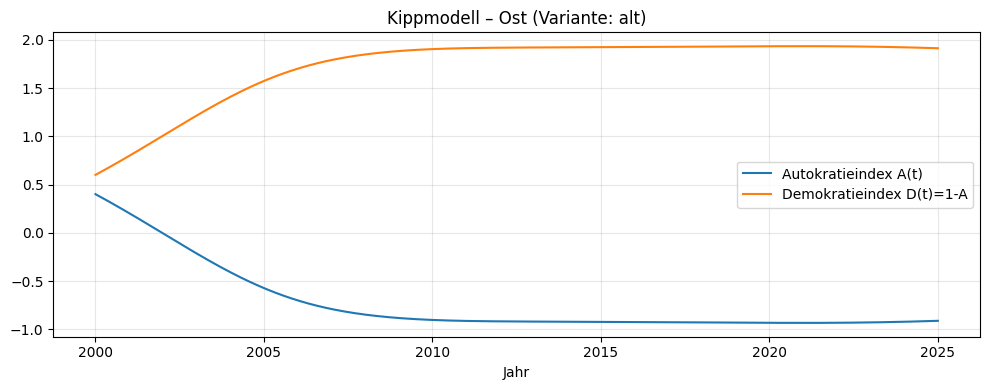

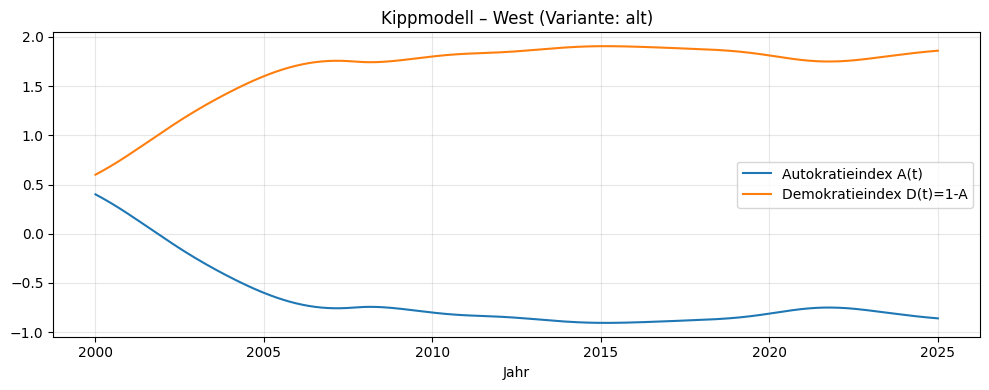

In [107]:
#Tranformation QSD V
# =============================================================================
# ADD-ON: QSD → Feldtensor → Entropie → Autokratie-Kippmodell (Ost/West)
# =============================================================================
# Dieses Add-on liefert:
#   1. F_eff_results          – aus A0_of_t_s, A1_of_t_s
#   2. Feff_data              – interpoliert auf QSD-Zeitachse
#   3. Hplus/Hminus           – aus QSD-Gemischtheit (Entropie)
#   4. ODE-Kippmodell         – dA/dt = α Feff² H- - β Cℓ1 R H+ + γ A(1-A)(A-Ac)
#   5. Integration + Plots
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp


# =============================================================================
# 1) F_eff_results → Feff_data  (Adapter)
# =============================================================================

def build_Feff_data_from_F_eff_results(F_eff_results, results_qsd):
    """
    Wandelt F_eff_results (aus run_F_eff_analysis) in Feff_data um, das exakt
    dieselbe Zeitachse wie results_qsd besitzt.
    """
    Feff_data = {}

    for region in ["Ost", "West"]:
        if region not in results_qsd or region not in F_eff_results:
            continue

        t_qsd  = np.asarray(results_qsd[region]["t_eval"])
        t_feff = np.asarray(F_eff_results[region]["t_eval"])
        F_eff  = np.asarray(F_eff_results[region]["F_eff"])

        if np.allclose(t_qsd, t_feff):
            Feff_data[region] = F_eff
        else:
            f = interp1d(t_feff, F_eff, kind="linear", fill_value="extrapolate")
            Feff_data[region] = f(t_qsd)

    return Feff_data


# =============================================================================
# 2) Entropie → H_plus, H_minus
# =============================================================================

def compute_entropy_Hplus_Hminus(psiA, psiB, psiC):
    """
    Bestimmt H_plus/H_minus aus der Gemischtheit der Werteverteilung.
    Formel:
        p = Mittelwerte(|ψ_i|^2)
        S = -Σ p ln p
        S_norm = S / ln(3)
        H- = S_norm  (Chaos/Autokratie-Treiber)
        H+ = 1 - S_norm  (Struktur/Demokratie-Treiber)
    """
    # Wahrscheinlichkeiten je Zustand
    pA = np.abs(psiA)**2
    pB = np.abs(psiB)**2
    pC = np.abs(psiC)**2

    p_mean = (pA + pB + pC) / 3.0    # (T,3)

    eps = 1e-12
    S = -np.sum(p_mean * np.log(p_mean + eps), axis=1)
    S_norm = S / np.log(3)

    H_minus = S_norm
    H_plus  = 1.0 - S_norm
    return H_plus, H_minus


# =============================================================================
# 3) ODE des Autokratie-Kippmodells
# =============================================================================

def autocracy_ode(t, A, t_eval, Feff, C_l1, R, H_plus, H_minus,
                   alpha, beta, gamma, A_c):
    """
    ODE exakt nach deiner Vorgabe:
        dA/dt = α F_eff^2 H_minus
                - β C_l1 R H_plus
                + γ A(1-A)(A-Ac)
    Alle Zeitreihen werden über Interpolation ausgewertet.
    """

    f_Fe = np.interp(t, t_eval, Feff)
    f_C  = np.interp(t, t_eval, C_l1)
    f_R  = np.interp(t, t_eval, R)
    f_Hp = np.interp(t, t_eval, H_plus)
    f_Hm = np.interp(t, t_eval, H_minus)


    #return (alpha * (f_Fe**2) * f_Hm
    #        - beta * f_C * f_R * f_Hp
    #        + gamma * A * (1 - A) * (A - A_c))
    return (alpha * (f_Fe**2)* f_Hm
            - beta * f_C * f_R
            + gamma * A * (1 - A) * (A - A_c))


# =============================================================================
# 4) Wrapper-Funktion: führt alles für Ost/West aus
# =============================================================================

def run_autocracy_kippmodell(results_qsd,
                             Feff_data,
                             variant_key="pulse",
                             alpha=1.0, beta=1.0, gamma=1.0,
                             A_c=0.5,
                             A0_ost=0.3, A0_west=0.2,
                             plot=True):

    out = {}

    for region in ["Ost", "West"]:
        if region not in results_qsd:
            continue

        data = results_qsd[region]["variants"][variant_key]
        psiA = data["psi_paths"]["Blau"]
        psiB = data["psi_paths"]["Orange"]
        psiC = data["psi_paths"]["Grün"]
        C_l1 = data["C_l1"]
        R    = data["R"]

        # Entropie → H+/H–
        H_plus, H_minus = compute_entropy_Hplus_Hminus(psiA, psiB, psiC)

        # Feff
        Feff = Feff_data[region]
        t_eval = results_qsd[region]["t_eval"]

        # Startwert
        A0 = A0_ost if region == "Ost" else A0_west

        sol = solve_ivp(
            autocracy_ode,
            (t_eval[0], t_eval[-1]),
            [A0],
            t_eval=t_eval,
            args=(t_eval, Feff, C_l1, R, H_plus, H_minus,
                  alpha, beta, gamma, A_c),
            rtol=1e-8, atol=1e-9
        )

        A = sol.y[0]
        D = 1 - A

        out[region] = dict(
            t_eval=t_eval,
            A=A,
            D=D,
            Feff=Feff,
            C_l1=C_l1,
            R=R,
            H_plus=H_plus,
            H_minus=H_minus,
        )

        if plot:
            plt.figure(figsize=(10,4))
            plt.plot(t_eval, A, label="Autokratieindex A(t)")
            plt.plot(t_eval, D, label="Demokratieindex D(t)=1-A")
            plt.title(f"Kippmodell – {region} (Variante: {variant_key})")
            plt.xlabel("Jahr")
            plt.grid(True, alpha=0.3)
            plt.legend()
            plt.tight_layout()
            plt.show()

    return out

# 1) QSD-Ergebnis (z.B. aus results_mix)
results_qsd = results_mix   # oder eine andere Variante

# 2) F_eff in QSD-Zeitachse berechnen
t_eval_qsd = results_qsd["Ost"]["t_eval"]
F_eff_results = run_F_eff_analysis(t_eval_qsd, A0_of_t_s, A1_of_t_s, plot=True)

# 3) Adapter
Feff_data = build_Feff_data_from_F_eff_results(F_eff_results, results_qsd)

# 4) Kippmodell
results_kipp = run_autocracy_kippmodell(
    results_qsd,
    Feff_data,
    variant_key="alt",  # oder "mix" oder "alt" oder "pulse"
    alpha=0.5,
    beta=0.5,
    gamma=0.1,
    A_c=0.35,
    A0_ost=0.4,
    A0_west=0.4,
    plot=True
)


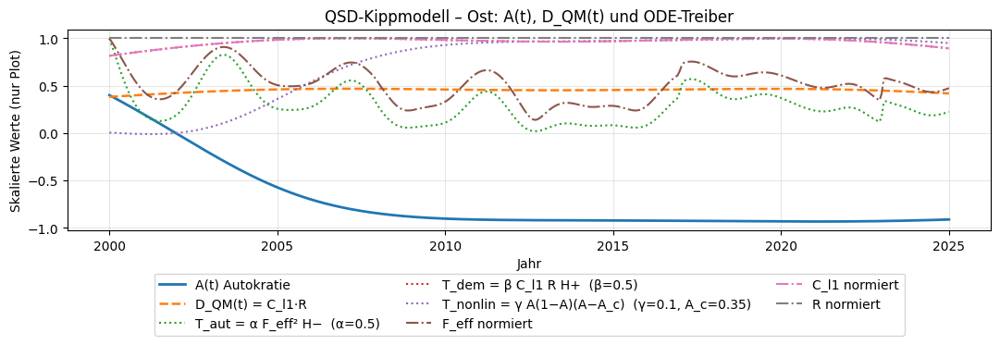

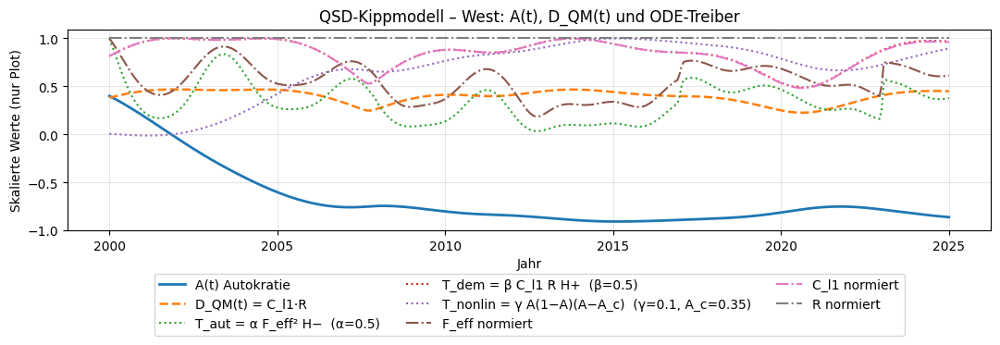

In [108]:
def plot_kipp_details(results_kipp,
                      region,
                      alpha=1.0, beta=1.0, gamma=1.0, A_c=0.5):
    """
    Zeigt für eine Region (Ost/West) in EINEM Plot:
      - A(t) Autokratie
      - D_QM(t) = C_l1(t) * R(t)
      - ODE-Treiber (normiert):
            T_aut(t)   = α F_eff² H-
            T_dem(t)   = β C_l1 R H+
            T_nonlin(t)= γ A(1-A)(A-Ac)
      - normierte Felder F_eff, C_l1, R

    Hinweise:
      - Normierung dient NUR der gemeinsamen Plot-Skalierung.
    """

    if region not in results_kipp:
        print(f"Region {region} nicht in results_kipp.")
        return

    data = results_kipp[region]
    t      = np.asarray(data["t_eval"])
    A      = np.asarray(data["A"])
    H_plus  = np.asarray(data["H_plus"])
    H_minus = np.asarray(data["H_minus"])
    Feff   = np.asarray(data["Feff"])
    C_l1   = np.asarray(data["C_l1"])
    R      = np.asarray(data["R"])

    # KORREKTUR: D_QM = C_l1 * R
    D_QM = C_l1 * R

    # ODE-Treiber
    T_aut    = alpha * (Feff**2) * H_minus
    T_dem    = beta  * C_l1 * R * H_plus
    T_nonlin = gamma * A * (1 - A) * (A - A_c)

    # Normierung (nur Plot-Skalierung)
    def norm(x):
        maxabs = np.max(np.abs(x))
        return x / maxabs if maxabs > 0 else x

    T_aut_n    = norm(T_aut)
    T_dem_n    = norm(T_dem)
    T_nonlin_n = norm(T_nonlin)
    Feff_n     = norm(Feff)
    C_l1_n     = norm(C_l1)
    R_n        = norm(R)

    # ------------------------- Plot -------------------------
    plt.figure(figsize=(11, 4))

    # 1) A(t) und D_QM(t)
    plt.plot(t, A, label="A(t) Autokratie", linewidth=2)
    plt.plot(t, D_QM, "--", label="D_QM(t) = C_l1·R", linewidth=1.8)

    # 2) Normierte Treiber
    plt.plot(t, T_aut_n, ":", label=f"T_aut = α F_eff² H−  (α={alpha})")
    plt.plot(t, T_dem_n, ":", label=f"T_dem = β C_l1 R H+  (β={beta})")
    plt.plot(t, T_nonlin_n, ":",
             label=f"T_nonlin = γ A(1−A)(A−A_c)  (γ={gamma}, A_c={A_c})")

    # 3) Eingangsgrößen
    plt.plot(t, Feff_n, "-.", label="F_eff normiert")
    plt.plot(t, C_l1_n, "-.", label="C_l1 normiert")
    plt.plot(t, R_n, "-.", label="R normiert")

    plt.title(f"QSD-Kippmodell – {region}: A(t), D_QM(t) und ODE-Treiber")
    plt.xlabel("Jahr")
    plt.ylabel("Skalierte Werte (nur Plot)")
    plt.grid(True, alpha=0.3)
    #plt.legend(fontsize=8, ncol=2)
    #plt.legend(loc="lower center",
    #       bbox_to_anchor=(0.5, 1.02),
    #       ncol=3,
    #       frameon=False)
    plt.legend(loc="upper center", bbox_to_anchor=(0.5, -0.18), ncol=3)

    plt.tight_layout()
    plt.show()

plot_kipp_details(results_kipp, "Ost",
                  alpha=0.5, beta=0.5, gamma=0.1, A_c=0.35)

plot_kipp_details(results_kipp, "West",
                  alpha=0.5, beta=0.5, gamma=0.1, A_c=0.35)


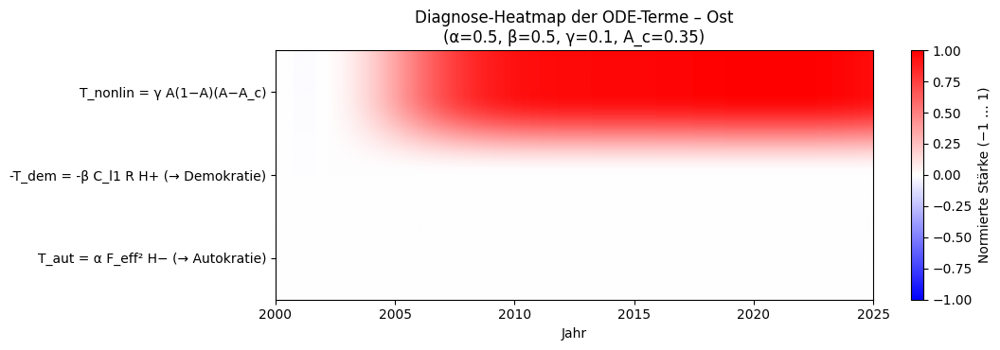

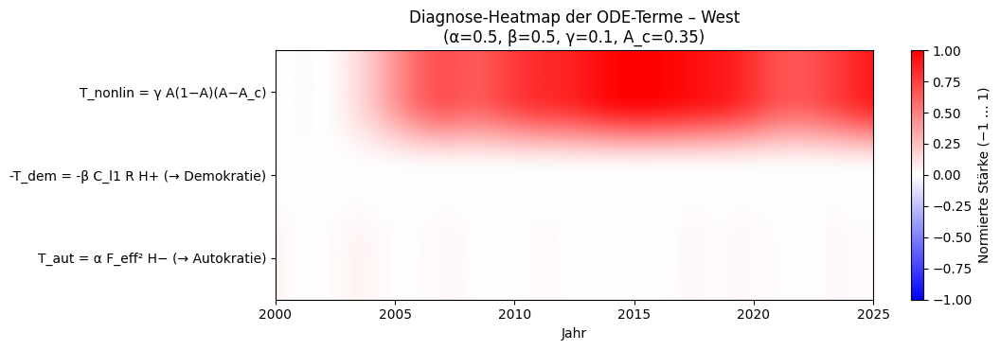

In [109]:
def plot_kipp_term_heatmap(results_kipp,
                           region,
                           alpha=1.0, beta=1.0, gamma=1.0, A_c=0.5):
    """
    Diagnose-Heatmap für eine Region (Ost/West):

      Zeigt über der Zeit t:
        - T_aut(t)   = α F_eff² H-
        - -T_dem(t)  = -β C_l1 R H+   (als positiver Beitrag Richtung Demokratie)
        - T_nonlin(t)= γ A(1-A)(A-A_c)

      Darstellung:
        - x-Achse: Zeit (Jahre)
        - y-Achse: drei Zeilen (Autokratie-Treiber, Demokratie-Treiber, Nichtlinearität)
        - Farbe: normierte Stärke ∈ [-1, 1] mit divergendem Colormap
    """

    if region not in results_kipp:
        print(f"Region {region} nicht in results_kipp.")
        return

    data = results_kipp[region]
    t       = np.asarray(data["t_eval"])
    A       = np.asarray(data["A"])
    H_plus  = np.asarray(data["H_plus"])
    H_minus = np.asarray(data["H_minus"])
    Feff    = np.asarray(data["Feff"])
    C_l1    = np.asarray(data["C_l1"])
    R       = np.asarray(data["R"])

    # ODE-Terme
    T_aut    = alpha * (Feff**2) * H_minus
    T_dem    = beta  * C_l1 * R * H_plus
    T_nonlin = gamma * A * (1 - A) * (A - A_c)

    # Für die Heatmap wollen wir:
    #  - Zeile 0: T_aut        (Richtung Autokratie)
    #  - Zeile 1: -T_dem       (Richtung Demokratie positiv)
    #  - Zeile 2: T_nonlin
    term_matrix = np.vstack([
        T_aut,
        -T_dem,
        T_nonlin
    ])

    # Global normieren auf [-1, 1] fürs Plotten
    max_abs = np.max(np.abs(term_matrix))
    if max_abs > 0:
        term_matrix_norm = term_matrix / max_abs
    else:
        term_matrix_norm = term_matrix

    # Grenzen für imshow: x = Zeit, y = 0..3 (3 Zeilen)
    extent = [t[0], t[-1], -0.5, 2.5]

    plt.figure(figsize=(11, 3.8))
    im = plt.imshow(term_matrix_norm,
                    aspect="auto",
                    origin="lower",
                    extent=extent,
                    cmap="bwr",
                    vmin=-1.0, vmax=1.0)

    plt.yticks([0, 1, 2],
               [r"T_aut = α F_eff² H− (→ Autokratie)",
                r"-T_dem = -β C_l1 R H+ (→ Demokratie)",
                r"T_nonlin = γ A(1−A)(A−A_c)"])
    plt.xlabel("Jahr")
    plt.title(f"Diagnose-Heatmap der ODE-Terme – {region}\n"
              f"(α={alpha}, β={beta}, γ={gamma}, A_c={A_c})")

    cbar = plt.colorbar(im)
    cbar.set_label("Normierte Stärke (−1 … 1)")

    plt.tight_layout()
    plt.show()

plot_kipp_term_heatmap(results_kipp, "Ost",
                       alpha=0.5, beta=0.5, gamma=0.1, A_c=0.35)

plot_kipp_term_heatmap(results_kipp, "West",
                       alpha=0.5, beta=0.5, gamma=0.1, A_c=0.35)


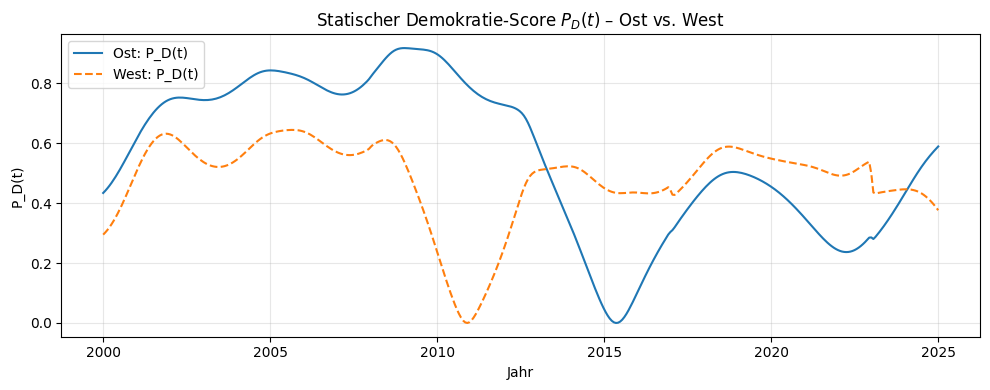

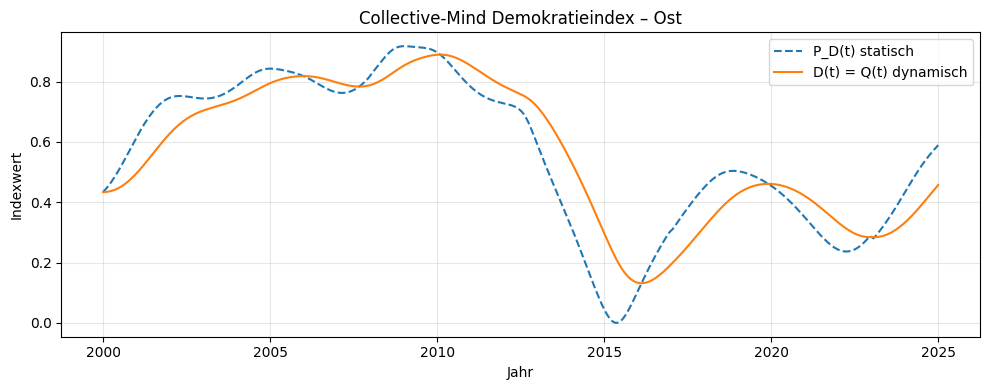

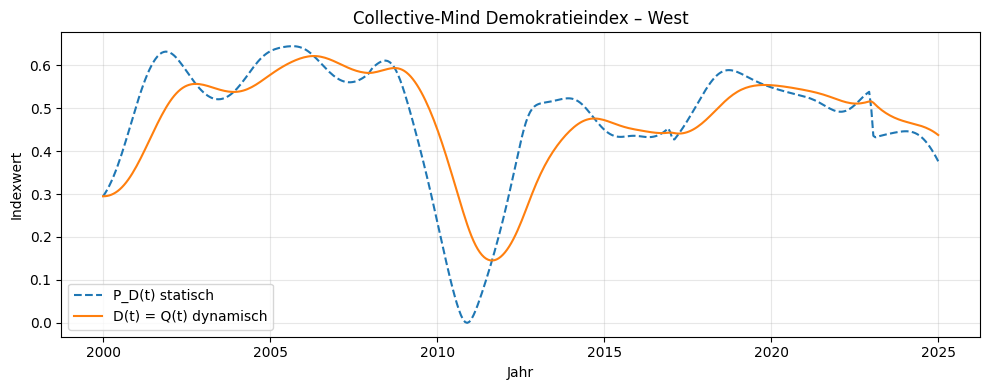

In [110]:
# =============================================================================
# ADD-ON: Collective-Mind Demokratieindex Q(t) auf Basis QSD-Daten
# =============================================================================
# Nutzung vorhandener Größen:
#   - C_l1(t), R(t)           → Kohäsion/Kohärenz-Produkt KH(t)
#   - psiA,B,C(t)             → Vielfalt V(t) via normierter Entropie
#   - F_eff(t)                → Spannung S(t)
#   - keine neuen externen Daten
#
# Definitionen:
#   KH(t)   = C_l1(t) * R(t)
#   V(t)    = S_norm(t)  (normierte Entropie aus |psi|^2)
#   S(t)    = F_eff(t) / max(F_eff)   (normierte Spannung)
#
#   P_D(t)  = KH_norm(t) * V(t) / (1 + S(t))
#   dQ/dt   = κ (P_D(t) - Q(t)),   D(t) = Q(t)
#
#   κ wird hier auf 1.0 gesetzt, um keine weiteren Parameter einzuführen.
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp


def compute_variety_from_psi(psiA, psiB, psiC):
    """
    Vielfalt V(t) aus den QM-Amplituden:
        - Wir verwenden dieselbe Entropie wie in compute_entropy_Hplus_Hminus:
              p_i = |psi_i|^2
              S = -Σ p ln p
              S_norm = S / ln(3)
        - Vielfalt V(t) := S_norm(t) ∈ [0,1]
    Erwartete Form:
        psiA, psiB, psiC: Arrays der Form (T, 3) oder (T, n)
    """
    pA = np.abs(psiA)**2
    pB = np.abs(psiB)**2
    pC = np.abs(psiC)**2

    p_mean = (pA + pB + pC) / 3.0

    eps = 1e-12
    S = -np.sum(p_mean * np.log(p_mean + eps), axis=1)
    S_norm = S / np.log(3.0)
    # Begrenzen auf [0,1]
    S_norm = np.clip(S_norm, 0.0, 1.0)
    return S_norm  # = Vielfalt V(t)


def build_static_democracy_score(results_qsd,
                                 Feff_data,
                                 variant_key="pulse"):
    """
    Baut den statischen Demokratie-Score P_D(t) für Ost & West auf Basis:
        KH(t) = C_l1 * R
        V(t)  = Vielfalt (Entropie)
        S(t)  = normierte Spannung aus F_eff

    Rückgabe:
        static_scores = {
            "Ost": {
                "t_eval": t,
                "P_D": P_D_ost,
                "KH_norm": KH_norm_ost,
                "V": V_ost,
                "S": S_ost,
            },
            "West": { ... }
        }
    """

    regions = ["Ost", "West"]
    tmp = {}

    # ---------- 1. Rohgrößen je Region sammeln ----------
    Feff_all = []

    for region in regions:
        if region not in results_qsd or region not in Feff_data:
            continue

        t = np.asarray(results_qsd[region]["t_eval"])
        data_var = results_qsd[region]["variants"][variant_key]

        C_l1 = np.asarray(data_var["C_l1"])
        R    = np.asarray(data_var["R"])

        # KH: Produkt aus Kohärenz/Kohäsion -> dein bisheriger D_QM-Index
        KH = C_l1 * R

        # Vielfalt V(t) aus psi-Pfaden
        psiA = np.asarray(data_var["psi_paths"]["Blau"])
        psiB = np.asarray(data_var["psi_paths"]["Orange"])
        psiC = np.asarray(data_var["psi_paths"]["Grün"])
        V = compute_variety_from_psi(psiA, psiB, psiC)

        # Spannung S(t) aus F_eff, später global normalisiert
        Feff = np.asarray(Feff_data[region])
        Feff_all.append(Feff)

        tmp[region] = dict(
            t_eval=t,
            C_l1=C_l1,
            R=R,
            KH=KH,
            V=V,
            Feff=Feff
        )

    if not tmp:
        return {}

    # ---------- 2. Globale Normalisierung von KH und Spannung ----------
    # Spannung global normieren
    Feff_all_concat = np.concatenate(Feff_all)
    Feff_max = np.max(Feff_all_concat)
    if Feff_max <= 0:
        Feff_max = 1.0

    # KH optional pro Region normieren (0..1)
    static_scores = {}

    for region, d in tmp.items():
        KH = d["KH"]
        KH_min = np.min(KH)
        KH_max = np.max(KH)
        if KH_max - KH_min > 0:
            KH_norm = (KH - KH_min) / (KH_max - KH_min)
        else:
            KH_norm = np.zeros_like(KH)

        V = d["V"]
        V = np.clip(V, 0.0, 1.0)

        S = d["Feff"] / Feff_max
        S = np.clip(S, 0.0, 1.0)

        # Statischer Demokratie-Score:
        #   P_D(t) = KH_norm * V / (1 + S)
        P_D = KH_norm * V / (1.0 + S)

        static_scores[region] = dict(
            t_eval=d["t_eval"],
            P_D=P_D,
            KH_norm=KH_norm,
            V=V,
            S=S,
        )

    return static_scores


def democracy_Q_ode(t, Q, t_eval, P_D, kappa):
    """
    ODE:
        dQ/dt = κ (P_D(t) - Q(t))
    P_D(t) wird per Interpolation entlang t_eval ausgewertet.
    """
    P = np.interp(t, t_eval, P_D)
    return kappa * (P - Q)


def run_collective_mind_democracy_model(results_qsd,
                                        Feff_data,
                                        variant_key="pulse",
                                        kappa=1.0,
                                        plot=True):
    """
    Gesamt-Wrapper:
      1) Berechnet statischen Demokratie-Score P_D(t) für Ost/West.
      2) Integriert Q(t) mit dQ/dt = κ (P_D - Q), Startwert Q0 = P_D(t0).
      3) Setzt D(t) = Q(t).
      4) Optional: Plots erzeugen.

    Rückgabe:
      results_cm = {
        "static_scores": static_scores,
        "dynamic": {
            "Ost": {"t_eval": t, "P_D": P_D, "Q": Q, "D": Q},
            "West": {...}
        }
      }
    """

    static_scores = build_static_democracy_score(results_qsd, Feff_data,
                                                 variant_key=variant_key)
    dynamic = {}

    for region in ["Ost", "West"]:
        if region not in static_scores:
            continue

        t_eval = static_scores[region]["t_eval"]
        P_D    = static_scores[region]["P_D"]

        # Startwert: Q0 = P_D(t0)
        Q0 = P_D[0]

        sol = solve_ivp(
            democracy_Q_ode,
            (t_eval[0], t_eval[-1]),
            [Q0],
            t_eval=t_eval,
            args=(t_eval, P_D, kappa),
            rtol=1e-8,
            atol=1e-9
        )

        Q = sol.y[0]
        D = Q  # per Definition

        dynamic[region] = dict(
            t_eval=t_eval,
            P_D=P_D,
            Q=Q,
            D=D
        )

    # ----------------------- Plots -----------------------
    if plot and static_scores:
        # 1) Statischer Demokratie-Score Ost vs. West
        plt.figure(figsize=(10, 4))
        for region, sty in zip(["Ost", "West"], ["-", "--"]):
            if region not in static_scores:
                continue
            t = static_scores[region]["t_eval"]
            P_D = static_scores[region]["P_D"]
            plt.plot(t, P_D, sty, label=f"{region}: P_D(t)")
        plt.title("Statischer Demokratie-Score $P_D(t)$ – Ost vs. West")
        plt.xlabel("Jahr")
        plt.ylabel("P_D(t)")
        plt.grid(True, alpha=0.3)
        plt.legend(loc="upper left")
        plt.tight_layout()
        plt.show()

        # 2) Dynamischer Demokratieindex D(t)=Q(t) je Region
        for region in ["Ost", "West"]:
            if region not in dynamic:
                continue
            t = dynamic[region]["t_eval"]
            P_D = dynamic[region]["P_D"]
            Q = dynamic[region]["Q"]

            plt.figure(figsize=(10, 4))
            plt.plot(t, P_D, "--", label="P_D(t) statisch")
            plt.plot(t, Q, "-", label="D(t) = Q(t) dynamisch")
            plt.title(f"Collective-Mind Demokratieindex – {region}")
            plt.xlabel("Jahr")
            plt.ylabel("Indexwert")
            plt.grid(True, alpha=0.3)
            plt.legend(loc="best")
            plt.tight_layout()
            plt.show()

    results_cm = dict(
        static_scores=static_scores,
        dynamic=dynamic
    )
    return results_cm


# =============================================================================
# Beispielaufruf (nachdem results_qsd & Feff_data definiert sind)
# =============================================================================
results_cm = run_collective_mind_democracy_model(
    results_qsd,
    Feff_data,
    variant_key="mix",
    kappa=1.0,
    plot=True
)


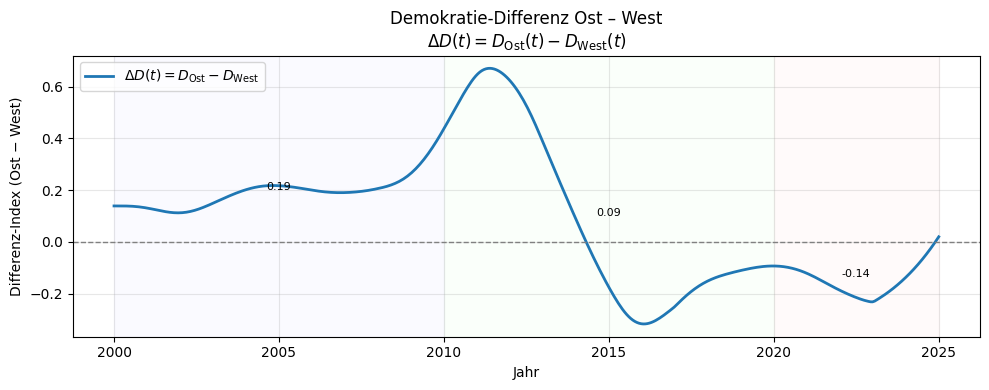

Mittelwerte ΔD(t) = D_Ost - D_West je Zeitfenster:
  2000–2010:  ΔD̄ ≈ 0.194
  2010–2020:  ΔD̄ ≈ 0.093
  2020–2025:  ΔD̄ ≈ -0.143


In [111]:
# =============================================================================
# ADD-ON: Plot der Demokratie-Differenz Ost – West mit Zeitfenstern
# =============================================================================
# Voraussetzung:
#   - results_cm["dynamic"]["Ost"]["t_eval"], ["D"]
#   - results_cm["dynamic"]["West"]["t_eval"], ["D"]
#
# Ausgabe:
#   - Plot von ΔD(t) = D_Ost(t) - D_West(t)
#   - farbig markierte Zeitfenster:
#         [2000,2010], [2010,2020], [2020,2025]
#   - Anzeige der Mittelwerte von ΔD je Zeitfenster
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt


def plot_democracy_difference_windows(results_cm,
                                      windows=None):
    """
    Plot der Demokratie-Differenz ΔD(t) = D_Ost(t) - D_West(t)
    mit markierten Zeitfenstern und Mittelwerten je Fenster.

    windows: Liste von (t_start, t_end), z.B.
             [(2000, 2010), (2010, 2020), (2020, 2025)]
    """

    if windows is None:
        windows = [(2000, 2010), (2010, 2020), (2020, 2025)]

    dyn = results_cm.get("dynamic", {})
    if "Ost" not in dyn or "West" not in dyn:
        print("Für mindestens eine Region (Ost/West) fehlen dynamische Daten.")
        return

    # Zeitachsen & D(t) auslesen
    t_ost = np.asarray(dyn["Ost"]["t_eval"])
    D_ost = np.asarray(dyn["Ost"]["D"])
    t_west = np.asarray(dyn["West"]["t_eval"])
    D_west = np.asarray(dyn["West"]["D"])

    # Falls die Zeitachsen minimal differieren, West auf Ost interpolieren
    if not np.allclose(t_ost, t_west):
        D_west_interp = np.interp(t_ost, t_west, D_west)
        t = t_ost
    else:
        D_west_interp = D_west
        t = t_ost

    # Differenz ΔD(t) = D_Ost - D_West
    diff = D_ost - D_west_interp

    # -------------------- Plot --------------------
    fig, ax = plt.subplots(figsize=(10, 4))

    ax.plot(t, diff, label=r"$\Delta D(t) = D_{\mathrm{Ost}} - D_{\mathrm{West}}$",
            linewidth=2)

    # Nulllinie
    ax.axhline(0.0, color="gray", linestyle="--", linewidth=1)

    # Zeitfenster einfärben und Mittelwerte berechnen
    colors = ["#f0f0ff", "#f0fff0", "#fff0f0"]  # zarte Hintergründe
    mean_values = []

    for i, (t_start, t_end) in enumerate(windows):
        # Bereichsauswahl
        mask = (t >= t_start) & (t <= t_end)
        if not np.any(mask):
            mean_values.append(np.nan)
            continue

        mean_diff = float(np.mean(diff[mask]))
        mean_values.append(mean_diff)

        # Hintergrund einfärben
        ax.axvspan(t_start, t_end,
                   color=colors[i % len(colors)],
                   alpha=0.3)

        # Optional: Mittelwert im Fenster annotieren
        x_mid = 0.5 * (t_start + t_end)
        ax.text(x_mid, mean_diff,
                f"{mean_diff:.2f}",
                ha="center", va="bottom",
                fontsize=8)

    ax.set_title("Demokratie-Differenz Ost – West\n"
                 r"$\Delta D(t) = D_{\mathrm{Ost}}(t) - D_{\mathrm{West}}(t)$")
    ax.set_xlabel("Jahr")
    ax.set_ylabel("Differenz-Index (Ost − West)")
    ax.grid(True, alpha=0.3)
    ax.legend(loc="upper left")
    plt.tight_layout()
    plt.show()

    # Zusätzlich: Mittelwerte je Fenster in der Konsole ausgeben
    print("Mittelwerte ΔD(t) = D_Ost - D_West je Zeitfenster:")
    for (t_start, t_end), m in zip(windows, mean_values):
        print(f"  {t_start:.0f}–{t_end:.0f}:  ΔD̄ ≈ {m:.3f}")


# =============================================================================
# Beispielaufruf (nachdem results_cm erstellt wurde)
# =============================================================================
windows = [(2000, 2010), (2010, 2020), (2020, 2025)]
plot_democracy_difference_windows(results_cm, windows=windows)


2000–2010:  ΔD̄_simple=0.194  ΔD̄_time=0.193  <|ΔD|>=0.194
2010–2020:  ΔD̄_simple=0.093  ΔD̄_time=0.093  <|ΔD|>=0.301
2020–2025:  ΔD̄_simple=-0.143  ΔD̄_time=-0.145  <|ΔD|>=0.144


/tmp/ipython-input-435393240.py:92: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  num = np.trapz(y_win, t_win)


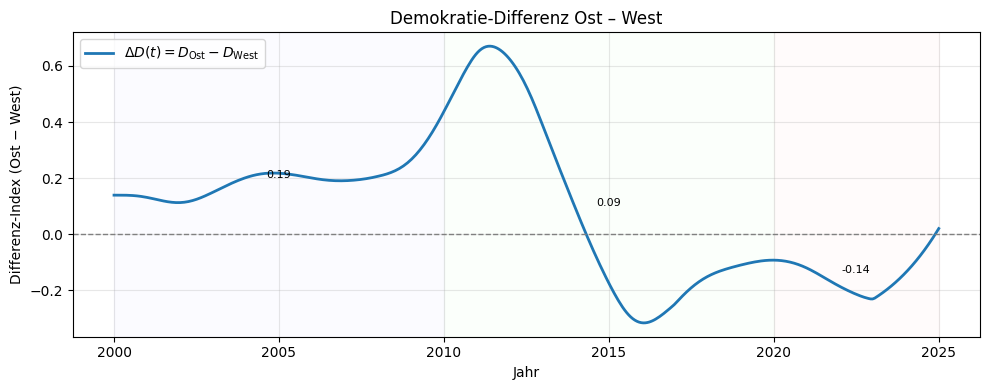

2000–2010:  ΔD̄_simple=0.194  ΔD̄_time=0.193  <|ΔD|>=0.194
2010–2020:  ΔD̄_simple=0.093  ΔD̄_time=0.093  <|ΔD|>=0.301
2020–2025:  ΔD̄_simple=-0.143  ΔD̄_time=-0.145  <|ΔD|>=0.144


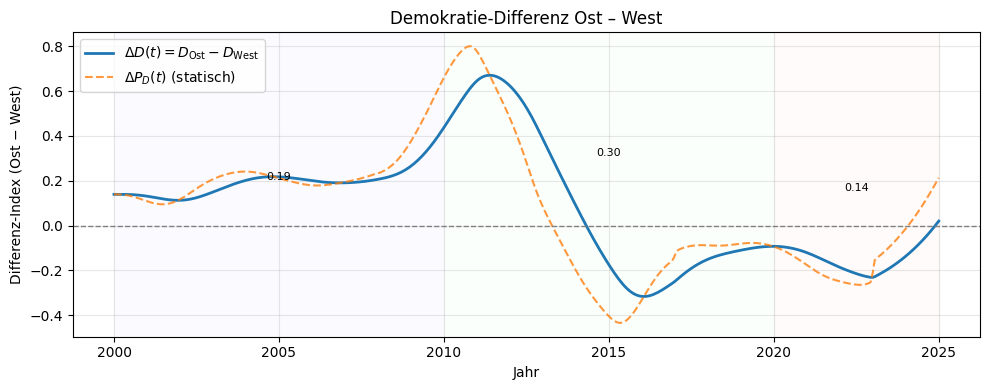

In [112]:
# =============================================================================
# ADD-ON: Demokratie-Differenz Ost – West (erweitert)
# - ΔD(t) = D_Ost(t) - D_West(t)
# - je Zeitfenster: einfaches Mittel, zeitgewichtetes Mittel, Absolut-Mittel
# - optional: statische Differenz ΔP_D(t) plotten
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt

def plot_democracy_difference_windows_plus(
    results_cm,
    windows=None,
    show_simple=True,         # bisheriges arithm. Mittel
    show_time_weighted=True,  # zeitgewichtetes Mittel (Trapezregel)
    show_abs_mean=True,       # Absolut-Mittel (ohne Vorzeichen-Auslöschung)
    annotate="time",          # "time" | "simple" | "abs" | None (welcher Wert ins Bild)
    also_plot_static=False    # zusätzlich ΔP_D(t) anzeigen (falls vorhanden)
):
    """
    Erweitert deinen bisherigen Plot:
      - berechnet pro Fenster:
          * simples Mittel: mean(diff)
          * zeitgewichtetes Mittel: ∫ diff dt / Δt
          * Absolut-Mittel: mean(|diff|)
      - annotiert einen dieser Werte im Plot (annotate)
      - optional: statische Differenz ΔP_D(t) zusätzlich darstellen

    results_cm: Output aus run_collective_mind_democracy_model(...)
    windows   : Liste [(t_start, t_end), ...]
    """

    if windows is None:
        windows = [(2000, 2010), (2010, 2020), (2020, 2025)]

    dyn = results_cm.get("dynamic", {})
    if "Ost" not in dyn or "West" not in dyn:
        print("Fehlen dynamische Daten (Ost/West) in results_cm['dynamic'].")
        return

    # --- dynamische Zeitreihen ---
    t_ost = np.asarray(dyn["Ost"]["t_eval"])
    D_ost = np.asarray(dyn["Ost"]["D"])
    t_west = np.asarray(dyn["West"]["t_eval"])
    D_west = np.asarray(dyn["West"]["D"])

    # auf gemeinsame Zeitachse bringen (Ost als Referenz)
    if not np.allclose(t_ost, t_west):
        D_west = np.interp(t_ost, t_west, D_west)
        t = t_ost
    else:
        t = t_ost

    diff_dyn = D_ost - D_west

    # --- optional: statische Differenz (falls vorhanden) ---
    diff_stat = None
    if also_plot_static and "static_scores" in results_cm:
        staticO = results_cm["static_scores"].get("Ost")
        staticW = results_cm["static_scores"].get("West")
        if staticO and staticW:
            tO, PD_O = np.asarray(staticO["t_eval"]), np.asarray(staticO["P_D"])
            tW, PD_W = np.asarray(staticW["t_eval"]), np.asarray(staticW["P_D"])
            # auf t abbilden
            PD_O = np.interp(t, tO, PD_O)
            PD_W = np.interp(t, tW, PD_W)
            diff_stat = PD_O - PD_W

    # -------------------- Plot --------------------
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(t, diff_dyn, label=r"$\Delta D(t)=D_{\mathrm{Ost}}-D_{\mathrm{West}}$", lw=2)
    if diff_stat is not None:
        ax.plot(t, diff_stat, "--", alpha=0.8,
                label=r"$\Delta P_D(t)$ (statisch)")

    ax.axhline(0.0, color="gray", linestyle="--", linewidth=1)

    colors = ["#f0f0ff", "#f0fff0", "#fff0f0"]
    for i, (t_start, t_end) in enumerate(windows):
        # Fenster-Maske
        mask = (t >= t_start) & (t <= t_end)
        if not np.any(mask):
            continue

        t_win = t[mask]
        y_win = diff_dyn[mask]

        # 1) einfaches Mittel
        mean_simple = float(np.mean(y_win))
        # 2) zeitgewichtetes Mittel (Trapezregel)
        if len(t_win) >= 2:
            num = np.trapz(y_win, t_win)
            den = t_win[-1] - t_win[0]
            mean_time = float(num / den)
        else:
            mean_time = mean_simple
        # 3) Absolut-Mittel
        mean_abs = float(np.mean(np.abs(y_win)))

        # Fenster einfärben
        ax.axvspan(t_start, t_end, color=colors[i % len(colors)], alpha=0.25)

        # welchen Wert annotieren?
        if annotate == "time":
            val = mean_time
        elif annotate == "simple":
            val = mean_simple
        elif annotate == "abs":
            val = mean_abs
        else:
            val = None

        if val is not None:
            x_mid = 0.5 * (t_start + t_end)
            ax.text(x_mid, val, f"{val:.2f}", ha="center", va="bottom", fontsize=8)

        # Konsole: alle Werte ausgeben
        out_parts = []
        if show_simple:      out_parts.append(f"ΔD̄_simple={mean_simple:.3f}")
        if show_time_weighted: out_parts.append(f"ΔD̄_time={mean_time:.3f}")
        if show_abs_mean:    out_parts.append(f"<|ΔD|>={mean_abs:.3f}")
        print(f"{t_start:.0f}–{t_end:.0f}:  " + "  ".join(out_parts))

    ax.set_title("Demokratie-Differenz Ost – West")
    ax.set_xlabel("Jahr")
    ax.set_ylabel("Differenz-Index (Ost − West)")
    ax.grid(True, alpha=0.3)
    ax.legend(loc="upper left")
    plt.tight_layout()
    plt.show()


# =============================================================================
# Beispielaufrufe (direkt ausführbar, nachdem results_cm existiert)
# =============================================================================

# 1) exakt dein bisheriges Verhalten + zeitgewichtete Annotation im Plot
plot_democracy_difference_windows_plus(
    results_cm,
    windows=[(2000, 2010), (2010, 2020), (2020, 2025)],
    annotate="time"
)

# 2) zusätzlich statische Differenz mitplotten und Absolut-Mittel ausgeben
plot_democracy_difference_windows_plus(
    results_cm,
    windows=[(2000, 2010), (2010, 2020), (2020, 2025)],
    also_plot_static=True,
    annotate="abs"
)
